# Projet 3 OpenFoodFacts - Notebook d'analyse des données


Lien vers les consignes du projet sur openclassrooms : https://openclassrooms.com/fr/projects/628/assignment

Lien vers la définition des variables : https://world.openfoodfacts.org/data/data-fields.txt

# Sommaire :

**Partie 1**

 - <a href="#C1">1 - Partie 1</a>
     - <a href="#C11">1.1 - Installation </a>
     - <a href="#C12">1.2 - Imports </a>     
     - <a href="#C13">1.3 - Définition des fonctions</a>
     - <a href="#C13">1.3 - Chargement Dataset</a>     
     - <a href="#C14">1.4 - Fichier EdStatsCountry-Series.csv</a>  
     - <a href="#C15">1.5 - Fichier EdStatsFootNote.csv</a>  
 
**Partie 2 : Nettoyez un jeu de données**

 - <a href="#C2">2 - Nettoyez et triez le jeu de données</a>  
     - <a href="#C21">2.1 - Suppression valeur manquante</a>     
     - <a href="#C22">2.2 - Contrôle des colonnes</a>
     - <a href="#C23">2.3 - Nettoyage types</a>
     - <a href="#C24">2.4 - Format timestamp des colonnes</a>
     - <a href="#C25">2.5 - Traitement des colonnes "Tags"</a>
     - <a href="#C26">2.6 - Suppression des colonnes contenant trop de NaN</a>
         - <a href="#C261">2.6.1 - Conclusion</a>
     - <a href="#C27">2.7 - Traitement des outliers</a>
     - <a href="#C28">2.8 - Imputation des NaN par méthodes des kNN</a> 
         - <a href="#C281">2.8.1 - Fonction avec méthodes des kNN(impute_knn(dataframe))</a>
     - <a href="#C29">2.9 - Traitement sur plusieurs variables numériques du jeu de données</a> 
     - <a href="#C210">2.10 - Distribution des variables avant et après imputation des NaN</a> 
         - <a href="#C2101">2.10.1 - Conclusions</a>      

# <a name="C1">1 - Partie 1 </a> 

## <a name="C11">1.1 - Installation </a> 

In [ ]:
!pip install missingno
!pip install mlxtend
!pip install ppscore
!pip install --upgrade statsmodels
!pip install fuzzywuzzy


- missingno : cette bibliothèque fournit des outils pour visualiser les données manquantes dans un ensemble de données. Elle est utile pour identifier rapidement les valeurs manquantes et les tendances des données. Elle peut être utilisée en conjonction avec d'autres bibliothèques d'analyse de données telles que pandas et matplotlib.

- mlxtend : cette bibliothèque est un ensemble d'outils pour l'analyse de données et l'apprentissage automatique. Elle fournit des algorithmes d'apprentissage automatique, des outils pour l'évaluation et la sélection de modèles, et des méthodes de prétraitement des données telles que le codage en une chaîne binaire.

- ppscore : cette bibliothèque fournit une mesure de la corrélation entre les variables appelée "Predictive Power Score" (PPS), qui peut être utilisée pour identifier les variables les plus importantes dans un ensemble de données pour la prédiction. La PPS est une mesure plus complète que la corrélation de Pearson, car elle peut identifier des relations non linéaires et non monotones entre les variables.

## <a name="C12">1.2 - Imports </a> 

In [2]:
# Importation des bibliothèques nécessaires
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns
import re
import missingno as msno
import matplotlib.dates as mdates
import os
from sklearn.decomposition import PCA
# Importation de la classe KMeans à partir de la bibliothèque scikit-learn
from sklearn.cluster import KMeans
from scipy.stats import trim_mean
from statsmodels.tsa.stattools import kpss
from statsmodels.tsa.stattools import adfuller

import ppscore as pps
import warnings
warnings.filterwarnings('ignore')

from matplotlib.colors import ListedColormap

from scipy.stats import f_oneway, kruskal, rankdata
from sklearn.linear_model import LinearRegression

# POUR RECALCULER LA PCA AVEC MLXTEND
from mlxtend.plotting import plot_pca_correlation_graph
from scipy.stats import pearsonr, spearmanr, kendalltau

# Affichage des graphiques dans le notebook
%matplotlib inline


In [3]:
#Modification des affichages de colonnes, lignes et largeurs de colonnes pour avoir un maximum d'information
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_colwidth', -1)

## <a name="C13">1.3 - Définition des fonctions </a> 

In [4]:
# Définition d'une fonction pour tracer une heatmap
# paramètres :
# corr : matrice de corrélation
# title : titre du graphe
# figsize : taille de la figure
# vmin : valeur minimale de la colormap
# vmax : valeur maximale de la colormap
# center : valeur centrale de la colormap
# palette : palette de couleurs
# shape : forme de la heatmap (rectangle ou triangle)
# fmt : format des nombres affichés
# robust : booléen pour utiliser une méthode de calcul robuste ou non
def plot_heatmap(corr, title, figsize=(8,4), vmin=-1, vmax=1, center=0,
                 palette = sns.color_palette("coolwarm", 20), shape='rect',
                 fmt='.2f', robust=False):
    
    # Création d'une figure et d'un axe
    fig, ax = plt.subplots(figsize=figsize)
    
    # Définition du masque pour la forme de la heatmap
    if shape == 'rect':
        mask=None
    elif shape == 'tri':
        mask = np.zeros_like(corr, dtype=np.bool)
        mask[np.triu_indices_from(mask)] = True
    else:
        print('ERROR : this type of heatmap does not exist')

    # Définition de la palette de couleurs
    palette = palette
    
    # Tracé de la heatmap
    ax = sns.heatmap(corr, mask=mask, cmap=palette, vmin=vmin, vmax=vmax,
                     center=center, annot=True, annot_kws={"size": 10},fmt=fmt,
                     square=False, linewidths=.5, linecolor = 'white',
                     cbar_kws={"shrink": .9, 'label': None}, robust = robust,
                     xticklabels= corr.columns, yticklabels = corr.index)
    
    # Configuration des axes et de la légende
    ax.tick_params(labelsize=8,top=False, bottom=True,
                labeltop=False, labelbottom=True)
    ax.collections[0].colorbar.ax.tick_params(labelsize=8)
    plt.setp(ax.get_xticklabels(), rotation=25, ha="right",rotation_mode="anchor")
    ax.set_title(title, fontweight='bold', fontsize=14)
    
    # Retourne le masque (inutilisé dans ce code)
    # return mask


In [5]:
from scipy.stats import trim_mean
from statsmodels.tsa.stattools import adfuller, kpss
import numpy as np

def stationary_tests(data, print_opt=True, trim_prop=0.9):
    # Suppression des valeurs manquantes et NaN
    data_m = data.dropna().values.astype(float)
#     data_m = data_m[~np.isnan(data_m)]
    data_m = data_m[~np.isnan(data_m)].astype(float)

    # Troncature des valeurs extrêmes
    trim_value = int(len(data_m) * trim_prop)
    data_m = trim_mean(data_m, trim_value)
    
    # apply KPSS test on residuals
    stat, p, lags, crit = kpss(data_m, nlags='auto')
    result = adfuller(data_m)

    if print_opt:
        # H0: series is not trend-stationary.
        print('--- Kwiatkowski---') 
        print('stat=%.3f, p=%.3f' % (stat, p))
        # not rejected -> series is not trend-stationary.
        print('prob. not trend-stationary') if p > 0.05\
             else print('prob. trend-stationary') # rejected -> trend-stationary
        
        # H0: there is a unit root i.e. series is non-stationary
        print('--- Aug. Dickey-Fuller ---\n stat.: %f' % result[0]) 
        print('p-value: %f' % result[1])
        # not rejected -> series is non-stationary
        print('prob. not stationary\n') if result[1] > 0.05\
                    else print('prob. stationary\n' )# rejected -> stationary
    # True : stationary/trend-stationary
    return {'Kwiatkowski': (round(p,4), str(p <= 0.05)),
            'Aug. Dickey-Fuller': (round(result[1],4), str(result[1] <= 0.05))}


# # Function applying stationary tests to data and returning if stat. or not

# def stationary_tests(data, print_opt=True):

#     data_m = np.array(data[~np.isnan(data)])
#     stat, p, lags, crit = kpss(data_m, nlags='auto')
#     result = adfuller(data_m)

#     if print_opt:

#         # : H0 : series is not trend-stationary.
#         print('--- Kwiatkowski---') 
#         print('stat=%.3f, p=%.3f' % (stat, p))
#         # not rejected -> series is not trend-stationary.
#         print('prob. not trend-stationary') if p > 0.05\
#              else print('prob. trend-stationary') # rejected -> trend-stationary
        
#         # H0 there is a unit root i.e. series is non-stationary
#         print('--- Aug. Dickey-Fuller ---\n stat.: %f' % result[0]) 
#         print('p-value: %f' % result[1])
#         # not rejected -> series is non-stationary
#         print('prob. not stationary\n') if result[1] > 0.05\
#                     else print('prob. stationary\n' )# rejected -> stationary
#     # True : stationnary/trend-stationnary
#     return {'Kwiatkowski': (round(p,4), str(p <= 0.05)),
#             'Aug. Dickey-Fuller': (round(result[1],4), str(result[1] <= 0.05))}



# def stationary_tests(data, print_opt=True, trim_prop=0.3):
# #     # On enlève les valeurs manquantes et on met les données dans un array numpy
# #     data_m = data.fillna(df.mean())

#     # Suppression des valeurs manquantes et NaN
    
#     data_m = data.dropna().values.astype(float)
#     data_m = data_m[~np.isnan(data_m)]

# #     data_m = data_m.dropna().values
# #     data_m = np.array(data_m[~np.isnan(data_m)])
#     data_m = data_m[~np.isnan(data_m)]
  
#     # Troncature des valeurs extrêmes
#     trim_value = int(len(data_m) * trim_prop)
#     data_m = trim_mean(data_m, trim_value)
    
#     # apply KPSS test on residuals
# #     resids = data_m - np.mean(data_m)
#     data_m = data_m[~np.isnan(data_m)]
    
#     stat, p, lags, crit = kpss(data_m, nlags='auto')
#     result = adfuller(data_m)

#     if print_opt:
#         # H0: series is not trend-stationary.
#         print('--- Kwiatkowski---') 
#         print('stat=%.3f, p=%.3f' % (stat, p))
#         # not rejected -> series is not trend-stationary.
#         print('prob. not trend-stationary') if p > 0.05\
#              else print('prob. trend-stationary') # rejected -> trend-stationary
        
#         # H0: there is a unit root i.e. series is non-stationary
#         print('--- Aug. Dickey-Fuller ---\n stat.: %f' % result[0]) 
#         print('p-value: %f' % result[1])
#         # not rejected -> series is non-stationary
#         print('prob. not stationary\n') if result[1] > 0.05\
#                     else print('prob. stationary\n' )# rejected -> stationary
#     # True : stationary/trend-stationary
#     return {'Kwiatkowski': (round(p,4), str(p <= 0.05)),
#             'Aug. Dickey-Fuller': (round(result[1],4), str(result[1] <= 0.05))}


In [6]:
# Plotting ANOVA and Kruskall-Wallis H test and return if same dist. or not

def id_cat_distrib_tests(data_df, Q_col, C_col, print_opt=True):

    gb = data_df.groupby(C_col)[Q_col]
    cat = list(gb.groups.keys())
    cat_series = [gr.dropna().values for n, gr in gb]

    if print_opt: print('oooooooo- {} vs. {} -oooooooo'.format(Q_col, C_col))

    # Analysis of Variance Test
    stat1, p1 = f_oneway(*cat_series)
    if print_opt:
        print('---ANOVA---')
        print('stat=%.3f, p=%.10f' % (stat1, p1))
        print('Prob. same distr') if p1 > 0.05 else print('Prob. different distr')
    # Kruskal-Wallis H Test
    stat2, p2 = kruskal(*cat_series)
    if print_opt:
        print('---Kruskal-Wallis---')
        print('stat={:.3f}, p={:.10f}'.format(stat2, p2))
        print('Prob. same distr') if p2 > 0.05 else print('Prob. different distr')
        
    return {'ANOVA': (round(p1,4), str(p1 > 0.05)),
            'Kruskal-Wallis': (round(p2,4), str(p2 > 0.05))}

 # - > at least one of the groups has a significantly different mean from the others.

In [7]:
def mult_test(data_df, test_func, print_opt=True, res_df=pd.DataFrame(), **kwargs):
    res_df_mod = res_df.copy('deep')
    
    data_df = pd.DataFrame(data_df).dropna()
    print(res_df_mod)
    for c in data_df.select_dtypes(include=np.number).columns:
        if print_opt: print('oooo--'+c+'--oooo')
        if test_func == 'stat':
            dic_stat = stationary_tests(data_df[c], print_opt=print_opt)
        elif test_func == 'id_dist':
            dic_stat = id_cat_distrib_tests(data_df, C_col=kwargs['C_col'],
                                            Q_col=c, print_opt=print_opt)
        else:
            print('ERROR: this function does not exist')
        for s in dic_stat.keys():
            res_df_mod.loc[s, c] = str(dic_stat.get(s))

    return res_df_mod


In [8]:
# # Plotting proportion of categories among newly entered products and returning
# # the dataframe of aggregated data for each categories

# def plot_cat_prop_thr_time(col, palette='dark', ncol=3):
#     print(df)
#     df_fx = df.copy()
#     if 'last_modified_t' in df_fx.columns:
#         print("la colonne existe ")
#     print("les colonnes df ")    
#     print(df_fx.columns)    
#     df_fx['last_modified_t'] = pd.to_datetime(df['last_modified_t'])   
#     df_fx.set_index('last_modified_t', inplace=True)
#     df_fx.index = pd.to_datetime(df_fx.index, unit='s')
#     print(df_fx)
# #     if 'last_modified_t' in df_f.columns:
# #     # Vérifier si "last_modified_t" a besoin d'être converti en datetime index
# #         if not pd.api.types.is_datetime64_any_dtype(df_f['last_modified_t']):
# #             df_f['last_modified_t'] = pd.to_datetime(df_f['last_modified_t'], unit='s')

# #         # Vérifier si la colonne "last_modified_t" est l'index du dataframe
# #         if 'last_modified_t' not in df.index.names:
# #             df.set_index('last_modified_t', inplace=True)
# #         else:
    
# #     # Vérifier si "last_modified_t" existe dans le dataframe
# #     if 'last_modified_t' in df_f.columns:
# #         # Vérifier si "last_modified_t" a besoin d'être converti en datetime index
# #         if not pd.api.types.is_datetime64_any_dtype(df_f['last_modified_t']):
# #             df_f['last_modified_t'] = pd.to_datetime(df_f['last_modified_t'], unit='s')

# #         # Vérifier si la colonne "last_modified_t" est l'index du dataframe
# #         if 'last_modified_t' not in df.index.names:
# #             df_f.set_index('last_modified_t', inplace=True)
            
# #     df_100g_thr_time = df.set_index('last_modified_t').sort_index()[col_100g]
# #     df_100g_thr_time.index = pd.to_datetime(df_100g_thr_time.index, unit='s')

# #     # Convert "last_modified_t" to datetime index
# #     df_f['last_modified_t'] = pd.to_datetime(df['last_modified_t'], unit='s')
# #     df_f.set_index('last_modified_t', inplace=True)

#     fig = plt.figure(figsize=(10,5))
#     gb = df_fx.groupby(col)
#     lab = gb.size().index
#     # mean aggregation by month
#     gb_week = df_fx.groupby([pd.Grouper(key='last_modified_t', freq='M'), col])
#     cat_n_item_counts = gb_week.size().unstack()
# #     print(cat_n_item_counts)
#     cat_n_item_prop = cat_n_item_counts\
#          .div(cat_n_item_counts.sum(axis='columns').values/100, axis='rows')
# #     print(cat_n_item_prop  )
#     with sns.color_palette(palette):
#         plt.stackplot(cat_n_item_prop.index, cat_n_item_prop.T.values,
#                       alpha=0.8, labels=cat_n_item_prop.columns)

#     ax = plt.gca()
#     plt.legend(bbox_to_anchor=[0.9,-0.1], ncol=ncol)
#     ax.set_xlabel("Time"), ax.set_ylabel("Category proportions (%)")
#     ax.set_title("Proportion of each category among new items ("+col+")")
#     plt.tight_layout(rect=[0, 0.05, 1, 1.2])
  
#     return cat_n_item_prop

In [9]:
# Tracé de la proportion de chaque catégorie parmi les nouveaux produits entrés et les produits retournés,
# en retournant le dataframe de données agrégées pour chaque catégorie.

def plot_cat_prop_thr_time(df_fx, col, palette='dark', ncol=3):
    # Affichage du dataframe de base
#     print(df)
    
    # Copie du dataframe pour éviter la modification de l'original
#     df_fx = df.copy()
    
    # Vérification si la colonne last_modified_t existe dans le dataframe copié
    if 'last_modified_t' in df_fx.columns:
        print("la colonne existe dans le dataframe")
    else:
        print("la colonne N'existe PAS dans le dataframe") 
      
    # Affichage des colonnes du dataframe copié
    print("les colonnes df ")    
    print(df_fx.columns)    
    
    # Conversion de la colonne last_modified_t en datetime
    df_fx['last_modified_t'] = pd.to_datetime(df['last_modified_t'] , unit='s')
    print(df_fx['last_modified_t'])
    # Mise en index du dataframe copié sur la colonne last_modified_t
#     df_fx.set_index('last_modified_t', inplace=True)
    
    # Affichage du dataframe copié
#     print(df_fx)
    if 'last_modified_t' in df_fx.index:
        print("la colonne existe dans la serie ") 
    else:
        print("la colonne N'existe PAS dans le serie")       
    print(df_fx.index)
#     print(s.index)
    
    # Création de la figure de plot
    fig = plt.figure(figsize=(10,5))
    
    # Groupe par la colonne 'col' du dataframe copié
    gb = df_fx.groupby(col)
    
    # Création des étiquettes pour chaque groupe
    lab = gb.size().index
    
    # Agrégation de la moyenne par mois
    gb_week = df_fx.groupby([pd.Grouper(key='last_modified_t', freq='M'), col])
    
    # Comptage du nombre d'éléments par catégorie
    cat_n_item_counts = gb_week.size().unstack()
#     print(cat_n_item_counts)
    
    # Calcul de la proportion de chaque catégorie
    cat_n_item_prop = cat_n_item_counts\
         .div(cat_n_item_counts.sum(axis='columns').values/100, axis='rows')
#     print(cat_n_item_prop  )
    
    # Tracé de la proportion de chaque catégorie au fil du temps
    with sns.color_palette(palette):
        plt.stackplot(cat_n_item_prop.index, cat_n_item_prop.T.values,
                      alpha=0.8, labels=cat_n_item_prop.columns)

    # Paramètres de la légende
    ax = plt.gca()
    plt.legend(bbox_to_anchor=[0.9,-0.1], ncol=ncol)
    
    # Paramètres des axes et titre
    ax.set_xlabel("Time"), ax.set_ylabel("Category proportions (%)")
    ax.set_title("Proportion de chaque catégorie : ("+col+")")
    
    # Réglages de la disposition
    plt.tight_layout(rect=[0, 0.05, 1, 1.2])
  
    # Retourne le dataframe de la proportion de chaque catégorie
    return cat_n_item_prop


In [10]:
def display_factorial_planes(X_proj, n_comp, pca, axis_ranks, labels=None,
                             width=16, alpha=1, n_cols=3, illus_var=None,
                             lab_on=True, size=10):
    # Détermine le nombre de lignes pour afficher les plans factoriels
    n_rows = (n_comp+1)//n_cols
    # Crée une nouvelle figure avec la taille spécifiée
    fig = plt.figure(figsize=(width,n_rows*width/n_cols))
    # Boucle sur chaque plan factoriel
    for i, (d1,d2) in (enumerate(axis_ranks)):
        # Vérifie que l'axe d2 est inférieur au nombre de composantes principales
        if d2 < n_comp:
            # Ajoute un subplot à la figure
            ax = fig.add_subplot(n_rows, n_cols, i+1)
            # Points
            if illus_var is None:
                # Affiche des points simples sans distinction de couleur
                ax.scatter(X_proj[:, d1], X_proj[:, d2], alpha=alpha, s=size)
            else:
                # Si illus_var est spécifié, affiche les points avec des couleurs différentes pour chaque valeur unique de illus_var
                illus_var = np.array(illus_var)
                for value in np.unique(illus_var):
                    sel = np.where(illus_var == value)
                    ax.scatter(X_proj[sel, d1], X_proj[sel, d2], 
                                alpha=alpha, label=value)
                ax.legend()
            labels = labels.astype(str)
    
            # Labels des points
            if labels is not None and lab_on:
                # Ajoute les labels pour chaque point
                for i,(x,y) in enumerate(X_proj[:,[d1,d2]]):
                    ax.text(x, y, labels[i],
                              fontsize='14', ha='center',va='center')   
            # Limites de l'axe
            bound = np.max(np.abs(X_proj[:, [d1,d2]])) * 1.1
            ax.set(xlim=(-bound,bound), ylim=(-bound,bound))
            # Lignes horizontales et verticales
            ax.plot([-100, 100], [0, 0], color='grey', ls='--')
            ax.plot([0, 0], [-100, 100], color='grey', ls='--')
            # Noms des axes avec le pourcentage d'inertie expliqué
            ax.set_xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            ax.set_ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))
            # Titre du subplot
            ax.set_title("Projection des individus (sur F{} et F{})".format(d1+1, d2+1))
    # Ajuste les paramètres de la figure pour éviter les chevauchements
    plt.tight_layout()


In [87]:

import time

def save_figure_opt(n_file, repertoire='Graphique', library='matplotlib'):
    # Create the directory path based on the current time and the specified subdirectory
    fig_dir = os.path.join(os.getcwd(), 'FIG', repertoire, time.strftime("%d_%m_%Y_%H_%M"))
    # Create the directory if it does not exist
    if not os.path.exists(fig_dir):
        os.makedirs(fig_dir)
    # Set the path to save the figure inside the directory
    fig_path = os.path.join(fig_dir, n_file)
    # Save the figure using the specified library
    if library == 'seaborn':
        sns.savefig(fig_path, dpi=400)
    else:
        plt.savefig(fig_path, dpi=400)
    # Show the figure
    plt.show()

# import time

# # def save_figure_opt(n_file, repertoire='Graphique', library='matplotlib'):
# #     # Create the directory path based on the current time and the specified subdirectory
# #     fig_dir = os.path.join(os.getcwd(), 'FIG', repertoire, time.strftime("%d_%m_%Y_%H_%M"))
# #     # Create the directory if it does not exist
# #     if not os.path.exists(fig_dir):
# #         os.makedirs(fig_dir)
# #     # Set the path to save the figure inside the directory
# #     fig_path = os.path.join(fig_dir, n_file)
# #     # Save the figure using the specified library
# #     if library == 'seaborn':
# #         sns.savefig(fig_path, dpi=800)
# #     else:
# #         plt.savefig(fig_path, dpi=800)

# #     # Show the figure
# #     plt.show()
# def save_figure_opt(n_file, repertoire='Graphique', library='matplotlib'):
#     # Create the directory path based on the current time and the specified subdirectory
#     fig_dir = os.path.join(os.getcwd(), 'FIG', repertoire, time.strftime("%d_%m_%Y_%H_%M"))
#     # Create the directory if it does not exist
#     if not os.path.exists(fig_dir):
#         os.makedirs(fig_dir)
#     # Set the path to save the figure inside the directory
#     fig_path = os.path.join(fig_dir, n_file)
#     # Save the figure using the specified library
#     if library == 'seaborn':
#         sns.savefig(fig_path, dpi=800, transparent=True)
#     else:
#         plt.savefig(fig_path, dpi=300)
#     # Adjust the layout to avoid overlapping of axis labels and titles
#     fig = plt.gcf()
#     fig.tight_layout()    
#     fig.subplots_adjust(left=0, right=1, wspace=None, hspace=None)

#     # Adjust the margins of the figure to include all texts and legends
#     plt.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9)
#     # Show the figure
#     plt.show()

    

In [76]:
import pandas as pd
import scipy.stats as stats
from sklearn.linear_model import LinearRegression

def compare_analyses(column, quant_cols, df):
    # Créer un DataFrame de résultats vide
    results = []
    df = df.fillna(0).round(2)
#     pnns1_n_item_prop = pnns1_n_item_prop.drop('unknown', axis=1, inplace=True)


    # Parcourir chaque colonne quantitative et comparer avec la colonne de référence
    for col in quant_cols:
        # Calculer la p-value de l'ANOVA
        anova = stats.f_oneway(*[df[column][df[col].notnull()] for col in quant_cols])
        pval_anova = anova.pvalue
        
        # Calculer la corrélation entre la colonne de référence et la colonne quantitative
        corr = df[[column, col]].corr().iloc[0,1]
        
        # Calculer la p-value du t-test pour les moyennes égales
        ttest = stats.ttest_ind(df[column][df[col].notnull()], df[col][df[col].notnull()], equal_var=True)
        pval_ttest = ttest.pvalue
        
        # Calculer la p-value du test Kruskal-Wallis pour les médianes égales
        kruskal = stats.kruskal(*[df[column][df[col].notnull()] for col in quant_cols])
        pval_kruskal = kruskal.pvalue
        
        # Calculer la pente de la régression linéaire et l'ordonnée à l'origine
        lm = LinearRegression()
        lm.fit(df[[col]][df[col].notnull()], df[[column]][df[col].notnull()])
        slope = lm.coef_[0][0]
        intercept = lm.intercept_[0]
        
        # Ajouter les résultats de la comparaison à la liste de résultats
        results.append([col, pval_anova, corr, pval_ttest, pval_kruskal, slope, intercept])
    
    # Créer un DataFrame à partir de la liste de résultats
    columns = ['colonne de référence', 'p-value ANOVA', 'corr', 'p-value t-Test', 'p-value Kruskal-Wallis', 'pente de la régression', 'ordonnée à l\'origine']
    df_results = pd.DataFrame(results, columns=columns)
    
    # Retourner le DataFrame de résultats
    return df_results


In [77]:
def replace_nan(df):
    return df.fillna(0)


In [78]:
# Function calculating regression for each categories through time

def mult_reg_thr_time(df):
#     data = df.dropna(how='any')
#     dates = mdates.date2num(data.index)
#     dates_rel = dates-dates.min()
#     df_reg_prop = pd.DataFrame([])

#     for c in df.columns:
#         X = dates_rel
#         y = data[c].values
#         X, y = [arr.reshape(-1, 1) for arr in [X,y]]
#         reg = LinearRegression()
#         reg.fit(X,y)
#         reg.score(X, y)
#         df_reg_prop.loc['coef', c] = reg.coef_[0,0]
#         df_reg_prop.loc['intercept',c] = reg.intercept_[0]
#         df_reg_prop.loc['mean',c] = y.mean()
#     return df_reg_prop

    # Drop les valeurs nulles
    data = df.dropna(how='any')

    # Convertir les dates en numéro de jours pour pouvoir les utiliser dans la régression
    dates = mdates.date2num(data.index)
    dates_rel = dates-dates.min()

    # Initialiser une nouvelle DataFrame pour stocker les coefficients, intercepts et moyennes pour chaque catégorie
    df_reg_prop = pd.DataFrame([])

    # Calculer la régression pour chaque colonne de la DataFrame
    for c in df.columns:
        X = dates_rel
        y = data[c].values
        X, y = [arr.reshape(-1, 1) for arr in [X,y]]
        reg = LinearRegression()
        reg.fit(X,y)
        reg.score(X, y)

        # Stocker les coefficients, intercepts et moyennes dans la nouvelle DataFrame
        df_reg_prop.loc['coef', c] = reg.coef_[0,0]
        df_reg_prop.loc['intercept',c] = reg.intercept_[0]
        df_reg_prop.loc['mean',c] = y.mean()

    # Renvoyer la nouvelle DataFrame contenant les informations de la régression pour chaque catégorie
    return df_reg_prop


In [79]:
def correlation_tests(data1, data2, print_opt=False):
    res_df = pd.DataFrame([])
    # data1_notna = data1[data1.notna()]
    # Pearson, Spearman, Kendall
    for f_name, func in zip(['Pearson', 'Spearman', 'Kendall'],[pearsonr, spearmanr, kendalltau]):
        stat, p = func(data1, data2)
        res_df.loc[f_name,'stat'] = stat
        res_df.loc[f_name,'p_value'] = p
        if print_opt: print('---'+f_name)
        if print_opt: print('stat=%.3f, p=%.3f' % (stat, p))
        if print_opt: print('Probably independent') if p > 0.05 else print('Probably dependent')
    return res_df

In [80]:
def save_table_opt(df, repertoire, filename, library='matplotlib', **kwargs):
    """
    Enregistre un tableau pandas dans un fichier image.

    Parameters:
    -----------
    df : pandas.DataFrame
        Le tableau à sauvegarder.
    title : str
        Le titre à afficher sur le tableau.
    filename : str
        Le nom du fichier image à sauvegarder.
    library : str, optional
        La librairie à utiliser pour générer l'image ('matplotlib' ou 'plotly').
    **kwargs : dict, optional
        Des options supplémentaires pour la fonction de génération d'image.

    Returns:
    --------
    None
    """

    # Créer le chemin vers le dossier en utilisant le répertoire actuel et la date/heure courante
    fig_dir = os.path.join(os.getcwd(), 'FIG', repertoire, time.strftime("%d_%m_%Y_%H_%M"))
    
    # Créer le dossier s'il n'existe pas
    if not os.path.exists(fig_dir):
        os.makedirs(fig_dir)
    
    # Définir le chemin où sauvegarder l'image dans le dossier créé
    fig_path = os.path.join(fig_dir, filename)
    
    # Vérifier la librairie utilisée pour la génération de l'image
    if library == 'matplotlib':
        import matplotlib.pyplot as plt
                
        # Créer une figure matplotlib avec une taille de 10 pouces sur 4 pouces
        plt.figure(figsize=(12, 4))

        # Ajouter un subplot à la figure avec une seule rangée, une seule colonne et l'index 1 (le seul)
        ax = plt.subplot(111, frame_on=False)

        # Masquer les axes x et y du subplot
        ax.xaxis.set_visible(False)
        ax.yaxis.set_visible(False)


        
        # Utiliser la fonction pd.plotting.table pour dessiner le tableau pandas dans la figure
        pd.plotting.table(ax, df, loc='center')
        
        # Ajouter un titre à la figure
        plt.title(repertoire, fontsize=16)
        plt.subplots_adjust(top=0.8)
        # Sauvegarder la figure
        plt.savefig(fig_path, transparent=True)
        
    elif library == 'plotly':
        import plotly.graph_objects as go
        
        # Créer la figure plotly avec le tableau pandas
        fig = go.Figure(data=[go.Table(header=dict(values=list(df.columns)),
                                        cells=dict(values=[df[col] for col in df.columns]))
                             ])
        # Ajouter un titre et des options supplémentaires à la figure
        fig.update_layout(title=repertoire, **kwargs)
        fig.update_layout(margin=dict(l=0, r=0))
        fig.update_layout(plot_bgcolor='rgba(0,0,0,0)', paper_bgcolor='rgba(0,0,0,0)')

        plt.subplots_adjust(top=0.8)
        # Sauvegarder la figure
        fig.write_image(fig_path, transparent=True)


In [17]:
def affectation_types_object(dataframe):
    '''Corrige les types pour les colonnes dont les résultats sont des booléens'''
    try:
        # Colonnes à convertir en type 'object'
        object_columns = ['code', 'url', 'cities', 'creator', 'product_name', 'generic_name', 'quantity', 'packaging', 'packaging_tags', 'brands', 'brands_tags', 'categories', 'categories_tags', 'categories_en', 'origins', 'origins_tags', 'manufacturing_places', 'manufacturing_places_tags', 'labels', 'labels_tags', 'labels_en', 'emb_codes', 'emb_codes_tags', 'first_packaging_code_geo', 'cities_tags', 'purchase_places', 'stores', 'countries', 'countries_tags', 'countries_en', 'ingredients_text', 'allergens', 'traces', 'traces_tags', 'traces_en', 'serving_size', 'additives', 'additives_tags', 'additives_en', 'nutrition_grade_fr', 'pnns_groups_1', 'pnns_groups_2', 'states', 'states_tags', 'states_en', 'main_category', 'main_category_en', 'image_url', 'image_small_url', 'image_ingredients_url', 'image_ingredients_small_url', 'image_nutrition_url', 'image_nutrition_small_url']

        # Convertit les colonnes en type 'object' si elles existent
        for column in object_columns:
            if column in dataframe.columns:
                dataframe[column] = dataframe[column].astype('object')
            else:
                print(f'La colonne {column} n\'existe pas dans le dataframe')
                
    except:
        print('Erreur de conversion de type, vérifiez les colonnes')
        
    return dataframe


In [18]:
data = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')

In [19]:
data.head(1)

,code,url,creator,created_t,created_datetime,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g


In [20]:
data.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 94485 entries, 0 to 94484
Data columns (total 42 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   code                                     94485 non-null  object 
 1   url                                      94485 non-null  object 
 2   creator                                  94485 non-null  object 
 3   created_t                                94485 non-null  int64  
 4   created_datetime                         94485 non-null  object 
 5   last_modified_t                          94485 non-null  int64  
 6   product_name                             87490 non-null  object 
 7   quantity_original                        67819 non-null  object 
 8   packaging                                55975 non-null  object 
 9   packaging_tags                           55975 non-null  object 
 10  brands                                   82616

In [21]:
# if 'Unnamed: 0' in data.columns:
#     data.drop('Unnamed: 0', axis=1, inplace=True)

In [22]:
data.shape

(94485, 42)

In [23]:
data.isna().sum()

code                                       0    
url                                        0    
creator                                    0    
created_t                                  0    
created_datetime                           0    
last_modified_t                            0    
product_name                               6995 
quantity_original                          26666
packaging                                  38510
packaging_tags                             38510
brands                                     11869
categories_fr                              35655
labels_fr                                  60961
countries_fr                               0    
ingredients_text                           43932
allergens                                  72762
additives_n                                44156
additives                                  43944
additives_tags                             65800
additives_fr                               65800
ingredients_from_pal

## Correction des types

In [24]:
data.dtypes

code                                       object 
url                                        object 
creator                                    object 
created_t                                  int64  
created_datetime                           object 
last_modified_t                            int64  
product_name                               object 
quantity_original                          object 
packaging                                  object 
packaging_tags                             object 
brands                                     object 
categories_fr                              object 
labels_fr                                  object 
countries_fr                               object 
ingredients_text                           object 
allergens                                  object 
additives_n                                float64
additives                                  object 
additives_tags                             object 
additives_fr                   

In [25]:
types = pd.read_csv('../dtypes.csv')
types

,index,dtypes
0,code,object
1,url,object
2,creator,category
3,last_modified_t,object
4,product_name,object
5,quantity_original,category
6,packaging,category
7,packaging_tags,category
8,brands,category
9,categories_fr,category


In [26]:
for column in data.columns:
    if types['index'].str.contains(fr"\b{column}\b").any():
        column_type = types[types['index'].str.contains(fr"\b{column}\b")]['dtypes'].values[0]
        data[column] = data[column].astype(column_type)


In [27]:
data.dtypes

code                                       object  
url                                        object  
creator                                    category
created_t                                  int64   
created_datetime                           object  
last_modified_t                            object  
product_name                               object  
quantity_original                          category
packaging                                  category
packaging_tags                             category
brands                                     category
categories_fr                              category
labels_fr                                  category
countries_fr                               category
ingredients_text                           object  
allergens                                  category
additives_n                                float32 
additives                                  object  
additives_tags                             category
additives_fr

# QUESTION 2 


**Tout au long de l’analyse, produire des visualisations afin de mieux comprendre les données. Effectuer une analyse univariée pour chaque variable intéressante, afin de synthétiser son comportement.**

## Analyse Univariée

### Distribution

In [28]:
# Charger les données
df = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')

In [29]:
df.shape

(94485, 42)

In [30]:
df.head(1)

,code,url,creator,created_t,created_datetime,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g


In [31]:

# Appliquer la condition sur chaque élément numérique de chaque colonne
invalid_values = df.select_dtypes(include=['int8', 'float32' ,'int32','float64']).apply(lambda x: (x < 0) | (x > 100))

# Afficher le maximum et le minimum de chaque colonne
if invalid_values.any().any():
    print("Les valeurs suivantes sont invalides :")
    for col in invalid_values.columns:
        if invalid_values[col].any():
            print(f"{col}: min={df[col].min()}, max={df[col].max()}")
else:
    print("Toutes les valeurs sont valides")

# Définir les colonnes à vérifier
cols_to_check = df.select_dtypes(include=['int8', 'float32' ,'int32','float64']).filter(regex='_100g$')

# Appliquer la condition sur chaque élément de ces colonnes
invalid_values = cols_to_check

print("Max et Min : ")
    
for col in invalid_values.columns:
    if invalid_values[col].any():
        print(f"{col}: min={df[col].min()}, max={df[col].max()}")


Les valeurs suivantes sont invalides :
energy_100g: min=0.0, max=3700.0
quantity: min=0.0, max=2000.0
Max et Min : 
energy_100g: min=0.0, max=3700.0
fat_100g: min=0.0, max=100.0
saturated-fat_100g: min=0.0, max=56.0
carbohydrates_100g: min=0.0, max=96.9
sugars_100g: min=0.0, max=90.1
fiber_100g: min=0.0, max=28.3
proteins_100g: min=0.0, max=36.0
salt_100g: min=0.0, max=20.7
sodium_100g: min=0.0, max=8.149607
nutrition-score-fr_100g: min=0.0, max=28.0


In [33]:
# Sélectionner les colonnes 'product_name' et 'energy_100g'
selection = data.loc[:, ['product_name', 'energy_100g']]

# Boucler sur les lignes et afficher les valeurs
for i, row in selection.iterrows():
    print(row['product_name'], row['energy_100g'])


Farine de blé noir nan
Filet de bœuf nan
nan nan
Twix x2 nan
lentilles vertes  nan
nan nan
Biscuits sablés fourrage au cacao nan
nan nan
Thé de Noël aromatisé orange-cannelle nan
Sirops pour ganache macarons nan
Mini Confettis 1753.0
Praliné Amande Et Noisette 2406.0
Côte du Rhône village nan
Bonbon Vichy nan
M&m's peanut butter nan
Pepsi, Nouveau goût ! 177.0
nan nan
BoFrost Nudelpfanne nan
Tarte Poireaux Et Lardons 1079.0
7Up 177.0
Madeleines nature 1900.0
Terrine de campagne nan
Cakes Raisins 1768.0
nan nan
Cakes aux Fruits 1670.0
Chair à saucisse nan
Financiers aux Amandes 1868.0
Fondants Citron 1896.0
Kiehls - Cream #gel nan
Beignets framboises 1272.0
nan nan
Pepsi nan
nan nan
Pates Langue d'oiseau nan
Huile d'olive Monini nan
30 Panach' Fruits 1724.0
Foie gras de canard du Périgord nan
nan nan
Médaillon au foie gras de canard et aux champignons nan
Terrine de magret de canard au Sauternes nan
nan nan
nan nan
Fluteaux de jambon nan
Foie gras canard Périgord nan
Pâté au foie de can

nan nan
Vitafit Cocktail tropical 179.0
bière Perlembourg nan
Amandes grillées et salées  2674.0
Lait bio demi-écrémé stérilisé UHT nan
cote du rhone nan
jambon superieur nan
Birnen halbe Frucht nan
Lait demi-écrémé (1,5% M.G) 193.0
Cordons bleus de dinde 962.0
Cornichons aigres-doux 85.0
Coulommiers onctueux et crémeux 1120.0
Citron 113.0
Riesling 2013 nan
Cidre brut de Normandie nan
Cidre de Normandie doux nan
sirop de citron nan
Sirop de grenadine 1276.0
Sirop de grenadine 1428.0
nan nan
sirop de cassis 1394.0
Sirop de fraise 1372.0
Sirop de pêche 1360.0
Yaourt sucré aromatisé (12 Pots)  329.0
Mousse au chocolat au lait 670.0
Liégeois. V nan
Profiteroles 1189.0
Crème fraîche épaisse entière 30% 1172.0
Crème fraîche légère épaisse 709.0
Sel fin nan
Purée de pommes de terre relevée à la noix de muscade nan
Sel fin nan
Gendarme fumé 1987.0
Blanc de Dinde, Cuit à l'étouffée (4 tranches) 473.0
Blanc de Poulet, Cuit à l'étouffée (4 tranches) 440.0
Rosette Le Césarin 1514.0
Lardons Fumés (

Jodsalz mit fluorid nan
Schnittlauch nan
Senf nan
Palette de porc cuite  nan
Palette de Porc cuite nan
Cassis cuit au chadron nan
Rasierwasser  After Shave nan
Zahnbürsten Medium Doppelpack nan
Cremedusche Milch&Honig nan
Handseife flüssigOluvenmilch nan
Buttergemüse 393.0
Koch-Hinterschinken nan
Spargel nan
Apfelmus 268.0
Gewürzgurken nan
Bockwürstchen nan
nan nan
nan nan
Mints ou Orange 1959.0
Erdnusse black pepper nan
Erdnüsse nan
Küchenrollen nan
Hühnernudeltopf nan
Gulaschsuppe nan
Weißwein nan
Schlagsahne nan
Frischkäse Knoblauch nan
Ultradünne Binden  mit  Flügeln nan
Farmer Studentenfutter Exotic 2151.0
Walnussketne nan
Apfelstrudel nan
Forest Hill Shiraz Cabernet nan
Landvogt, Schwäbische Eierspätzle 1556.0
Rum Trauben  Edelmarzipan nan
Bratheringsfilet nan
Meule comptoise 1707.0
nan nan
Chicken Wings nan
Wildlachsfilet nan
Knusper Müsli 1933.0
Frikadellen nan
Orangensaft direkt nan
Geschirrspülmittel nan
Mousse pur canard qualité supérieure nan
Geflügel-Wiener nan
Ungeschwefe

Les Toasts pour Saumon (persil - saveur Citron) 1262.0
Maxi Jac' Nature nan
Sans sucres ajoutés Grandes tranches Nature 1083.0
Sans sucres ajoutés Grandes tranches Complet 1048.0
Petite fournee nan
Carrément Mie, Nature (sans croûte) 22 tranches 1117.0
tartine  ptit dej nan
Carrément mie complet 1083.0
Maxi Jac' Complet 1092.0
nan nan
Canapés Rond Fruits De Mer 1163.0
Buns 1209.0
Les bouchées créatives à garnir 1887.0
Jacquet Les bouchées créatives à garnir 1898.0
Maxi Jac' Complet 1065.0
Jacquet Maxi Jac' pain de mie nature 550g 1121.0
Brasserie Burger Nature (x 4) 1144.0
nan nan
Jacquet hamburger complet geant x4 1192.0
Jacquet Pains Hamburger 1211.0
Carrément mie nature 1146.0
Carrément mie complet 1083.0
Tartine p'tit déj nan
Les Toasts Créatifs (Céréale Maltée - Nature - Pavot) 1292.0
Les Toasts Nature 1262.0
Les toasts pour foie gras brioché nan
Pain de mie aux céréales et aux graines 1246.0
Le Pain d'Epices 1322.0
Fines tranches briochées 1726.0
Pain Caractère Graines de Pavot 1

Farine de blé au lin 1470.0
Farine de blé céréales & graines 1457.0
farine de blé 1462.0
Farine de blé suprême 1459.0
Farine de blé bio 1430.0
Farine de Blé 1462.0
Farine de blé - tous usages 1403.0
Farine de blé fluide l'originale 1459.0
Farine de blé fluide garantie anti-grumeaux (format familial) 1439.0
Farine de blé fluide 344.0
Farine de gâteau 1414.0
Ma pâte à Pains Burger 1445.0
Ma pâte à Tortillas de Maïs 1425.0
Farine de Blé Complète (T 150) 1448.0
Pain Bastide 1436.0
Pain Milgrain 1551.0
Francine ma brioche de campagne avec levure incorporée 1552.0
Ma brioche au chocolat avec levure incorporée  nan
Pain Rustique 1638.0
Préparation Pour Pain Multi-céréales Francine, 1594.0
Francine pain multi céréales 1594.0
Francine  mon pain maison 1410.0
St 1.5KG Farine Pour Pain Campagne Francine 1435.0
Brioche maison 1548.0
Brioche Bio 373.0
Ma pâte à crêpes 1501.0
Ma pâte à Choux facile et rapide 2180.0
Ma pâte à gaufres 1442.0
Francines - Les inratables - Ma pâte à Pancakes 1515.0
Mes c

Emmental râpé, extra-fin (29% MG) - 150 g - Entremont 1549.0
Emmental Français Extra Fin 1532.0
L'Emmental Français Extra fin 1532.0
L'emmental français  1532.0
Emmental, râpé extra-fin, 29% Mg 1544.0
L'emmental Français (Doux et fondant) 1544.0
Emmental râpé, extra-fin (29 % MG) 1548.0
Emmental râpé (28 % MG) 1544.0
Comté râpé, fruité & fondant 1700.0
3 Monts Fromage Rappe Entremont 1715.0
Gruyère France 1680.0
Comté 1715.0
emmental râpé  1532.0
Welcome Emmental Lonjas X 1109.0
Fromage fondu pour Croque-Monsieur 961.0
Raclette Gourmande (28% MG) - 480 g - EntreMont 1444.0
Raclette (30% MG) Saveur d'Antan au lait entier - 350 g - EntreMont 1501.0
Raclette Saveur d'Antan 1447.0
Raclette sans croute entreront 4/5 Pers nan
Raclette coupe Triangle (28% MG) - EntreMont 1444.0
Raclette coupe triangle nature EntreMont 1427.0
Raclette sans croûte 1427.0
Raclette & Morbier nan
Plateau raclette lait pasteurisé/cru/thermisé saveurs des 3 monts ENTREMONT TERROIRS ET SELECT... 1515.0
Raclette Saveu

Creme Brulée 1655.0
nan nan
nan nan
Vanibio nan
Brin d'Or nan
Camembert Cravate au lait cru moulé à la louche 1154.0
Petit Pont-L'évêque (22% MG) nan
Camembert, Moulé à la Louche (22 % MG) 1154.0
Livarot AOP (21 % MG) 1159.0
Petit livarot  nan
Camembert  nan
Cuisse de Bergère nan
Rosette de Lyon nan
P'tit chodin nan
nan nan
Jambon Superieur Avec Couenne 4tranches 260 g 649.0
Jambon Cuit Le Foué 477.0
Mousse de Canard 1691.0
Tartine & Cuisson Omega 3 1998.0
Margarine tournedol 2035.0
Tartines & Cuisson au Tournesol 2590.0
Primevère 63% MG (Tartine et Cuisson) 2331.0
Primevère 63% MG (Tartine et Cuisson) nan
Primevère Tartine & Cuisson 2331.0
Primevère Doux 55% MG (Tartine) 2040.0
Primevère Doux 2040.0
Tartine doux 2075.0
Léger 30% MG 1124.0
Matsot Vin Et Orange 1770.0
12 Galettes Carrées à L'orange, Casher, Paquet De 450 Grammes, Marque La Bienfaisante 1841.0
Psh yarden petite galette à l'orange 600g 1879.0
12 pains azymes 1547.0
18 petits pains azymes 1489.0
Légeois café 508.0
Petit No

Crevettes semi-décortiquées cuites 305.0
Croissants nan
Nappage figeant nan
Saucisson sec qualité supérieure 1741.0
Jus 8 fruits multivitaminé 179.0
Bisc.noix De Coco 100G Co DL 2343.0
Florentins chocolat suisse nan
Tortellini jambon cru-ricotta aux oeufs frais 1126.0
Café lyophilisé décaféiné nan
Délischuss chocolat suisse nan
Rillettes de saumon (Au Citron) 674.0
Noix de coco râpée 2794.0
Sauce caramel nan
Coulis Framboise 594.0
Muesli Croustillant Chocolat Noir Casino 1960.0
Muesli croustillant Casino 2066.0
Biscuits Fromages & Graines 2026.0
Purée de pommes de terre 549.0
Purée de carottes 190.0
Purée de légumes verts 255.0
Tiramisu à la framboise fruité et moelleux 885.0
Sauce Bourguignonne nan
Chips Campagnardes 2296.0
Cassoulet à la graisse de canard 493.0
Saint joseph nan
Mini bonbons thé vert à la menthe sans sucres 970.0
Madeleines longues 1800.0
 Casino Madeleines longues 1946.0
Compote allégée Pomme Litchi Framboise 256.0
Faisselle moulée à la louche 6% 341.0
Faisselle moul

Beurre demi-sel 2982.0
Ravioli 4 fromages 1264.0
purée de pomme à la vanille 266.0
Café Ethiopia nan
Bûche glacée Vanille saveur crème brûlée, amandes caramélisées 821.0
Moussaka 578.0
Lasagnes bolognaises surgelées nan
Limonade Light 0 sucres 1.0
Gratin de choux fleurs 398.0
Gratin d'aubergines surgelé 582.0
Gratin dauphinois 584.0
Biscuits petit déjeuner pépites de chocolat  1950.0
Biscuits petit déjeuner Abricots, Amandes & Pépites de Chocolat 1990.0
Coulis de tomates de Provence 214.0
Poêlée 6 légumes  carrefour bio nan
Boulettes goût fromage 2096.0
Jambon supérieur sans couenne ( 4 tranches) 502.0
Breaks goût tout chocolat 1982.0
Mini röstis 731.0
Jambon supérieur fumé au bois de hêtre 4 tranches 650.0
Boisson au riz 238.0
Pommes de terre de consommation bio Française Bio nan
Abricots ambrés 1050.0
Figues Moelleuses 1050.0
Liégeois Saveur Vanille Sur Lit De Caramel 628.0
Orange sans pulpe 175.0
Lasagne chèvre épinards 709.0
Les carrés gourmands - chocolat blanc / noix de coco 2287

Lapin aux 2 moutardes et ses pommes de terre 365.0
Rillettes de Poulet Rôti 1463.0
Pave au poivre nan
Gressins au Sésame à l'huile d'olive 1952.0
nan nan
thon blanc nan
nan nan
Sardines à l'Huile (en Conserve) 1063.0
Sardines à l'huile d'olive vierge extra 1063.0
Sardines à l'huile d'arachide nan
Cook Sardine Tomte+pistu 720.0
Sardines sans arête nan
Sardines à l'huile d'olive nan
Sardines à l'huile d'olive vierge extra et aux zestes de citron nan
Filets De Sardines Au Caviar De Tomates 799.0
Filets de maquereaux à la tomate et aux petits légumes 1025.0
Filets de maquereaux à la moutarde et graines de moutarde nan
Foie de morue fumé au bois de hêtre 1680.0
Tomates pelées concassées au jus 73.9000015258789
100% pur jus Clémentine  nan
Jus d'ananas 231.0
Jus de Pamplemousse Rose 184.0
Sucre en poudre nan
Sucre à confiture 1700.0
nan nan
Cook Sardine Oliv PIM.1 1159.0
L'Exotique Nectar de Mangue 199.0
Riche en Omega 3 (Tartine & Cuisson) 250 g - Bouton d'Or 2033.0
Fiorini Mozzarella 983.0

Repas prenium nutrition  nan
Tomates Entières Pelées au Jus 96.0
Tomates Entières pelées au Jus 96.0
Pousses de haricots Mungo (frais & croquants) 96.0
Vinaigre balsamique de Modène 448.0
Boudin Noir aux pommes (3 Boudins) 946.0
Saucisson sec, pur porc 1741.0
Saucisse sèche, pur porc 1966.0
3 saucisses sèches nan
 Mixés, sans morceaux, fraise-framboise-cerise 381.0
Mixés, sans morceaux, pêche-anaas-poire 381.0
Cacahuètes De Comptoir U, 2561.0
Tortillas Roll's, Tex-Mex, goût Fromage 2100.0
Tortillas Roll's - goût Tomate 2099.0
Gratin penne au jambon à l'emmental gratiné au four 674.0
Crème dessert au chocolat nan
Chablis 2011 nan
Crème dessert vanille nan
CHOCOLAT CRÈME DESSERT  nan
Préparation Pour Gâteau De Riz U, 1 Dose, 1523.0
Mon gâteau de semoule  nan
Brisure Saumon Fumé 745.0
Sucre Vanillé 1705.0
Croix des Alliances 2011 nan
Confiture Figue 706.0
Confiture Abricot allégée en sucres 701.0
Confiture Fraise allégée en sucres 700.0
Marmelade Orange 698.0
Confiture Framboise 678.0
Pur

Flamiche au maroilles nan
Filets d'anchois 1006.0
Biscuits petit déjeuner (chocolat/quinoa)  2007.0
Purée De Tomates Basilic 96.0
Confiture allégée Pêche 699.0
Confiture allégée Framboise 674.0
Confiture extra Rhubarbe 1022.0
Tomato Ketchup 464.0
Tomato Ketchup 469.0
Cola 180.0
Concentré de Citron vert pour boisson et assaisonnement 131.0
Concentré orange pour boisson et assaisonnement  nan
Couscous royal  560.0
Pain de mie grandes tranches nature 1247.0
Special mie nature 1029.0
Cola 180.0
Pur jus Ananas 207.0
Pur jus Orange Mangue 190.0
Creme fluide entiere 1234.0
Crème épaisse et légère (4% MG) nan
Mousse sur ganache chocolat 1553.0
Sainte-Maure de chèvre frais 905.0
Mozzarella di Bufala Campana AOP (25% MG) - 210 g - Cora 1180.0
Mini-bonbons Sans Sucres, Menthe nan
Jambon fumé 485.0
Jambon de Paris doré au four 509.0
Blanc de Poulet à la Provençale 430.0
Jambon sec de Savoie salé au sel sec 1085.0
Quart de Jambon sec 1122.0
Saucisse sèche aux noisettes 1810.0
Saucisson sec 1709.0
G

Cookies maxi pépites chocolat et Amandes caramélisées 2109.0
Royal Biscuit Goût Chocolat 1983.0
Sprits 2159.0
Spéculoos 2064.0
12 biscuits fourrés à la framboise (55%) et nappés au chocolat (17%) 1617.0
Biscuits fourrés orange 1610.0
Petit Lait 1866.0
Petit beurre  1915.0
Galettes au beurre 1919.0
12 Tartelettes à la fraise 1828.0
Crêpes Dentelle ENROBÉES DE CHOCOLAT NOIR 2105.0
P'tit Sacripant Petits Beurre Chocolat Noir 2076.0
Cookies Nougatine 2108.0
Choco Sticks 2176.0
Gaufrettes fourrées enrobées de chocolat fin 2241.0
Galettes Bretonnes - Pur Beurre 2067.0
Palets Bretons - Pur Beurre 2168.0
Palets breton 2162.0
Beurrés Bretons 1941.0
Paquita 2130.0
P'tit Sacripant, Petits Beurre Chocolat au Lait aux Noisettes 2068.0
Mon Carré Choco goût chocolat 1968.0
12 Biscuits chocolat au lait  2026.0
Goûters fourrés chocolat 2130.0
Paquita 2142.0
12 Tartelettes 2067.0
Sablés aux céréales chocolat au lait 2127.0
Biscuit LP Palmiers 2184.0
Fête Foraine 2015.0
Twist 2230.0
Galettes bretonnes pu

2 Demi-baguettes Précuites, Sachet De 280 Grammes 1029.0
Petits Pois Doux Extra-fins Et Jeunes Carottes. Le Sac De 1 Kilo 197.0
Haricots verts extra-fins 146.0
Melon en Billes 219.0
Choux-fleurs En Fleurettes 1 kg 1 Kilo 96.0
Haricots beurre nan
Purée de marron 396.0
Courgettes en rondelles surgelées 77.0
Haricots verts très fins surgelés 145.0
Persil plat coupé surgelé 185.0
Carottes en rondelles surgelées nan
Purée de haricot vert surgelée 145.0
Rhubarbe en morceaux 65.0
Mangues en tranches sans peau 264.0
Maïs doux en épis 334.0
Oignons émincés 172.0
Légumes pour ratatouille nan
Escalope de dinde 439.0
Pommes noisettes  700.0
Crevettes Nordiques Décortiquées Cuites 264.0
Échalote coupée, Surgelée 368.0
Pommes noisettes 699.0
Champignons de Paris émincés 78.0
Haricots Verts extra fins surgelés 113.0
Potage mélange de légumes 65.0
nan nan
Purée de céleri-rave 87.0
Merguez surgelées Picard 1192.0
nan nan
12 Escargots de Bourgogne Moyen - surgelés 70 g 1439.0
Epinards coupés à la crème 

Colorant liquide rouge nan
Perles argentées 1671.0
pépites de chocolat noir nan
Cube d'écorces de citrons confits nan
Cubes d'Écorces d'Oranges Confits 1284.0
Coulis de Fraise 627.0
Agar-agar nan
Poudre à Lever nan
Agar agar gélatine nan
Pépites de chocolat bio 2292.0
Vanille bourbon nan
2 gousses de vanille Bourbon nan
nan 1764.0
Amande en poudre nan
Sucre vanillé à la vanille qbourbon nan
Poudre à lever sans phosphate nan
Amandes complètes en poudre  nan
Noix de Coco râpée nan
Vermicelles chocolat 1910.0
Pignons de pin nan
Noisettes en poudre nan
L'emprésuré Saveur Vanille 400.0
Yaourt au lait entier saveur noix de coco 420.0
Malo yaourt saveur fraise 393.0
Emprésuré Chocolat intense 506.0
Fromage frais  nan
Emprésuré Chocolat saveur Noisette 513.0
Emprésuré Caramel Beurre Sel de Guérande 430.0
Petits Suisses au lait entier 720.0
Fruits Fromage frais 540.0
Fromage Frais Aux Fruits 40% MG, Malo Fruits 8X100G 544.0
Fromage Frais Sucré 40% MG 590.0
Saveur Vanille Fromage Frais 580.0
Mal

Confiture framboise 100% issu des fruits  Lucien Georgelin 485.0
Mûres sauvages Cuit au chaudron 452.0
Myrtilles Sauvages 671.0
Cerises noires griottes 100% cuit au chaudron 628.0
Confiture 5 Agrumes 300 gr 636.0
Pâte à Tartiner Noisette Cacao 2229.0
Pate à tartiner noisette cacao 2229.0
Pâte a tartiner bio 2229.0
Pate à tartiner Noisette Cacao 2234.0
Pate a tartiner 2234.0
RCC Kiwi Citron Vert 770.0
Pâte à tartiner noisette cacao 2234.0
Abricot cuit au chaudron 758.0
Fraise cuite aux pommes et au chaudron 750.0
Coing 743.0
Poire Williams à la vanille 765.0
confiture prunes nan
Figue rouge 750.0
nan nan
Rhubarbe cuite au chaudron nan
4 Agrumes cuit au chaudron 840.0
Cassis cuit au chaudron nan
Myrtille Sauvage cuite au chaudron 879.0
Confiture de melons 913.0
Mûre Sauvage  831.0
Pêche de vigne 784.0
Mirabelle cuite au chaudron nan
Framboise cuite au chaudron 787.0
Cerise Noire 771.0
Mangue 790.0
Goyave cuite au chaudron nan
Banane Cuite aux Pommes et au Chaudron 759.0
Noix de Coco Cuit

Haricots lingots 477.0
Tripes à la mode de Caen 460.0
Palmiers Salés au Beurre et aux Fromages (Gouda, Edam) 2352.0
Truite fumée elevée en aquitaine 648.0
Tiramisu, crème au mascarpone 1075.0
Lumaconi U Les Saveurs, 1477.0
Mozzarella di bufala campana 1172.0
Vinaigre balsamique 587.0
Vinaigre de vin blanc nan
Caviar d'aubergines nan
Délice de Tomates Séchées à l'Huile d'Olive Vierge Extra 12% 1075.0
Saint-Nectaire (27% MG) 1378.0
Saucisse sèche à l'ancienne 1785.0
Maroilles Quart (26 % MG)  1347.0
Fleur de sel de Guérande nan
Fines galettes de Bretagne nan
Cake aux fruits pur beurre 1510.0
Mini torsades feuilletées au beurre oignon ciboulette 2125.0
Mini-Torsades au gruyère 2131.0
Cassoulet au Confit de Canard  750.0
Vinaigre de Xérès (7% d'acidité) nan
nan nan
Vinaigre balsamique de Modène 552.0
Nougat Tendre de Monrélimar 1870.0
Nougat tendre de Montélimar 1876.0
Moutarde douce à l'estragon 404.0
Cassoulet au Confit de Canard 753.0
Mini Flûtes Au Sésame U Les Saveurs, 2088.0
Poivrons

super flakes copeaux de chocolat noir, riz et épautre complet 1619.0
Muesli+sans gluten 1556.0
Muesli + figues pruneaux son 1410.0
fibres de son de blé nan
Messi Sarrasin nan
Croq' Cacahuète  nan
Tartines Ki'Kroc 1540.0
tartines KIKROC sarrasin 1510.0
Tartines Craquantes, Biscottes 1506.0
TARTINES KIKROC CHATAIGNE 1527.0
Tartines Ki'Kroc 1569.0
Ka'ré nan
Ble Complet Souffle Miel 1448.0
Sarrasin soufflé au miel nan
Blé complet soufflé 1466.0
Riz complet soufflé  1547.0
Choco crisp  1573.0
Chocolune 1517.0
Chokinoa 1554.0
Ka'ré fourré chocolinette 1818.0
Ka'ré fourré choco noisettes 1694.0
Ka'ré caramel beurre salé 1546.0
Ka'ré sans gluten 1850.0
Muesli noisettes 1625.0
Muesli noisettes 1556.0
Pops miel Bio Terres et Céréales 1679.0
Pops miel chocolat Bio Terres et Céréales 1375.0
Choco aux 3 céréales 1531.0
Corn Flakes Sucre Canne 1573.0
Flakes de Sarrasin 1431.0
CORN FLAKES SUCRE CANNE 1565.0
Petales Epautrr Complet & Riz 1523.0
Pétales Epeautre complet et riz au chocolat 1639.0
Pétale

Roulade pistaches nan
Salami danois fumé  nan
Bacon fûmé au bois de hêtre 875.0
nan nan
Salami 2236.0
Terrine aux Endives nan
Jambon cuit supérieur découenné dégraissé 525.0
Rosette de Lyon 1491.0
Jambon de Savoie 855.0
Fonds de jambon cuit choix 439.0
Citron Délice  luberon nan
Tapenade aux Olives Noires nan
Thoïonade nan
Caviar d'aubergines nan
Asperges Blanches Pelées 64.0
Brique du Forez (26% MG) nan
Brique du Forez au lait pasteurisé de chèvre (25 % MG) 1275.0
Brique Au Lait De Brebis 200 G, 1 Pièce 1377.0
Kébab poulet mariné 684.0
Jus d'Herbe de Blé  1190.0
Coquillettes 1486.0
Olives vertes dénoyautées 704.0
Sauce pour Pita nan
Dessert de fruits pomme fraise 335.0
Dessert de fruit Pomme Fraise nan
Cookies aux pépites de chocolat et aux noisettes 2152.0
Biscuits cacaotés fourrés 2086.0
Sardine Huile Olive / Citron 1 / 5 1268.0
Pâté de campagne nan
Chips à l'ancienne nan
Prunelle les terrines nan
Extra Fruit - Pur Jus d'orange (100% Pur Jus) 193.0
Jus Orange 200.0
Coco nan
Beurre M

Les créations gourmandes Velouté Saveur Thaï Légumes, lait de coco, crème & épices 170.0
Tartelette au citron de Sicile sur pâte croustillante 1534.0
Gentiane Sauvage nan
Confiture framboises 1042.0
Coulommiers Bio (22 % MG) 1154.0
Pérail (28 % MG) 1385.0
Foie gras de Canard entier du Sud-Ouest au Sauternes 2329.0
Velouté de champignons aux morceaux de cèpes et de bolets 151.0
Dattes Deglet Nour 1246.0
Biscuit 1845.0
Jus d'orange sans pulpe 194.0
Décoration dessert 4 decor nan
nan nan
Mousseline de marrons 562.0
Spécialité de Saucisse sèche au Jambon 1085.0
nan 521.0
Cassoulet au conflit de canard 916.0
Sauce vinaigrette forte en moutarde 2036.0
Sauce vinaigrette nan
Coussins d'avoine 1548.0
Crème légère fluide 12% Mat.Gr 578.0
nan nan
Saumon sauvage fumé 492.0
Corn Flakes  1590.0
Tapenade noire 1071.0
Olivade verte Les Tartinables 992.0
Caviar d'aubergines 868.0
Foie gras de canard extra éveiné et assaisonné 2344.0
céréale infantile à la vanille  1619.0
nan nan
Matière grasse végétale

Hachis Parmentier, 300 Grammes, Marque Côté Table 506.0
Lasagnes à la bolognaise 552.0
Lasagne aux 2 saumons 544.0
Curry de Poulet à l'Idienne 463.0
2 friands à la viande 1621.0
nan nan
Fromages blancs aromatisés 381.0
Lait Facile à digérer Demi-écrémé 200.0
16 p'tits-beurre Pocket choco lait 2196.0
Les petites spirales Fraise 1372.0
Galettes Bretonnes aux Pépites de Chocolat 2093.0
Fromage Frais Saveur Vanille  426.0
Les Tubes à Délice Nappage Framboise 1644.0
Les Tubes à Délice Nappage goût chocolat noisette 1931.0
Coeurs filets merlu Peche Ocean 4 a 5 pieces 343.0
Crevettes géantes tigrées de Madagascar 370.0
Gambas nan
Morceaux de filets de cabillaud nan
Queues de crevettes décortiquées cuites 384.0
Râpé allégé 1050.0
Gruyère allégé (14 % MG) 1028.0
Saumon kéta du pacifique  nan
Noix De st Jacques Pêche Océan, Sans Corail Taille 10 356.0
Sauce poivron aubergine 720.0
Risotto aux Champignons 580.0
Grand Arôme 1575.0
Pur jus Multifruits 200.0
Chèvre frais 648.0
Gaufrettes praliné rec

Chocolat Noir Framboise 2364.0
Thé Vert à l'amande 0.0
Detox nan
Thé Anastasia nan
nan nan
Earl Grey nan
nan nan
Jasmine green tea nan
Detox nan
Strawberry green tea nan
Sencha Fukuyu nan
Thé vert à la rose nan
Infusion Be Cool nan
Les essentiels de kusmi tea nan
Genmaïcha nan
Thé Imperial Label nan
Thé nan
Thé vert à la fraise nan
nan nan
BB Detox nan
Thé BB Detox Kusmi Tea nan
Thé Fruits Rouge nan
nan nan
Prince Vladimir nan
Kusmi Tea Aquarosa nan
Iced Tea Very Mint nan
Aqua rosa nan
nan nan
Pavés De Saumon Sauvage 360.0
Pavé de saumon rose du Pacifique 364.0
Délice de Soja 325.0
Galettes de soja 1619.0
nan nan
Craquant Au Sesame 0.0
Gache de Paques au beurre et a la creme fraiche LA FOURNEE DOREE 1448.0
La brioche tressée Au sucre perlé 1477.0
La Gâche Tranchee 1410.0
La brioche tressée au sucre perlé 1469.0
La Gâche tranchee nan
nan nan
Gâche au beurre et à la crème fraîche - 500 g - La Fournée Dorée 1480.0
Pains au chocolat 1752.0
La gâche tranchée aux pépites de chocolat 1535.0
4

Jumblies Tout Chocolat 1979.0
Pause Snack Jambon Beurre 1106.0
Pause Snack Thon 1132.0
Pause Snack Poulet rôti 1055.0
Pause Snack Jambon Emmental 1173.0
Pause Snack Jambon Concombre 899.0
Pause Snack Émincé Poulet rôti tomate roquette 871.0
Pause Snack Rôti de porc Cornichon 1078.0
Pause Snack Chèvre Légumes du soleil 909.0
Pause Snack Jambon aux herbes, Tomate, Roquette 709.0
Pause Snack Poulet rôti Salade 1130.0
Pause Snack Jambon Pain de mie malté 976.0
Pause Snack Thon Oeuf 1080.0
Lait Demi-écrémé 195.0
Lait demi-écrémé issu de l'agriculture biologique 195.0
Chocotwizz chocolat noir 2040.0
Fromage en Tranche 1109.0
Cheesy fondu à l'Emmental 1100.0
Fromage fondu au cheddar en tranches 1083.0
Cheddar nan
Sirop d'agave bio 1375.0
Mmm mini feuilletés x30 1067.0
nan nan
Fusilli 1498.0
Penne Sans Gluten 1498.0
Tranchettes de Jambon Spécial Croque 451.0
lunettes de romans à la myrtille 1920.0
Panna cotta au caramel au beurre salé  nan
Panna cotta à la framboise 996.0
Yaourt A La Grecque N

Jambon cuit superieur 548.0
Jambon cuit supérieur au torchon decouenne 494.0
Jambon Cuit Supérieur 485.0
nan nan
Le Jambon bien élevé (-25% de sel) 448.0
Rosette 1564.0
Rosette aux Herbes 1329.0
Coppa 1144.0
Chorizo 1424.0
Rôti de Porc cuit Choix 451.0
Le Jambon bien élevé avec couenne 650.0
Les Petits Dès de Porc sauce moutarde 2351.0
Dés de porc curry coco 582.0
La Mousse Pur Canard bien élevée (+25% gratuit) 1687.0
Le Pâté de Campagne bien élevé (+25% gratuit) 1259.0
Jambon Bien Eleve 452.0
nan nan
Coulis De Tomate 109.0
Sauce samouraï nan
Sauce Marocaine Extra Forte 2575.0
Cordon bleu de dinde Halal cuit 979.0
Foie Gras de Canard entier nan
Bloc de foie gras de Canard nan
El Saada Mini Saucisses Orientales Halal 400g 1075.0
nan nan
Hindi Salam 1174.0
Lardons de volaille fumés 761.0
nan nan
Délice de dinde 403.0
Saucisses de volaille 932.0
Poitrine de poulet nan
Raïbi arôme Grenadine 275.0
Bloc de Foie gras de canard 1990.0
Chouchous du Soleil nan
nan nan
Noisettes en poudre nan
Noi

10 Burgers 831.0
Tofu aux 5 parfums nan
nan nan
nan nan
Croquets aux amandes 2163.0
Navettes 2105.0
Couronnes D'Anis 2155.0
Jus de Citron de Sicile nan
Petites Galettes Pur Beurre nan
Les Rives de l'Aveyron jus poire petillant sans alcool 920.0
Coeur de Céleri nan
Bière blonde  nan
Moutarde au Wasabi 529.0999755859375
Raifort Nature 356.0
Encre de Seiches nan
Salade de Poulpes entiers 515.0
Crevette Bio 356.0
Salade de Poulpes aux olives 515.0
nan nan
Calamars morceaux à l'américaine 732.0
Bordeaux cuvée des anges 2009 (vin bio) nan
Pommard nan
La Croix des Grèves Mt. St-Michel nan
La Croix des Grèves Mt. St-Michel nan
La Croix des Grèves Mt. St-Michel nan
Salicornes nan
Oignon Tube jaune nan
Cacahuètes Pralinées nan
Jeunes pousses en fête  nan
Mâche nan
Confiture Papaye 945.0
Jambon sec de Pays nan
saucisson à l'ancienne nan
saucisse sèche à l'ancienne nan
Page 24 Triple nan
Bière ambrée Réserve Hildegarde nan
Rhub'I.P.A. nan
Nectar Maracudja 261.0
Pâte à tartiner aux noisettes 2452.0

Back Deko nan
Dr. Oetker Backin nan
Vanillin Zucker nan
Dr. Oettker Bourbon Vanille Zucker nan
Dr. Oetker Vanillezucker nan
Rum Aroma nan
Orangenschale nan
Tortenguss nan
Tortenguss nan
Dr. Oetker Sahnesteif nan
Speisestärke nan
Dr. Oetker Götterspeise Himbeer nan
Götterspeise nan
Götterspeise nan
Creme fraiche classic nan
Creme fraiche mit frischen Kräutern nan
Vitalis Müsli, Früchte 0,6 KG Pro Packung 1448.0
Kaiserschmarren nan
Gâteau De Citron 1569.0
Maxi Mix 1904.0
Création Mousse au Chocolat Noir 2350.0
Excellence Myrtille Intense Noir aux amandes effilées 2180.0
Excellence 90% Cacao Noir Prodigieux (offre gourmet) 2483.0
Mini Pralines nan
Petit oeufs en chocolat nan
Mini Oeufs double lait nan
Mini oeufs l'air fondant  nan
Mini Oeufs praline nan
Lindor 2534.0
Oeufs à cacher 2377.0
Mini Lapins Or nan
Lapin Or Mini Lapins Noir 2368.0
Lapin Or 500g nan
Poussin chocolat au lait 2294.0
Poussin 2377.0
Mini poussins au chocolat au lait 2377.0
Mini Agneaux au chocolat au lait nan
Cloche d

Bayrischer Leberkäse nan
Garnelen nan
Milch nan
Gut und Günstig - Frische Vollmilch 3.5 nan
Gut und Günstig -  Schlagsahne nan
Rote Beete nan
Emmenthaler Gerieben nan
Schlagsahne nan
Gekochter Schinken nan
Mozzarella Mini nan
Mozarella nan
Maßbänder nan
Edeka - Getrocknete Tomaten nan
Edelnussmischung nan
Backhefe nan
Sahnesteif nan
Gut und Günstig - Tortenguss klar nan
Schlagsahne nan
Kondensmilch 10% nan
Gut und Günstig - Tomaten geschält nan
Gut und Günstig Zigeuner Sauce nan
Orginal Bayerischer Leberkäse nan
Kartoffelbrei nan
Bauern Schinken liftgetrocknet nan
Brie nan
Honig nan
Lino nan
Edeka - Reis nan
Prosciutto Schinken nan
Junge Erbsen nan
Salami nan
Salz nan
Eismeergarnelen nan
Wiener Würstchen nan
Tomatenmark nan
Schmand haltbar nan
Reine butter milch nan
Sahne Pudding nan
Süssstofg nan
Gut und Günstig  - Mais nan
Fleischwurst nan
Pflaumenkuchen nan
Rotkohl nan
Preiselbeeren nan
Erbsen mit Möhren nan
Milchreis nan
Tawny Port Wine nan
Viande hachée nan
Fleischwurst abgepackt 

Mayonnaise aux Oeufs 3100.0
Soupe poireaux bio nan
Soupe tomates Bio 188.0
Spirulina 1289.0
Marrakech Style 1682.0
Mix Cereales 1469.0
Ddd 728.0
Œuf nan
Carrefour Bio nan
Riz parfumé 1459.0
Laitue et Fines Herbes 25.0
Filets Hareng 665.0
Salami Milano 1364.0
Viande De Cheval 456.0
Galettes Fourrees 1912.0
Griottes dénoyautées 339.0
Mandarines au sirop léger 267.0
Lychees 280.0
Pulpe de tomates pelées en dés nan
Tomates pelées en dés 97.0
Crepes Mix 674.0
Petits pois à l'étuvée 368.0
Haricots Verts 96.0
Poireaux émincés 103.0
Cornichons aigres-doux 123.0
Ratatouille 193.0
Compote de Pommes 285.0
Mousseline Pomme 320.0
Petit pois très fins jeunes carottes  201.0
Filet De Poulet (fines Herbes) 473.0
Saucisson de jambon nan
Biscottes au blé complet 1619.0
Biscottes au froment  1628.0
Mélange de légumes pour wok 118.0
Beurre doux 3113.0
Cornichons Aigres-Doux 123.0
Tamara 2209.0
Emmental 1615.0
Carrefour Stylesse 0% Fromage Frais Nature 197.0
Gaufres De Liège 1895.0
Mozzarella di Bufala Cam

olives noires dénoyautées 613.0
Olives vertes nan
olives vertes dénoyautées 663.0
Pickles 45.0
nan nan
caramelo liquido 1342.0
Haricots rouges 394.79998779296875
nan nan
Diatosta Mini Toast, 48 STK. 1766.0
Minigrill 1780.0
paté de sardinha 1255.0
nan nan
nan nan
nan nan
nan nan
Vinho regional Lisboa 2016 nan
Quinta D'avó 95ML Valkosipulinen Piripirikastike 167.0
Licor de merda Licor de leite nan
Framboises nan
Batatas fritas palha 2286.0
nan nan
Vinaigre de vin (Acidité 6%) 0.0
Chlorella nan
Sucre de Fleur de Coco 1569.0
nan nan
L'Eveil du Bouddha 1719.0
L' Éveil du Bouddha 1695.0
L'éveil du Bouddha Maca & Vanille 1736.0
Palmiers 2201.0
Rissois de leitão 748.9000244140625
12 bolinhos de bacalhau 410.0
Sardinhas nan
Bolinhos De Bacalhau Prólar 71.0
Painho receita tradicional Alentejana 1051.0
Chouriço mouro 1802.0
Bacon extra 970.0
Tentacules d'encornet surgelé 254.0
Conde Villar Branco nan
sardinhas em tomate nan
fromage de vache et de brebis poivre nan
A Típica Feijoada à Transmontana

Biscuits Milka Chocograins 2096.0
Oreo Original 2008.0
Hollywood Environ 757.0
Choqsplash nan
Napolitain signature chocolat poire 1825.0
Goûter Moelleux Chocolat 1870.0
Crunchy Praliné 2215.0
Flan milka 455.0
Mousses créations Milka 932.0
nan nan
La biscotte 1725.0
nan 1725.0
Pain grillé à la farine de froment 1645.0
La Biscotte 96 % de céréale 1725.0
La Biscotte, 96% de céréales 1715.0
Pelletier À la Farine de Froment 1645.0
nan nan
Citron Zestes de Citron Noir 1910.0
nan nan
Chewing Gum Blancheur Parfum Fraise (sans sucre ajoutee) 803.0
Mini Granola 2105.0
Mini Prince sablés goût chocolat 2140.0
Petit écolier chocolat au lait 2095.0
Petit Ecolier 2092.0
Véritable Petit écolier Pocket Chocolat au Lait 2095.0
La paille d'or aux framboises 1570.0
nan nan
Figolu - La Barre 1580.0
Lait Noisettes Entières 2370.0
Lait Raisins Noisettes entières 2170.0
Lait Amandes Caramélisées Pointe de Sel 2280.0
Noir Noisettes Entières 2365.0
Chocolat noir amandes entières 2343.0
Bloc Noir Pistaches Caram

Kit pour burritos, recette douce 1009.0
Kit crousti fajitas nan
Kit pour Fajitas Recette Douce 1080.0
Kit tacos panadillas sans piment OLD EL PASO 1008.0
Kit pour burritos - recette douce 1009.0
Kit fagotassent nan
Kit pour fajitas recette douce 1029.0
Old El Paso Mexicana Street Market Soft Taco Kit, Smoky Chicken Tinga 992.0
nan nan
Restaurante Mini Tortillas de blé nature 1264.0
nan nan
Panadillas De Blé Complet 1230.0
Kit pour Butter Chicken 1305.0
Kit pour poulet shah korma nan
Kit pour tacos avec panadillas Crousti'poulet 961.0
Tortillas de blé nature 1264.0
nan nan
kit pour fajitas original  nan
Kit pour Burritos Original Doux 959.0
Kit pour enchiladas au four old el paso 761.0
Lit pour tacos nan
Kit pour Poulet Tikka Masala 1327.0
Kit pour fajitas 945.0
Kit pour enchiladas 769.0
8 Wraps de Blé 1251.0
nan nan
nan nan
nan nan
Enchiladas Old El Paso nan
Tortilla Chips 2009.0
Kit pour burritos original 960.0
Kit pour Crousti' Fajitas nan
Kif pour Enchiladas au four 783.0
Kit pour P

Mon Pasta 393.0
Magnum Double Raspberry 1364.0
Double Coconut 1138.0
Magnum 1377.0
Moutarde Douce Epices 477.0
Kartoffel Snack Pfanni Speck nan
Kartoffel Snack Crème fraiche nan
Ola Minion Bello Push Up 686.0
Ciftlik 1297.0
Yoghurtdrank 155.0
Rosies Haver Muesli Bio 1531.0
De Halm Krokante Muesli Bosvruchten 1686.0
Rouget 200-500 Gr nan
Oats on the Go 1566.0
Radis nan
Zwan Chicken Cocktails 732.0
Saucisses cocktail porc 837.0
Pop Corn Doux 2222.0
Pepermunt original 1653.0
Organic Falafels Bio 916.0
Bio organic wholemeal pita bread nan
Salade Hummus Bio 875.0
Bio Organic Pita Bread 1025.0
nan nan
Tzaziki Yaourt Au Concombre 862.0
Chou chinois nan
Javel La Croix nan
nan nan
nan nan
Produit vaisselle nan
nan nan
Natur protect nan
nan nan
nan nan
Shampooing  nan
Dermo protector nan
OBF 0.0
OBF nan
nan nan
  nan
nan nan
Bavaria nan
86 nan
Red 86 nan
Hollandia Premium nan
Bavaria 0.0%alc. - bière blanche nan
8.6 Absinthe nan
Fruity Rosé 0,0% 147.0
8.6 Original nan
8.6 Original nan
Psychik Gu

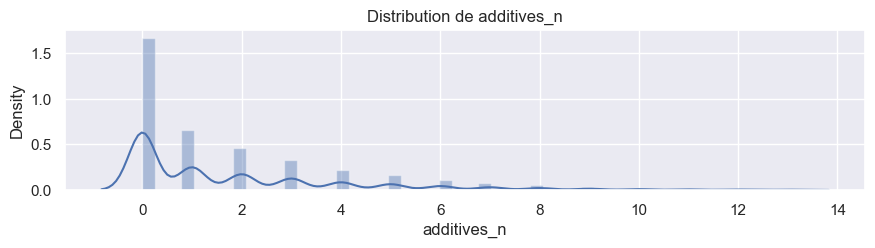

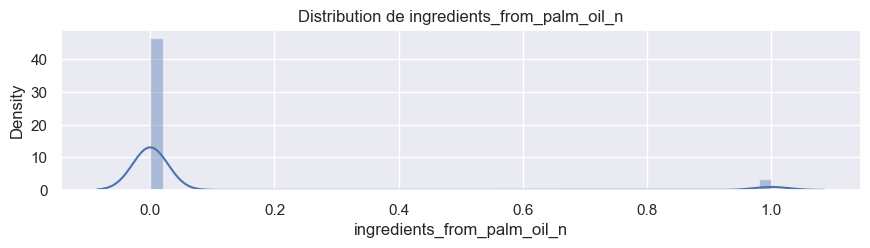

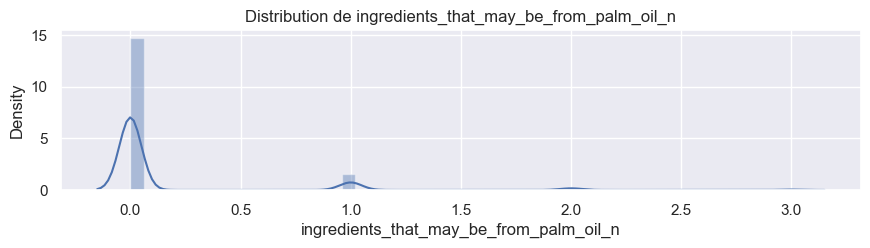

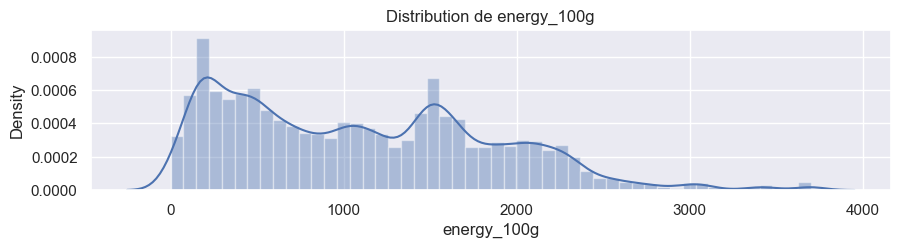

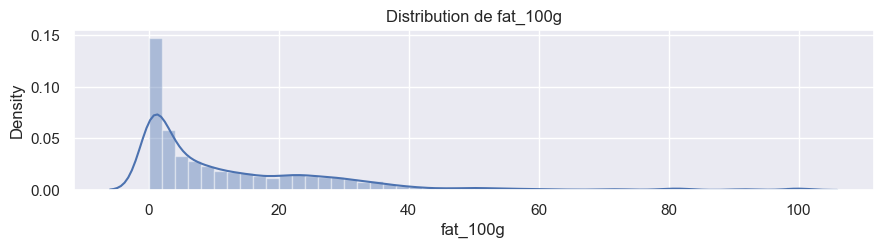

...

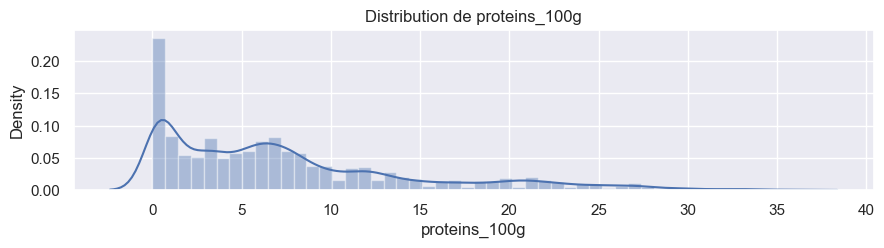

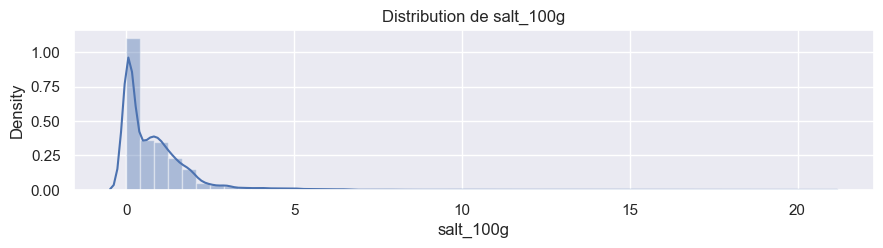

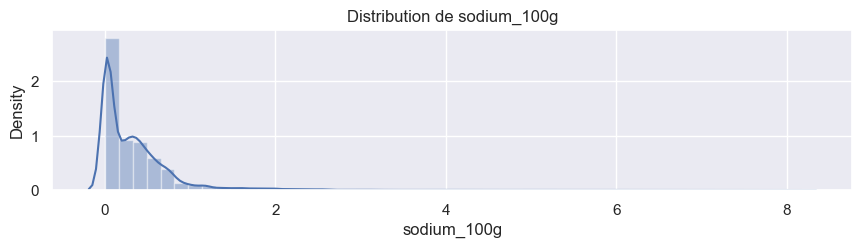

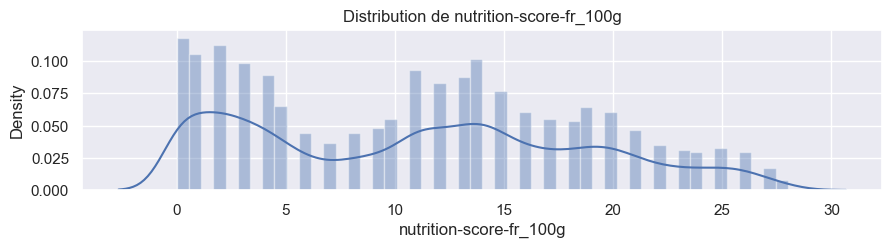

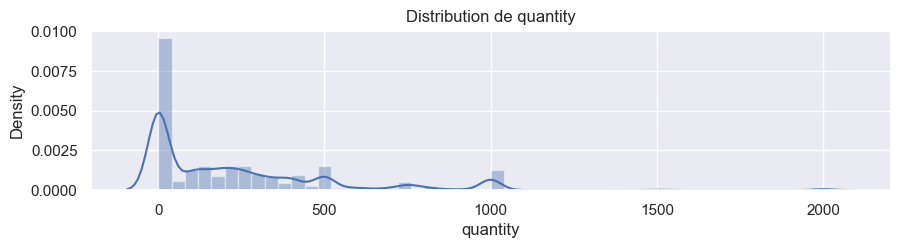

In [34]:
# numeric_columns = data.select_dtypes(include = ['int8', 'float32','int32','float64']).columns
# for column in numeric_columns:
#     plt.figure(figsize = (10,2))
#     sns.set(font_scale=1)
#     sns.distplot(data[column], bins=50)
#     chaine = 'Distribution de ' + column
#     plt.title(chaine)
#     plt.xlabel(column)
# #    plt.show()
#     save_figure_opt(chaine,"Aanalyse_univariée_Distribution_par_variable", library='matplotlib')
numeric_columns = data.select_dtypes(include = ['int8', 'float32','int32','float64']).columns

for column in numeric_columns:
    plt.figure(figsize = (10,2))
    sns.set(font_scale=1)
    sns.distplot(data[column], bins=50)
    chaine = 'Distribution de ' + column
    plt.title(chaine)
    plt.xlabel(column)
#     x_max = min(100, data[column].max() * 1.1)
#     plt.xlim(0, x_max)
#     plt.ylim(0, 100)
#    plt.show()
    save_figure_opt(chaine,"Aanalyse_univariée_Distribution_par_variable_libre", library='matplotlib')


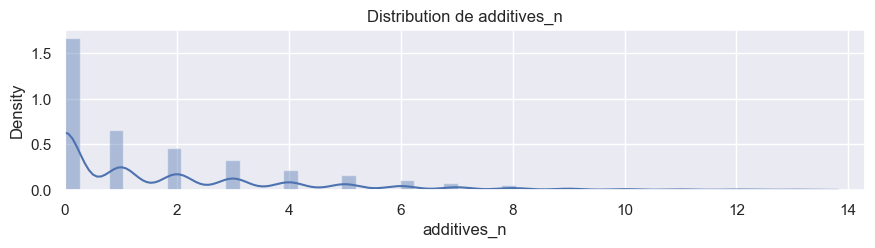

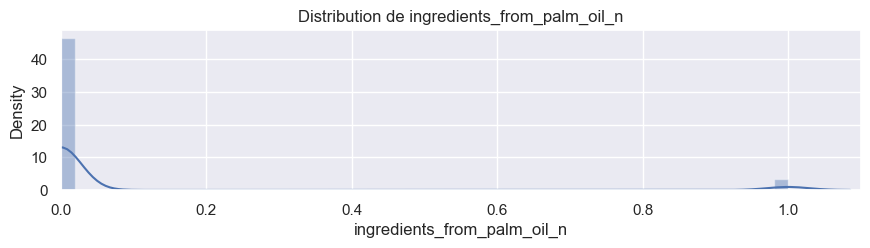

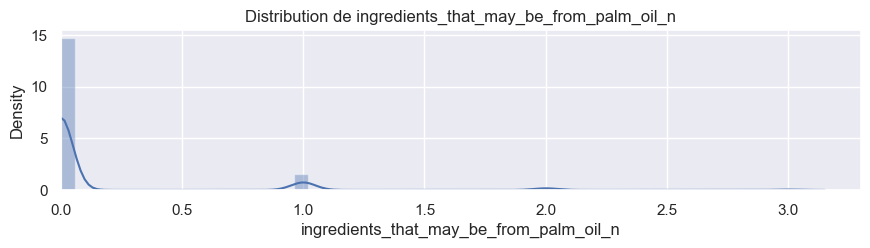

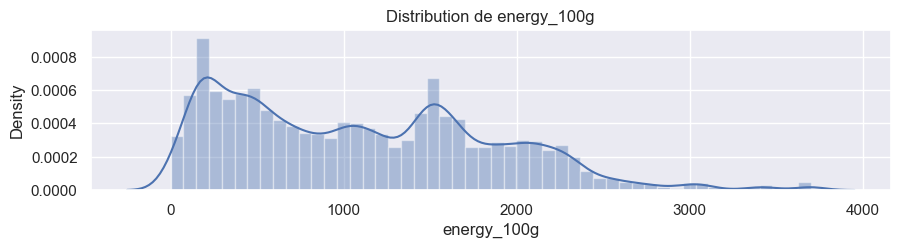

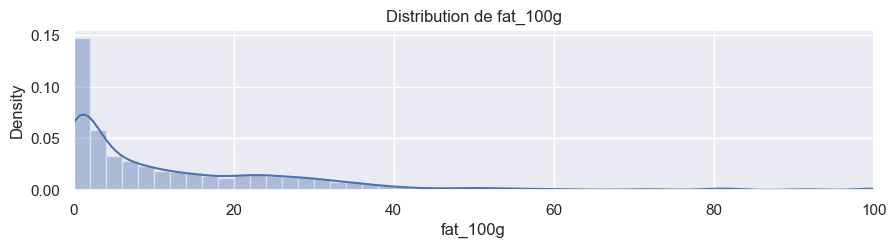

...

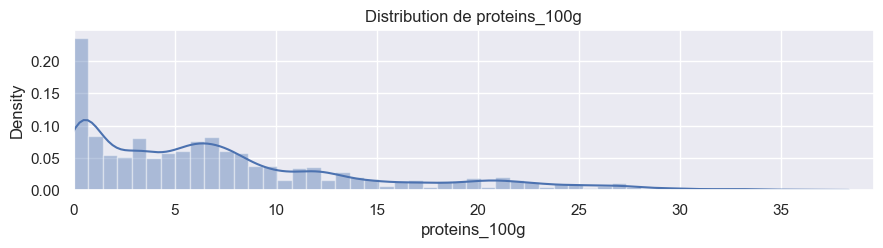

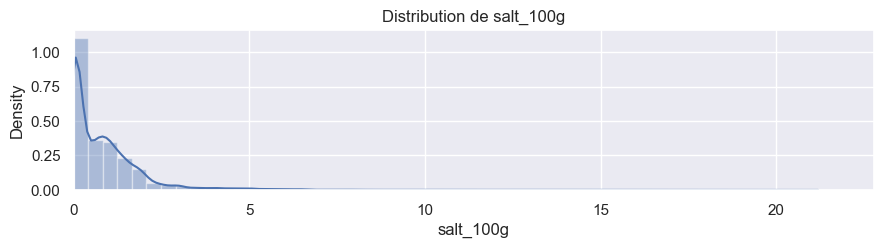

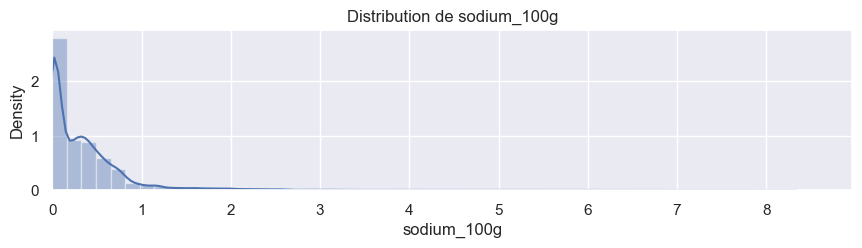

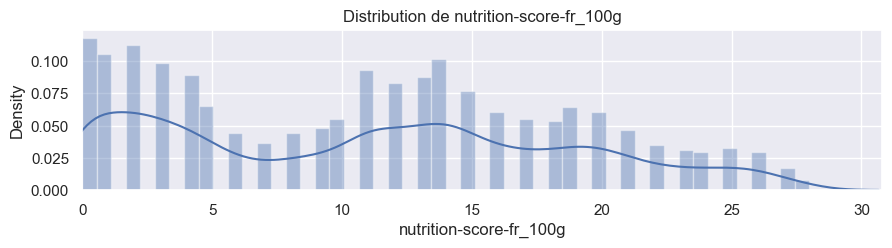

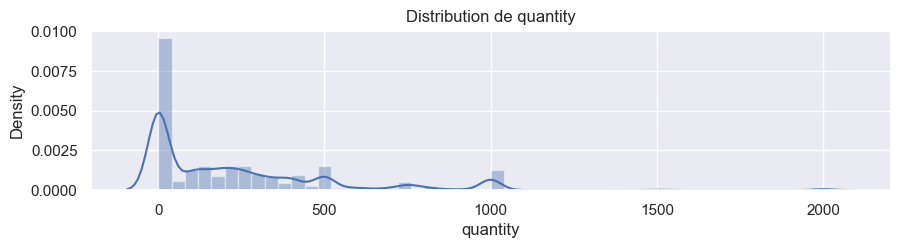

In [35]:
numeric_columns = data.select_dtypes(include = ['int8', 'float32','int32','float64']).columns

for column in numeric_columns:
    plt.figure(figsize = (10,2))
    sns.set(font_scale=1)
    if column in ['energy_100g', 'quantity']:
        sns.distplot(data[column].dropna(), bins=50)
    else:
        sns.distplot(data[column], bins=50)
    chaine = 'Distribution de ' + column
    plt.title(chaine)
    plt.xlabel(column)
    if column not in ['energy_100g', 'quantity']:
        x_max = min(100, data[column].max() * 1.1)
        plt.xlim(0, x_max)
    save_figure_opt(chaine,"Aanalyse_univariée_Distribution_par_variable_100g", library='matplotlib')



In [36]:
numeric_columns

Index(['additives_n', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g',
       'quantity'],
      dtype='object')

**Observations :**
* Certaines distributions ont une allure très semblable:
    * fat_100g
    * saturated-fat_100g
    * carbohydrates_100g (à l’exception de la partie entre 40 et 80g)
    * sugars_100g
    * fiber_100g
    * sodium_100g
    * salt_100g
    * proteins_100g
    
    
* Certaines variables sont discrètes:
    * nutrition-score-fr_100g
    * additives_n

### Boîtes à moustaches

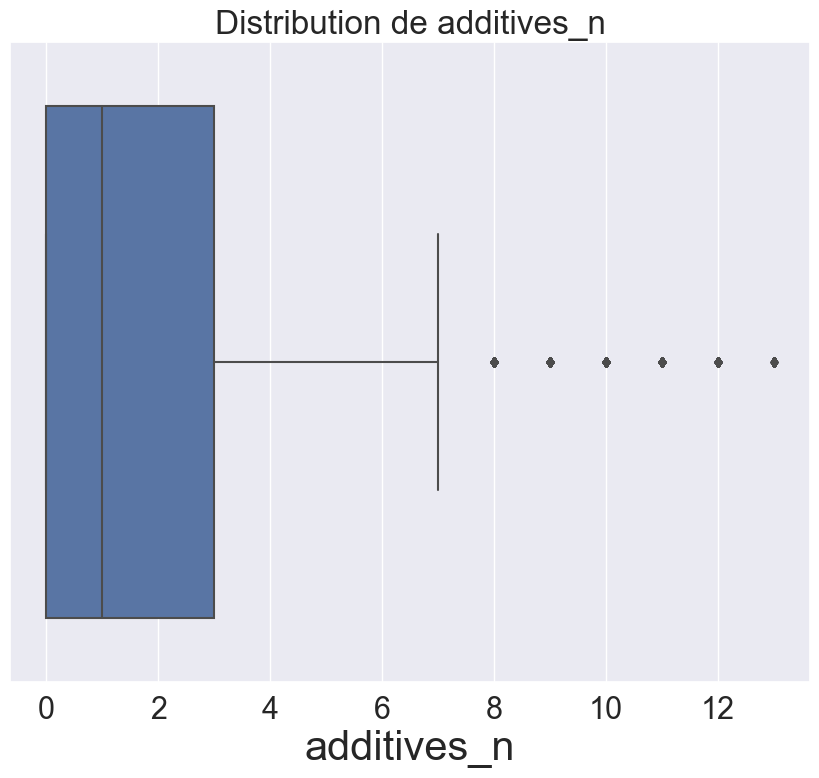

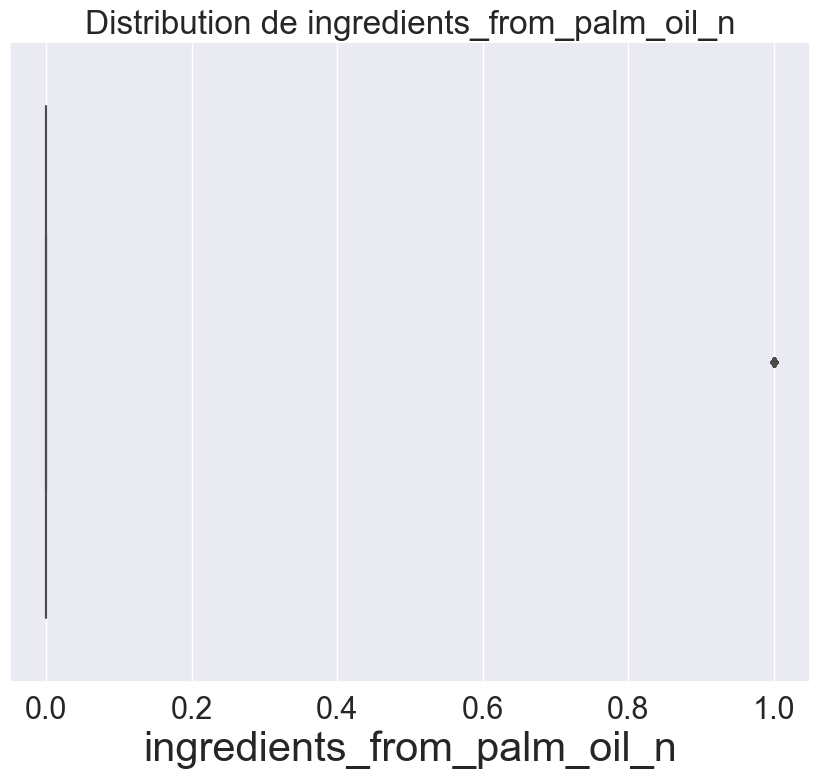

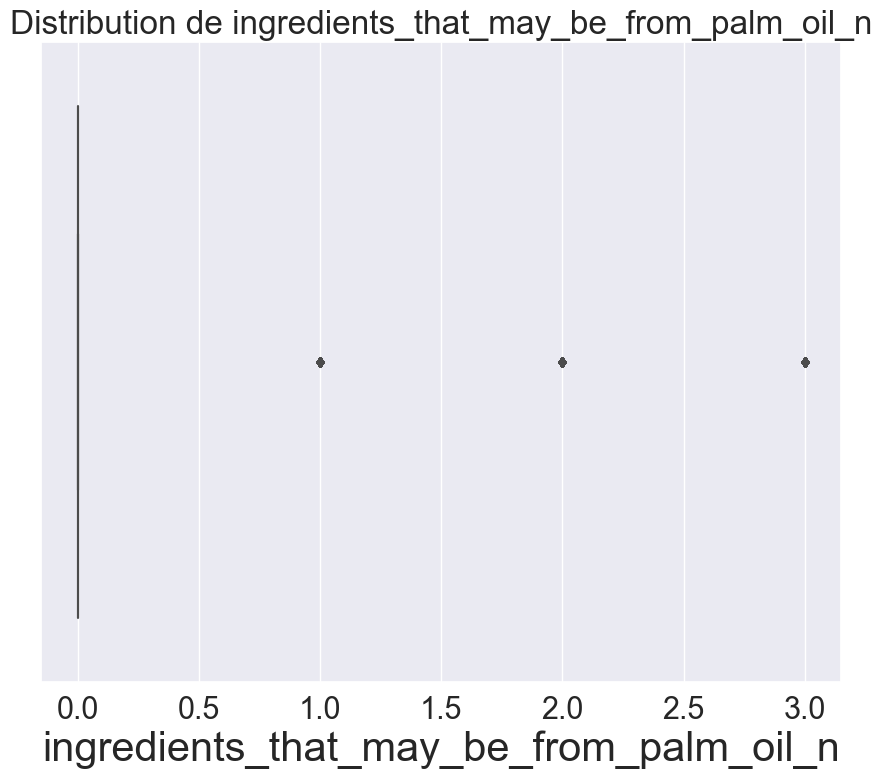

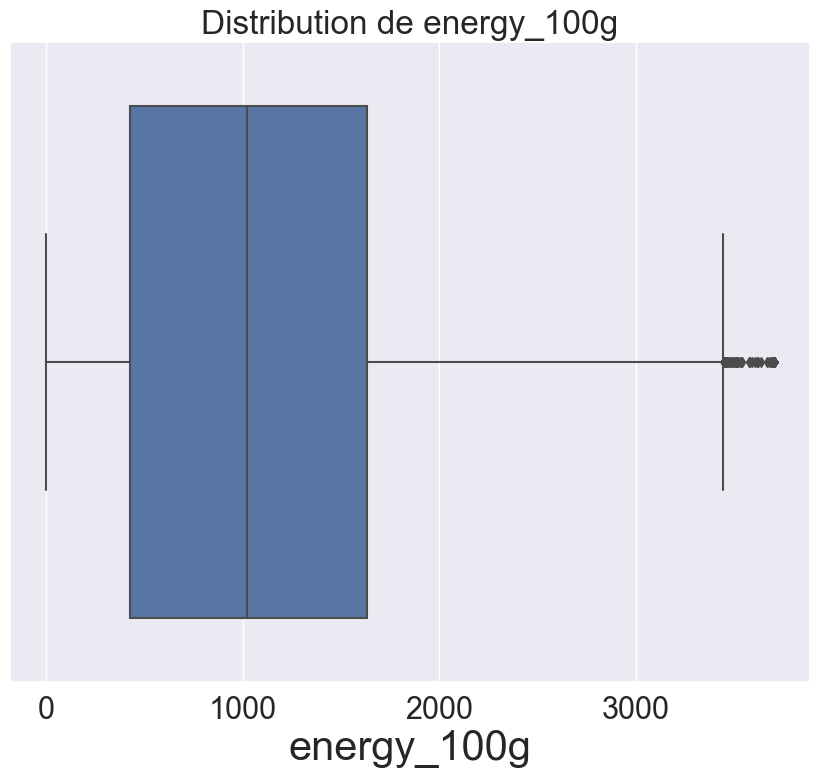

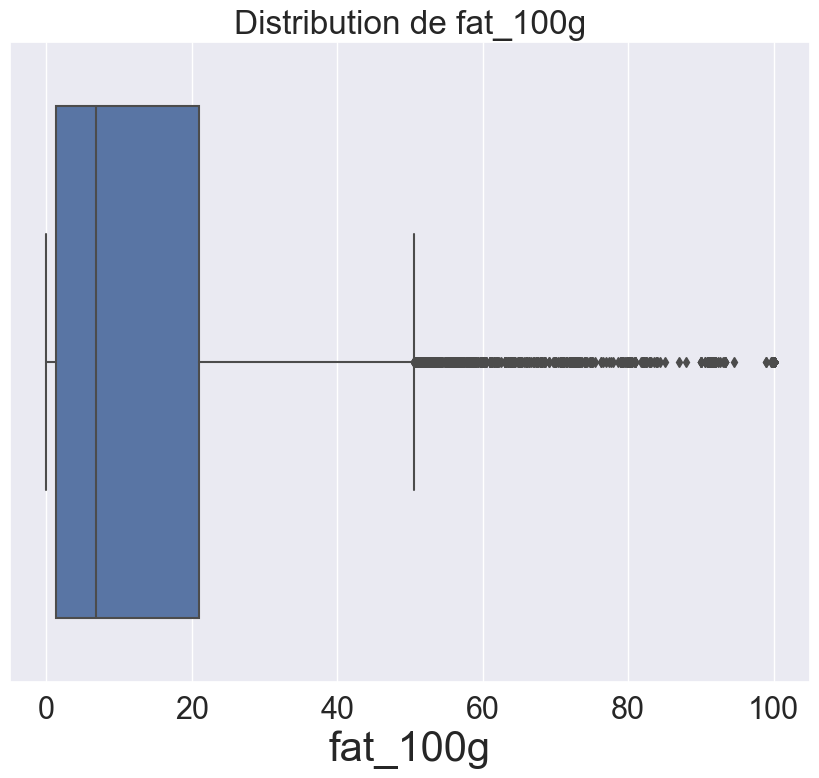

...

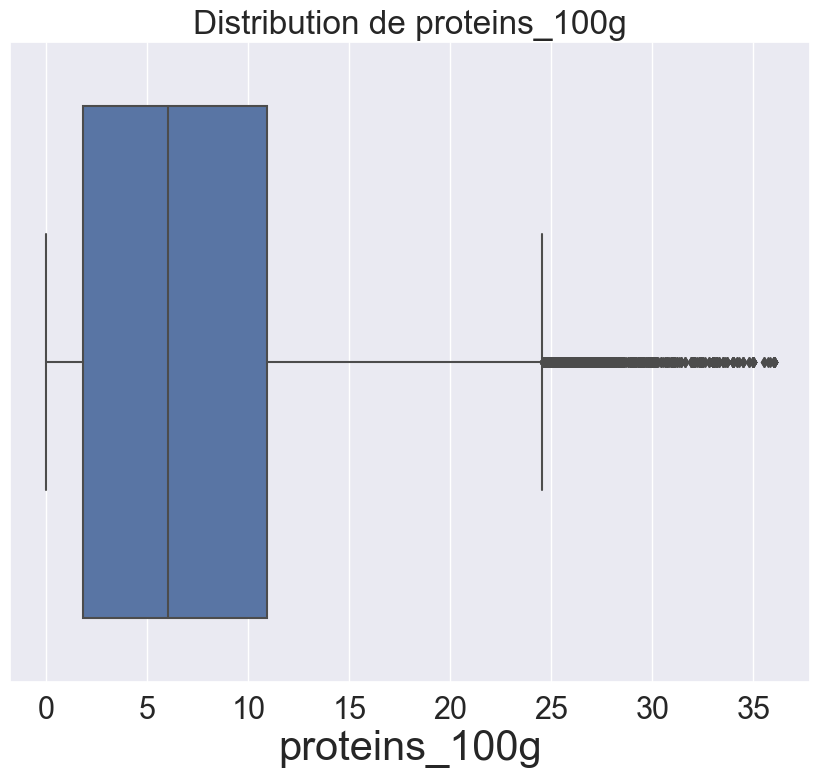

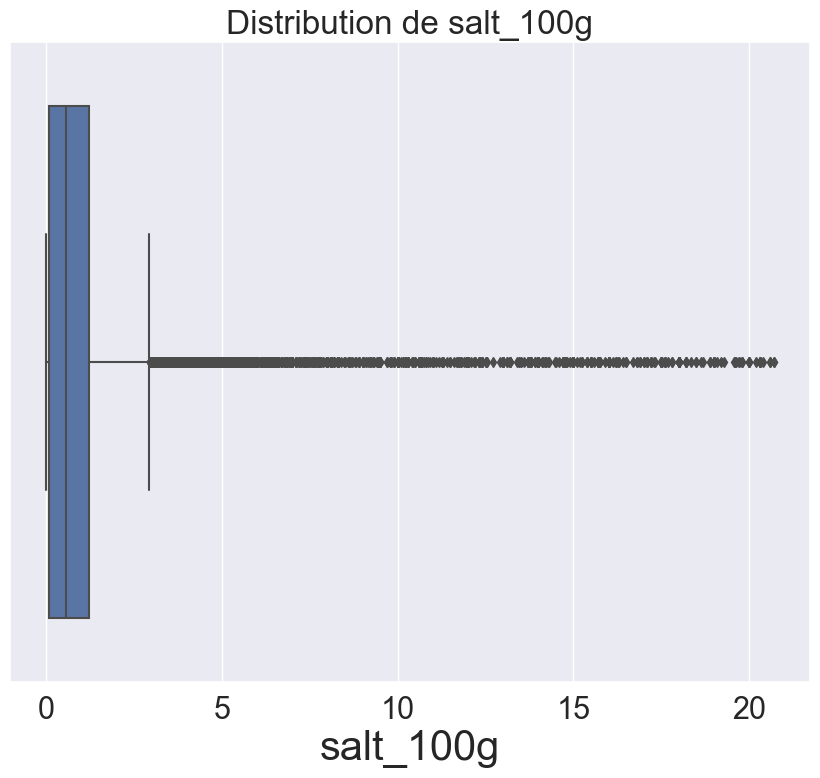

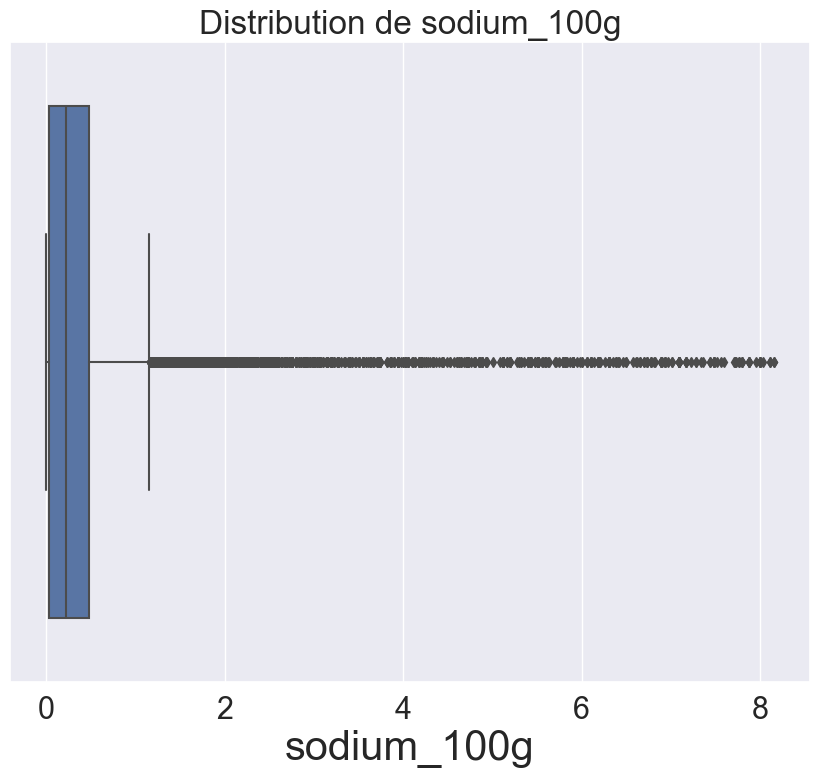

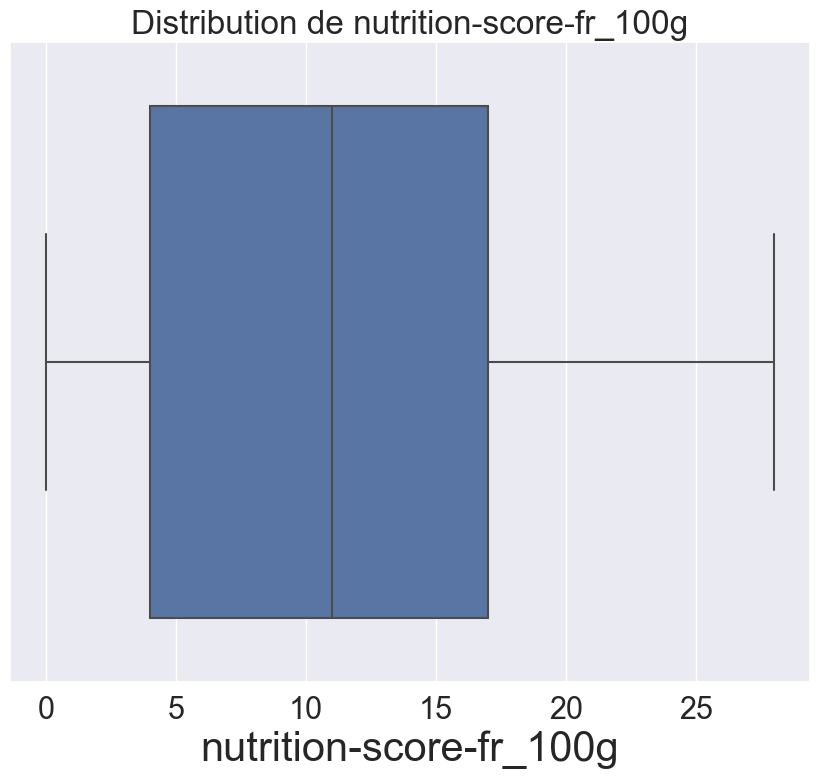

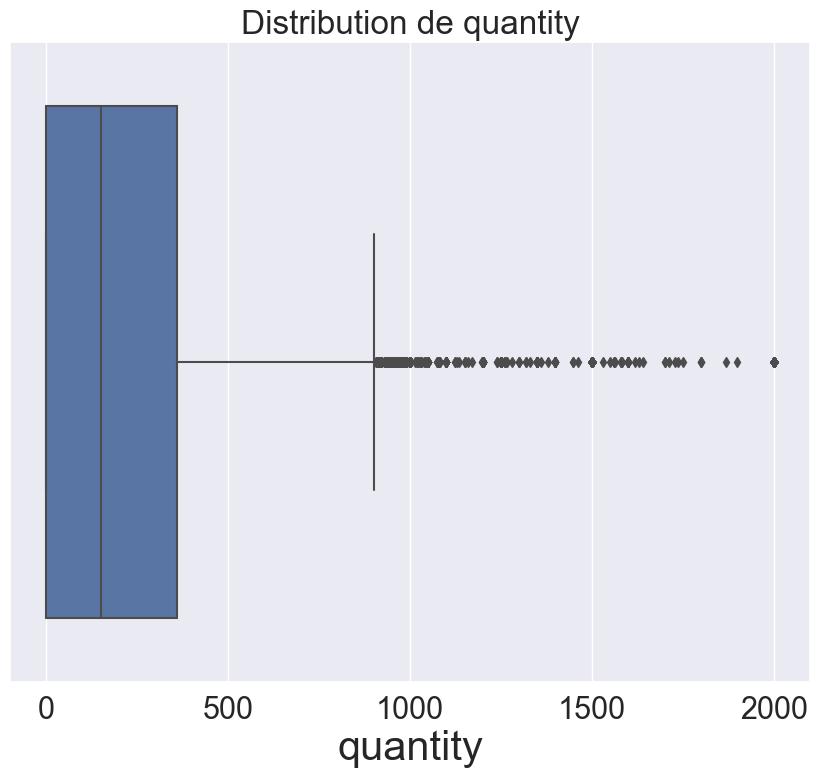

In [37]:
numeric_columns = data.select_dtypes(include = ['int8', 'float32','int32','float64']).columns
sns.set(font_scale=2)
for column in numeric_columns:
    plt.figure(figsize = (10,8))
    
    sns.boxplot(data[column])
    chaine = 'Distribution de ' + column
    plt.title(chaine)
    plt.xlabel(column, fontsize=30)
    save_figure_opt(chaine,"Boite_moustache_Distribution_par_variable", library='matplotlib')
#     plt.show()
sns.set(font_scale=1)


En observant les boxplot, on constate que les différentes variables ne semblent pas suivre une loi normale.

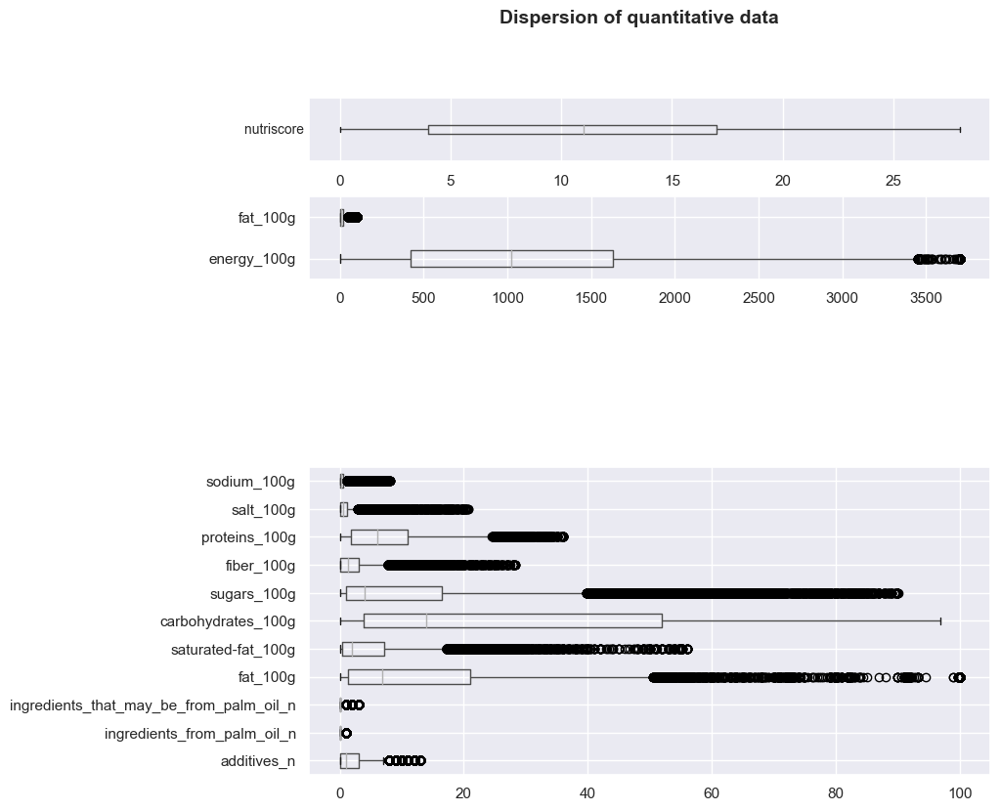

In [38]:
# Plotting boxplot of quantitative features for each nutrigrade

fig = plt.figure(figsize=(9,9))

ax1 = fig.add_subplot(9,1,1)
sel_cols = [ 'nutrition-score-fr_100g']
df[sel_cols].boxplot(vert=False, patch_artist= False, ax=ax1)
# ax1.boxplot(df['nutrition-score-fr_100g'], widths=[0.25], vert=False, patch_artist= False)
ax1.set_ylabel('nutriscore    ', rotation=0, va = 'center', fontsize=10, labelpad = 20)
ax1.set_yticks([])
# ax1.set_yticklabels(['']*10)

ax2 = fig.add_subplot(7,1,2)
# sel_cols = ['energy_100g', 'energy_from_fat_kj_100g']
sel_cols = ['energy_100g', 'fat_100g']
df[sel_cols].boxplot(vert=False, widths=[0.4,0.4], patch_artist= False, ax=ax2)

ax3 = fig.add_subplot(2,1,2)
# sel_cols = ['fat_100g', 'carbohydrates_100g', 'proteins_100g','saturated-fat_100g', 'sugars_100g', 'fiber_100g', 'salt_100g', 'sodium_100g']

sel_cols = ['additives_n', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
   'proteins_100g', 'salt_100g', 'sodium_100g']

df[sel_cols].boxplot(vert=False, patch_artist= False, ax=ax3)

plt.suptitle('Dispersion of quantitative data', fontsize=14,
             fontweight='bold')

plt.show()


In [39]:
categories_columns = data.select_dtypes(include = ['category']).columns

In [40]:
categories_columns

Index(['creator', 'quantity_original', 'packaging', 'packaging_tags', 'brands',
       'categories_fr', 'labels_fr', 'countries_fr', 'allergens',
       'additives_tags', 'additives_fr', 'nutrition_grade_fr', 'pnns_groups_1',
       'pnns_groups_2', 'states_fr', 'main_category_fr', 'image_url',
       'image_small_url', 'quantity_origine', 'quantity_unit'],
      dtype='object')

In [41]:
data = affectation_types_object(data)

La colonne cities n'existe pas dans le dataframe
La colonne generic_name n'existe pas dans le dataframe
La colonne brands_tags n'existe pas dans le dataframe
La colonne categories n'existe pas dans le dataframe
La colonne categories_tags n'existe pas dans le dataframe
La colonne categories_en n'existe pas dans le dataframe
La colonne origins n'existe pas dans le dataframe
La colonne origins_tags n'existe pas dans le dataframe
La colonne manufacturing_places n'existe pas dans le dataframe
La colonne manufacturing_places_tags n'existe pas dans le dataframe
La colonne labels n'existe pas dans le dataframe
La colonne labels_tags n'existe pas dans le dataframe
La colonne labels_en n'existe pas dans le dataframe
La colonne emb_codes n'existe pas dans le dataframe
La colonne emb_codes_tags n'existe pas dans le dataframe
La colonne first_packaging_code_geo n'existe pas dans le dataframe
La colonne cities_tags n'existe pas dans le dataframe
La colonne purchase_places n'existe pas dans le datafr

In [42]:
# for column in categories_columns:
#     sns.countplot(x = data[column], data = data)
#     plt.title(column)
#     plt.show()
#     print('')

In [43]:
#for column in data.select_dtypes(include = ['object']).columns:
#    sns.countplot(x = data[column], data = data)
#    plt.show()
#    print('')

In [44]:
# for column in categories_columns:
#     data[column].hist()
#     plt.title(column)
#     plt.show()
#     print('')

### Occurences des mots

In [45]:
object_columns = data.select_dtypes(include = ['object']).columns
object_columns

Index(['code', 'url', 'creator', 'created_datetime', 'last_modified_t',
       'product_name', 'packaging', 'packaging_tags', 'brands',
       'ingredients_text', 'allergens', 'additives', 'additives_tags',
       'nutrition_grade_fr', 'pnns_groups_1', 'pnns_groups_2', 'image_url',
       'image_small_url', 'quantity'],
      dtype='object')

In [46]:
data.head(1)

,code,url,creator,created_t,created_datetime,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g


In [47]:
df.head(1)

,code,url,creator,created_t,created_datetime,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g


In [48]:
object_columns = ['code',
                  'product_name',
                  'packaging',
                  'brands',
                  'categories',
                  'stores',
                  'ingredients_text',
                  'nutrition_grade_fr',
                  'pnns_groups_1',
                  'pnns_groups_2',
                  'main_category_en', 
                  'manufacturing_places',
                  'labels_fr',
                  'allergens',
                  'additives',
                  'main_category_fr',
                  'image_nutrition_small_url']

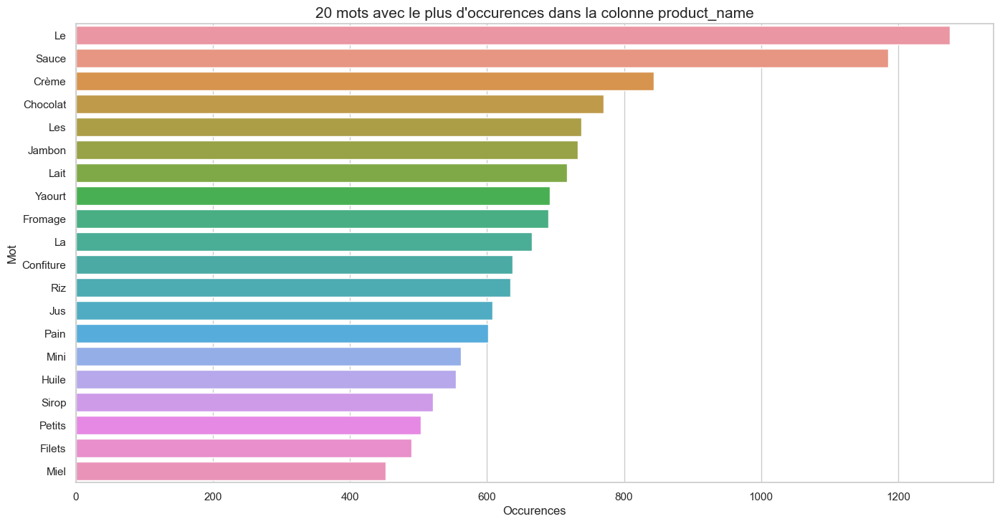

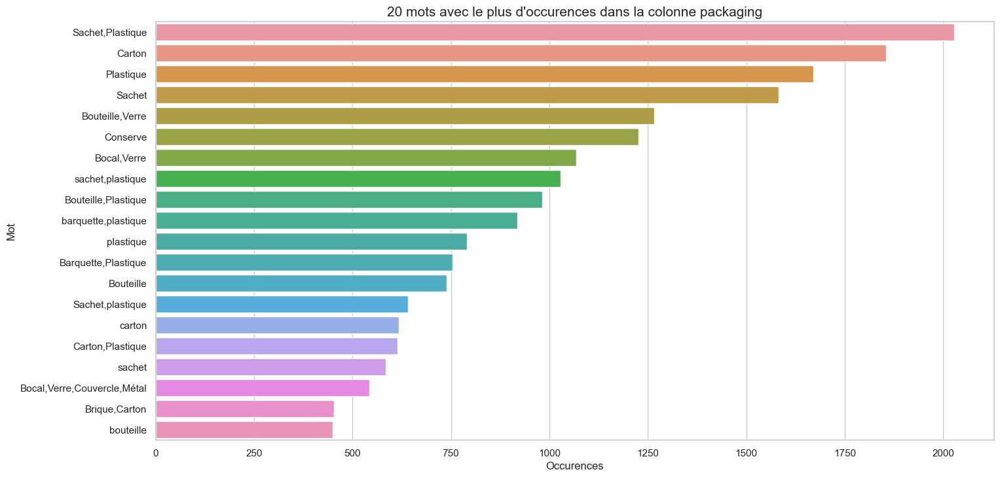

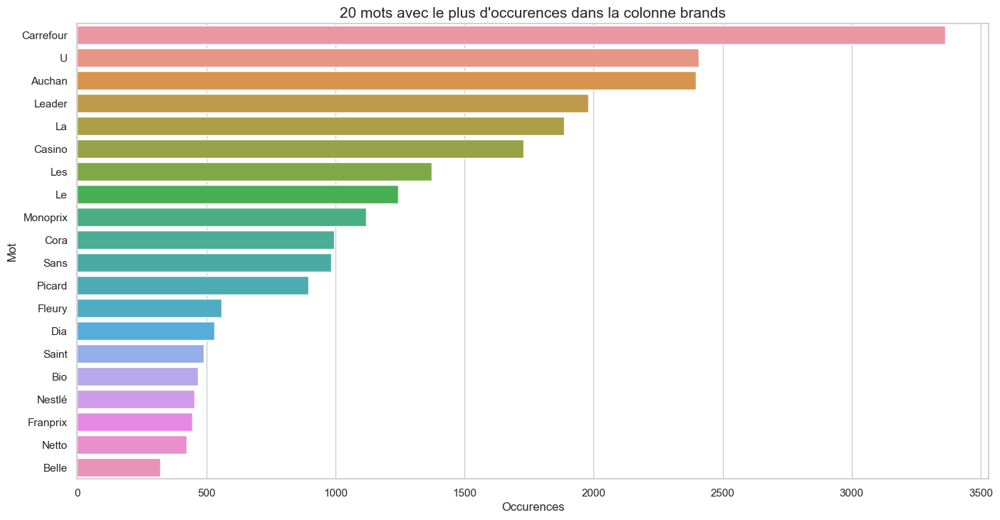

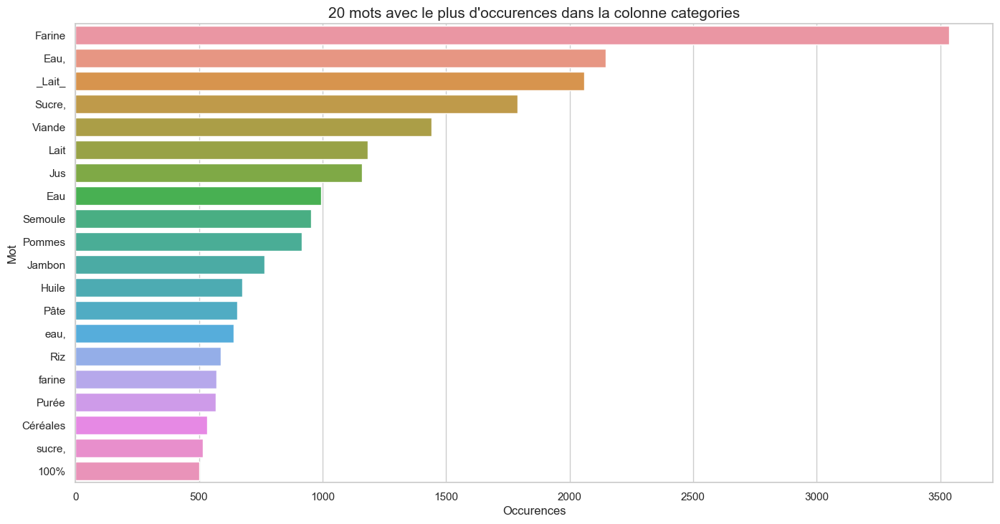

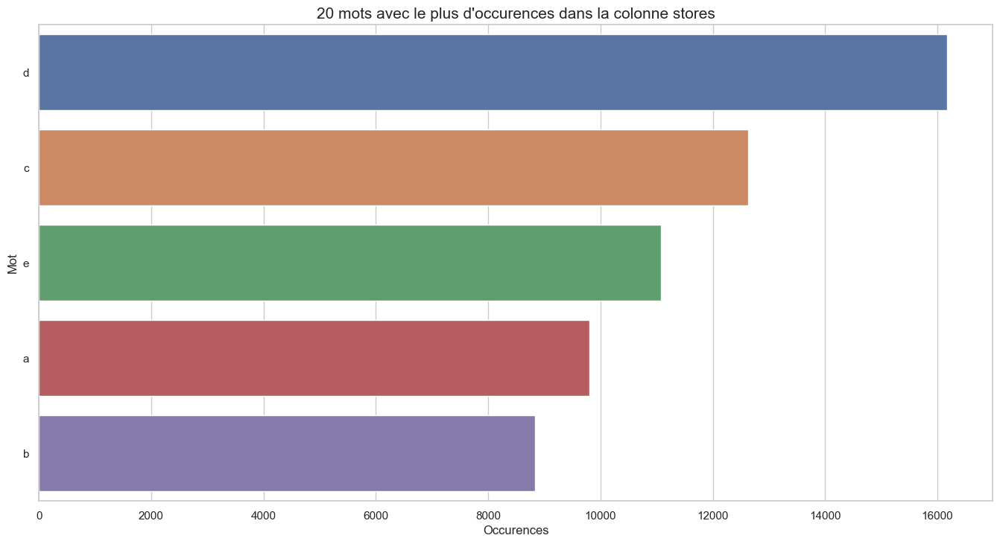

...

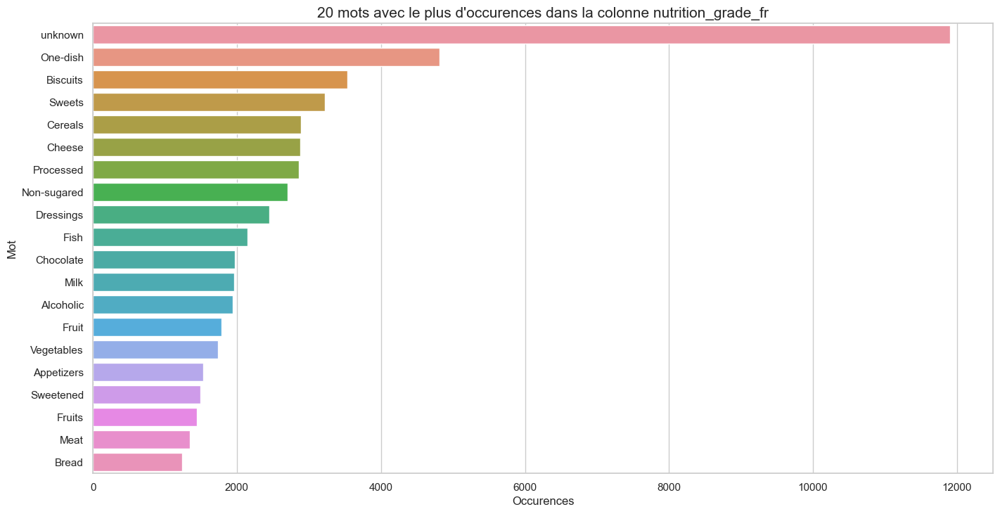

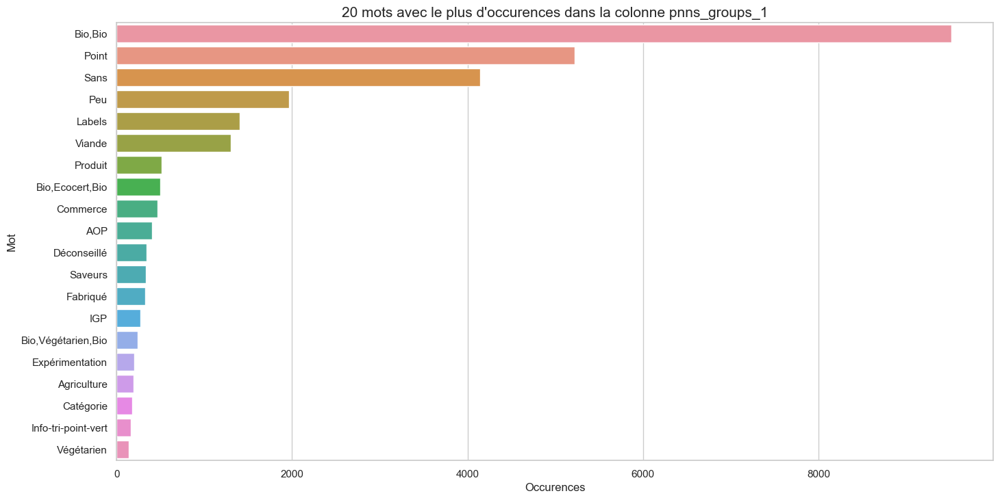

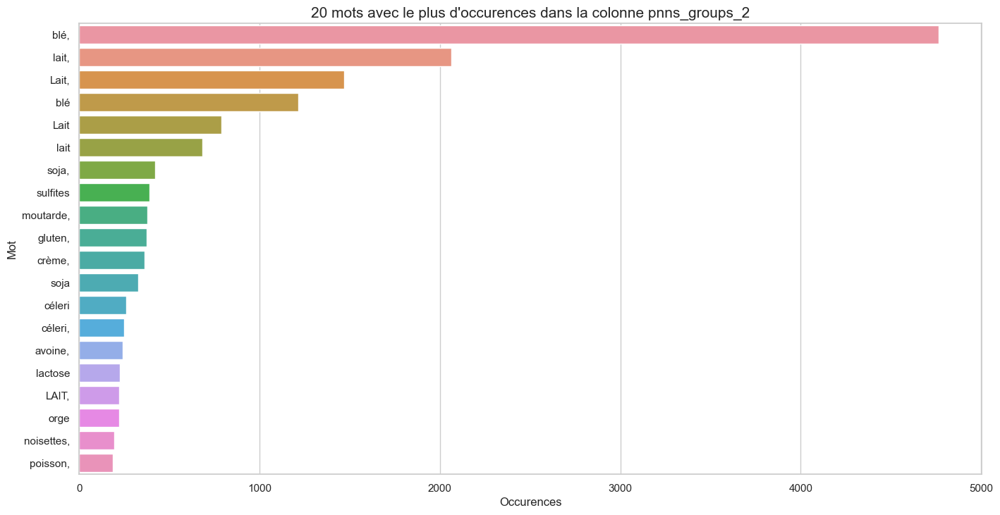

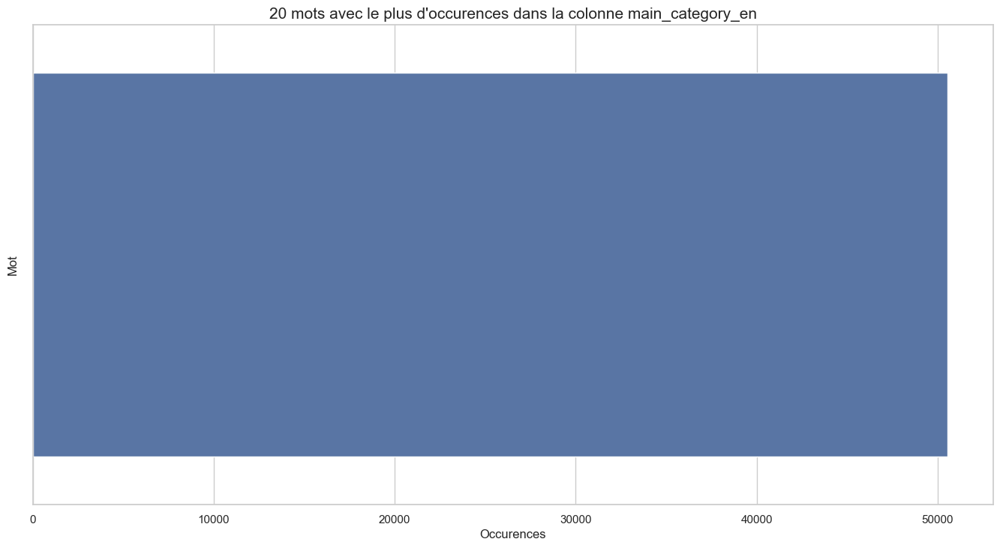

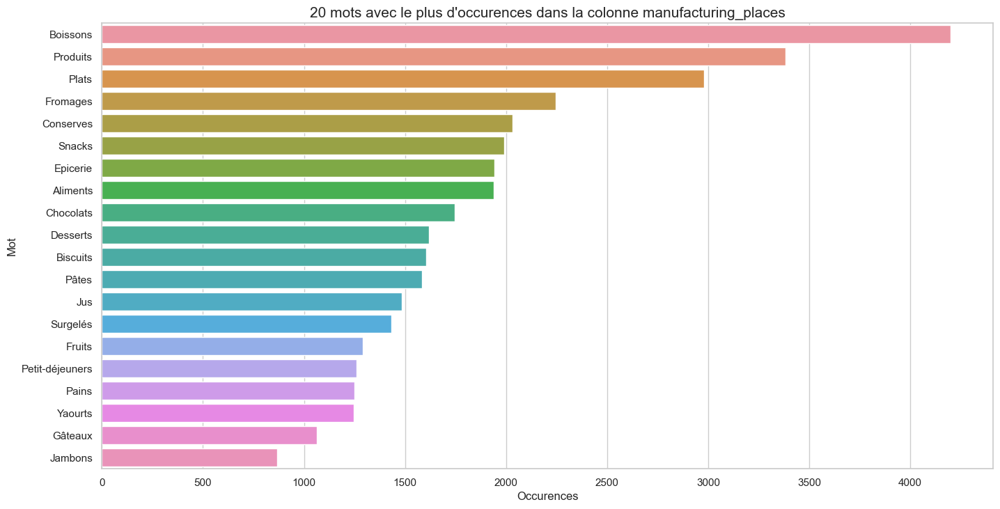

In [49]:
import collections

# Initialisation d'une liste pour stocker les mots populaires de chaque colonne
mots_populaires = []

# Pour chaque colonne de la liste object_columns, vérifier si elle existe dans le dataframe data
for colonne in object_columns :
    if colonne in data.columns:
        # Création d'une liste contenant le premier mot de chaque valeur non nulle de la colonne
        liste_mots = [str(i).split(' ', 1)[0] for i in data[colonne].dropna().tolist()]
        # Ajout des 20 mots les plus fréquents de la colonne dans la liste mots_populaires
        mots_populaires.append(collections.Counter(liste_mots).most_common(20))

# Réglage de la taille de police pour le graphique
sns.set(font_scale=2.5)

# Pour chaque colonne et sa liste de mots populaires, tracer un graphique
for nom_colonne, liste_mots in zip(object_columns[1:], mots_populaires[1:]):
    # Vérification que la liste de mots n'est pas vide
    if liste_mots:
        # Réglages du style et de la taille de la figure
        sns.set(style="whitegrid")
        plt.figure(figsize=(16, 8))

        # Création d'un dataframe contenant les 20 mots les plus fréquents de la colonne
        df_mots_utilises = pd.DataFrame(liste_mots, columns = ['Mot', 'Occurences']).sort_values(by='Occurences', ascending=False)
        df_mots_utilises.head()

        # Tracé d'un graphique en barres horizontales des mots et de leur fréquence
        sns.barplot(y = 'Mot', x='Occurences', data = df_mots_utilises)
        chaine = 'occurences_de_la_colonne_' + nom_colonne
        # Ajout d'un titre au graphique
        plt.title('20 mots avec le plus d\'occurences dans la colonne ' + nom_colonne, size=15)
        
        # Affichage du graphique
        #plt.show()
        save_figure_opt(chaine,"Occurence_par_variable_", library='matplotlib')

# Réinitialisation de la taille de police à la valeur par défaut
sns.set(font_scale=1)



In [90]:
import collections

# Initialisation d'une liste pour stocker les mots populaires de chaque colonne
mots_populaires = []

# Pour chaque colonne de la liste object_columns, vérifier si elle existe dans le dataframe data
for colonne in object_columns:
    if colonne in data.columns:
        # Création d'une liste contenant le premier mot de chaque valeur non nulle de la colonne
        liste_mots = [str(i).split(' ', 1)[0] for i in data[colonne].dropna().tolist()]
        # Ajout des 20 mots les plus fréquents de la colonne dans la liste mots_populaires
        mots_populaires.append(collections.Counter(liste_mots).most_common(20))

# Trier la liste mots_populaires par ordre décroissant d'occurrence
mots_populaires = sorted(mots_populaires, key=lambda x: x[0][1], reverse=True)

# Supprimer les mots inférieurs à 3 lettres et les libellés qui ne sont pas des lettres
mots_populaires = [[(mot, occ) for mot, occ in mots if len(mot) >= 3 and mot.isalpha() and mot != 'unknown'] for mots in mots_populaires]

# Supprimer les listes vides dans mots_populaires
mots_populaires = [mots for mots in mots_populaires if mots]

# Afficher mots_populaires
print(mots_populaires)


[[('Sugary', 8727), ('Fish', 6661), ('Beverages', 6164), ('Milk', 6109), ('Composite', 5883), ('Cereals', 5718), ('Fruits', 3955), ('Fat', 3605), ('Salty', 2000)], [('Biscuits', 3533), ('Sweets', 3222), ('Cereals', 2892), ('Cheese', 2877), ('Processed', 2855), ('Dressings', 2452), ('Fish', 2142), ('Chocolate', 1972), ('Milk', 1965), ('Alcoholic', 1940), ('Fruit', 1784), ('Vegetables', 1732), ('Appetizers', 1529), ('Sweetened', 1490), ('Fruits', 1448), ('Meat', 1341), ('Bread', 1235)], [('Point', 5222), ('Sans', 4140), ('Peu', 1962), ('Labels', 1401), ('Viande', 1300), ('Produit', 510), ('Commerce', 470), ('AOP', 402), ('Déconseillé', 340), ('Saveurs', 330), ('Fabriqué', 326), ('IGP', 273), ('Expérimentation', 202), ('Agriculture', 194), ('Catégorie', 174), ('Végétarien', 137)], [('blé', 1215), ('Lait', 787), ('lait', 681), ('sulfites', 391), ('soja', 328), ('céleri', 260), ('lactose', 224), ('orge', 222)], [('Boissons', 4201), ('Produits', 3384), ('Plats', 2980), ('Fromages', 2246), ('

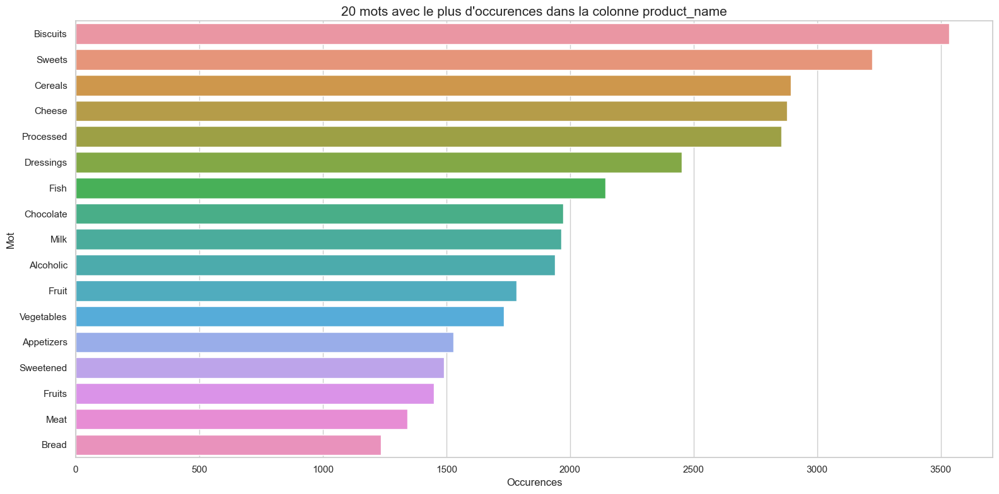

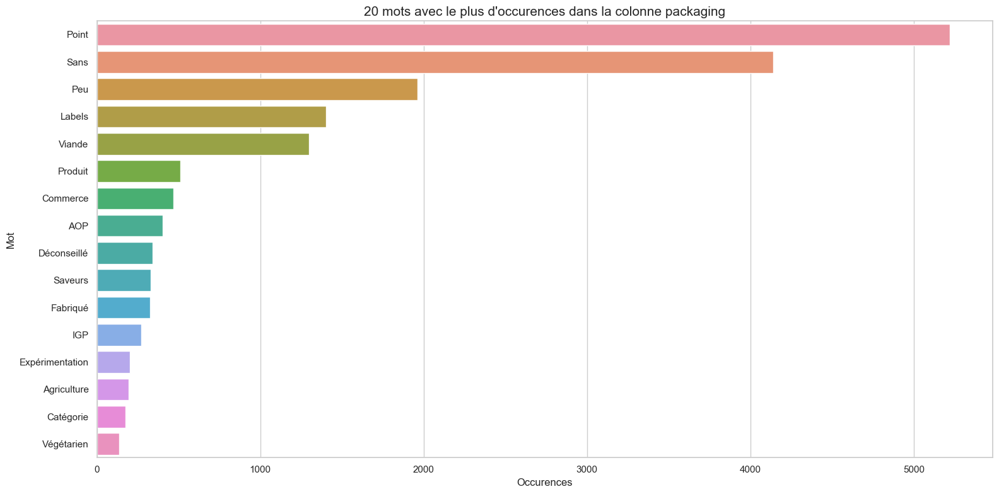

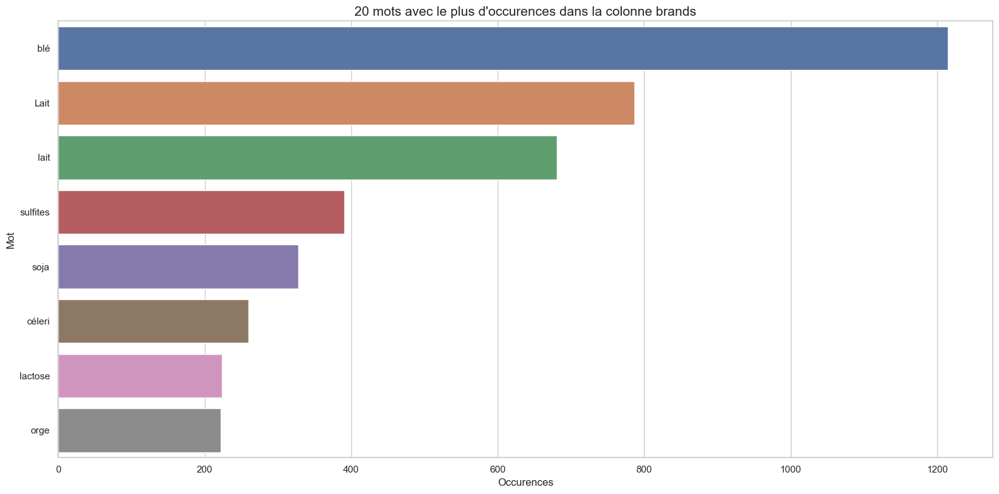

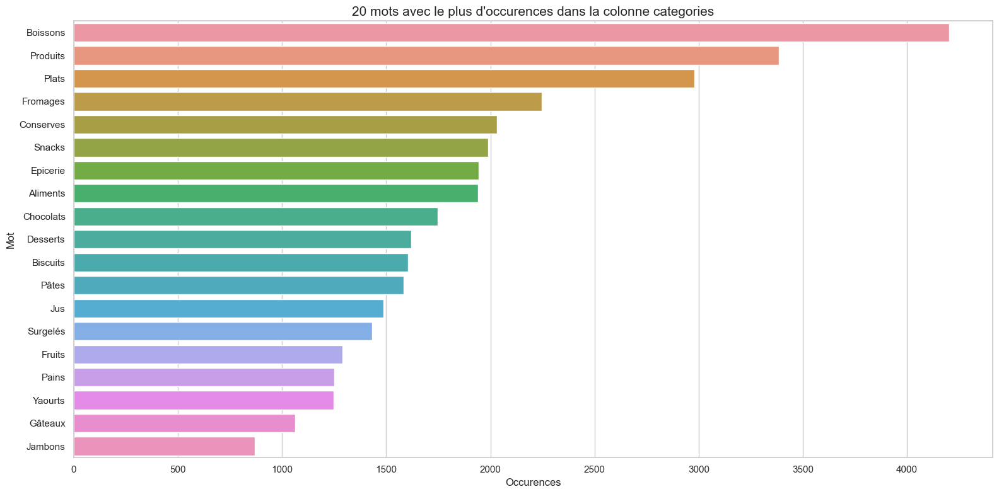

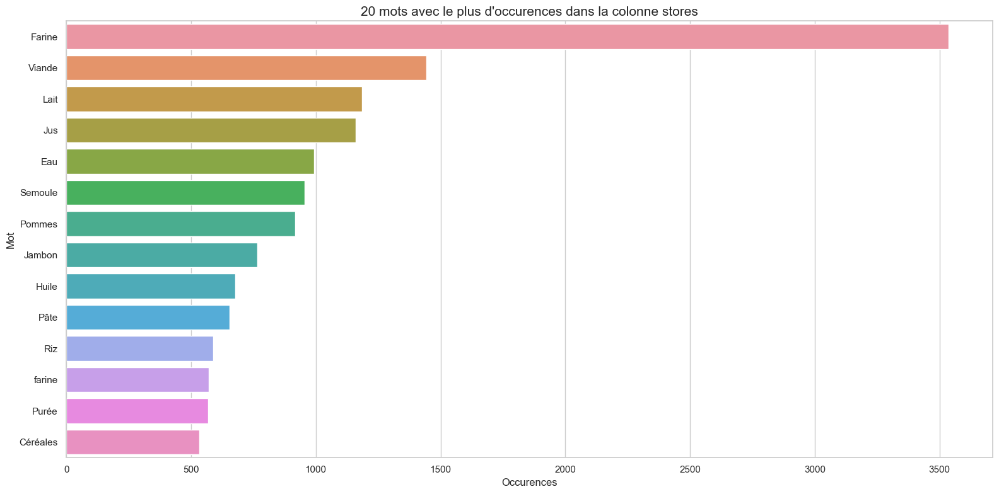

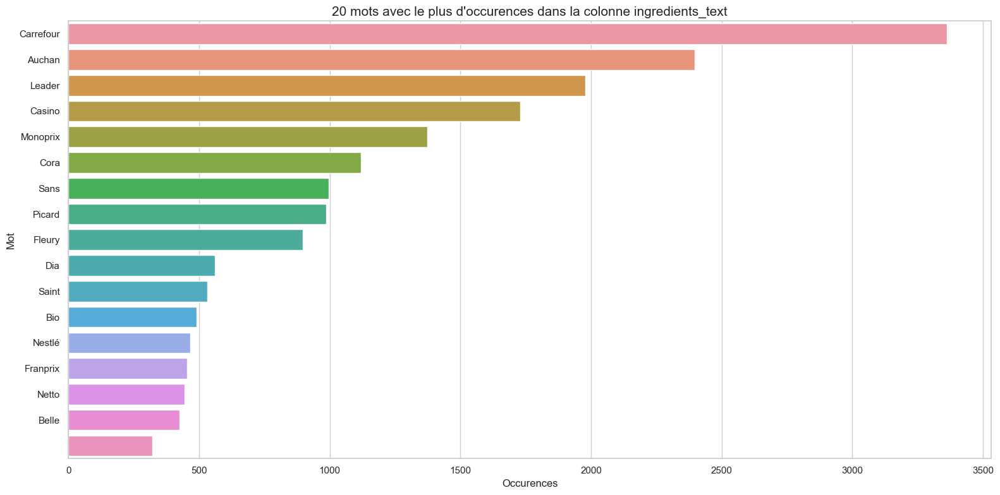

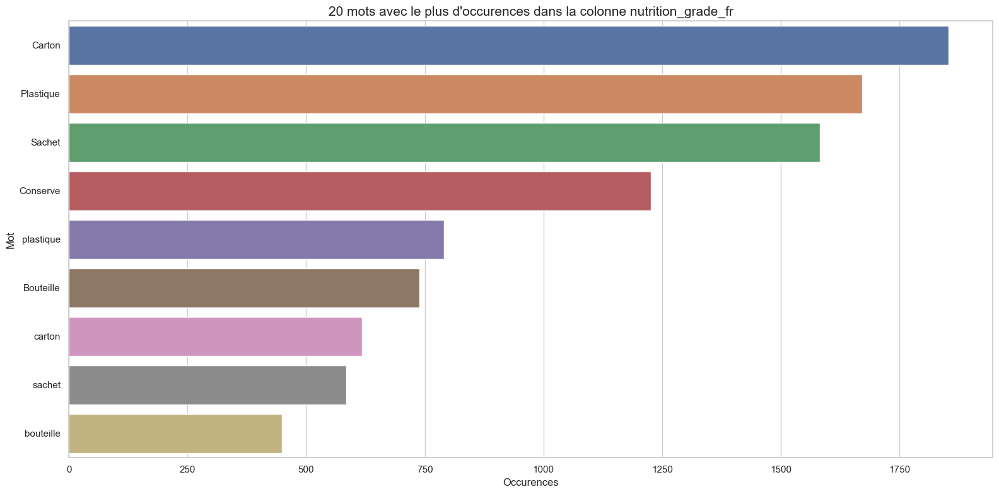

In [ ]:
# import collections

# # Initialisation d'une liste pour stocker les mots populaires de chaque colonne
# mots_populaires = []

# # Pour chaque colonne de la liste object_columns, vérifier si elle existe dans le dataframe data
# for colonne in object_columns :
#     if colonne in data.columns:
#         # Création d'une liste contenant le premier mot de chaque valeur non nulle de la colonne
#         liste_mots = [str(i).split(' ', 1)[0] for i in data[colonne].dropna().tolist()]
#         # Ajout des 20 mots les plus fréquents de la colonne dans la liste mots_populaires
#         mots_populaires.append(collections.Counter(liste_mots).most_common(20))

# # print(liste_mots)
# # print(mots_populaires)

# Réglage de la taille de police pour le graphique
sns.set(font_scale=2.5)

# Pour chaque colonne et sa liste de mots populaires, tracer un graphique
for nom_colonne, mots_populaires in zip(object_columns[1:], mots_populaires[1:]):
    # Vérification que la liste de mots n'est pas vide
    if liste_mots:
        # Réglages du style et de la taille de la figure
        sns.set(style="whitegrid")
        plt.figure(figsize=(16, 8))

        # Création d'un dataframe contenant les 20 mots les plus fréquents de la colonne
        df_mots_utilises = pd.DataFrame(mots_populaires, columns = ['Mot', 'Occurences']).sort_values(by='Occurences', ascending=False)
        df_mots_utilises.head()

        # Tracé d'un graphique en barres horizontales des mots et de leur fréquence
        sns.barplot(y = 'Mot', x='Occurences', data = df_mots_utilises)
        chaine = 'occurences_de_la_colonne_' + nom_colonne
        # Ajout d'un titre au graphique
        plt.title('20 mots avec le plus d\'occurences dans la colonne ' + nom_colonne, size=15)
        
        # Suppression des articles définis et indéfinis dans les labels de l'axe y
        labels = [label.get_text() for label in plt.gca().get_yticklabels()]
        labels = [label for label in labels if label not in ['le', 'la', 'les', 'un', 'une', 'des','Le', 'La', 'Les', 'Un', 'Une', 'Des']]
        plt.yticks(range(len(labels)), labels)
        
        # Réduction de l'espace blanc autour du graphique
        plt.tight_layout()
        
        # Affichage du graphique
        #plt.show()
        save_figure_opt(chaine,"Occurence_par_variable", library='matplotlib')

# Réinitialisation de la taille de police à la valeur par défaut
sns.set(font_scale=1)


### Informations sur les données

In [977]:
df.head(1)

,code,url,creator,created_t,created_datetime,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g


In [978]:
qual_cols = ['nutrition_grade_fr', 'pnns_groups_1', 'pnns_groups_2','brands',
 'countries_fr', 'categories_fr', 'main_category_fr',
 'additives', 'labels_fr', 'allergens', 'packaging',
 'packaging']

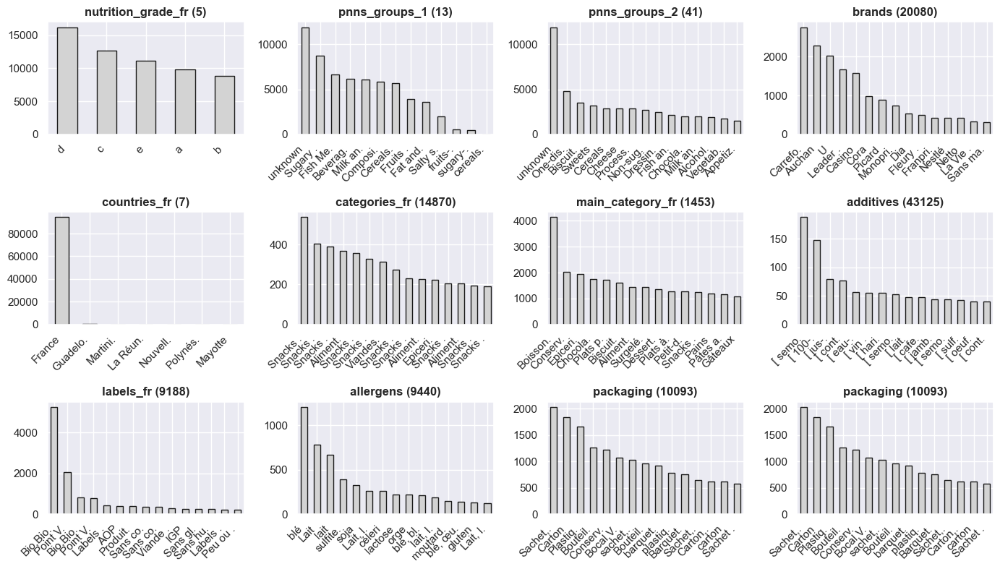

In [979]:
# Plotting bar plots of the main categorical columns

fig = plt.figure(figsize=(14,10))
for i, c in enumerate(qual_cols,1):
    ax = fig.add_subplot(4,4,i)
    ser = df[c].value_counts()
    n_cat = ser.shape[0]
    if n_cat>15:
        ser[0:15].plot.bar(color='lightgrey',ec='k', ax=ax)
    else:
        ser.plot.bar(color='lightgrey',ec='k',ax=ax)
    ax.set_title(c+f' ({n_cat})', fontweight='bold')
    labels = [item.get_text() for item in ax.get_xticklabels()]
    short_labels = [s[0:7]+'.' if len(s)>7 else s for s in labels]
    ax.axes.set_xticklabels(short_labels)
    plt.xticks(rotation=45, ha='right')
plt.tight_layout()

plt.show()

Certaines caractéristiques ont beaucoup de catégories ('main category_fr', 'brands', 'packaging', tandis que d'autres ('nutrition_grade_fr', 'pnns_groups_1' 'pnns_groups_2' en ont moins.

## 2 Analyse temporelle 
Nous allons définir des fonctions utiles pour l'analyse temporelle des données présentées ci-dessous.

## 2.1 Evolution au fil du temps 
Traçons le nombre de nouvelles entrées par périodes de temps.

In [980]:
data 

,code,url,creator,created_t,created_datetime,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g
1,0000000024600,http://world-fr.openfoodfacts.org/produit/0000000024600/filet-de-boeuf,date-limite-app,1434530704,2015-06-17T08:45:04Z,1434535914,Filet de bœuf,2.46 kg,plastique,plastique,NaN,Filet-de-boeuf,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite complétée,Caractéristiques à compléter,Catégories complétées,Marques à compléter,Emballage complété,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",Filet-de-boeuf,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.46 kg,NaN,g
2,0000000027205,http://world-fr.openfoodfacts.org/produit/0000000027205,tacinte,1458238630,2016-03-17T18:17:10Z,1458238638,NaN,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit à compléter,Photos à valider,Photos envoyées",NaN,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
3,0000000039259,http://world-fr.openfoodfacts.org/produit/0000000039259/twix-x2,tacinte,1422221773,2015-01-25T21:36:13Z,1473538082,Twix x2,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit complete,Photos à envoyer",NaN,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
4,0000005200016,http://world-fr.openfoodfacts.org/produit/0000005200016/lentilles-vertes-bertrand-lejeune,sigoise,1441186657,2015-09-02T09:37:37Z,1442570752,lentilles vertes,1 kg,Sachet plastique,plastique,Bertrand Lejeune,"Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Légumineuses et dérivés,Légumineuses,Graines,Graines de légumineuses,Légumes secs,Lentilles,Lentilles vertes","Bio,Bio européen,AB Agriculture Biologique",France,lentilles vertes,NaN,0.0,[ lentilles-vertes -> fr:lentilles-vertes ] [ lentilles -> fr:lentilles ],NaN,NaN,0.0,0.0,NaN,Cereals and potatoes,Legumes,"A compléter,Informations

In [981]:
# Charger les données
df = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')

In [982]:
df

,code,url,creator,created_t,created_datetime,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g
1,0000000024600,http://world-fr.openfoodfacts.org/produit/0000000024600/filet-de-boeuf,date-limite-app,1434530704,2015-06-17T08:45:04Z,1434535914,Filet de bœuf,2.46 kg,plastique,plastique,NaN,Filet-de-boeuf,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite complétée,Caractéristiques à compléter,Catégories complétées,Marques à compléter,Emballage complété,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",Filet-de-boeuf,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.46 kg,NaN,g
2,0000000027205,http://world-fr.openfoodfacts.org/produit/0000000027205,tacinte,1458238630,2016-03-17T18:17:10Z,1458238638,NaN,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit à compléter,Photos à valider,Photos envoyées",NaN,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
3,0000000039259,http://world-fr.openfoodfacts.org/produit/0000000039259/twix-x2,tacinte,1422221773,2015-01-25T21:36:13Z,1473538082,Twix x2,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit complete,Photos à envoyer",NaN,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
4,0000005200016,http://world-fr.openfoodfacts.org/produit/0000005200016/lentilles-vertes-bertrand-lejeune,sigoise,1441186657,2015-09-02T09:37:37Z,1442570752,lentilles vertes,1 kg,Sachet plastique,plastique,Bertrand Lejeune,"Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Légumineuses et dérivés,Légumineuses,Graines,Graines de légumineuses,Légumes secs,Lentilles,Lentilles vertes","Bio,Bio européen,AB Agriculture Biologique",France,lentilles vertes,NaN,0.0,[ lentilles-vertes -> fr:lentilles-vertes ] [ lentilles -> fr:lentilles ],NaN,NaN,0.0,0.0,NaN,Cereals and potatoes,Legumes,"A compléter,Informations

In [983]:
dfxx = df.copy()
# Conversion de la colonne 'date' en type datetime
dfxx['created_datetime'] = pd.to_datetime(df['created_datetime'])

# Récupération des années uniques
unique_years = dfxx['created_datetime'].dt.year.unique()

print(unique_years)

[2016 2015 2013 2017 2012 2014]


In [984]:
dfxxx = df.copy()
# Conversion de la colonne 'date' en type datetime
dfxxx['last_modified_t'] = pd.to_datetime(df['last_modified_t'])

# Récupération des années uniques
unique_years = dfxxx['last_modified_t'].dt.year.unique()

print(unique_years)

[1970]


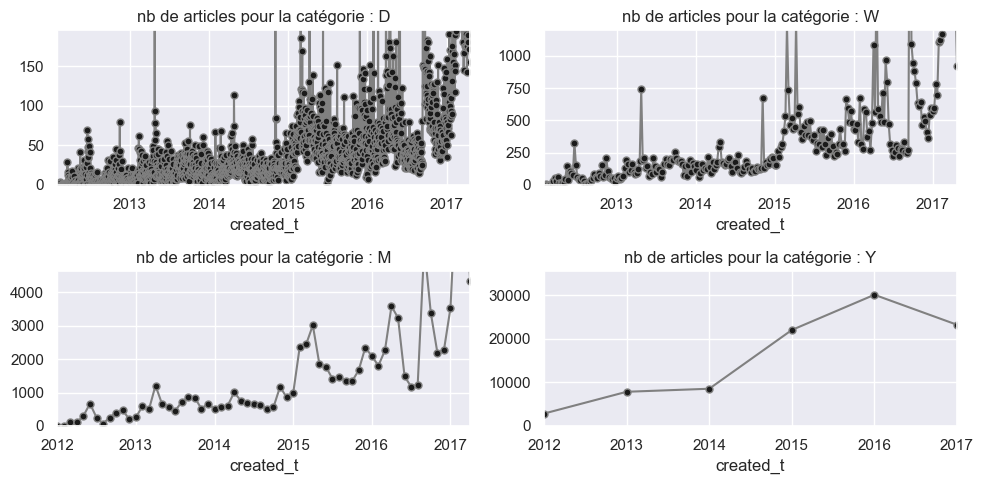

In [985]:
# # Convertir "last_modified_t" en index de date et heure
# df['last_modified_t'] = pd.to_datetime(df['last_modified_t'], unit='s')
# df.set_index('last_modified_t', inplace=True)
# Vérifier si "last_modified_t" existe dans le dataframe
df_f2 = df.copy()
# if 'last_modified_t' in df.columns:
#     # Vérifier si "last_modified_t" a besoin d'être converti en datetime index
#     if not pd.api.types.is_datetime64_any_dtype(df['last_modified_t']):
#         df_f1['last_modified_t'] = pd.to_datetime(df['last_modified_t'], unit='s')

#     # Vérifier si la colonne "last_modified_t" est l'index du dataframe
#     if 'last_modified_t' not in df.index.names:
#         df_f1.set_index('last_modified_t', inplace=True)
# else:
df_f2['created_t'] = pd.to_datetime(df['created_t'], unit='s')
df_f2.set_index('created_t', inplace=True)
# print(df_f1['last_modified_t'])
# Tracer le nombre de nouveaux éléments au fil du temps
fig = plt.figure(figsize=(10,5))  # Créer une figure
for i,per in enumerate(['D', 'W', 'M', 'Y'],1):  # Itérer sur les fréquences de temps (Jour, Semaine, Mois, Année)
    ax = fig.add_subplot(2,2,i)  # Ajouter un sous-plot à la figure
    t_ser = df_f2.groupby(pd.Grouper(freq=per)).size()  # Grouper les données par période de temps (fréquence) et calculer la taille de chaque groupe
    t_ser.plot(ax=ax, ms=5, marker='o', mfc='k', color='grey', ls='-')  # Tracer les données sur le sous-plot
    ax.set(ylim=(0,np.mean(t_ser)+2*np.std(t_ser)))  # Définir la limite verticale des données
    ax.set_title("nb de articles pour la catégorie : "+per)  # Définir le titre du sous-plot
fig.tight_layout()  # Ajuster la disposition des sous-plots
plt.show()  # Afficher la figure



In [986]:
df_f1

,code,url,creator,created_t,created_datetime,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g
1,0000000024600,http://world-fr.openfoodfacts.org/produit/0000000024600/filet-de-boeuf,date-limite-app,1434530704,2015-06-17T08:45:04Z,1434535914,Filet de bœuf,2.46 kg,plastique,plastique,NaN,Filet-de-boeuf,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite complétée,Caractéristiques à compléter,Catégories complétées,Marques à compléter,Emballage complété,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",Filet-de-boeuf,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.46 kg,NaN,g
2,0000000027205,http://world-fr.openfoodfacts.org/produit/0000000027205,tacinte,1458238630,2016-03-17T18:17:10Z,1458238638,NaN,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit à compléter,Photos à valider,Photos envoyées",NaN,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
3,0000000039259,http://world-fr.openfoodfacts.org/produit/0000000039259/twix-x2,tacinte,1422221773,2015-01-25T21:36:13Z,1473538082,Twix x2,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit complete,Photos à envoyer",NaN,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
4,0000005200016,http://world-fr.openfoodfacts.org/produit/0000005200016/lentilles-vertes-bertrand-lejeune,sigoise,1441186657,2015-09-02T09:37:37Z,1442570752,lentilles vertes,1 kg,Sachet plastique,plastique,Bertrand Lejeune,"Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Légumineuses et dérivés,Légumineuses,Graines,Graines de légumineuses,Légumes secs,Lentilles,Lentilles vertes","Bio,Bio européen,AB Agriculture Biologique",France,lentilles vertes,NaN,0.0,[ lentilles-vertes -> fr:lentilles-vertes ] [ lentilles -> fr:lentilles ],NaN,NaN,0.0,0.0,NaN,Cereals and potatoes,Legumes,"A compléter,Informations

In [987]:
df

,code,url,creator,created_t,created_datetime,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g
1,0000000024600,http://world-fr.openfoodfacts.org/produit/0000000024600/filet-de-boeuf,date-limite-app,1434530704,2015-06-17T08:45:04Z,1434535914,Filet de bœuf,2.46 kg,plastique,plastique,NaN,Filet-de-boeuf,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite complétée,Caractéristiques à compléter,Catégories complétées,Marques à compléter,Emballage complété,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",Filet-de-boeuf,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.46 kg,NaN,g
2,0000000027205,http://world-fr.openfoodfacts.org/produit/0000000027205,tacinte,1458238630,2016-03-17T18:17:10Z,1458238638,NaN,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit à compléter,Photos à valider,Photos envoyées",NaN,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
3,0000000039259,http://world-fr.openfoodfacts.org/produit/0000000039259/twix-x2,tacinte,1422221773,2015-01-25T21:36:13Z,1473538082,Twix x2,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit complete,Photos à envoyer",NaN,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
4,0000005200016,http://world-fr.openfoodfacts.org/produit/0000005200016/lentilles-vertes-bertrand-lejeune,sigoise,1441186657,2015-09-02T09:37:37Z,1442570752,lentilles vertes,1 kg,Sachet plastique,plastique,Bertrand Lejeune,"Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Légumineuses et dérivés,Légumineuses,Graines,Graines de légumineuses,Légumes secs,Lentilles,Lentilles vertes","Bio,Bio européen,AB Agriculture Biologique",France,lentilles vertes,NaN,0.0,[ lentilles-vertes -> fr:lentilles-vertes ] [ lentilles -> fr:lentilles ],NaN,NaN,0.0,0.0,NaN,Cereals and potatoes,Legumes,"A compléter,Informations

la colonne existe dans le dataframe
les colonnes df 
Index(['code', 'url', 'creator', 'created_t', 'created_datetime',
       'last_modified_t', 'product_name', 'quantity_original', 'packaging',
       'packaging_tags', 'brands', 'categories_fr', 'labels_fr',
       'countries_fr', 'ingredients_text', 'allergens', 'additives_n',
       'additives', 'additives_tags', 'additives_fr',
       'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr',
       'pnns_groups_1', 'pnns_groups_2', 'states_fr', 'main_category_fr',
       'image_url', 'image_small_url', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g',
       'quantity_origine', 'quantity', 'quantity_unit'],
      dtype='object')
0       2016-09-17 09:18:13
1       2015-06-17 10:11:54
2       2016-03-17 18:17:18
3       2016-09-10 20:08:02
4       2015-09

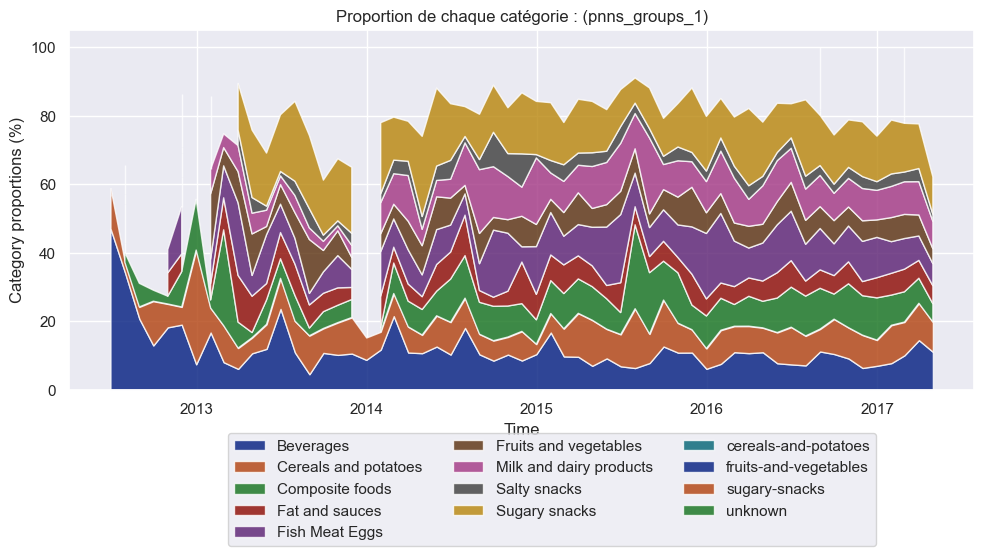

In [989]:
# Plotting proportion of pnns1 among newly entered items
# # Charger les données
# df = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned6.csv')
# df
pnns1_n_item_prop = plot_cat_prop_thr_time(df, 'pnns_groups_1')

plt.show()



In [990]:
df

,code,url,creator,created_t,created_datetime,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,2016-09-17 09:18:13,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g
1,0000000024600,http://world-fr.openfoodfacts.org/produit/0000000024600/filet-de-boeuf,date-limite-app,1434530704,2015-06-17T08:45:04Z,2015-06-17 10:11:54,Filet de bœuf,2.46 kg,plastique,plastique,NaN,Filet-de-boeuf,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite complétée,Caractéristiques à compléter,Catégories complétées,Marques à compléter,Emballage complété,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",Filet-de-boeuf,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.46 kg,NaN,g
2,0000000027205,http://world-fr.openfoodfacts.org/produit/0000000027205,tacinte,1458238630,2016-03-17T18:17:10Z,2016-03-17 18:17:18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit à compléter,Photos à valider,Photos envoyées",NaN,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
3,0000000039259,http://world-fr.openfoodfacts.org/produit/0000000039259/twix-x2,tacinte,1422221773,2015-01-25T21:36:13Z,2016-09-10 20:08:02,Twix x2,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit complete,Photos à envoyer",NaN,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
4,0000005200016,http://world-fr.openfoodfacts.org/produit/0000005200016/lentilles-vertes-bertrand-lejeune,sigoise,1441186657,2015-09-02T09:37:37Z,2015-09-18 10:05:52,lentilles vertes,1 kg,Sachet plastique,plastique,Bertrand Lejeune,"Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Légumineuses et dérivés,Légumineuses,Graines,Graines de légumineuses,Légumes secs,Lentilles,Lentilles vertes","Bio,Bio européen,AB Agriculture Biologique",France,lentilles vertes,NaN,0.0,[ lentilles-vertes -> fr:lentilles-vertes ] [ lentilles -> fr:lentilles ],NaN,NaN,0.0,0.0,NaN,Cereals a

In [991]:
# calculating regression for the proportion on new items
# for each pnns1 category through time

reg_pnns1_prop = mult_reg_thr_time(pnns1_n_item_prop)
reg_pnns1_prop

,Beverages,Cereals and potatoes,Composite foods,Fat and sauces,Fish Meat Eggs,Fruits and vegetables,Milk and dairy products,Salty snacks,Sugary snacks,cereals-and-potatoes,fruits-and-vegetables,sugary-snacks,unknown
coef,-0.006212,0.017494,-0.016957,0.006723,-0.017258,0.003650,0.002314,-0.000235,-0.002327,-0.000290,-0.002683,0.000619,0.015163
intercept,11.137072,6.542056,11.915888,5.373832,12.071651,6.386293,9.112150,2.881620,14.641745,0.077882,1.246106,0.623053,17.990654
mean,10.574873,8.125274,10.381265,5.982226,10.509843,6.716594,9.321601,2.860328,14.431138,0.051615,1.003281,0.679080,19.362881


In [992]:
df

,code,url,creator,created_t,created_datetime,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,2016-09-17 09:18:13,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g
1,0000000024600,http://world-fr.openfoodfacts.org/produit/0000000024600/filet-de-boeuf,date-limite-app,1434530704,2015-06-17T08:45:04Z,2015-06-17 10:11:54,Filet de bœuf,2.46 kg,plastique,plastique,NaN,Filet-de-boeuf,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite complétée,Caractéristiques à compléter,Catégories complétées,Marques à compléter,Emballage complété,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",Filet-de-boeuf,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.46 kg,NaN,g
2,0000000027205,http://world-fr.openfoodfacts.org/produit/0000000027205,tacinte,1458238630,2016-03-17T18:17:10Z,2016-03-17 18:17:18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit à compléter,Photos à valider,Photos envoyées",NaN,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
3,0000000039259,http://world-fr.openfoodfacts.org/produit/0000000039259/twix-x2,tacinte,1422221773,2015-01-25T21:36:13Z,2016-09-10 20:08:02,Twix x2,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit complete,Photos à envoyer",NaN,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
4,0000005200016,http://world-fr.openfoodfacts.org/produit/0000005200016/lentilles-vertes-bertrand-lejeune,sigoise,1441186657,2015-09-02T09:37:37Z,2015-09-18 10:05:52,lentilles vertes,1 kg,Sachet plastique,plastique,Bertrand Lejeune,"Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Légumineuses et dérivés,Légumineuses,Graines,Graines de légumineuses,Légumes secs,Lentilles,Lentilles vertes","Bio,Bio européen,AB Agriculture Biologique",France,lentilles vertes,NaN,0.0,[ lentilles-vertes -> fr:lentilles-vertes ] [ lentilles -> fr:lentilles ],NaN,NaN,0.0,0.0,NaN,Cereals a

In [993]:
pnns1_n_item_prop

pnns_groups_1,Beverages,Cereals and potatoes,Composite foods,Fat and sauces,Fish Meat Eggs,Fruits and vegetables,Milk and dairy products,Salty snacks,Sugary snacks,cereals-and-potatoes,fruits-and-vegetables,sugary-snacks,unknown
last_modified_t,,,,,,,,,,,,,
2012-04-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.000000
2012-05-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.000000,NaN,NaN,NaN,NaN
2012-06-30,47.058824,11.764706,NaN,NaN,NaN,5.882353,NaN,NaN,11.764706,NaN,NaN,NaN,23.529412
2012-07-31,34.285714,2.857143,2.857143,2.857143,11.428571,2.857143,8.571429,NaN,25.714286,NaN,NaN,NaN,8.571429
2012-08-31,20.689655,3.448276,6.896552,NaN,3.448276,31.034483,10.344828,3.448276,20.689655,NaN,NaN,NaN,NaN
2012-09-30,12.903226,12.903226,3.225806,NaN,16.129032,6.451613,6.451613,3.225806,19.354839,NaN,NaN,NaN,19.354839
2012-10-31,18.181818,6.818182,2.272727,6.818182,6.818182,NaN,4.545455,NaN,6.818182,NaN,2.272727,NaN,45.454545
2012-11-30,18.965517,5.172414,10.344828,5.172414,13.793103,8.620690,6.896552,1.724138,15.517241,NaN,NaN,NaN,13.793103
2012-12-31,7.407407,33.333333,14.814815,NaN,3.703704,7.407407,11.111111,3.703704,7.407407,NaN,3.703704,NaN,7.407407


In [994]:
pnns1_n_item_prop = pnns1_n_item_prop.fillna(0).round(2)
pnns1_n_item_prop = pnns1_n_item_prop.drop('unknown', axis=1, inplace=True)



In [995]:
pnns1_n_item_prop 


In [996]:
reg_pnns1_prop = mult_test(data_df = pnns1_n_item_prop, test_func = 'stat',
                           res_df=reg_pnns1_prop, print_opt=True)

           Beverages  Cereals and potatoes  Composite foods  Fat and sauces  \
coef      -0.006212   0.017494             -0.016957         0.006723         
intercept  11.137072  6.542056              11.915888        5.373832         
mean       10.574873  8.125274              10.381265        5.982226         

           Fish Meat Eggs  Fruits and vegetables  Milk and dairy products  \
coef      -0.017258        0.003650               0.002314                  
intercept  12.071651       6.386293               9.112150                  
mean       10.509843       6.716594               9.321601                  

           Salty snacks  Sugary snacks  cereals-and-potatoes  \
coef      -0.000235     -0.002327      -0.000290               
intercept  2.881620      14.641745      0.077882               
mean       2.860328      14.431138      0.051615               

           fruits-and-vegetables  sugary-snacks    unknown  
coef      -0.002683               0.000619       0.01516

la colonne existe dans le dataframe
les colonnes df 
Index(['code', 'url', 'creator', 'created_t', 'created_datetime',
       'last_modified_t', 'product_name', 'quantity_original', 'packaging',
       'packaging_tags', 'brands', 'categories_fr', 'labels_fr',
       'countries_fr', 'ingredients_text', 'allergens', 'additives_n',
       'additives', 'additives_tags', 'additives_fr',
       'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr',
       'pnns_groups_1', 'pnns_groups_2', 'states_fr', 'main_category_fr',
       'image_url', 'image_small_url', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g',
       'quantity_origine', 'quantity', 'quantity_unit'],
      dtype='object')
0       2016-09-17 09:18:13
1       2015-06-17 10:11:54
2       2016-03-17 18:17:18
3       2016-09-10 20:08:02
4       2015-09

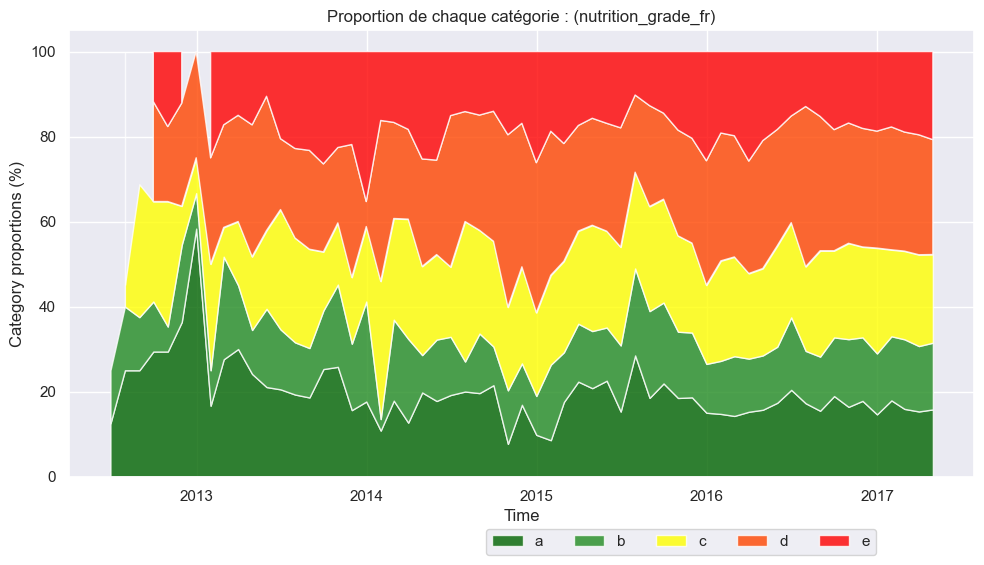

,a,b,c,d,e
coef,-0.04,-0.00,0.01,0.02,0.01
intercept,83.46,10.58,1.73,2.05,2.18
mean,47.98,9.29,11.41,18.56,12.76


In [997]:
# plotting graph, calculating regression and testing for stationarity

nutri_pal = ['darkgreen', 'forestgreen', 'yellow', 'orangered', 'red']

nutrig_n_item_prop = plot_cat_prop_thr_time(df,'nutrition_grade_fr', palette=nutri_pal,
                                            ncol=5)
# nutrig_n_item_prop = nutrig_n_item_prop.fillna(0).round(2)
# print ("*****************      nutrig_n_item_prop                     : ")
# print(nutrig_n_item_prop)
# reg_nutrig_prop = mult_reg_thr_time(nutrig_n_item_prop)
# reg_nutrig_prop = reg_nutrig_prop.fillna(0).round(2)
# print("**************         reg_nutrig_prop                     : ")
# print(reg_nutrig_prop)
# reg_nutrig_prop = reg_nutrig_prop.fillna(0).round(2)
# reg_nutrig_prop = mult_test(data_df=nutrig_n_item_prop, res_df=reg_nutrig_prop,
#                             test_func='stat', print_opt=False)
print(" apres mult_test,       ************         reg_nutrig_prop                     : ")
print(reg_nutrig_prop)
plt.show()
reg_nutrig_prop




**Nutriscore**

In [998]:
unique_quantities = data['quantity'].unique()
print(unique_quantities)

[1000.0 nan 0.0 75.0 19.0 150.0 330.0 880.0 900.0 600.0 792.0 660.0 500.0
 980.0 100.0 200.0 130.0 180.0 90.0 80.0 65.0 400.0 350.0 740.0 250.0
 320.0 950.0 254.0 148.0 60.0 175.0 370.0 56.0 230.0 473.0 300.0 204.0
 244.0 115.0 125.0 275.0 240.0 496.0 750.0 530.0 560.0 165.0 475.0 280.0
 120.0 355.0 700.0 992.0 220.0 78.0 365.0 22.0 439.0 50.0 245.0 37.0 454.0
 141.0 42.0 680.0 170.0 1130.0 140.0 425.0 380.0 340.0 227.0 111.0 198.0
 119.0 521.0 360.0 10.0 113.0 397.0 226.0 408.0 265.0 255.0 270.0 135.0
 908.0 260.0 282.0 1750.0 450.0 850.0 213.0 276.0 189.0 38.0 796.0 375.0
 725.0 26.0 640.0 52.0 206.0 890.0 2000.0 283.0 316.0 40.0 30.0 36.0 160.0
 368.0 45.0 35.0 54.0 480.0 138.0 114.0 15.0 32.0 592.0 800.0 438.0 510.0
 207.0 47.0 585.0 650.0 565.0 187.0 540.0 225.0 455.0 453.0 7.0 410.0 72.0
 303.0 765.0 1360.0 354.0 110.0 169.0 290.0 522.0 192.0 642.0 289.0 308.0
 613.0 167.0 118.0 1.0 358.0 766.0 620.0 718.0 580.0 830.0 876.0 875.0
 584.0 514.0 763.0 819.0 132.0 136.0 126.0 543.0 2

In [999]:
#counts = data['nutrition_grade_fr'].value_counts()
counts = data['nutrition_grade_fr'].value_counts(dropna=False)

print(counts)


NaN    35957
d      16177
c      12633
e      11073
a      9808 
b      8837 
Name: nutrition_grade_fr, dtype: int64


In [1000]:
# Regrouper les données par nutriscore et calculer la somme et le pourcentage
nutriscore_sum = data.groupby('nutrition_grade_fr').sum()
nutriscore_percent = (nutriscore_sum / nutriscore_sum.sum()) * 100

# Afficher les résultats
print("Somme de chaque nutriscore:")
print(nutriscore_sum)
print("Pourcentage de chaque nutriscore:")
print(nutriscore_percent)


Somme de chaque nutriscore:
                         created_t  additives_n  ingredients_from_palm_oil_n  \
nutrition_grade_fr                                                             
a                   14155508467359  5830.0       35.0                          
b                   12800593940847  10347.0      95.0                          
c                   18283071410283  17550.0      425.0                         
d                   23437329073766  25183.0      1016.0                        
e                   16049341501662  17470.0      1320.0                        

                    ingredients_that_may_be_from_palm_oil_n  energy_100g  \
nutrition_grade_fr                                                         
a                   459.0                                    7052101.5     
b                   668.0                                    4781692.0     
c                   1327.0                                   10882470.0    
d                   2457.0     

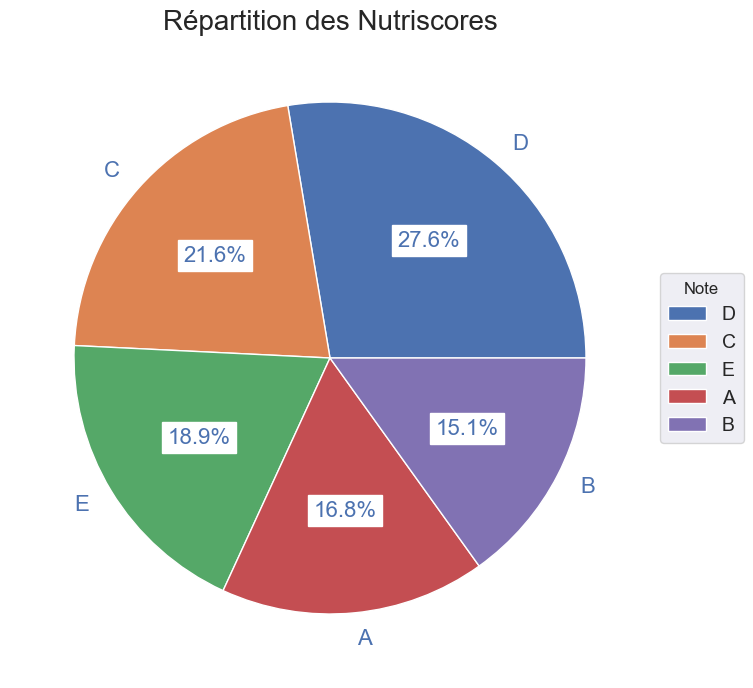

In [1001]:
# Création d'une figure avec une taille de 8x8 pouces
plt.figure(figsize=(8,8))

chaine = 'Répartition des Nutriscores'
# Ajout d'un titre à la figure
plt.title(chaine, size=20)

# Création d'un graphique en camembert en utilisant les valeurs de la colonne "nutrition_grade_fr"
# Les étiquettes de chaque part sont en majuscules
# Le pourcentage de chaque part est affiché avec une décimale
# Les propriétés du texte sont définies pour une taille de police de 16, une couleur de police bleue et un fond blanc
wedges, texts, autotexts = plt.pie(data.nutrition_grade_fr.value_counts().values, 
        labels = data.nutrition_grade_fr.value_counts().index.str.upper(),
       autopct='%1.1f%%', textprops={'fontsize': 16, 
                                     'color' : 'b', 
                                     'backgroundcolor' : 'w',}
       )

# Récupération des axes de la figure
ax = plt.gca()

# Ajout d'une légende aux graphiques en camembert
# Les étiquettes des parts sont en majuscules et ont un titre "Note"
# La légende est centrée à gauche
# La taille de police est définie à 14
# La boîte qui entoure la légende est ajustée pour ne pas chevaucher les graphiques en camembert
ax.legend(wedges, data.nutrition_grade_fr.value_counts().index.str.upper(),
          title="Note",
          loc="center left",
          fontsize=14,
          bbox_to_anchor=(1, 0, 0.5, 1))
save_figure_opt(chaine,"Repartition_Distribution_par_variable", library='matplotlib')

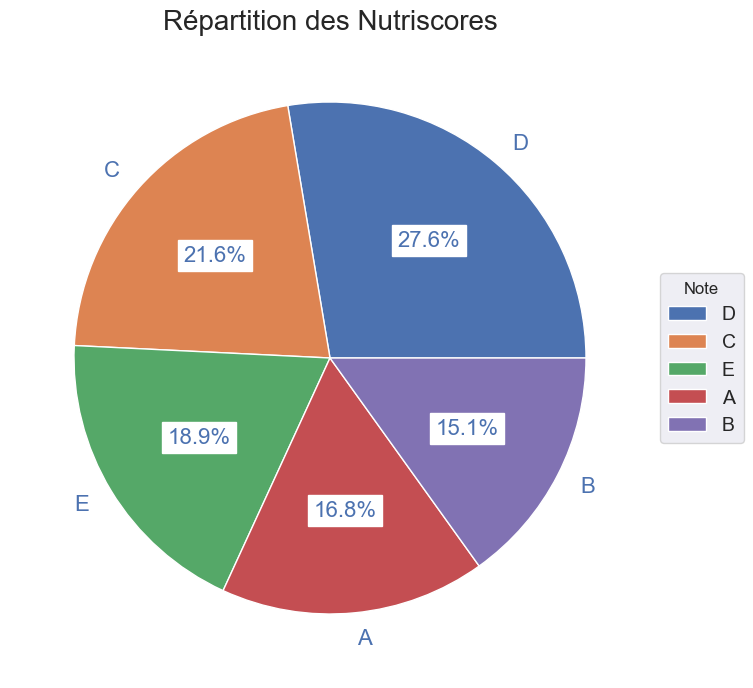

In [1002]:
# Création d'une figure avec une taille de 8x8 pouces
plt.figure(figsize=(8,8))

chaine = 'Répartition des Nutriscores'
# Ajout d'un titre à la figure
plt.title(chaine, size=20)

# Création d'un graphique en camembert en utilisant les valeurs de la colonne "nutrition_grade_fr"
# Les étiquettes de chaque part sont en majuscules
# Le pourcentage de chaque part est affiché avec une décimale
# Les propriétés du texte sont définies pour une taille de police de 16, une couleur de police bleue et un fond blanc
wedges, texts, autotexts = plt.pie(data.nutrition_grade_fr.value_counts().values, 
        labels = data.nutrition_grade_fr.value_counts().index.str.upper(),
       autopct='%1.1f%%', textprops={'fontsize': 16, 
                                     'color' : 'b', 
                                     'backgroundcolor' : 'w',}
       )

# Récupération des axes de la figure
ax = plt.gca()

# Ajout d'une légende aux graphiques en camembert
# Les étiquettes des parts sont en majuscules et ont un titre "Note"
# La légende est centrée à gauche
# La taille de police est définie à 14
# La boîte qui entoure la légende est ajustée pour ne pas chevaucher les graphiques en camembert
ax.legend(wedges, data.nutrition_grade_fr.value_counts().index.str.upper(),
          title="Note",
          loc="center left",
          fontsize=14,
          bbox_to_anchor=(1, 0, 0.5, 1))

# Appel de la fonction save_figure_opt pour sauvegarder la figure
save_figure_opt(chaine,chaine)


In [1003]:
#provenance des url

In [1004]:
# Récupération de l'ensemble des noms de domaine à partir de l'url de chaque entrée
data.url.dropna().apply(lambda x: str(x).split('/')[2]).unique()

array(['world-fr.openfoodfacts.org'], dtype=object)

Ce code permet de récupérer les noms de domaine uniques à partir de la colonne "url" du dataframe "data".

- data.url : sélectionne la colonne "url" du dataframe "data".
- .dropna() : supprime les valeurs manquantes de la colonne "url".
- .apply(lambda x: str(x).split('/')[2]) : applique une fonction lambda à chaque élément de la colonne "url", qui extrait le nom de domaine en séparant la chaîne de caractères selon le caractère "/". Le 3ème élément correspond au nom de domaine.
- .unique() : renvoie un tableau numpy des noms de domaine uniques.

In [1005]:
# Extraction de noms de domaines uniques à partir d'une colonne 'image_url' non vide
# en appliquant la fonction split pour obtenir la troisième partie de chaque URL qui est le nom de domaine.
# Ensuite, on applique la méthode unique pour obtenir la liste des noms de domaines uniques.

data.image_url.dropna().apply(lambda x: str(x).split('/')[2]).unique()


array(['fr.openfoodfacts.org'], dtype=object)

Ce code permet de récupérer les noms de domaine uniques à partir de la colonne "image_url" du dataframe "data".

- data.image_url : Sélectionne la colonne "image_url" du dataframe "data".

- .dropna() : Exclut toutes les valeurs manquantes (NaN) dans la colonne "image_url".

- .apply(lambda x: str(x).split('/')[2]) : Applique une fonction lambda à chaque valeur de la colonne "image_url" pour extraire le nom de domaine. La fonction lambda divise chaque URL par les "/", puis sélectionne le troisième élément (qui est le nom de domaine) et renvoie une chaîne de caractères.

- .unique() : Retourne une liste de tous les noms de domaine uniques extraits des URLs des images, sans doublons.

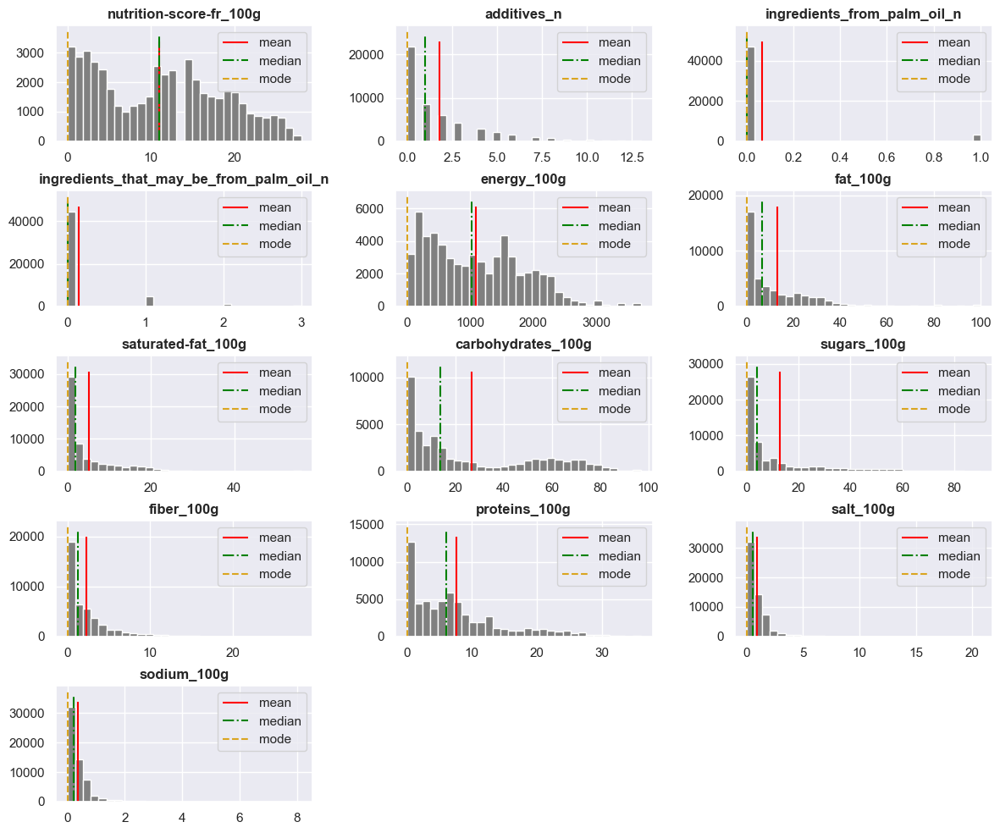

In [1006]:
# Plotting histograms of the main quantitative continuous columns

# -- reordering columns
quant_cols = ['nutrition-score-fr_100g', 'additives_n', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g']

fig = plt.figure(figsize=(12,10))

# for i, ax, c in enumerate(zip(fig.ravel(), sorted(quant_cols))):
for i, c in enumerate(quant_cols,1):
    ax = fig.add_subplot(5,3,i)
    ax.hist(df[c],  bins=30, color='grey')
    ax.set_title(c)
    ax.vlines(df[c].mean(), *ax.get_ylim(),  color='red', ls='-', lw=1.5)
    ax.vlines(df[c].median(), *ax.get_ylim(), color='green', ls='-.', lw=1.5)
    ax.vlines(df[c].mode()[0], *ax.get_ylim(), color='goldenrod', ls='--', lw=1.5)
    ax.legend(['mean', 'median', 'mode'])
    ax.title.set_fontweight('bold')
    
# plt.tight_layout(w_pad=4.5, h_pad=-1)
plt.tight_layout(w_pad=2, h_pad=0.65)
# plt.gcf().set_size_inches(16,7)

plt.show()

## 2.3 Évolution des caractéristiques quantitatives 
Voyons maintenant si nous pouvons mettre en évidence des changements dans certaines des principales caractéristiques quantitatives. Nous tracerons une moyenne mobile des caractéristiques dans le temps.

In [1007]:
df

,code,url,creator,created_t,created_datetime,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,2016-09-17 09:18:13,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g
1,0000000024600,http://world-fr.openfoodfacts.org/produit/0000000024600/filet-de-boeuf,date-limite-app,1434530704,2015-06-17T08:45:04Z,2015-06-17 10:11:54,Filet de bœuf,2.46 kg,plastique,plastique,NaN,Filet-de-boeuf,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite complétée,Caractéristiques à compléter,Catégories complétées,Marques à compléter,Emballage complété,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",Filet-de-boeuf,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.46 kg,NaN,g
2,0000000027205,http://world-fr.openfoodfacts.org/produit/0000000027205,tacinte,1458238630,2016-03-17T18:17:10Z,2016-03-17 18:17:18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit à compléter,Photos à valider,Photos envoyées",NaN,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
3,0000000039259,http://world-fr.openfoodfacts.org/produit/0000000039259/twix-x2,tacinte,1422221773,2015-01-25T21:36:13Z,2016-09-10 20:08:02,Twix x2,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit complete,Photos à envoyer",NaN,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
4,0000005200016,http://world-fr.openfoodfacts.org/produit/0000005200016/lentilles-vertes-bertrand-lejeune,sigoise,1441186657,2015-09-02T09:37:37Z,2015-09-18 10:05:52,lentilles vertes,1 kg,Sachet plastique,plastique,Bertrand Lejeune,"Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Légumineuses et dérivés,Légumineuses,Graines,Graines de légumineuses,Légumes secs,Lentilles,Lentilles vertes","Bio,Bio européen,AB Agriculture Biologique",France,lentilles vertes,NaN,0.0,[ lentilles-vertes -> fr:lentilles-vertes ] [ lentilles -> fr:lentilles ],NaN,NaN,0.0,0.0,NaN,Cereals a

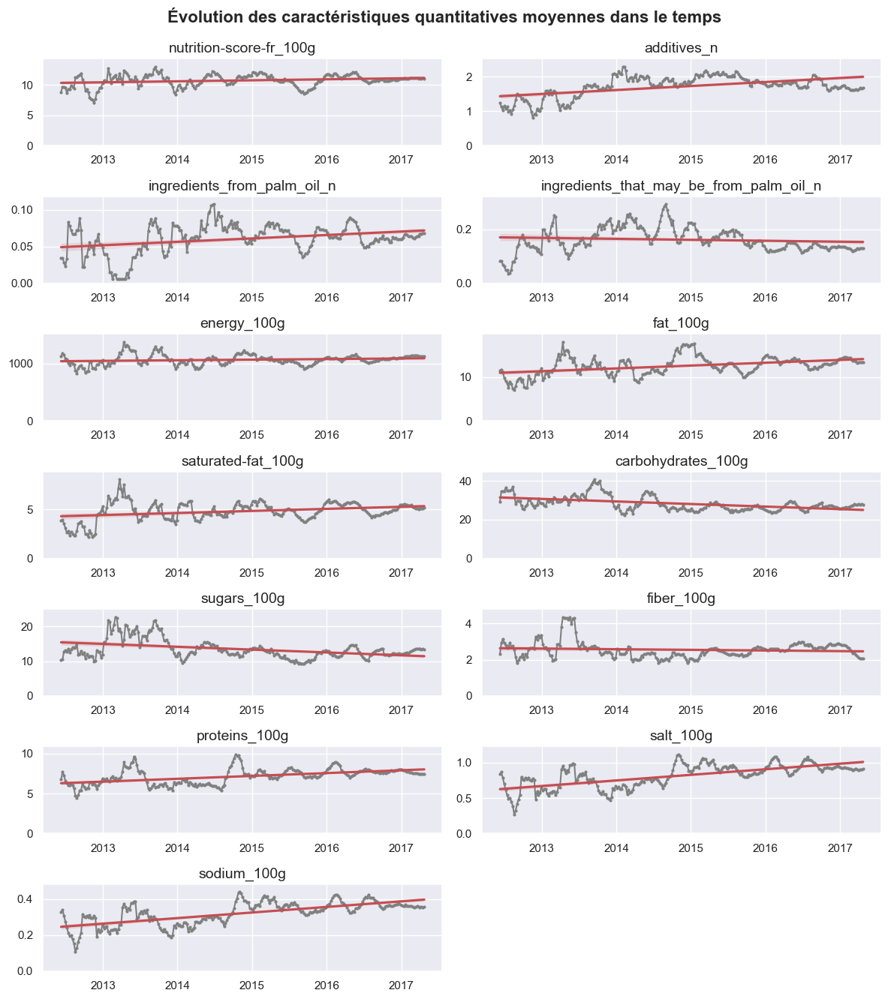

In [1008]:
# Plotting evolution of the mean of main quantitative features
# in newly entered items through time (aggregated on weeks )
import matplotlib.dates as mdates
col_100g =  ['nutrition-score-fr_100g', 'additives_n', 'ingredients_from_palm_oil_n',
             'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
             'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
             'proteins_100g', 'salt_100g', 'sodium_100g']

df_100g_thr_time = df.set_index('last_modified_t').sort_index()[col_100g]
df_100g_thr_time.index = pd.to_datetime(df_100g_thr_time.index, unit='s')
df_100g_thr_time = df_100g_thr_time.resample('W').mean()
dates = mdates.date2num(df_100g_thr_time.index)

fig = plt.figure(figsize=(12,14))

for i, c in enumerate(col_100g,1):
    ax = fig.add_subplot(7,2,i)
    y_roll = df_100g_thr_time[c].fillna(df_100g_thr_time[c].median()).rolling(10).mean().values
    plt.plot_date(dates, y_roll, ls='-', markersize=2, lw=1.5, color='grey')
    sns.regplot(dates, y_roll, marker='None', color='r', ax= ax)
    ax.set(ylim=(0,np.nanmax(y_roll)*1.1))
    ax.set_title(c, fontsize=14)
plt.tight_layout(rect=[0, 0.03, 1, 0.96])
fig.suptitle("Évolution des caractéristiques quantitatives moyennes dans le temps",
             fontweight='bold', fontsize=16)
plt.show()



A partir de ces graphiques, nous pouvons émettre l'hypothèse que le nombre moyen d'additifs et d'ingrédients issus de l'huile de palme est en hausse, et baisse aprés 2017.

Testons ces hypothèses.

In [1009]:
def adf_kpss_test(df, columns, ref_column):
    result = pd.DataFrame(columns=['ADF Statistic', 'p-value', 'KPSS Statistic', 'p-value'],
                          index=columns)
    for col in columns:
        adf_result = adfuller(df[col])
        kpss_result = kpss(df[col], regression='c')
        result.loc[col, 'ADF Statistic'] = adf_result[0]
        result.loc[col, 'p-value'] = adf_result[1]
        result.loc[col, 'KPSS Statistic'] = kpss_result[0]
        result.loc[col, 'p-value'] = kpss_result[1]
    adf_result = adfuller(df[ref_column])
    for col in columns:
        kpss_result = kpss(df[ref_column] - df[col], regression='c', nlags=int(np.ceil(3 * np.sqrt(len(df)))))
        result.loc[col, 'ADF Statistic (diff)'] = adf_result[0]
        result.loc[col, 'p-value (diff)'] = adf_result[1]
        result.loc[col, 'KPSS Statistic (diff)'] = kpss_result[0]
        result.loc[col, 'p-value (diff)'] = kpss_result[1]
    return result


In [1010]:
print ("Test colonne reférence nutrition-score-fr_100g" ) 
df = df.dropna(subset=['additives_n', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n',
                       'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
                       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g','energy_100g'])

resultats_tests = adf_kpss_test(df, ['additives_n', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n',
                                     'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
                                     'proteins_100g', 'salt_100g', 'sodium_100g'], 'nutrition-score-fr_100g')
print(resultats_tests)
print ("Test colonne reférence energy_100g" ) 
df = df.dropna(subset=['additives_n', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n',
                       'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
                       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g','energy_100g'])

resultats_tests = adf_kpss_test(df, ['additives_n', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n',
                                     'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
                                     'proteins_100g', 'salt_100g', 'sodium_100g'], 'energy_100g')
print(resultats_tests)


Test colonne reférence nutrition-score-fr_100g
                                        ADF Statistic   p-value  \
additives_n                             -18.822268     0.038998   
ingredients_from_palm_oil_n             -13.282349     0.01       
ingredients_that_may_be_from_palm_oil_n -25.948516     0.044819   
fat_100g                                -16.735718     0.041728   
saturated-fat_100g                      -17.670348     0.01       
carbohydrates_100g                      -15.119101     0.016157   
sugars_100g                             -14.312917     0.01       
fiber_100g                              -21.131398     0.01       
proteins_100g                           -18.230711     0.051063   
salt_100g                               -20.332235     0.1        
sodium_100g                             -20.332257     0.1        

                                        KPSS Statistic   p-value  \
additives_n                              0.511847       0.038998   
ingredients_

une explication pour chaque colonne du tableau :

- La colonne "Test" indique le nom de la variable testée dans l'analyse.

- La colonne "ADF Statistic" correspond au résultat du test ADF (Augmented Dickey-Fuller) qui permet de vérifier si une série temporelle est stationnaire ou non. Plus la valeur de ce test est négative, plus il y a de chances que la série temporelle soit stationnaire.

- La colonne "p-value (ADF)" correspond à la valeur de p associée au test ADF. Elle indique si la série temporelle est stationnaire ou non en fonction d'un seuil de significativité. Si la valeur de p est inférieure au seuil de significativité (par exemple, 0,05), on peut rejeter l'hypothèse nulle selon laquelle la série temporelle n'est pas stationnaire.

- La colonne "KPSS Statistic" correspond au résultat du test KPSS (Kwiatkowski-Phillips-Schmidt-Shin) qui permet de vérifier si une série temporelle est stationnaire ou non. Plus la valeur de ce test est positive, plus il y a de chances que la série temporelle ne soit pas stationnaire.

- La colonne "p-value (KPSS)" correspond à la valeur de p associée au test KPSS. Elle indique si la série temporelle est stationnaire ou non en fonction d'un seuil de significativité. Si la valeur de p est inférieure au seuil de significativité (par exemple, 0,05), on peut rejeter l'hypothèse nulle selon laquelle la série temporelle est stationnaire.

- La colonne "ADF Statistic (diff)" correspond au résultat du test ADF (Augmented Dickey-Fuller) après avoir différencié la série temporelle. La différenciation consiste à soustraire chaque observation de la précédente. Ce test est utilisé pour vérifier si la série temporelle différenciée est stationnaire.

- La colonne "p-value (diff)" correspond à la valeur de p associée au test ADF après différenciation de la série temporelle. Elle indique si la série temporelle différenciée est stationnaire ou non en fonction d'un seuil de significativité.

- La colonne "KPSS Statistic (diff)" correspond au résultat du test KPSS après différenciation de la série temporelle. Ce test est utilisé pour vérifier si la série temporelle différenciée est stationnaire.

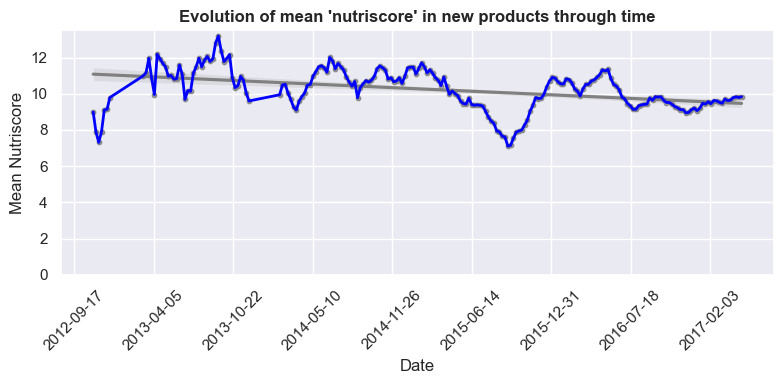

In [1011]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.dates as mdates
from statsmodels.tsa.stattools import adfuller, kpss

# # créer un DataFrame fictif avec la variable 'nutrition-score-fr_100g' et 'last_modified_t'
# df = pd.DataFrame({'nutrition-score-fr_100g': np.random.randn(1000)*10 + 50,
#                    'last_modified_t': pd.date_range(start='2022-01-01', periods=1000)})

# regrouper les données par semaine et calculer la moyenne
df_weekly = df.set_index('last_modified_t').resample('W').mean()

# définir les dates en format numérique
dates = mdates.date2num(df_weekly.index)

# calculer la moyenne mobile sur une fenêtre de 10 semaines
y_roll = df_weekly['nutrition-score-fr_100g'].rolling(window=10).mean().values

# créer la figure et l'axe
fig, ax = plt.subplots(figsize=(8, 4))

# tracer la courbe et la droite de régression
sns.regplot(x=dates, y=y_roll, color='grey', ax=ax, scatter_kws={'s': 10})
sns.lineplot(x=dates, y=y_roll, color='blue', ax=ax, lw=2)

# définir les titres et les limites des axes
ax.set_title("Evolution of mean 'nutriscore' in new products through time", fontweight='bold')
ax.set_xlabel('Date')
ax.set_ylabel('Mean Nutriscore')
ax.set_ylim(bottom=0)

# formater les dates en axe des x
date_format = mdates.DateFormatter('%Y-%m-%d')
ax.xaxis.set_major_formatter(date_format)
plt.xticks(rotation=45)

# afficher la figure
plt.tight_layout()
plt.show()


La valeur moyenne du nutriscore a tendance à baisser (vers des aliments plus sains) avec le temps.

In [1012]:
data.head(1)

,code,url,creator,created_t,created_datetime,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g


**Additifs**

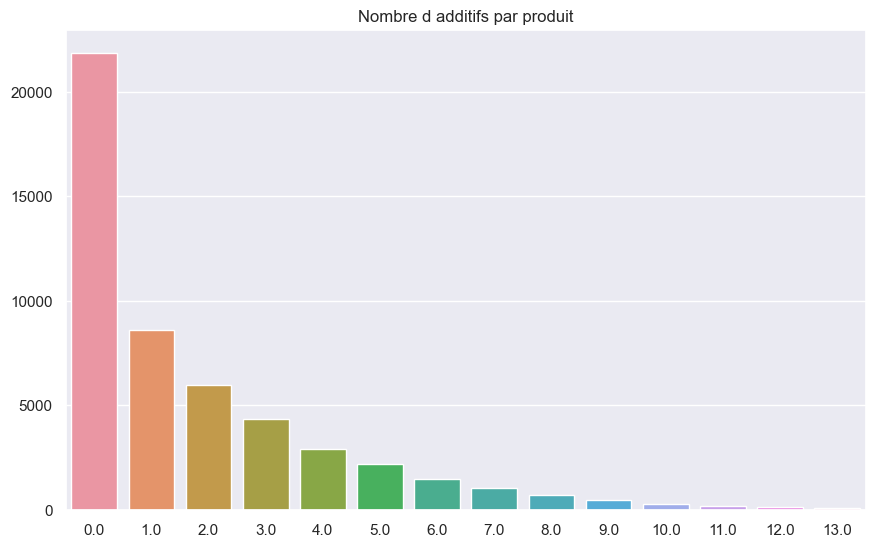

In [1013]:
# Crée une figure de taille 10x6
plt.figure(figsize=(10,6))

# Donne un titre à la figure
chaine = 'Nombre d additifs par produit'
plt.title(chaine)
 
# Trace un diagramme en barres avec les nombres d'additifs sur l'axe x et leur fréquence sur l'axe y
sns.barplot(x = data.additives_n.value_counts().index,
           y = data.additives_n.value_counts().values )

# Affiche la figure
save_figure_opt(chaine,chaine, library='matplotlib')
#plt.show()


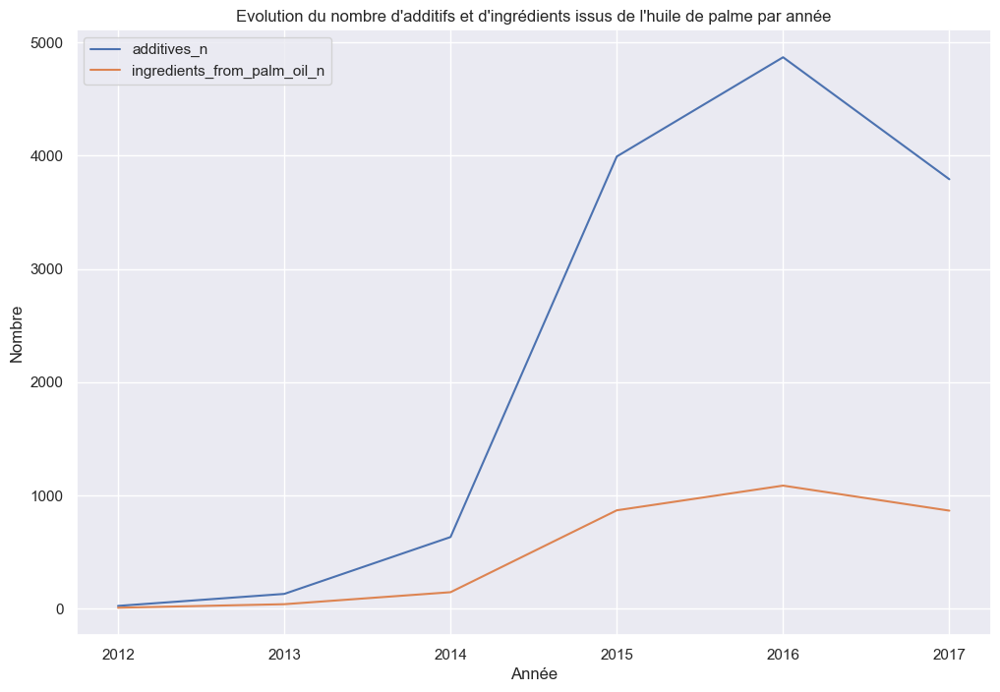

In [1016]:
# Charger les données
df_g = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')

# Nettoyer la colonne 'product_name'
df_g['product_name'] = df_g['product_name'].astype(str).apply(lambda x: re.sub('[^A-Za-z0-9]+', '', x))

# Filtrer les lignes avec des valeurs non numériques dans la colonne 'last_modified_t'
df_g = df_g[pd.to_numeric(df_g['last_modified_t'], errors='coerce').notnull()]

# Convertir la colonne 'last_modified_t' en année
df_g['annee'] = pd.to_datetime(df_g['last_modified_t'], unit='s').dt.year

# Filtrer les produits avec des noms incohérents
df_g = df_g[df_g['product_name'].str.len() > 0]

# Sélectionner les colonnes d'intérêt
cols = ['product_name', 'additives_n', 'ingredients_from_palm_oil_n']

# Grouper les données par produit et par année, et compter le nombre d'additifs et d'ingrédients issus de l'huile de palme pour chaque groupe
additifs_palme_par_produit_par_annee = df_g.groupby(['product_name', 'annee'])[cols].sum()

# # Sélectionner les données pour les produits contenant de l'huile de palme
# additifs_palme_par_produit_par_annee = additifs_palme_par_produit_par_annee[additifs_palme_par_produit_par_annee['ingredients_from_palm_oil_n'] > 0]
additifs_palme_par_produit_par_annee = additifs_palme_par_produit_par_annee[(additifs_palme_par_produit_par_annee['ingredients_from_palm_oil_n'] > 0) & (additifs_palme_par_produit_par_annee['additives_n'] > 0)]

# Afficher l'évolution du nombre d'additifs et d'ingrédients issus de l'huile de palme par année
additifs_palme_par_produit_par_annee.groupby('annee')[['additives_n', 'ingredients_from_palm_oil_n']].sum().plot(kind='line', figsize=(12, 8), title='Evolution du nombre d\'additifs et d\'ingrédients issus de l\'huile de palme par année')
plt.xlabel('Année')
plt.ylabel('Nombre')
plt.show()


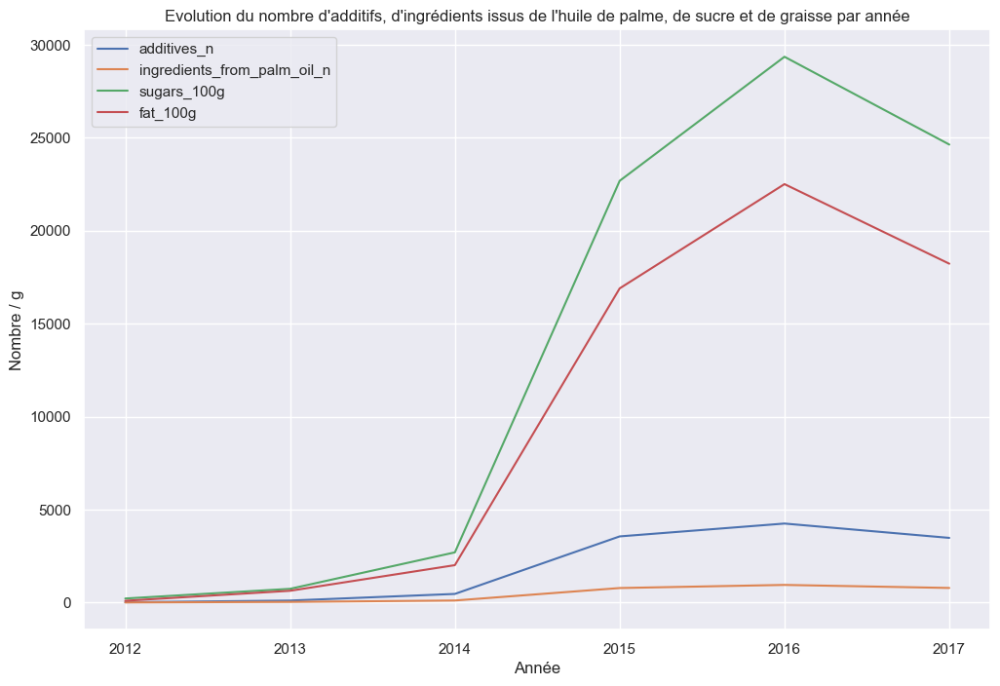

In [1017]:
# Charger les données
df_g = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')

# Nettoyer la colonne 'product_name'
df_g['product_name'] = df_g['product_name'].astype(str).apply(lambda x: re.sub('[^A-Za-z0-9]+', '', x))

# Filtrer les lignes avec des valeurs non numériques dans la colonne 'last_modified_t'
df_g = df_g[pd.to_numeric(df_g['last_modified_t'], errors='coerce').notnull()]

# Convertir la colonne 'last_modified_t' en année
df_g['annee'] = pd.to_datetime(df_g['last_modified_t'], unit='s').dt.year

# Filtrer les produits avec des noms incohérents
df_g = df_g[df_g['product_name'].str.len() > 0]

# Sélectionner les colonnes d'intérêt
cols = ['product_name', 'additives_n', 'ingredients_from_palm_oil_n', 'sugars_100g', 'fat_100g']

# Grouper les données par produit et par année, et compter le nombre d'additifs et d'ingrédients issus de l'huile de palme pour chaque groupe
additifs_palme_par_produit_par_annee = df_g.groupby(['product_name', 'annee'])[cols].sum()

# Sélectionner les données pour les produits contenant de l'huile de palme
# additifs_palme_par_produit_par_annee = additifs_palme_par_produit_par_annee[additifs_palme_par_produit_par_annee['ingredients_from_palm_oil_n'] > 0]
additifs_palme_par_produit_par_annee = additifs_palme_par_produit_par_annee[(additifs_palme_par_produit_par_annee['ingredients_from_palm_oil_n'] > 0) & (additifs_palme_par_produit_par_annee['additives_n'] > 0)& (additifs_palme_par_produit_par_annee['sugars_100g'] > 0)& (additifs_palme_par_produit_par_annee['fat_100g'] > 0)]

# Afficher l'évolution du nombre d'additifs, d'ingrédients issus de l'huile de palme, de sucre et de graisse par année
additifs_palme_par_produit_par_annee.groupby('annee')[['additives_n', 'ingredients_from_palm_oil_n', 'sugars_100g', 'fat_100g']].sum().plot(kind='line', figsize=(12, 8), title='Evolution du nombre d\'additifs, d\'ingrédients issus de l\'huile de palme, de sucre et de graisse par année')
plt.xlabel('Année')
plt.ylabel('Nombre / g')
plt.show()


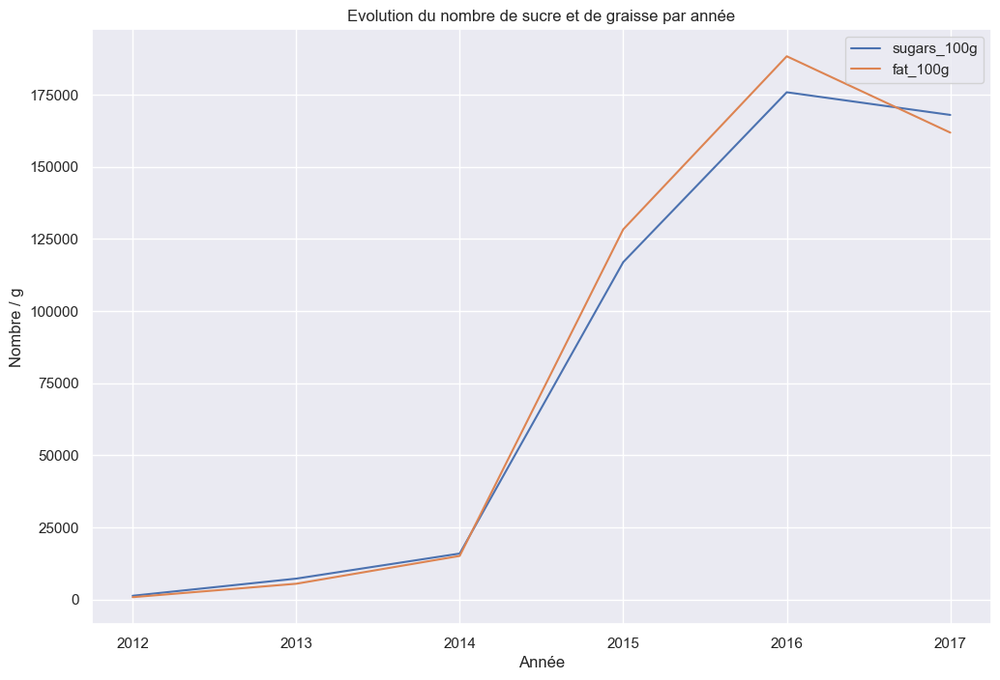

In [1018]:
# Charger les données
df_g = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')

# Nettoyer la colonne 'product_name'
df_g['product_name'] = df_g['product_name'].astype(str).apply(lambda x: re.sub('[^A-Za-z0-9]+', '', x))

# Filtrer les lignes avec des valeurs non numériques dans la colonne 'last_modified_t'
df_g = df_g[pd.to_numeric(df_g['last_modified_t'], errors='coerce').notnull()]

# Convertir la colonne 'last_modified_t' en année
df_g['annee'] = pd.to_datetime(df_g['last_modified_t'], unit='s').dt.year

# Filtrer les produits avec des noms incohérents
df_g = df_g[df_g['product_name'].str.len() > 0]

# Sélectionner les colonnes d'intérêt
cols = ['product_name', 'sugars_100g', 'fat_100g']

# Grouper les données par produit et par année, et compter le nombre d'additifs et d'ingrédients issus de l'huile de palme pour chaque groupe
additifs_palme_par_produit_par_annee = df_g.groupby(['product_name', 'annee'])[cols].sum()

# Sélectionner les données pour les produits contenant de l'huile de palmefat_100g
# additifs_palme_par_produit_par_annee = additifs_palme_par_produit_par_annee[additifs_palme_par_produit_par_annee['sugars_100g'] > 0]
additifs_palme_par_produit_par_annee = additifs_palme_par_produit_par_annee[(additifs_palme_par_produit_par_annee['sugars_100g'] > 0) & (additifs_palme_par_produit_par_annee['fat_100g'] > 0)]

# Afficher l'évolution du nombre d'additifs, d'ingrédients issus de l'huile de palme, de sucre et de graisse par année
additifs_palme_par_produit_par_annee.groupby('annee')[['sugars_100g', 'fat_100g']].sum().plot(kind='line', figsize=(12, 8), title='Evolution du nombre de sucre et de graisse par année')
plt.xlabel('Année')
plt.ylabel('Nombre / g')
plt.show()


product_name
nan                       43
Haricotsvertsextrafins    35
Huiledoliveviergeextra    34
Haricotsrouges            34
Framboises                31
Mayonnaise                30
Poischiches               29
Macdoinedelgumes          26
Eauminralenaturelle       25
Spaghetti                 25
Name: additives_n, dtype: int64


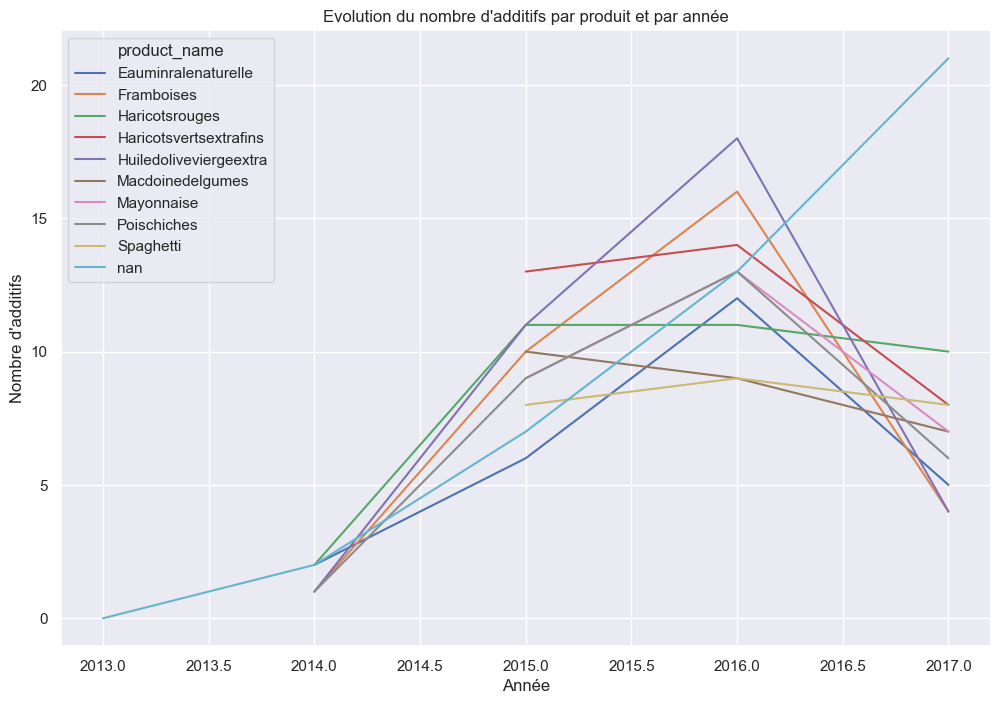

In [1019]:
# Charger les données
df_g = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned6.csv')

# df_g = pd.DataFrame(df_g).dropna()
# Convertir la colonne 'last_modified_t' en année
df_g['annee'] = pd.to_datetime(df_g['last_modified_t'], unit='s').dt.year
df_g['product_name'] = df_g['product_name'].astype(str).apply(lambda x: re.sub('[^A-Za-z0-9]+', '', x))

# Grouper les données par produit et compter le nombre d'additifs pour chaque groupe
additifs_par_produit = df_g.groupby(['product_name'])['additives_n'].count()

# Trier les produits par nombre d'additifs décroissant et afficher les 10 premiers
top_10_produits_additifs = additifs_par_produit.sort_values(ascending=False)[:10]
print(top_10_produits_additifs)

# Filtrer les données pour ne garder que les 10 produits avec le plus d'additifs
df_top_produits_additifs = df_g[df_g['product_name'].isin(top_10_produits_additifs.index)]

# Grouper les données par produit et par année, et compter le nombre d'additifs pour chaque groupe
additifs_par_produit_par_annee = df_top_produits_additifs.groupby(['product_name', 'annee'])['additives_n'].count()

# Afficher l'évolution du nombre d'additifs par produit et par année
additifs_par_produit_par_annee.unstack(level=0).plot(kind='line', figsize=(12, 8), title='Evolution du nombre d\'additifs par produit et par année')
plt.xlabel('Année')
plt.ylabel('Nombre d\'additifs')
plt.show()


In [1020]:
# import pandas as pd
# import matplotlib.pyplot as plt
# import re

# # Charger les données
# df_g = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned6.csv')

# # Enlever les lignes avec des valeurs manquantes (NaN)
# df_g = df_g.dropna(subset=['product_name', 'additives_n'])

# # Convertir la colonne 'last_modified_t' en année
# df_g['annee'] = pd.to_datetime(df_g['last_modified_t'], unit='s').dt.year

# # Remplacer les valeurs vides ou incohérentes par NaN
# df_g['product_name'] = df_g['product_name'].replace('', np.nan)
# df_g['product_name'] = df_g['product_name'].replace('nan', np.nan)

# # Enlever les lignes avec des valeurs manquantes (NaN)
# df_g = df_g.dropna(subset=['product_name'])

# # Nettoyer les noms de produits
# df_g['product_name'] = df_g['product_name'].astype(str).apply(lambda x: re.sub('[^A-Za-z0-9]+', '', x))

# # Grouper les données par produit et par année, et compter le nombre d'additifs pour chaque groupe
# additifs_par_produit_par_annee = df_g.groupby(['product_name', 'annee'])['additives_n'].count()

# # Afficher les 10 produits avec le plus grand nombre d'additifs
# top_10_additifs_produits = additifs_par_produit_par_annee.groupby('product_name').sum().sort_values(ascending=False)[:10]
# print(top_10_additifs_produits)

# # Afficher l'évolution du nombre d'additifs par produit et par année
# additifs_par_produit_par_annee.unstack(level=0).plot(kind='line', figsize=(12, 8), title='Evolution du nombre d\'additifs par produit et par année')
# plt.xlabel('Année')
# plt.ylabel('Nombre d\'additifs')
# plt.show()


In [1021]:

# Lister les valeurs uniques de la colonne "additives"
additives_uniques = df['additives_n'].unique()

# Afficher les valeurs uniques de la colonne "additives"
print(additives_uniques)


[  2.00   5.00  11.00   3.00   8.00  10.00   4.00   1.00   7.00   6.00
   0.00   9.00  12.00  13.00]


In [1022]:
data.columns.tolist

<bound method IndexOpsMixin.tolist of Index(['code', 'url', 'creator', 'created_t', 'created_datetime',
       'last_modified_t', 'product_name', 'quantity_original', 'packaging',
       'packaging_tags', 'brands', 'categories_fr', 'labels_fr',
       'countries_fr', 'ingredients_text', 'allergens', 'additives_n',
       'additives', 'additives_tags', 'additives_fr',
       'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr',
       'pnns_groups_1', 'pnns_groups_2', 'states_fr', 'main_category_fr',
       'image_url', 'image_small_url', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g',
       'quantity_origine', 'quantity', 'quantity_unit'],
      dtype='object')>

In [1023]:
#description des grandeurs

In [1024]:
data[['energy_100g',
      'fat_100g',
      'saturated-fat_100g',
      'carbohydrates_100g',
      'sugars_100g',
       'fiber_100g',
      'proteins_100g',
      'salt_100g',
      'sodium_100g',
      'nutrition-score-fr_100g']
    ].describe()
# data[['energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g']].describe().round(2)



,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g
count,61215.000000,44624.000000,59142.000000,43990.000000,59216.000000,43447.000000,60929.000000,59276.000000,59273.000000,48501.000000
mean,1097.777344,13.264717,5.092670,26.940748,12.814104,2.308993,7.569867,0.908622,0.357701,11.018557
std,760.136230,16.894569,7.321894,26.878361,18.119991,3.222569,7.157187,1.461779,0.575497,7.676746
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,423.000000,1.300000,0.300000,3.900000,1.000000,0.000000,1.800000,0.080000,0.031496,4.000000
50%,1023.000000,6.800000,1.900000,14.000000,4.000000,1.300000,6.000000,0.560000,0.220472,11.000000
75%,1632.000000,21.000000,7.100000,52.000000,16.500000,3.100000,10.900000,1.220000,0.480315,17.000000
max,3700.000000,100.000000,56.000000,96.900002,90.099998,28.299999,36.000000,20.700001,8.149607,28.000000


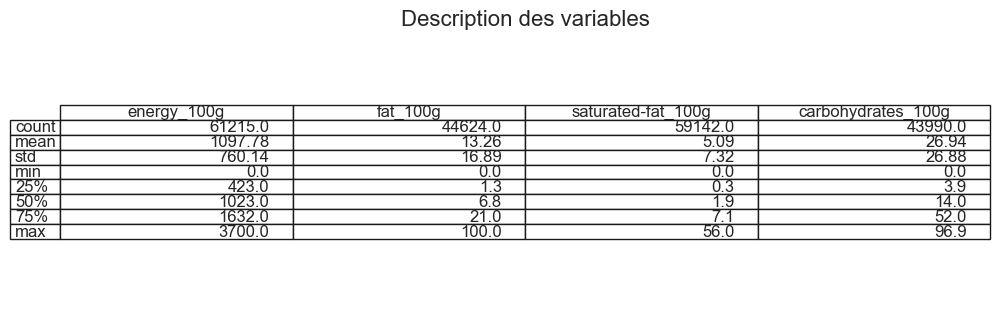

In [1025]:
save_table_opt(data[['energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g']].describe().round(2), "Description des variables", "description_variables.png")


# Question 3 

## Analyse Bivariée et multivarié

In [1026]:
# Charger les données
df = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')
df = df.fillna(0) # Remplacez les NaN par la valeur 0

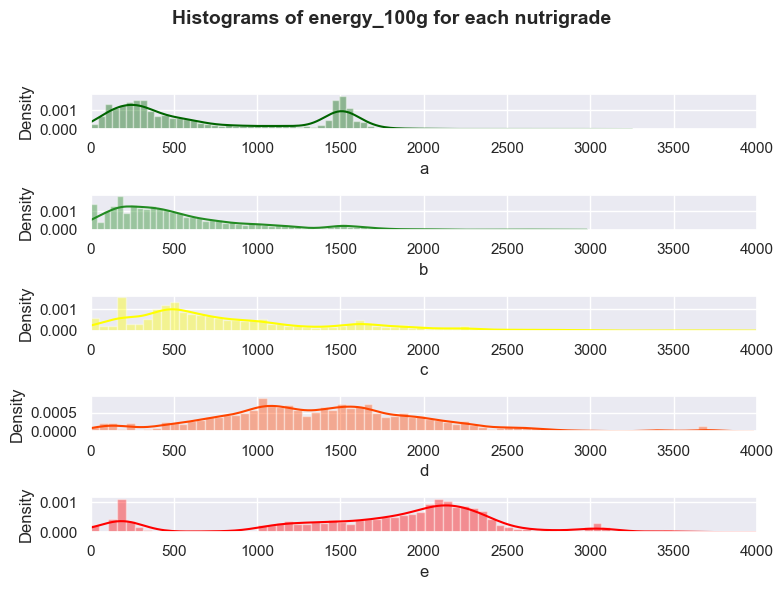

In [1027]:
# Selecting the nutriscore series of pnns2 categories to compare
nutri_pal = ['darkgreen', 'forestgreen', 'yellow', 'orangered', 'red']
gb = df.groupby('nutrition_grade_fr')['energy_100g']
nutrigr_df = pd.DataFrame([gb.get_group(n).values for n in list('abcde')],
                            index = list('abcde')).T

# Plotting histogram for each category

fig = plt.figure(figsize=(8,6))

i=0
for n, c in zip(list('abcde'), nutri_pal):
    i+=1
    ax = fig.add_subplot(5,1,i)
    sns.distplot(nutrigr_df[n], color=c, bins=70)
    ax.set(xlim=(0,4000))
fig.suptitle('Histograms of energy_100g for each nutrigrade',
             fontweight='bold', fontsize=14)
plt.tight_layout(rect=[0,0.0,1,0.93])
plt.show()

### Matrice de corrélation

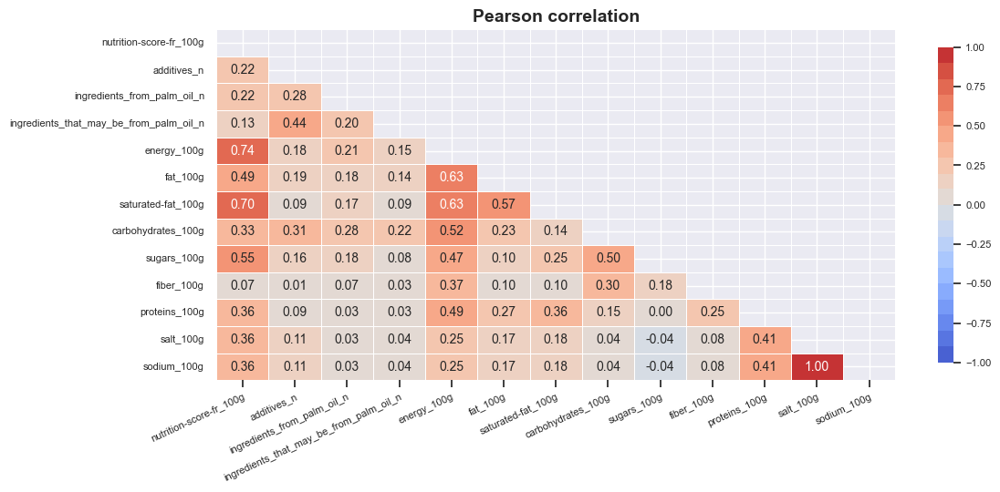

In [1028]:
# Importer les bibliothèques nécessaires
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Sélectionner les colonnes quantitatives
cols = quant_cols

# Calculer la corrélation de Pearson entre les colonnes quantitatives
pears_corr = df[cols].corr()

# Créer un heatmap de la corrélation de Pearson en utilisant la fonction plot_heatmap de seaborn
# La forme de la matrice de corrélation sera triangulaire, 
# pour éviter la redondance puisque la matrice de corrélation est symétrique
# Le titre du graphique est "Pearson correlation"
# La taille de la figure est de 12 pouces de largeur et 5 pouces de hauteur
plot_heatmap(pears_corr, shape='tri',
             title="Pearson correlation", figsize=(12,5))

# Afficher le graphique
plt.show()


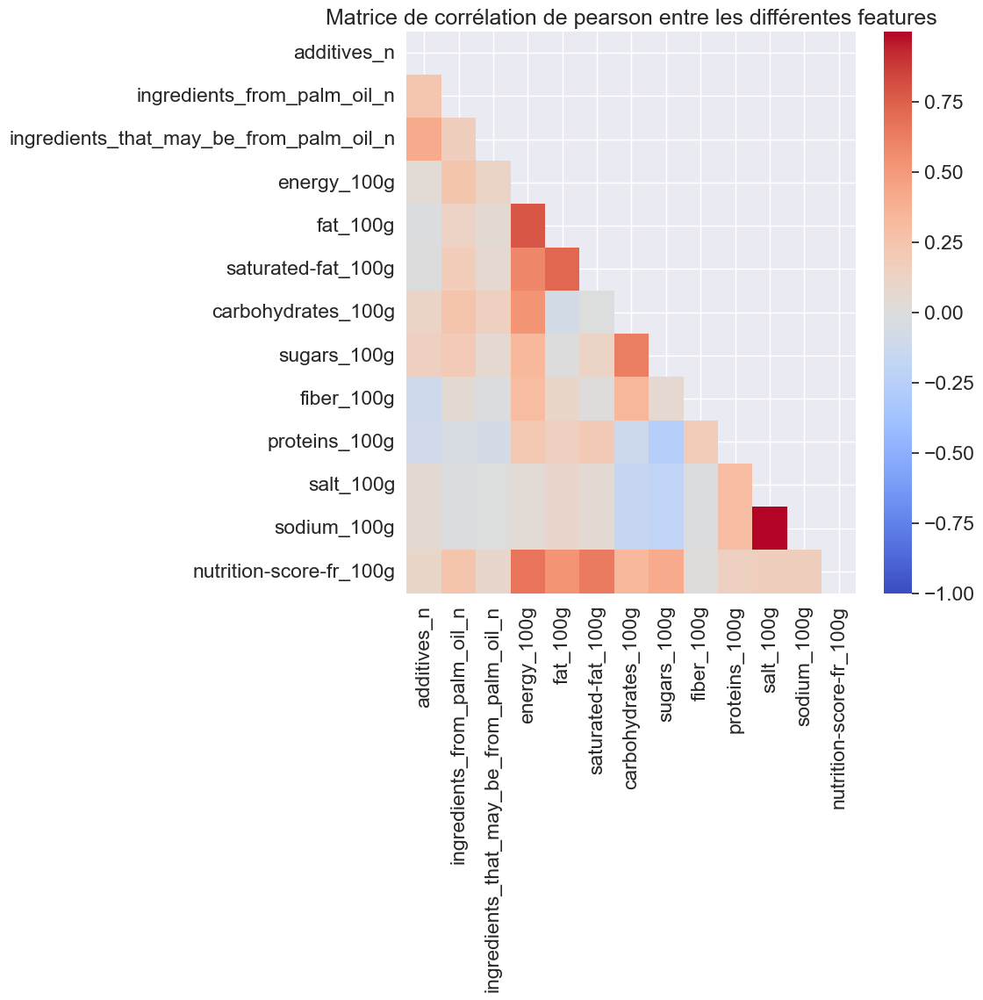

In [1029]:
# Crée une nouvelle figure avec une taille de 8 pouces de large et 8 pouces de hauteur
plt.figure(figsize=(8,8))

# Définit la taille de police pour les titres et les labels des graphiques
sns.set(font_scale=1.5)
chaine = 'Matrice de corrélation de pearson entre les différentes features'
# Définit le titre du graphique
plt.title(chaine )

# Calcule la matrice de corrélation de Pearson entre les colonnes numériques du dataframe
corr = data[numeric_columns].corr()

# Crée un masque pour masquer la partie supérieure de la matrice de corrélation
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True 

# Trace le heatmap de la matrice de corrélation avec une couleur allant du bleu foncé (valeurs négatives) au rouge foncé (valeurs positives) et avec le masque défini précédemment
ax = sns.heatmap(corr, mask=mask, vmin=-1, cmap='coolwarm')

# Affiche le graphique
save_figure_opt(chaine, chaine, library='matplotlib')
# plt.show()

# Réinitialise la taille de police pour les titres et les labels des graphiques
sns.set(font_scale=1)


### Suppression 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n' du graphique

In [1030]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def plot_corr_heatmap(data):
    # Crée une nouvelle figure avec une taille de 8 pouces de large et 8 pouces de hauteur
    plt.figure(figsize=(8,8))

    # Définit la taille de police pour les titres et les labels des graphiques
    sns.set(font_scale=1.5)
    chaine = 'Matrice de corrélation de pearson entre les différentes features'
    # Définit le titre du graphique
    plt.title(chaine )

    # Calcule la matrice de corrélation de Pearson entre les colonnes numériques du dataframe
    numeric_columns = data.select_dtypes(include=np.number).columns.tolist()
    numeric_columns.remove('ingredients_from_palm_oil_n')
    numeric_columns.remove('ingredients_that_may_be_from_palm_oil_n')
    corr = data[numeric_columns].corr()

    # Crée un masque pour masquer la partie supérieure de la matrice de corrélation
    mask = np.zeros_like(corr, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True 

    # Trace le heatmap de la matrice de corrélation avec une couleur allant du bleu foncé (valeurs négatives) au rouge foncé (valeurs positives) et avec le masque défini précédemment
    ax = sns.heatmap(corr, mask=mask, vmin=-1, cmap='coolwarm')

    # Affiche le graphique
    save_figure_opt(chaine, chaine, library='matplotlib')
    # plt.show()

    # Réinitialise la taille de police pour les titres et les labels des graphiques
    sns.set(font_scale=1)


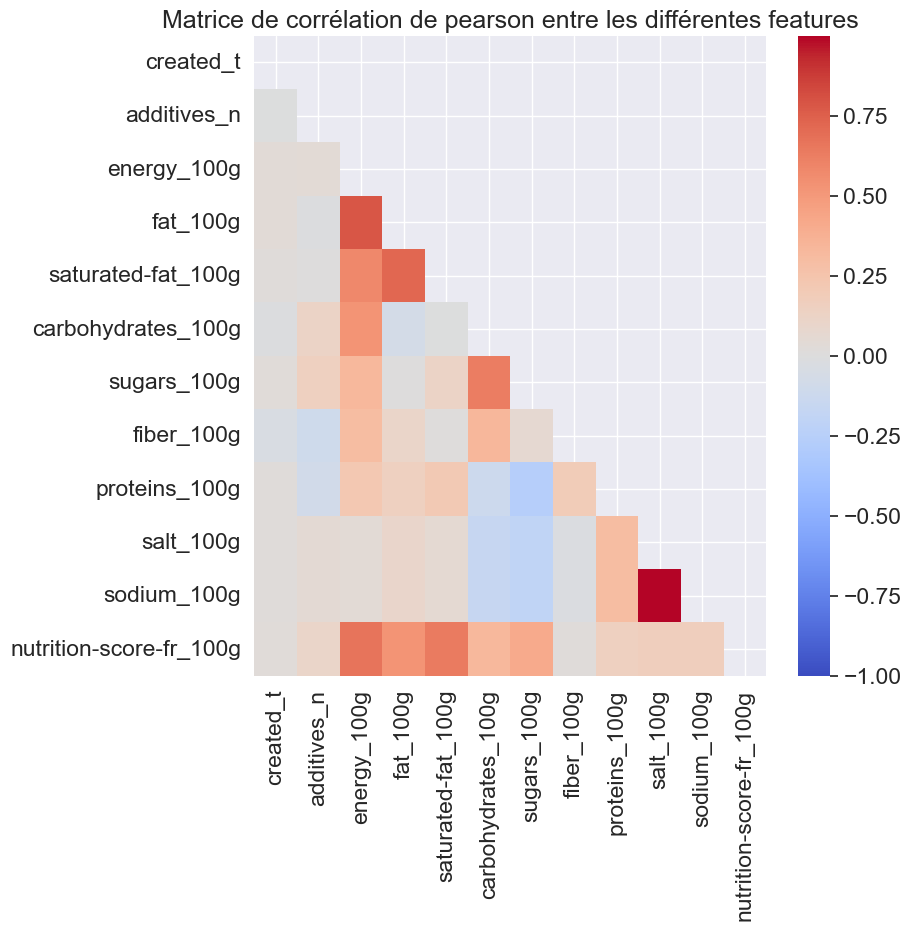

In [1031]:
plot_corr_heatmap(data)

Analyse du tableau : 

* additives_n : pas de correlation remarquable
* energy_100g : forte corrélation avec:
    * fat_100g
    * saturated-fat_100g
    * carbohydrates_100g
    * nutrition-score-fr_100g
* fat_100g et saturated-fat_100g fortement corrélés
* nutrition-score-fr_100g : forte corrélation avec:
    * saturated_fat_100g
    * energy_100g
    * fat_100g

* sugars_100g : forte correlation avec carbohydrates_100g

* sodium_100g correlation très forte avec salt_100g 

In [1032]:
object_columns = data.select_dtypes(include = ['object']).columns

In [1033]:
object_columns

Index(['code', 'url', 'creator', 'created_datetime', 'last_modified_t',
       'product_name', 'packaging', 'packaging_tags', 'brands',
       'ingredients_text', 'allergens', 'additives', 'additives_tags',
       'nutrition_grade_fr', 'pnns_groups_1', 'pnns_groups_2', 'image_url',
       'image_small_url', 'quantity'],
      dtype='object')

### Test du Chi 2 - Indépendance des variables

Même si les données ne suivent pas une distribution normale, préparons les opérations pour appliquer le test si c'était le cas, à but d'apprentissage

Le test du Chi-2 (ou test du khi-deux) est un test statistique qui permet de mesurer l'indépendance ou l'association entre deux variables qualitatives. Par conséquent, il est utilisé pour des variables qualitatives et non pour des variables quantitatives.

Le test du Chi-2 évalue la différence entre les fréquences observées et les fréquences attendues en fonction de l'hypothèse nulle selon laquelle les variables étudiées sont indépendantes. Si la valeur p est inférieure à un certain seuil prédéfini, généralement 0,05, ici 0.03, cela signifie que les variables ne sont pas indépendantes et qu'il y a une association significative entre elles.

In [1034]:
# from scipy.stats import chi2_contingency
# from scipy.stats import chi2
# def test_chi2(serie1, serie2):
    
#     alpha = 0.03    
    
#     #H0 : les variables sont indépendantes
    
#     #print('tableau de contingence :\n', pd.crosstab(serie1.array, serie2.array))
#     tab_contingence = pd.crosstab(serie1.array, serie2.array)
#     stat_chi2, p, dof, expected_table = chi2_contingency(tab_contingence.values)
#     print('chi2 : {0:.5f},\np : {0:.5f},\ndof : {0:.5f}\n'.format(stat_chi2, p, dof))
#     #print('tableau de contingence : \n', tab_contingence)
    
#     critical = chi2.ppf(1-alpha, dof) #
#     #print('critital : ', critical)

#     if p <= alpha:
#         print('Variables non indépendantes (H0 rejetée) car p = {} <= alpha = {}'.format(p, alpha))
#         return False
    
#     else:
#         print('H0 non rejetée car p = {} >= alpha = {}'.format(p, alpha))
#         return True

In [1035]:
# Importer les bibliothèques nécessaires pour réaliser un test de chi2
from scipy.stats import chi2_contingency
from scipy.stats import chi2

# Créer une fonction pour le test de chi2 entre deux séries
def test_chi2(serie1, serie2):
    
    # Définir le niveau de significativité
    alpha = 0.03    
    
    # Formuler l'hypothèse nulle : les variables sont indépendantes
    
    # Calculer le tableau de contingence à partir des deux séries
    tab_contingence = pd.crosstab(serie1.array, serie2.array)
    
    # Calculer les statistiques du test de chi2 à partir du tableau de contingence
    stat_chi2, p, dof, expected_table = chi2_contingency(tab_contingence.values)
    
    # Afficher les résultats du test
    print('chi2 : {0:.5f},\np : {0:.5f},\ndof : {0:.5f}\n'.format(stat_chi2, p, dof))
    
    # Calculer la valeur critique à partir du niveau de significativité et des degrés de liberté
    critical = chi2.ppf(1-alpha, dof)
    
    # Evaluer l'hypothèse nulle en comparant la valeur critique et la valeur p
    if p <= alpha:
        print('Variables non indépendantes (H0 rejetée) car p = {} <= alpha = {}'.format(p, alpha))
        return False
    
    else:
        print('H0 non rejetée car p = {} >= alpha = {}'.format(p, alpha))
        return True


In [1036]:
data.head(1)

,code,url,creator,created_t,created_datetime,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g


In [1037]:
#data.nunique().sort_values()

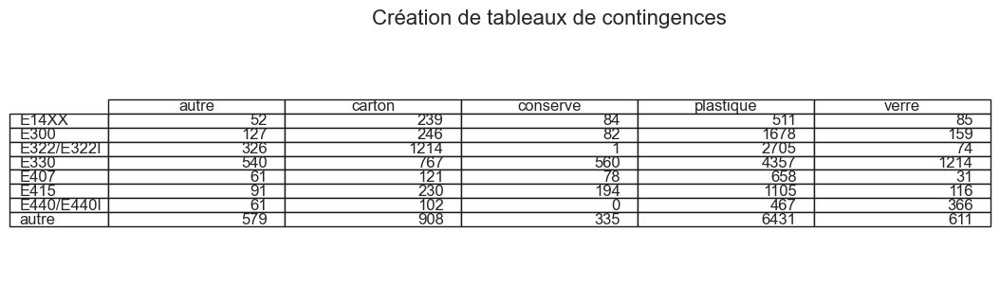

In [1038]:
pd.crosstab(data['additives_tags'], data['packaging_tags'])
save_table_opt(pd.crosstab(data['additives_tags'], data['packaging_tags']), "Création de tableaux de contingences", "crosstab.png")


In [1039]:
tags = data.columns[data.columns.str.contains('_tag')].tolist()

In [1040]:
tags

['packaging_tags', 'additives_tags']

In [1041]:
data[tags].sample(5)

,packaging_tags,additives_tags
4883,NaN,NaN
12022,NaN,NaN
92433,plastique,E330
60399,plastique,autre
34820,plastique,NaN


In [1042]:
data.select_dtypes(include = ['int8', 'float32','int32','float64']).columns

Index(['additives_n', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g'],
      dtype='object')

In [1043]:
import seaborn as sns
x = pd.cut(data['nutrition-score-fr_100g'], 20)
for column in data.select_dtypes(include = ['int8', 'float32','int32','float64']).columns:
    print('test d\'indépendance {} / {}'.format('nutriscore',column))
    if data[column].nunique() > 20 :
        y = pd.cut(data[column], 20).astype('category')
    else:
        y = data[column].astype('category')
    test_chi2(x, y)
    
    #table = pd.DataFrame({'nutriscore' : x, column : y})
    #print(table.sample(10))
    print('________________________________________________________________________________________________\n')

test d'indépendance nutriscore / additives_n
chi2 : 2165.14083,
p : 2165.14083,
dof : 2165.14083

Variables non indépendantes (H0 rejetée) car p = 3.7980965007495495e-303 <= alpha = 0.03
________________________________________________________________________________________________

test d'indépendance nutriscore / ingredients_from_palm_oil_n
chi2 : 2421.64459,
p : 2421.64459,
dof : 2421.64459

Variables non indépendantes (H0 rejetée) car p = 0.0 <= alpha = 0.03
________________________________________________________________________________________________

test d'indépendance nutriscore / ingredients_that_may_be_from_palm_oil_n
chi2 : 576.00170,
p : 576.00170,
dof : 576.00170

Variables non indépendantes (H0 rejetée) car p = 6.933223202412732e-87 <= alpha = 0.03
________________________________________________________________________________________________

test d'indépendance nutriscore / energy_100g
chi2 : 44044.81571,
p : 44044.81571,
dof : 44044.81571

Variables non indépendant

Le test du CHI2 conclut au rejet de l'hypothèse d'indépendance pour toutes nos variables: on peut donc conclure qu'il y a un lien entre la valeur du nutriscore et la valeur des variables

### Test ANOVA (Analyse de la variance) -  Indépendance des variables

**Test de Normalité**

Les variables quantitatives sont-elles de distribution normale?  (hypothèse à valider pour pouvoir appliquer le test d'indépendance par l'analyse de la variance ADOMA)

**A : test de normalité d'Agostino & Pearson**

In [1044]:
?stats.normaltest

In [1045]:
data[numeric_columns].head()

,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1000.0
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
4,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1000.0


In [1284]:
# Importation du module stats depuis la librairie scipy
from scipy import stats

# Sélection des colonnes numériques
numeric_columns = data.select_dtypes(include=['int8', 'float32', 'int32', 'float64']).columns
# On exclut la première colonne qui n'est pas numérique
numeric_columns = numeric_columns[1:]

# Pour chaque colonne numérique
for column in numeric_columns:
    # Affichage du nom de la colonne
    print('________\n{}'.format(column))
    
    # Calcul du test normalité de la colonne
    k2, p = stats.normaltest(data[column], axis=0, nan_policy='omit')
    
    # Définition du niveau de significativité
    alpha = 5e-2
    
    # Affichage de la valeur de p
    print("p = {:g}".format(p))
    
    # Test d'hypothèse sur la normalité de la colonne
    if p < alpha: # hypothèse nulle : x a une distribution normale
        print("H0 est rejetée : {} n'est pas de distribution normale".format(column))
    else:
        print("H0 ne peut être rejetée : {}, on considère l'hypothèse de normalité".format(column))


________
ingredients_from_palm_oil_n
p = 0
H0 est rejetée : ingredients_from_palm_oil_n n'est pas de distribution normale
________
ingredients_that_may_be_from_palm_oil_n
p = 0
H0 est rejetée : ingredients_that_may_be_from_palm_oil_n n'est pas de distribution normale
________
energy_100g
p = 0
H0 est rejetée : energy_100g n'est pas de distribution normale
________
fat_100g
p = 0
H0 est rejetée : fat_100g n'est pas de distribution normale
________
saturated-fat_100g
p = 0
H0 est rejetée : saturated-fat_100g n'est pas de distribution normale
________
carbohydrates_100g
p = 0
H0 est rejetée : carbohydrates_100g n'est pas de distribution normale
________
sugars_100g
p = 0
H0 est rejetée : sugars_100g n'est pas de distribution normale
________
fiber_100g
p = 0
H0 est rejetée : fiber_100g n'est pas de distribution normale
________
proteins_100g
p = 0
H0 est rejetée : proteins_100g n'est pas de distribution normale
________
salt_100g
p = 0
H0 est rejetée : salt_100g n'est pas de distribution 

On ne peut pas appliquer le test Anova car les variables ne sont pas de distribution normale

**B. Test de normalité Kolmogorov Smirnov**

In [1047]:
from scipy import stats
numeric_columns = data.select_dtypes(include = ['int8', 'float32','int32','float64']).columns
numeric_columns = numeric_columns[1:]

for column in numeric_columns:
    print('________\n{}'.format(column))
    D, p = stats.kstest(data[column].dropna(), 
                     'norm', 
                     args=(data[column].mean(), data[column].std()))
    alpha = 5e-2
    print("p = {}".format(p))
    if p < alpha:  # null hypothesis: x comes from a normal distribution
        print("The null hypothesis can be rejected : {} is not from a normal distribution".format(column))
    else:
        print("The null hypothesis cannot be rejected")

________
ingredients_from_palm_oil_n
p = 0.0
The null hypothesis can be rejected : ingredients_from_palm_oil_n is not from a normal distribution
________
ingredients_that_may_be_from_palm_oil_n
p = 0.0
The null hypothesis can be rejected : ingredients_that_may_be_from_palm_oil_n is not from a normal distribution
________
energy_100g
p = 0.0
The null hypothesis can be rejected : energy_100g is not from a normal distribution
________
fat_100g
p = 0.0
The null hypothesis can be rejected : fat_100g is not from a normal distribution
________
saturated-fat_100g
p = 0.0
The null hypothesis can be rejected : saturated-fat_100g is not from a normal distribution
________
carbohydrates_100g
p = 0.0
The null hypothesis can be rejected : carbohydrates_100g is not from a normal distribution
________
sugars_100g
p = 0.0
The null hypothesis can be rejected : sugars_100g is not from a normal distribution
________
fiber_100g
p = 0.0
The null hypothesis can be rejected : fiber_100g is not from a normal d

Le test de Kolmogorov Smirnov confirme la non normalité des distributions de données : on ne peut appliquer l'analyse de la variance

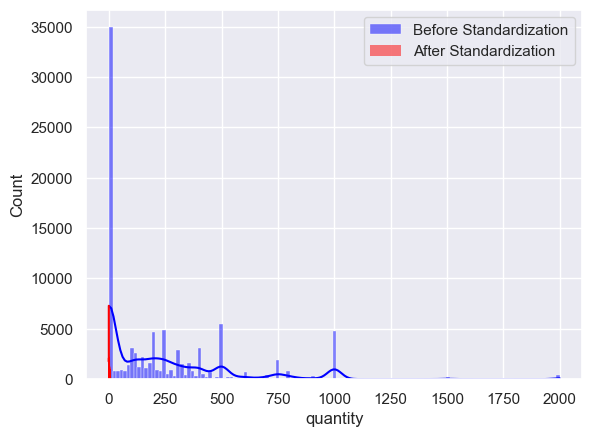

In [1280]:
from sklearn.preprocessing import StandardScaler
# Charger les données
data = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')
data_standardized = data.copy()
numeric_columns = data.select_dtypes(include=['int8', 'float32', 'int32', 'float64']).columns
numeric_columns = numeric_columns[1:]

scaler = StandardScaler()

# for column in numeric_columns:
#     data[column] = scaler.fit_transform(data[[column]].dropna().values.reshape(-1, 1))
# #     data[column] = scaler.fit_transform(data[[column]].dropna())
for column in numeric_columns:
    filled_column = data[column].fillna(data_standardized[column].mean())  # Remplace les valeurs manquantes par la moyenne
    data_standardized[column] = scaler.fit_transform(filled_column.values.reshape(-1, 1))



sns.histplot(data[column], kde=True, color='blue', label='Before Standardization')
sns.histplot(data_standardized[column], kde=True, color='red', label='After Standardization')
plt.legend()
plt.show()


**C. ANOVA : analyse de la variance**

Même si les données ne suivent pas une distribution normale, préparons les opérations pour appliquer le test si c'était le cas, à but d'apprentissage
Une standardisation a été fait pour entrevoir le mecanisme.

Il faut fournir en entrée au test les données pour chaque groupe, regardons un exemple d'application pour le nutrition grade et la feature salt_100g 

In [1281]:
data_anova= data_standardized.copy()
# data_anova= data.copy()
# Charger les données
# data_anova = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')
data_anova['nutrition_grade_fr'].dropna().unique().tolist()

['d', 'e', 'c', 'b', 'a']

In [1287]:
# Importer le module stats de la librairie scipy
from scipy import stats
# Charger les données
# data_anova = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')
# Sélectionner les variables numériques de chaque groupe de nutrition, en éliminant les valeurs manquantes
# pour chaque groupe de nutrition
data_a = data_anova[data_anova['nutrition_grade_fr'] == 'a'].select_dtypes(['int8', 'float32','int32','float64']).dropna(axis=0).dropna(axis=1)
data_b = data_anova[data_anova['nutrition_grade_fr'] == 'b'].select_dtypes(['int8', 'float32','int32','float64']).dropna(axis=0).dropna(axis=1)
data_c = data_anova[data_anova['nutrition_grade_fr'] == 'c'].select_dtypes(['int8', 'float32','int32','float64']).dropna(axis=0).dropna(axis=1)
data_d = data_anova[data_anova['nutrition_grade_fr'] == 'd'].select_dtypes(['int8', 'float32','int32','float64']).dropna(axis=0).dropna(axis=1)
data_e = data_anova[data_anova['nutrition_grade_fr'] == 'e'].select_dtypes(['int8', 'float32','int32','float64']).dropna(axis=0).dropna(axis=1)

# Calculer la statistique F et la p-valeur en utilisant la fonction f_oneway() de scipy.stats,
# qui prend les données de chaque groupe de nutrition en entrée
f_statistic, p = stats.f_oneway(
                                data_b,
                                data_c,
                                data_d,
                                data_e)


In [1288]:
pd.DataFrame({'features': data_b.columns.tolist(),
              'p' : p,
              'bool_test' : p<alpha}) #si p<alpha : on rejette l'hypothèse d'indépendance H0 : les variables ne sont pas indépendantes

,features,p,bool_test
0,additives_n,1.863953e-51,True
1,ingredients_from_palm_oil_n,1.041585e-196,True
2,ingredients_that_may_be_from_palm_oil_n,1.955488e-42,True
3,energy_100g,0.000000e+00,True
4,fat_100g,0.000000e+00,True
5,saturated-fat_100g,0.000000e+00,True
6,carbohydrates_100g,0.000000e+00,True
7,sugars_100g,0.000000e+00,True
8,fiber_100g,6.861876e-37,True
9,proteins_100g,3.962675e-93,True


Si il y a validation de l'hypothèse de normalité, enfin si c'est le cas, on pourrait interpréter les résultats comme suit : Toutes Les variables suivantes ont une distribution qui change en fonction des valeurs de nutrition_grade_fr (groupes de nutrition), ce qui suggère qu'il y a une relation entre ces variables et la notation de nutrition_grade_fr. Par conséquent, il est probable que les variables soient liées et qu'elles aient une certaine influence sur la notation de nutrition_grade_fr.

### Test de student d'indépendance

Hypothèses : 
* distributions normales => comme vu précédemment cette hypothèse n'est pas acceptable
* variance homogène => on va ramener la variance à 1 pour pouvoir appliquer le test de student

H0 : la moyenne de 2 échantillons de "salt_100g" est la même quel que soit le "nutrition grade" 


**de même que précédemment, le test n'est pas applicable faute d'hypothèse de normalité.**

In [1168]:
from sklearn.preprocessing import StandardScaler

In [1169]:
data['salt_100g'].dropna()

10       0.0100 
11       0.0030 
15       0.0254 
18       0.8000 
19       0.1000 
          ...   
94468    0.2900 
94469    10.0000
94475    0.6800 
94477    0.1000 
94481    0.0254 
Name: salt_100g, Length: 59276, dtype: float64

In [1170]:
scaler = StandardScaler(copy=True, with_mean=False, with_std=True)
a = data[['nutrition-score-fr_100g','salt_100g']].copy().dropna()
b = scaler.fit_transform(a['salt_100g'].values.reshape(-1,1))
a = a['nutrition-score-fr_100g']
a = scaler.fit_transform(a.values.reshape(-1,1))
alpha = 0.05

In [1171]:
t_stats, p = stats.ttest_ind(a, b)

In [1172]:
p < alpha

array([ True])

Si les distributions étaient normales, on pourrait rejetter l'hypothèse d'indépendance : la moyenne des échantillons de salt_100g est liée à la valeur de nutrition_grade

In [1173]:
data.columns
# for colonne in data.columns:
#     print('\n',colonne)
#     print('Qté Nan : ', round(data[colonne].isna().sum()/data[colonne].shape[0]*100), '%')
#     print('Uniques : ', data[colonne].nunique())

Index(['code', 'url', 'creator', 'created_t', 'created_datetime',
       'last_modified_t', 'product_name', 'quantity_original', 'packaging',
       'packaging_tags', 'brands', 'categories_fr', 'labels_fr',
       'countries_fr', 'ingredients_text', 'allergens', 'additives_n',
       'additives', 'additives_tags', 'additives_fr',
       'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr',
       'pnns_groups_1', 'pnns_groups_2', 'states_fr', 'main_category_fr',
       'image_url', 'image_small_url', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g',
       'quantity_origine', 'quantity', 'quantity_unit'],
      dtype='object')

In [1174]:
df.columns

Index(['code', 'url', 'creator', 'created_t', 'created_datetime',
       'last_modified_t', 'product_name', 'quantity_original', 'packaging',
       'packaging_tags', 'brands', 'categories_fr', 'labels_fr',
       'countries_fr', 'ingredients_text', 'allergens', 'additives_n',
       'additives', 'additives_tags', 'additives_fr',
       'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr',
       'pnns_groups_1', 'pnns_groups_2', 'states_fr', 'main_category_fr',
       'image_url', 'image_small_url', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g',
       'quantity_origine', 'quantity', 'quantity_unit'],
      dtype='object')

In [1175]:
# -- reordering columns
quant_cols =  ['nutrition-score-fr_100g','additives_n', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g']

In [1176]:
# Charger les données
df = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')

df = replace_nan(df)

In [1177]:
#La méthode inplace=True modifie l'objet DataFrame original et ne retourne donc pas de copie du DataFrame.
df.dropna(inplace=True)
df= df[df['nutrition_grade_fr'] != '0']
df = df.loc[dfz['nutrition_grade_fr'].notnull() & (df['nutrition_grade_fr'] != 0)]
df = df.reset_index(drop=True)

print(df['nutrition_grade_fr'].unique())
print(df['nutrition_grade_fr'].isna().sum())


['d' 'e' 'c' 'b' 'a']
0


In [1178]:
# df = df.loc[dfz['nutrition_grade_fr'].notnull() & (df['nutrition_grade_fr'] != 0)]
# df = df.loc[(df.select_dtypes(include=np.number).notnull()) & (df.select_dtypes(include=np.number) != 0).any(axis=1)]


In [1179]:
df.groupby(['nutrition_grade_fr'])[['nutrition-score-fr_100g','additives_n', 'ingredients_from_palm_oil_n',       'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',       'proteins_100g', 'salt_100g', 'sodium_100g']].agg([np.median, np.mean, np.std]).T


nutrition_grade_fr                                       a           b  \
nutrition-score-fr_100g                 median  0.000000    1.000000     
                                        mean    0.004361    0.927628     
                                        std     0.159786    0.823443     
additives_n                             median  0.000000    0.000000     
                                        mean    0.677882    1.221760     
                                        std     1.458283    2.103222     
ingredients_from_palm_oil_n             median  0.000000    0.000000     
                                        mean    0.003115    0.011002     
                                        std     0.055733    0.104327     
ingredients_that_may_be_from_palm_oil_n median  0.000000    0.000000     
                                        mean    0.047767    0.082885     
                                        std     0.250887    0.331335     
energy_100g                             median  435.000000  439.500000   
                                        mean    669.218744  552.405685   
                                        std     546.332270  433.495246   
fat_100g                                median  1.000000    1.900000     
                                        mean    2.315671    3.365490     
                                        std     4.066898    4.888411     
saturated-fat_100g                      median  0.350000    0.800000     
                                        mean    0.612852    1.154022     
                                        std     0.762548    1.160504     
carbohydrates_100g                      median  8.300000    4.900000     
                                        mean    19.450168   12.450806    
                                        std     25.421044   18.938757    
sugars_100g                             median  2.400000    2.500000     
                                        mean    3.763874    4.557071     
                                        std     4.507913    6.497894     
fiber_100g                              median  2.400000    0.300000     
                                        mean    3.084598    1.162244     
                                        std     3.364585    1.935028     
proteins_100g                           median  6.500000    4.500000     
                                        mean    7.429817    6.423093     
                                        std     6.228065    6.276102     
salt_100g                               median  0.160020    0.650000     
                                        mean    0.363444    0.596394     
                                        std     0.388189    0.494216     
sodium_100g                             median  0.063000    0.255906     
                                        mean    0.143088    0.234800     
                                        std     0.152829    0.194572     

nutrition_grade_fr                                       c            d  \
nutrition-score-fr_100g                 median  5.000000    14.000000     
                                        mean    5.529412    13.847602     
                                        std     2.443180    2.512496      
additives_n                             median  0.000000    0.000000      
                                        mean    1.526555    1.702249      
                                        std     2.230886    2.517882      
ingredients_from_palm_oil_n             median  0.000000    0.000000      
                                        mean    0.025714    0.055947      
                                        std     0.158295    0.229835      
ingredients_that_may_be_from_palm_oil_n median  0.000000    0.000000      
                                        mean    0.116639    0.169466      
                                        std     0.393905    0.483153      
energy_100g                             median  661.000000  1346

In [1180]:
df = df.fillna(0).round(2)
# df = df.drop('00', axis=1, inplace=True)

df.groupby(['nutrition_grade_fr'])['energy_100g'].agg([np.median, np.mean, np.std]).T

nutrition_grade_fr,a,b,c,d,e
median,435.000000,439.500000,661.000000,1346.500000,1905.000000
mean,669.218744,552.405685,853.089361,1368.255940,1712.547785
std,546.332270,433.495246,640.637404,626.849445,756.177877


On peut observer que la médiane et la moyenne de la variable energy_100g augmentent à mesure que la lettre de grade nutritionnel augmente, de la catégorie a à la catégorie e. Cela indique que les produits avec des grades nutritionnels plus élevés ont tendance à avoir une valeur énergétique plus élevée. Cependant, la variation dans les valeurs est également plus importante pour les grades nutritionnels plus élevés, comme en témoigne l'écart type plus élevé.

Il est important de noter que cette analyse ne prend en compte que la variable energy_100g et ne considère pas les autres facteurs qui peuvent influencer le grade nutritionnel d'un produit. Par conséquent, il ne faut pas tirer des conclusions hâtives sur la qualité nutritionnelle des produits en se basant uniquement sur ces résultats.

In [1181]:
compare_analyses('nutrition-score-fr_100g',quant_cols,df)

,colonne de référence,p-value ANOVA,corr,p-value t-Test,p-value Kruskal-Wallis,pente de la régression,ordonnée à l'origine
0,nutrition-score-fr_100g,1.0,1.000000,1.000000e+00,1.0,1.000000,3.019807e-14
1,additives_n,1.0,0.141314,0.000000e+00,1.0,0.516670,8.080180e+00
2,ingredients_from_palm_oil_n,1.0,0.214667,0.000000e+00,1.0,8.494182,8.438866e+00
3,ingredients_that_may_be_from_palm_oil_n,1.0,0.086626,0.000000e+00,1.0,1.786728,8.604939e+00
4,energy_100g,1.0,0.641400,0.000000e+00,1.0,0.006914,1.430622e+00
5,fat_100g,1.0,0.453330,7.162374e-21,1.0,0.238622,6.469246e+00
6,saturated-fat_100g,1.0,0.644558,0.000000e+00,1.0,0.712323,5.251485e+00
7,carbohydrates_100g,1.0,0.190416,0.000000e+00,1.0,0.060040,7.635391e+00
8,sugars_100g,1.0,0.437272,2.373981e-141,1.0,0.200914,6.438219e+00
9,fiber_100g,1.0,-0.167548,0.000000e+00,1.0,-0.512107,9.572694e+00


 la variable "nutrition-score-fr_100g", qui correspond au score nutritionnel de chaque aliment. La p-value ANOVA est "NaN", ce qui signifie qu'il n'y a pas de différences significatives entre les différents groupes pour cette variable. La corrélation est élevée (1.0), ce qui montre que le score nutritionnel est fortement lié aux autres variables. Les p-values des tests t-Test et Kruskal-Wallis sont toutes deux de 1.0, ce qui signifie qu'il n'y a pas de différences significatives entre les groupes pour ces tests.

En résumé, cela indique que le score nutritionnel est très corrélé aux autres variables, mais il n'y a pas de différences significatives entre les groupes pour cette variable.






In [1182]:
compare_analyses('energy_100g',quant_cols,df)

,colonne de référence,p-value ANOVA,corr,p-value t-Test,p-value Kruskal-Wallis,pente de la régression,ordonnée à l'origine
0,nutrition-score-fr_100g,1.0,0.641400,0.0,1.0,59.500519,5.427232e+02
1,additives_n,1.0,0.037888,0.0,1.0,12.850655,1.048621e+03
2,ingredients_from_palm_oil_n,1.0,0.197880,0.0,1.0,726.356686,1.035298e+03
3,ingredients_that_may_be_from_palm_oil_n,1.0,0.103397,0.0,1.0,197.839894,1.044438e+03
4,energy_100g,1.0,1.000000,1.0,1.0,1.000000,1.364242e-12
5,fat_100g,1.0,0.617987,0.0,1.0,30.176408,7.711975e+02
6,saturated-fat_100g,1.0,0.555546,0.0,1.0,56.954315,7.824872e+02
7,carbohydrates_100g,1.0,0.407475,0.0,1.0,11.918755,8.343474e+02
8,sugars_100g,1.0,0.321708,0.0,1.0,13.712313,9.050871e+02
9,fiber_100g,1.0,0.206493,0.0,1.0,58.549061,9.789743e+02


La colonne "p-value" indique la significativité statistique de la relation entre chaque variable et "energy_100g". Si la p-value est inférieure à 0,05 (ou tout autre seuil que vous avez défini), cela indique une relation significative entre les deux variables.

La colonne "corr" indique la corrélation entre chaque variable et "energy_100g", ce qui peut vous aider à comprendre la direction et la force de la relation. Si la corrélation est positive, cela signifie que lorsque la valeur de "energy_100g" augmente, la valeur de l'autre variable augmente également. Si la corrélation est négative, cela signifie que lorsque la valeur de "energy_100g" augmente, la valeur de l'autre variable diminue.

La colonne "pente de la régression" et "ordonnée à l'origine" donnent les paramètres de la droite de régression entre chaque variable et "energy_100g".

À partir de ce tableau, vous pouvez conclure que "energy_100g" est significativement corrélée avec toutes les autres variables, à l'exception de "nutrition-score-fr_100g". La corrélation est forte pour certaines variables, telles que "fat_100g" et "saturated-fat_100g", tandis qu'elle est plus faible pour d'autres, telles que "fiber_100g". Vous pouvez également voir les paramètres de la droite de régression entre chaque variable et "energy_100g", qui vous aideront à comprendre comment la relation entre les variables évolue à mesure que la valeur de "energy_100g" change.

In [1183]:
id_distr_pnns1 = mult_test(df[quant_cols+['nutrition_grade_fr']], C_col='nutrition_grade_fr',
                           test_func='id_dist', print_opt=False)
id_distr_pnns1


# id_distr_pnns1 = mult_test(df[quant_cols+['pnns1']], C_col='pnns1',
#                            test_func='id_dist', print_opt=False)
# id_distr_pnns1

Empty DataFrame
Columns: []
Index: []


,nutrition-score-fr_100g,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g
ANOVA,"(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')"
Kruskal-Wallis,"(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')"


L'ANOVA et le test de Kruskal-Wallis indiquent que les distributions de toutes les valeurs quantitatives sont différentes selon les catégories nutrition_grade_fr.

In [1184]:
df = df.fillna(0).round(2)
# df = df.drop('00', axis=1, inplace=True)

df.groupby(['pnns_groups_1'])['nutrition-score-fr_100g'].agg([np.median, np.mean, np.std]).T

pnns_groups_1,0,Beverages,Cereals and potatoes,Composite foods,Fat and sauces,Fish Meat Eggs,Fruits and vegetables,Milk and dairy products,Salty snacks,Sugary snacks,cereals-and-potatoes,fruits-and-vegetables,sugary-snacks,unknown
median,9.000000,7.000000,0.000000,2.000000,11.000000,5.000000,0.000000,11.000000,13.000000,18.000000,0.0,0.000000,16.000000,9.000000
mean,9.526422,8.378423,2.950612,4.078012,12.450172,8.971825,0.878877,8.791975,12.984412,17.556238,0.0,0.231405,15.308901,9.195410
std,8.295198,6.516891,4.814867,5.188184,6.814084,7.804313,2.212999,6.283722,5.508783,6.428339,NaN,0.754080,4.140159,8.104385


Les moyennes, ainsi que les écarts-types semblent différents, mais vérifions si ces écarts dans les valeurs moyennes sont statistiquement significatifs.

Nous savons que les données ne sont pas normalement distribuées, nous ne devons donc pas utiliser l'ANOVA, car cela nécessite des données normalement distribuées. Nous utiliserons le test Kruskal-Wallis H (non paramétrique) qui ne nécessite que des données iid et imprimerons le résultat de l'ANOVA à titre informatif uniquement.

In [1185]:
# Printing results of ANOVA and Kruskal-Wallis tests for 'nutriscore' vs. 'pnns1'

id_cat_distrib_tests(df[quant_cols], C_col='energy_100g',
                     Q_col='nutrition-score-fr_100g', print_opt=True)

oooooooo- nutrition-score-fr_100g vs. energy_100g -oooooooo
---ANOVA---
stat=12.338, p=0.0000000000
Prob. different distr
---Kruskal-Wallis---
stat=14641.940, p=0.0000000000
Prob. different distr


{'ANOVA': (0.0, 'False'), 'Kruskal-Wallis': (0.0, 'False')}

Les résultats de l'ANOVA et du test de Kruskal-Wallis indiquent tous deux que la distribution de la variable "nutrition-score-fr_100g" est significativement différente selon les niveaux de la variable "energy_100g". En d'autres termes, il y a une relation statistiquement significative entre les deux variables. Cela peut signifier que l'apport énergétique d'un produit peut avoir un impact sur sa qualité nutritionnelle selon le score "nutrition-score-fr_100g".

In [1186]:
# Printing results of ANOVA and Kruskal-Wallis tests for 'nutriscore' vs. 'pnns1'

id_cat_distrib_tests(df[quant_cols], C_col='fat_100g',
                     Q_col='nutrition-score-fr_100g', print_opt=True)

oooooooo- nutrition-score-fr_100g vs. fat_100g -oooooooo
---ANOVA---
stat=27.970, p=0.0000000000
Prob. different distr
---Kruskal-Wallis---
stat=11718.662, p=0.0000000000
Prob. different distr


{'ANOVA': (0.0, 'False'), 'Kruskal-Wallis': (0.0, 'False')}

Les tests ANOVA et Kruskal-Wallis montrent tous les deux des p-values très faibles (inférieures à 0,05), ce qui signifie que la variable "nutrition-score-fr_100g" est significativement associée à la variable "fat_100g". Cela suggère qu'il existe une relation entre ces deux variables et que la teneur en graisse peut avoir une influence sur la valeur nutritionnelle du produit.

In [1187]:
# Printing results of ANOVA and Kruskal-Wallis tests for 'nutriscore' vs. 'pnns1'

id_cat_distrib_tests(df[quant_cols], C_col='fat_100g',
                     Q_col='energy_100g', print_opt=True)

oooooooo- energy_100g vs. fat_100g -oooooooo
---ANOVA---
stat=29.379, p=0.0000000000
Prob. different distr
---Kruskal-Wallis---
stat=10925.976, p=0.0000000000
Prob. different distr


{'ANOVA': (0.0, 'False'), 'Kruskal-Wallis': (0.0, 'False')}

Les résultats de l'ANOVA et du test de Kruskal-Wallis indiquent tous deux que la distribution des valeurs pour les variables "energy_100g" et "fat_100g" est significativement différente. Cela suggère qu'il y a une relation entre ces deux variables

In [1188]:
# Printing results of ANOVA and Kruskal-Wallis tests for 'nutriscore' vs. 'pnns1'

id_cat_distrib_tests(df[quant_cols+['pnns_groups_1']], C_col='pnns_groups_1',
                     Q_col='nutrition-score-fr_100g', print_opt=True)

oooooooo- nutrition-score-fr_100g vs. pnns_groups_1 -oooooooo
---ANOVA---
stat=898.059, p=0.0000000000
Prob. different distr
---Kruskal-Wallis---
stat=8476.328, p=0.0000000000
Prob. different distr


{'ANOVA': (0.0, 'False'), 'Kruskal-Wallis': (0.0, 'False')}

In [1303]:
import pandas as pd
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm

# # Charger le dataset
df_An = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')
# Renommage des colonnes en remplaçant '-' par '_'
df_An = df_An.rename(columns=lambda x: x.replace('-', '_'))
# Sélectionner les colonnes
pca_cols = ['additives_n', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
'saturated_fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g']
quant_cols = ['energy_100g', 'fat_100g', 'sugars_100g']

# Filtrer les données pour ne garder que les colonnes sélectionnées
df_An = df_An[pca_cols + ['nutrition_grade_fr'] + quant_cols].dropna()
# Renommage des colonnes en remplaçant '-' par '_'
df_An = df_An.rename(columns=lambda x: x.replace('-', '_'))
# Convertir la colonne nutrition_grade_fr en variable catégorielle
df_An['nutrition_grade_fr'] = pd.Categorical(df['nutrition_grade_fr'])

# Ajouter un terme constant pour le modèle
df_An['intercept'] = 1

# Ajuster le modèle
model = ols('Q("energy_100g") + Q("fat_100g") + Q("sugars_100g") ~ C(nutrition_grade_fr) + additives_n + ingredients_from_palm_oil_n + ingredients_that_may_be_from_palm_oil_n + saturated_fat_100g + carbohydrates_100g + fiber_100g + proteins_100g + salt_100g + sodium_100g + intercept', data=df).fit()

# Calculer la table ANOVA
anova_table = anova_lm(model, typ=2)
print(anova_table)


PatsyError: Error evaluating factor: NameError: name 'saturated_fat_100g' is not defined
    Q("energy_100g") + Q("fat_100g") + Q("sugars_100g") ~ C(nutrition_grade_fr) + additives_n + ingredients_from_palm_oil_n + ingredients_that_may_be_from_palm_oil_n + saturated_fat_100g + carbohydrates_100g + fiber_100g + proteins_100g + salt_100g + sodium_100g + intercept
                                                                                                                                                                        ^^^^^^^^^^^^^^^^^^

In [1189]:
# Results (p-value, same distr or not) of ANOVA and Kruskal-Wallis tests
# for 'nutriscore' vs. 'pnns1' categories
df[quant_cols+['pnns_groups_1']] = df[quant_cols+['pnns_groups_1']].fillna(0).round(2)
# pnns1_n_item_prop = pnns1_n_item_prop.drop('unknown', axis=1, inplace=True)


id_distr_pnns1 = mult_test(df[quant_cols+['pnns_groups_1']], C_col='pnns_groups_1',
                           test_func='id_dist', print_opt=False)
id_distr_pnns1

Empty DataFrame
Columns: []
Index: []


,nutrition-score-fr_100g,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g
ANOVA,"(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')"
Kruskal-Wallis,"(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')"


Au moins une des distributions catégorielles (groupes pnns_groups_1) du nutrition-score-fr_100g est significativement différente des autres.

Voyons maintenant s'il existe une ou plusieurs caractéristiques quantitatives qui ont les distributions sem pour toutes les catégories pnns1 :

In [1190]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

# Charger les données
df_g = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')

# Affichage du dataframe avant la modification
print(df_g)

# Renommage des colonnes en remplaçant '-' par '_'
df_g = df_g.rename(columns=lambda x: x.replace('-', '_'))

# Affichage du dataframe après la modification
print(df_g)
# Créer un modèle ANOVA
# formula = '`energy_100g` ~ `nutrition-score-fr_100g` + `additives_n` + `ingredients_from_palm_oil_n` + `ingredients_that_may_be_from_palm_oil_n` + `fat_100g` + `saturated-fat_100g` + `carbohydrates_100g` + `sugars_100g` + `fiber_100g` + `proteins_100g` + `salt_100g` + `sodium_100g`'
formula = 'energy_100g ~ nutrition_score_fr_100g + additives_n + ingredients_from_palm_oil_n + ingredients_that_may_be_from_palm_oil_n + fat_100g + saturated_fat_100g + carbohydrates_100g + sugars_100g + fiber_100g + proteins_100g + salt_100g + sodium_100g'

model = ols(formula=formula, data=df_g).fit()

# Réaliser l'analyse de variance (ANOVA)
anova_table = sm.stats.anova_lm(model, typ=2)

# Afficher la table ANOVA
print(anova_table)


                code  \
0      0000000003087   
1      0000000024600   
2      0000000027205   
3      0000000039259   
4      0000005200016   
...              ...   
94480  9906410000009   
94481  99111250        
94482  9918            
94483  9935010000003   
94484  9980282863788   

                                                                                              url  \
0      http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao   
1      http://world-fr.openfoodfacts.org/produit/0000000024600/filet-de-boeuf                       
2      http://world-fr.openfoodfacts.org/produit/0000000027205                                      
3      http://world-fr.openfoodfacts.org/produit/0000000039259/twix-x2                              
4      http://world-fr.openfoodfacts.org/produit/0000005200016/lentilles-vertes-bertrand-lejeune    
...                                                                                          ...    
9448

                code  \
0      0000000003087   
1      0000000024600   
2      0000000027205   
3      0000000039259   
4      0000005200016   
...              ...   
94480  9906410000009   
94481  99111250        
94482  9918            
94483  9935010000003   
94484  9980282863788   

                                                                                              url  \
0      http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao   
1      http://world-fr.openfoodfacts.org/produit/0000000024600/filet-de-boeuf                       
2      http://world-fr.openfoodfacts.org/produit/0000000027205                                      
3      http://world-fr.openfoodfacts.org/produit/0000000039259/twix-x2                              
4      http://world-fr.openfoodfacts.org/produit/0000005200016/lentilles-vertes-bertrand-lejeune    
...                                                                                          ...    
9448

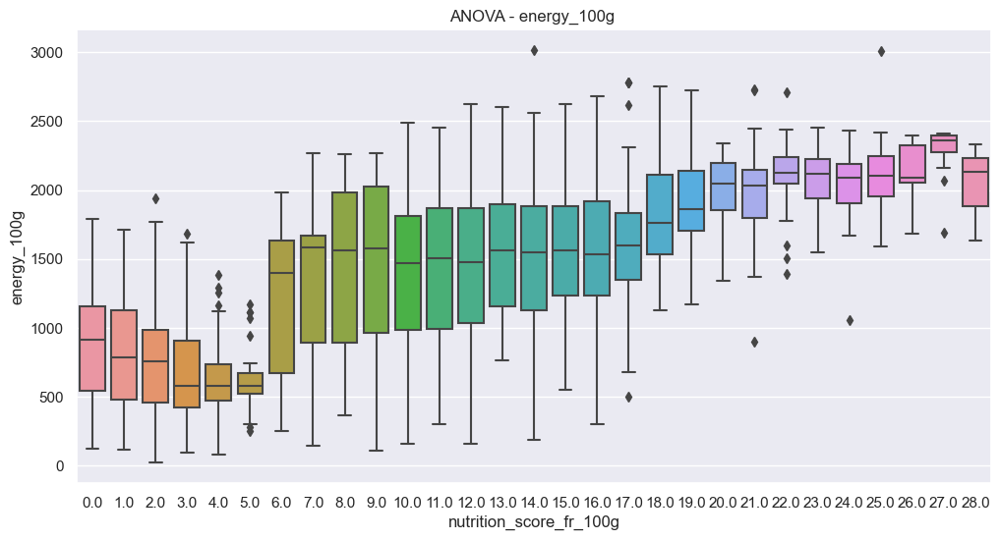

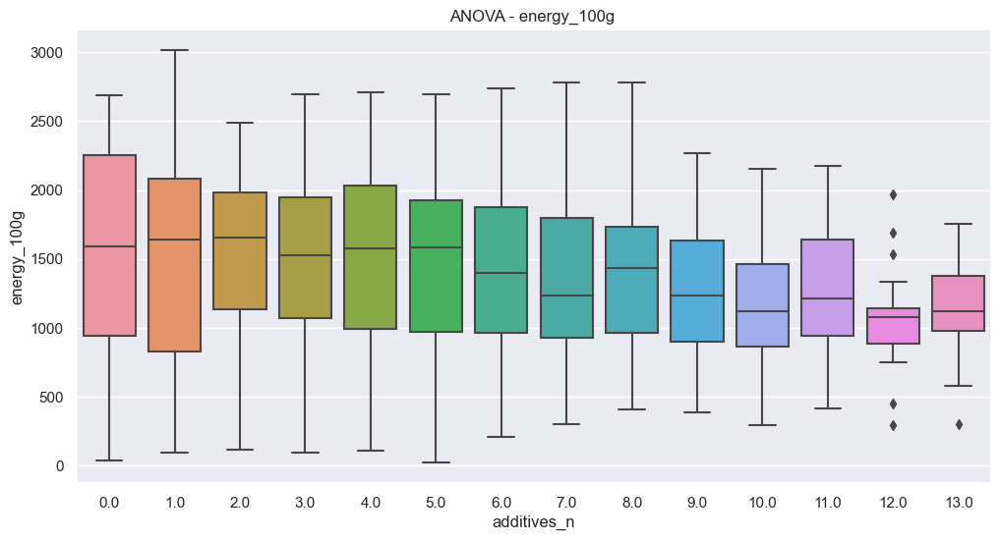

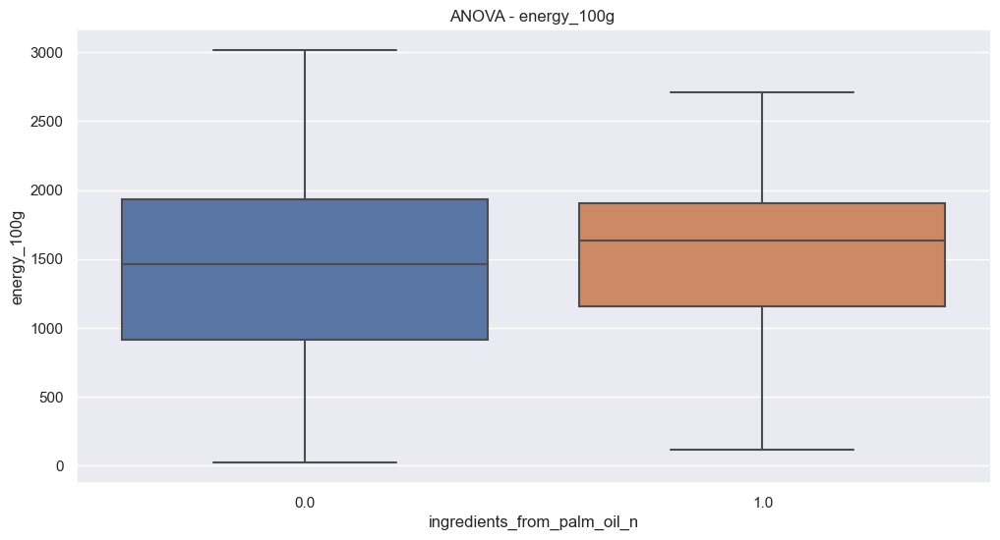

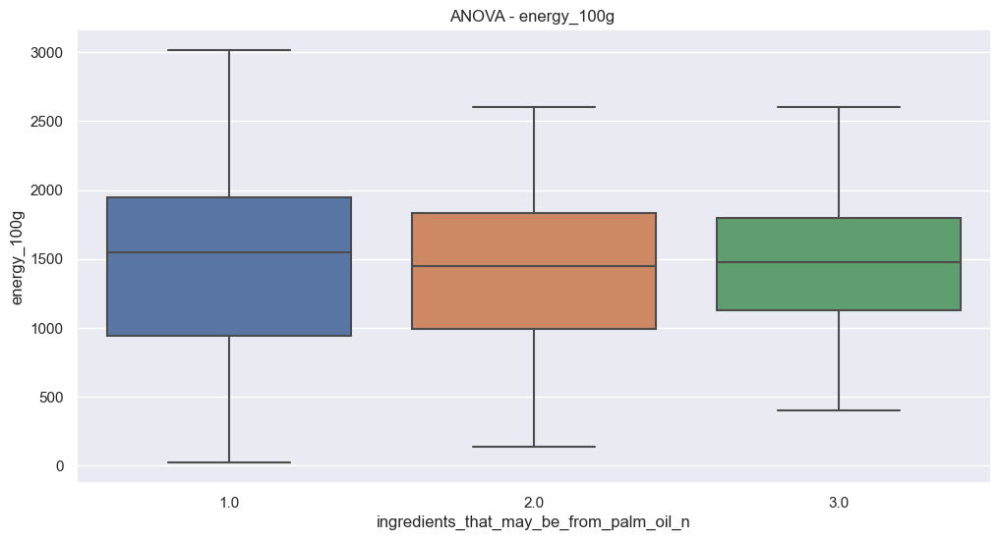

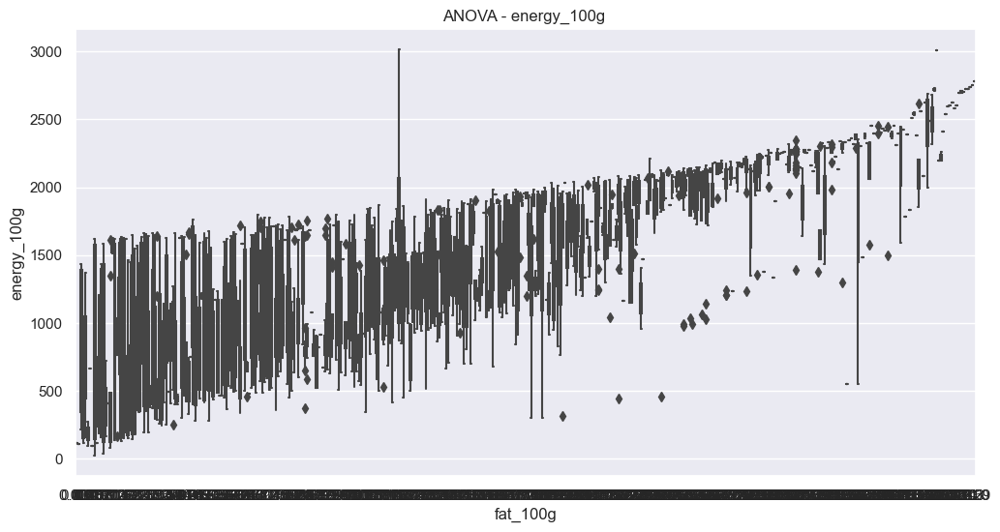

...

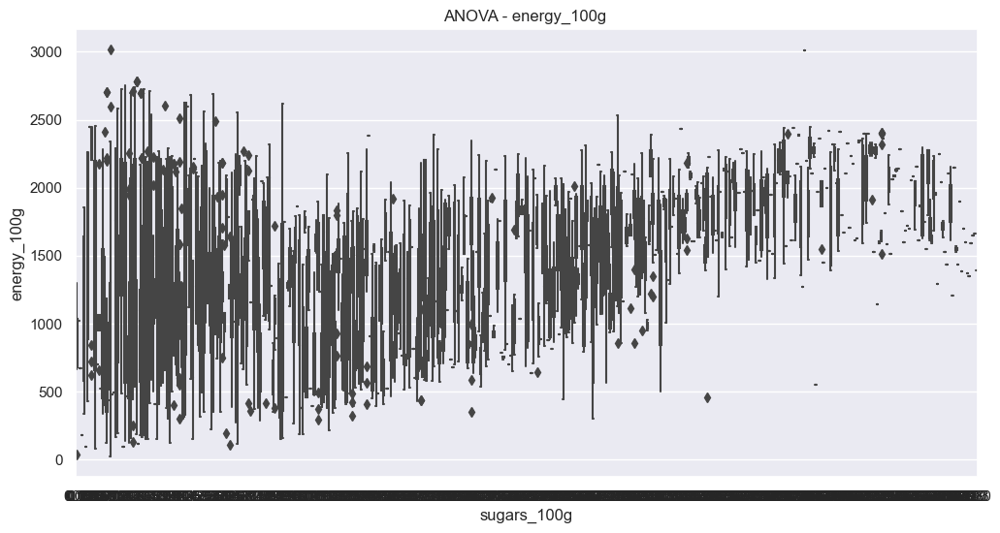

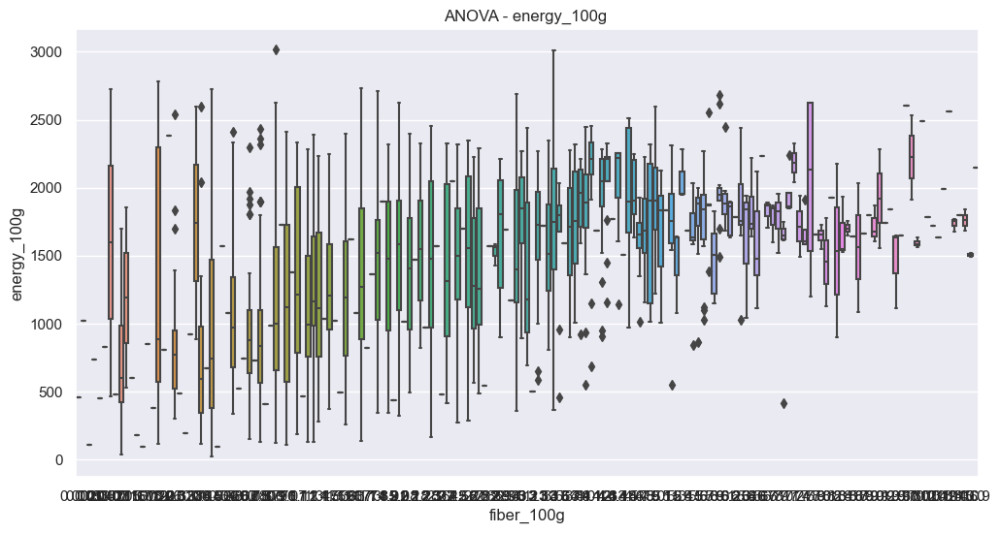

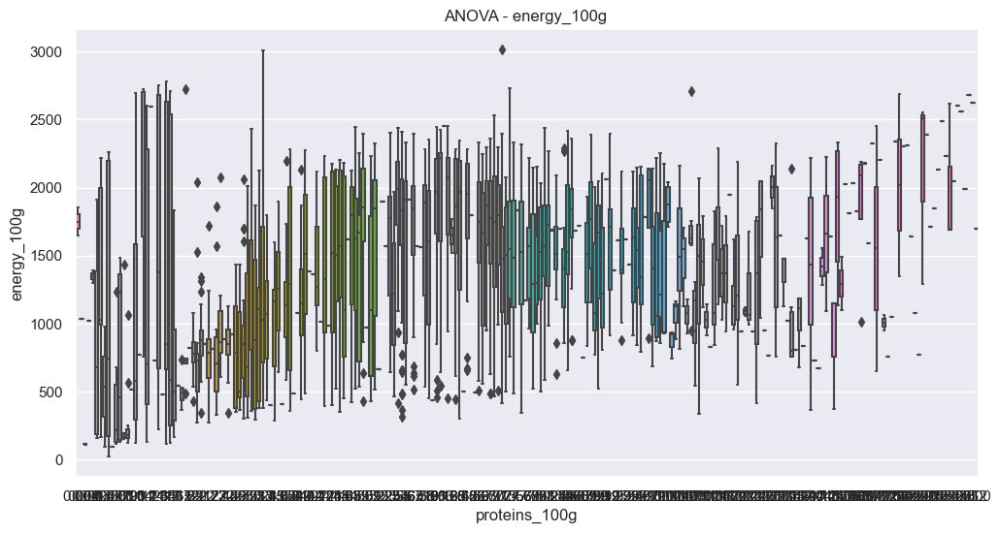

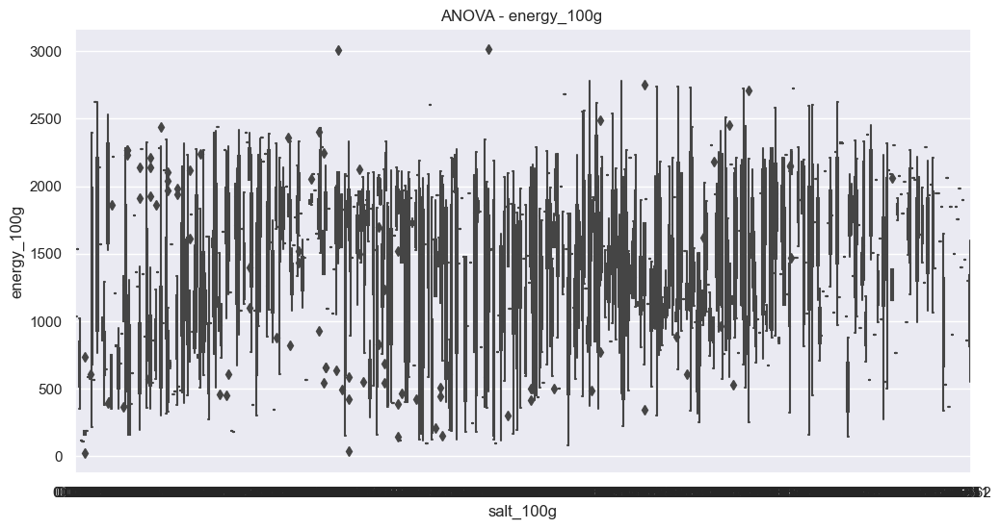

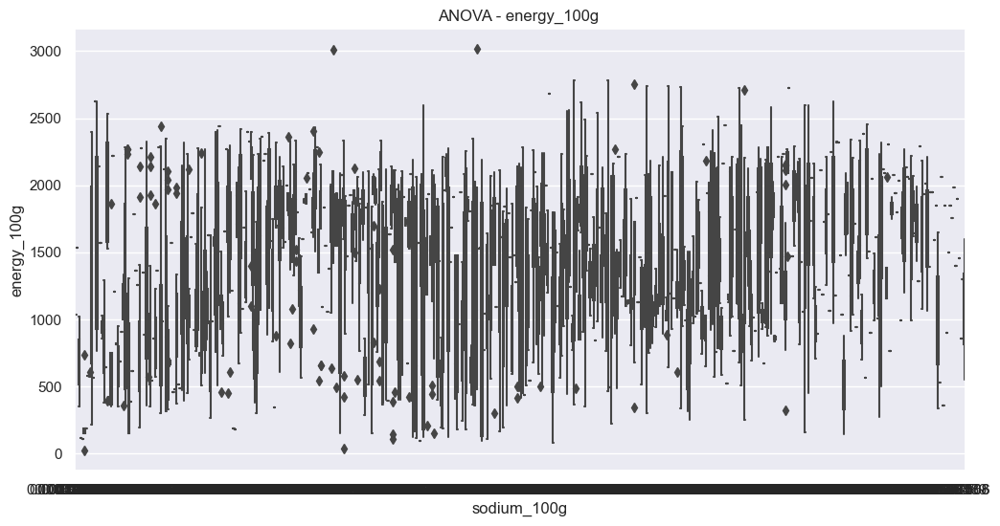

In [1191]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.formula.api import ols
import seaborn as sns
import matplotlib.pyplot as plt

# Charger les données
df_a = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')
df_a.isna().sum()
# Affichage du dataframe avant la modification
print(df_a)

# Renommage des colonnes en remplaçant '-' par '_'
df_a = df_a.rename(columns=lambda x: x.replace('-', '_'))

# Affichage du dataframe après la modification
print(df_a)
# Nettoyer les données
df_a = df_a.dropna(subset=['nutrition_score_fr_100g', 'additives_n', 'ingredients_from_palm_oil_n',
              'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
              'saturated_fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
              'proteins_100g', 'salt_100g', 'sodium_100g'])
df_a = df_a[df_a["salt_100g"] > 0]
df_a = df_a[df_a["sugars_100g"] > 0]
df_a = df_a[df_a["saturated_fat_100g"] > 0]
df_a = df_a[df_a["ingredients_that_may_be_from_palm_oil_n"] > 0]
df_a = df_a[df_a["energy_100g"] > 0]
df_a = df_a[df_a["fiber_100g"] > 0]
df_a = df_a[df_a["fat_100g"] > 0]
df_a = df_a[df_a["carbohydrates_100g"] > 0]

quant_cols = ['nutrition_score_fr_100g', 'additives_n', 'ingredients_from_palm_oil_n',
              'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
              'saturated_fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
              'proteins_100g', 'salt_100g', 'sodium_100g']

anova_results = {}

for col in quant_cols:
    if col != 'energy_100g':
        formula = f'energy_100g ~ C({col})'
        model = ols(formula, data=df_a).fit()
        anova_table = sm.stats.anova_lm(model, typ=2)
        anova_results[col] = anova_table

for col, result in anova_results.items():
    plt.figure(figsize=(12, 6))
    sns.boxplot(x=col, y='energy_100g', data=df_a)
#     plt.title(f'ANOVA - energy_100g vs {col}\nF-value: {result.loc["C("+col+")", "F"]:.2f} | p-value: {result.loc["C("+col+")", "PR(>F)"]:.6f}')
    plt.title(f'ANOVA - energy_100g ')

    plt.show()

## Marques et nutriscore 
Est-ce possible d'identifier des marques généralistes qui proposeraient toujours des produits au meilleur classement nutriscore pour toutes les catégories ?

Nous ferons une sélection de marques et de catégories pnns2 suffisamment représentées pour tenter de répondre à cette question (30 produits par catégorie et combinaison de marques).

In [1194]:
# Charger les données
df = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')

In [1195]:
# Pour la colonne 'pnns_groups_2'
print(data['pnns_groups_2'].unique())

# Pour la colonne 'brands'
print(data['brands'].unique())


[nan 'unknown' 'Legumes' 'Biscuits and cakes' 'Sweets'
 'Non-sugared beverages' 'Sweetened beverages' 'Meat' 'Soups'
 'Alcoholic beverages' 'Sandwich' 'Appetizers' 'Dressings and sauces'
 'Chocolate products' 'Dried fruits' 'Nuts' 'One-dish meals' 'Cheese'
 'Fruits' 'Fats' 'Pizza pies and quiche' 'Vegetables' 'Breakfast cereals'
 'Cereals' 'Fruit juices' 'vegetables' 'Ice cream' 'Milk and yogurt'
 'Bread' 'Fish and seafood' 'Tripe dishes' 'pastries' 'Processed meat'
 'Dairy desserts' 'Artificially sweetened beverages' 'Fruit nectars'
 'Eggs' 'Potatoes' 'Salty and fatty products' 'fruits' 'legumes' 'cereals']
["Ferme t'y R'nao" nan 'Bertrand Lejeune' ... 'L. Boulaire'
 'Roussette du Bugey' 'Sans marque,D.Lambert']


In [1196]:
data['brands'].dropna().unique()


array(["Ferme t'y R'nao", 'Bertrand Lejeune', 'A&W', ..., 'L. Boulaire',
       'Roussette du Bugey', 'Sans marque,D.Lambert'], dtype=object)

In [1197]:
df['pnns_groups_2'].value_counts()

unknown                             11907
One-dish meals                      4814 
Biscuits and cakes                  3533 
Sweets                              3222 
Cereals                             2892 
Cheese                              2877 
Processed meat                      2855 
Non-sugared beverages               2704 
Dressings and sauces                2452 
Fish and seafood                    2142 
Chocolate products                  1972 
Milk and yogurt                     1965 
Alcoholic beverages                 1940 
Vegetables                          1732 
Appetizers                          1529 
Sweetened beverages                 1490 
Fruit juices                        1484 
Fruits                              1448 
Meat                                1341 
Bread                               1235 
Fats                                1153 
Breakfast cereals                   966  
Dairy desserts                      721  
Sandwich                          

In [1198]:
# -- Set of categories and brands to consider
set_cat = set(['Legumes', 'Biscuits and cakes', 'Sweets',
               'Non-sugared beverages' ,'Sweetened beverages', 'Meat',
               'Alcoholic beverages', 'Sandwich' ,'Appetizers', 'Dressings and sauces',
               'Chocolate products', 'Dried fruits', 'Nuts' ,'One-dish meals' ,'Cheese',
               'Fruits', 'Fats' ,'Vegetables', 'Breakfast cereals' ,'Cereals', 'Fruit juices',
               'Milk and yogurt', 'Ice cream' ,'Fish and seafood', 'Bread', 'Tripe dishes',
               'pastries', 'Processed meat' ,'Pizza pies and quiche' ,'Dairy desserts',
               'Artificially sweetened beverages' ,'Eggs', 'Potatoes' ,'vegetables', 'Soups',
               'Fruit nectars', 'fruits', 'legumes', 'cereals', 'Salty and fatty products'])

set_brands = set(['monoprix', 'auchan', 'prix leader', 'jour', 'migrants', 'propriétaire', 
                  'tu', 'casino', 'carrefour', 'delhaize', 'belle france', 'netto', 'cora'])

# -- Filter and select relevant columns
df_ = df[['pnns_groups_2', 'brands']]
df_ = df_[df_['pnns_groups_2'].isin(set_cat)]
df_ = df_[df_['brands'].isin(set_brands)]

# -- Create a pivot table of counts
pivot = pd.pivot_table(df_, index='pnns_groups_2', columns='brands', aggfunc=len, fill_value=0)

# -- Get the top 10 brands for each category
top_brands = pd.DataFrame(columns=['Category', 'Brand', 'Count'])
for cat in pivot.index:
    top = pivot.loc[cat].sort_values(ascending=False)[:10]
    for i, count in top.items():
        top_brands = top_brands.append({'Category': cat, 'Brand': i, 'Count': count}, ignore_index=True)

# -- Display the results
for cat in set_cat:
    print('Category:', cat)
    display(top_brands[top_brands['Category'] == cat].sort_values(by='Count', ascending=False).head(100))
    print()


Category: Tripe dishes


,Category,Brand,Count



Category: Vegetables


,Category,Brand,Count
210,Vegetables,casino,4
211,Vegetables,auchan,1
212,Vegetables,carrefour,1
213,Vegetables,cora,1
214,Vegetables,belle france,0
215,Vegetables,monoprix,0
216,Vegetables,netto,0



Category: Potatoes


,Category,Brand,Count



Category: Sandwich


,Category,Brand,Count



Category: Processed meat


,Category,Brand,Count
182,Processed meat,carrefour,2
183,Processed meat,auchan,1
184,Processed meat,casino,1
185,Processed meat,netto,1
186,Processed meat,belle france,0
187,Processed meat,cora,0
188,Processed meat,monoprix,0



Category: Fish and seafood


,Category,Brand,Count
98,Fish and seafood,cora,2
99,Fish and seafood,netto,2
100,Fish and seafood,casino,1
101,Fish and seafood,auchan,0
102,Fish and seafood,belle france,0
103,Fish and seafood,carrefour,0
104,Fish and seafood,monoprix,0



Category: One-dish meals


,Category,Brand,Count
168,One-dish meals,carrefour,4
169,One-dish meals,auchan,3
170,One-dish meals,casino,2
171,One-dish meals,monoprix,2
172,One-dish meals,belle france,0
173,One-dish meals,cora,0
174,One-dish meals,netto,0



Category: Milk and yogurt


,Category,Brand,Count
147,Milk and yogurt,auchan,3
148,Milk and yogurt,casino,2
149,Milk and yogurt,monoprix,1
150,Milk and yogurt,netto,1
151,Milk and yogurt,belle france,0
152,Milk and yogurt,carrefour,0
153,Milk and yogurt,cora,0



Category: Ice cream


,Category,Brand,Count
126,Ice cream,monoprix,1
127,Ice cream,auchan,0
128,Ice cream,belle france,0
129,Ice cream,carrefour,0
130,Ice cream,casino,0
131,Ice cream,cora,0
132,Ice cream,netto,0



Category: Salty and fatty products


,Category,Brand,Count



Category: Breakfast cereals


,Category,Brand,Count
35,Breakfast cereals,auchan,3
36,Breakfast cereals,carrefour,2
37,Breakfast cereals,casino,1
38,Breakfast cereals,cora,1
39,Breakfast cereals,belle france,0
40,Breakfast cereals,monoprix,0
41,Breakfast cereals,netto,0



Category: legumes


,Category,Brand,Count



Category: Fruit juices


,Category,Brand,Count
105,Fruit juices,auchan,1
106,Fruit juices,carrefour,1
107,Fruit juices,belle france,0
108,Fruit juices,casino,0
109,Fruit juices,cora,0
110,Fruit juices,monoprix,0
111,Fruit juices,netto,0



Category: Artificially sweetened beverages


,Category,Brand,Count
14,Artificially sweetened beverages,cora,2
15,Artificially sweetened beverages,auchan,0
16,Artificially sweetened beverages,belle france,0
17,Artificially sweetened beverages,carrefour,0
18,Artificially sweetened beverages,casino,0
19,Artificially sweetened beverages,monoprix,0
20,Artificially sweetened beverages,netto,0



Category: Biscuits and cakes


,Category,Brand,Count
21,Biscuits and cakes,auchan,3
22,Biscuits and cakes,carrefour,2
23,Biscuits and cakes,casino,2
24,Biscuits and cakes,cora,2
25,Biscuits and cakes,monoprix,1
26,Biscuits and cakes,belle france,0
27,Biscuits and cakes,netto,0



Category: vegetables


,Category,Brand,Count
231,vegetables,auchan,1
232,vegetables,carrefour,1
233,vegetables,belle france,0
234,vegetables,casino,0
235,vegetables,cora,0
236,vegetables,monoprix,0
237,vegetables,netto,0



Category: Dairy desserts


,Category,Brand,Count
63,Dairy desserts,auchan,1
64,Dairy desserts,belle france,0
65,Dairy desserts,carrefour,0
66,Dairy desserts,casino,0
67,Dairy desserts,cora,0
68,Dairy desserts,monoprix,0
69,Dairy desserts,netto,0



Category: Non-sugared beverages


,Category,Brand,Count
154,Non-sugared beverages,auchan,4
155,Non-sugared beverages,casino,3
156,Non-sugared beverages,carrefour,2
157,Non-sugared beverages,belle france,1
158,Non-sugared beverages,cora,1
159,Non-sugared beverages,monoprix,1
160,Non-sugared beverages,netto,0



Category: Fruit nectars


,Category,Brand,Count
112,Fruit nectars,auchan,3
113,Fruit nectars,belle france,0
114,Fruit nectars,carrefour,0
115,Fruit nectars,casino,0
116,Fruit nectars,cora,0
117,Fruit nectars,monoprix,0
118,Fruit nectars,netto,0



Category: Eggs


,Category,Brand,Count
84,Eggs,auchan,1
85,Eggs,casino,1
86,Eggs,monoprix,1
87,Eggs,belle france,0
88,Eggs,carrefour,0
89,Eggs,cora,0
90,Eggs,netto,0



Category: Meat


,Category,Brand,Count
140,Meat,carrefour,4
141,Meat,auchan,1
142,Meat,belle france,0
143,Meat,casino,0
144,Meat,cora,0
145,Meat,monoprix,0
146,Meat,netto,0



Category: Chocolate products


,Category,Brand,Count
56,Chocolate products,casino,3
57,Chocolate products,auchan,1
58,Chocolate products,carrefour,1
59,Chocolate products,belle france,0
60,Chocolate products,cora,0
61,Chocolate products,monoprix,0
62,Chocolate products,netto,0



Category: Fruits


,Category,Brand,Count
119,Fruits,auchan,2
120,Fruits,carrefour,2
121,Fruits,casino,1
122,Fruits,cora,1
123,Fruits,belle france,0
124,Fruits,monoprix,0
125,Fruits,netto,0



Category: Dressings and sauces


,Category,Brand,Count
70,Dressings and sauces,carrefour,3
71,Dressings and sauces,casino,3
72,Dressings and sauces,auchan,2
73,Dressings and sauces,cora,2
74,Dressings and sauces,belle france,1
75,Dressings and sauces,monoprix,0
76,Dressings and sauces,netto,0



Category: Dried fruits


,Category,Brand,Count
77,Dried fruits,auchan,2
78,Dried fruits,belle france,0
79,Dried fruits,carrefour,0
80,Dried fruits,casino,0
81,Dried fruits,cora,0
82,Dried fruits,monoprix,0
83,Dried fruits,netto,0



Category: Fats


,Category,Brand,Count
91,Fats,casino,2
92,Fats,auchan,0
93,Fats,belle france,0
94,Fats,carrefour,0
95,Fats,cora,0
96,Fats,monoprix,0
97,Fats,netto,0



Category: fruits


,Category,Brand,Count
217,fruits,carrefour,1
218,fruits,auchan,0
219,fruits,belle france,0
220,fruits,casino,0
221,fruits,cora,0
222,fruits,monoprix,0
223,fruits,netto,0



Category: Cereals


,Category,Brand,Count
42,Cereals,auchan,5
43,Cereals,casino,3
44,Cereals,carrefour,2
45,Cereals,monoprix,1
46,Cereals,belle france,0
47,Cereals,cora,0
48,Cereals,netto,0



Category: Legumes


,Category,Brand,Count
133,Legumes,carrefour,1
134,Legumes,auchan,0
135,Legumes,belle france,0
136,Legumes,casino,0
137,Legumes,cora,0
138,Legumes,monoprix,0
139,Legumes,netto,0



Category: Cheese


,Category,Brand,Count
49,Cheese,auchan,4
50,Cheese,monoprix,4
51,Cheese,carrefour,2
52,Cheese,cora,2
53,Cheese,casino,1
54,Cheese,belle france,0
55,Cheese,netto,0



Category: Pizza pies and quiche


,Category,Brand,Count
175,Pizza pies and quiche,casino,1
176,Pizza pies and quiche,auchan,0
177,Pizza pies and quiche,belle france,0
178,Pizza pies and quiche,carrefour,0
179,Pizza pies and quiche,cora,0
180,Pizza pies and quiche,monoprix,0
181,Pizza pies and quiche,netto,0



Category: Nuts


,Category,Brand,Count
161,Nuts,cora,1
162,Nuts,auchan,0
163,Nuts,belle france,0
164,Nuts,carrefour,0
165,Nuts,casino,0
166,Nuts,monoprix,0
167,Nuts,netto,0



Category: cereals


,Category,Brand,Count



Category: Alcoholic beverages


,Category,Brand,Count
0,Alcoholic beverages,casino,1
1,Alcoholic beverages,auchan,0
2,Alcoholic beverages,belle france,0
3,Alcoholic beverages,carrefour,0
4,Alcoholic beverages,cora,0
5,Alcoholic beverages,monoprix,0
6,Alcoholic beverages,netto,0



Category: Sweets


,Category,Brand,Count
203,Sweets,carrefour,3
204,Sweets,auchan,2
205,Sweets,belle france,2
206,Sweets,monoprix,1
207,Sweets,casino,0
208,Sweets,cora,0
209,Sweets,netto,0



Category: Appetizers


,Category,Brand,Count
7,Appetizers,belle france,2
8,Appetizers,carrefour,2
9,Appetizers,casino,2
10,Appetizers,auchan,1
11,Appetizers,cora,0
12,Appetizers,monoprix,0
13,Appetizers,netto,0



Category: pastries


,Category,Brand,Count
224,pastries,auchan,2
225,pastries,carrefour,1
226,pastries,casino,1
227,pastries,belle france,0
228,pastries,cora,0
229,pastries,monoprix,0
230,pastries,netto,0



Category: Soups


,Category,Brand,Count
189,Soups,carrefour,3
190,Soups,casino,1
191,Soups,auchan,0
192,Soups,belle france,0
193,Soups,cora,0
194,Soups,monoprix,0
195,Soups,netto,0



Category: Bread


,Category,Brand,Count
28,Bread,carrefour,4
29,Bread,auchan,3
30,Bread,casino,2
31,Bread,belle france,0
32,Bread,cora,0
33,Bread,monoprix,0
34,Bread,netto,0



Category: Sweetened beverages


,Category,Brand,Count
196,Sweetened beverages,carrefour,1
197,Sweetened beverages,monoprix,1
198,Sweetened beverages,auchan,0
199,Sweetened beverages,belle france,0
200,Sweetened beverages,casino,0
201,Sweetened beverages,cora,0
202,Sweetened beverages,netto,0


In [1199]:
def check_column_value(df, column_name, value_list):
    mask = df[column_name].isin(value_list)
    df_filtered = df[mask]
    if len(df_filtered) > 0:
        print(f"La valeur '{value_list}' existe dans la colonne '{column_name}'.")
    else:
        print(f"La valeur '{value_list}' n'existe pas dans la colonne '{column_name}'.")
    return df_filtered

brands_list = ['monoprix', 'auchan', 'prix leader', 'jour', 'migrants', 'propriétaire', 'tu', 'casino', 'carrefour', 'delhaize', 'belle france', 'netto', 'cora']
df_filtered = check_column_value(data, 'brands', brands_list)

# brands_list = ['monoprix', 'auchan', 'prix leader', 'jour', 'migrants', 'propriétaire', 'tu', 'casino', 'carrefour', 'delhaize', 'belle france', 'netto', 'cora']
# mask = df['brands'].isin(brands_list)
# df_filtered = df[mask]


La valeur '['monoprix', 'auchan', 'prix leader', 'jour', 'migrants', 'propriétaire', 'tu', 'casino', 'carrefour', 'delhaize', 'belle france', 'netto', 'cora']' existe dans la colonne 'brands'.


In [1201]:
# Selecting the main pnns_groups_2 categories on which we want to compare brands
# Charger les données
df = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')
# -- reordering columns
quant_cols = ['nutrition-score-fr_100g', 'additives_n', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g']

set_cat = set(['Legumes', 'Biscuits and cakes', 'Sweets',
 'Non-sugared beverages' ,'Sweetened beverages', 'Meat',
 'Alcoholic beverages', 'Sandwich' ,'Appetizers', 'Dressings and sauces',
 'Chocolate products', 'Dried fruits', 'Nuts' ,'One-dish meals' ,'Cheese',
 'Fruits' 'Fats' ,'Vegetables', 'Breakfast cereals' ,'Cereals', 'Fruit juices',
 'Milk and yogurt', 'Ice cream' ,'Fish and seafood' 'Bread', 'Tripe dishes',
 'pastries', 'Processed meat' ,'Pizza pies and quiche' ,'Dairy desserts',
 'Artificially sweetened beverages' ,'Eggs', 'Potatoes' ,'vegetables', 'Soups',
 'Fruit nectars', 'fruits', 'legumes', 'cereals', 'Salty and fatty products'])

# -- Getting the brands that makes the 3 categories of food
set_brands = set(['monoprix', 'auchan', 'prix leader', 'jour', 'migrants', 'propriétaire', 
                  'tu', 'casino', 'carrefour', 'delhaize', 'belle france', 'netto', 'cora'])
#set(df['brands'].dropna().unique())
for cat in set_cat:
    df_ = df[df['pnns_groups_2']==cat][quant_cols+['brands']]
    set_brands = set_brands & set(df_['brands'].dropna().unique()    )  
set_brands = {s for s in set_brands\
                 if s==s and s!='sans marque'}

# -- Creating the subset dataframe
cond1 = df['brands'].isin(set_brands)
cond2 = df['pnns_groups_2'].isin(set_cat)
# df_ = df.loc[cond1&cond2]
df_ = df.copy()
print('*********************cond1**********************')
print(cond1)
print('*********************cond2**********************')
print(cond2)
print('*********************df_**********************')
print(df_)
print('*********************pnns_groups_2**********************')
print(df_['pnns_groups_2'])
print('*********************brands**********************')
print(df_['brands'])
data_crosstab = pd.crosstab(df_['pnns_groups_2'], df_['brands'], margins = True)

# -- Selecting brands and categ with more than 350 products
cond_brands = data_crosstab.loc['All',:]>1000
set_brands = set(data_crosstab.loc[:,cond_brands].columns)-set(['All'])
cond_cats = data_crosstab.loc[:,'All']>1000
set_cats = set(data_crosstab.loc[cond_cats].index)-set(['All'])
cond1 = df['brands'].isin(set_brands)
cond2 = df['pnns_groups_2'].isin(set_cats)
df_ = df.loc[cond1&cond2]

print('number of brands to be compared: ', len(set_brands))
for i, b in enumerate(set_brands):
    print('\n'+b if i % 7 == 0 else b, end=' | ')

print('\n\nnumber of pnns_groups_2 categories: ', len(set_cats))
for i, c in enumerate(set_cats):
    print('\n'+c if i % 5 == 0 else c, end=' | ')

*********************cond1**********************
0        False
1        False
2        False
3        False
4        False
         ...  
94480    False
94481    False
94482    False
94483    False
94484    False
Name: brands, Length: 94485, dtype: bool
*********************cond2**********************
0        False
1        False
2        False
3        False
4        True 
         ...  
94480    True 
94481    True 
94482    False
94483    True 
94484    False
Name: pnns_groups_2, Length: 94485, dtype: bool
*********************df_**********************
                code  \
0      0000000003087   
1      0000000024600   
2      0000000027205   
3      0000000039259   
4      0000005200016   
...              ...   
94480  9906410000009   
94481  99111250        
94482  9918            
94483  9935010000003   
94484  9980282863788   

                                                                                              url  \
0      http://world-fr.openfoodfacts.org/produ

number of brands to be compared:  5

Carrefour | U | Casino | Leader Price | Auchan | 

number of pnns_groups_2 categories:  21

Non-sugared beverages | Vegetables | Fruits | Chocolate products | Meat | 
Dressings and sauces | Fats | Processed meat | Fish and seafood | Cereals | 
Milk and yogurt | One-dish meals | Cheese | Sweetened beverages | Alcoholic beverages | 
Appetizers | Sweets | Bread | unknown | Fruit juices | 
Biscuits and cakes | 

In [1202]:
# # Grouper les données par magasin et par produit
# grouped_df = df.groupby(['brands', 'pnns_groups_2'])['product_name'].count()

# # Obtenir les 5 produits les plus vendus de chaque magasin
# top_products_by_brand = grouped_df.groupby(level=0, group_keys=False).nlargest(5)

# # Afficher les résultats
# print(top_products_by_brand)


In [1203]:
# top_products = df['pnns_groups_2'].value_counts().head(20)
# print(top_products)


In [1204]:
# Sélectionner les colonnes pnns_groups_2 et brands
df_sub = df[['pnns_groups_2', 'brands']]

# Filtrer les lignes qui correspondent aux catégories d'aliments souhaitées
set_cats = set(['One-dish meals', 'Cereals', 'Sweets', 'Cheese', 'Non-sugared beverages', 
                'Processed meat', 'Alcoholic beverages', 'Biscuits and cakes', 
                'Dressings and sauces', 'Vegetables', 'Fish and seafood', 'Fruits', 
                'Milk and yogurt', 'Meat', 'Chocolate products', 'Sweetened beverages', 
                'Fats', 'Fruit juices', 'Bread'])

df_sub = df_sub[df_sub['pnns_groups_2'].isin(set_cats)]

# Grouper les données par pnns_groups_2 et brands, puis faire une somme par magasin
df_grouped = df_sub.groupby(['pnns_groups_2', 'brands']).size().reset_index(name='count')
df_summed = df_grouped.groupby(['pnns_groups_2', 'brands'])['count'].agg(['sum', 'count']).reset_index()
df_summed.columns = ['pnns_groups_2', 'brands', 'total_count', 'num_products']

# Pour chaque catégorie, trier les magasins en ordre décroissant de vente et afficher le premier
for cat in set_cats:
    df_cat = df_summed[df_summed['pnns_groups_2'] == cat]
    if len(df_cat) > 0:
        df_sorted = df_cat.sort_values(by='total_count', ascending=False)
        print(f"{cat}: {df_sorted.iloc[0]['brands']}, {df_sorted.iloc[0]['total_count']} produits vendus")
    else:
        print(f"No data for {cat}")
# Afficher une liste unique des magasins
# Grouper les données par marque et faire une somme par magasin
df_grouped_a = df_sub.groupby(['brands']).size().reset_index(name='count')
df_summed_a = df_grouped_a.groupby(['brands'])['count'].agg(['sum', 'count']).reset_index()
df_summed_a.columns = ['brands', 'total_count', 'num_products']

# Trier les magasins en ordre décroissant de vente et afficher les 20 premiers
df_sorted = df_summed.sort_values(by='total_count', ascending=False)
top_brands = list(df_sorted['brands'][:30].unique())
print(f"Les 20 premiers magasins qui vendent le plus de produits: {top_brands}")


Vegetables: Carrefour, 104 produits vendus
Processed meat: Fleury Michon, 183 produits vendus
Fish and seafood: U, 78 produits vendus
Milk and yogurt: Yoplait, 89 produits vendus
One-dish meals: Picard, 222 produits vendus
Fruit juices: Tropicana, 139 produits vendus
Biscuits and cakes: Carrefour, 158 produits vendus
Non-sugared beverages: Carrefour, 89 produits vendus
Fruits: Andros, 78 produits vendus
Meat: Carrefour, 73 produits vendus
Chocolate products: Lindt, 189 produits vendus
Dressings and sauces: Carrefour, 106 produits vendus
Fats: Carrefour, 44 produits vendus
Cereals: Carrefour, 115 produits vendus
Cheese: Carrefour, 117 produits vendus
Alcoholic beverages: Leffe, 22 produits vendus
Sweets: Haribo, 156 produits vendus
Bread: Carrefour, 76 produits vendus
Sweetened beverages: U, 50 produits vendus
Les 20 premiers magasins qui vendent le plus de produits: ['Picard', 'Carrefour', 'Lindt', 'Fleury Michon', 'Haribo', 'Leader Price', 'Tropicana', 'U', 'Casino', 'Auchan', 'Amora'

Établissons un classement des marques en fonction du nutriscore moyen

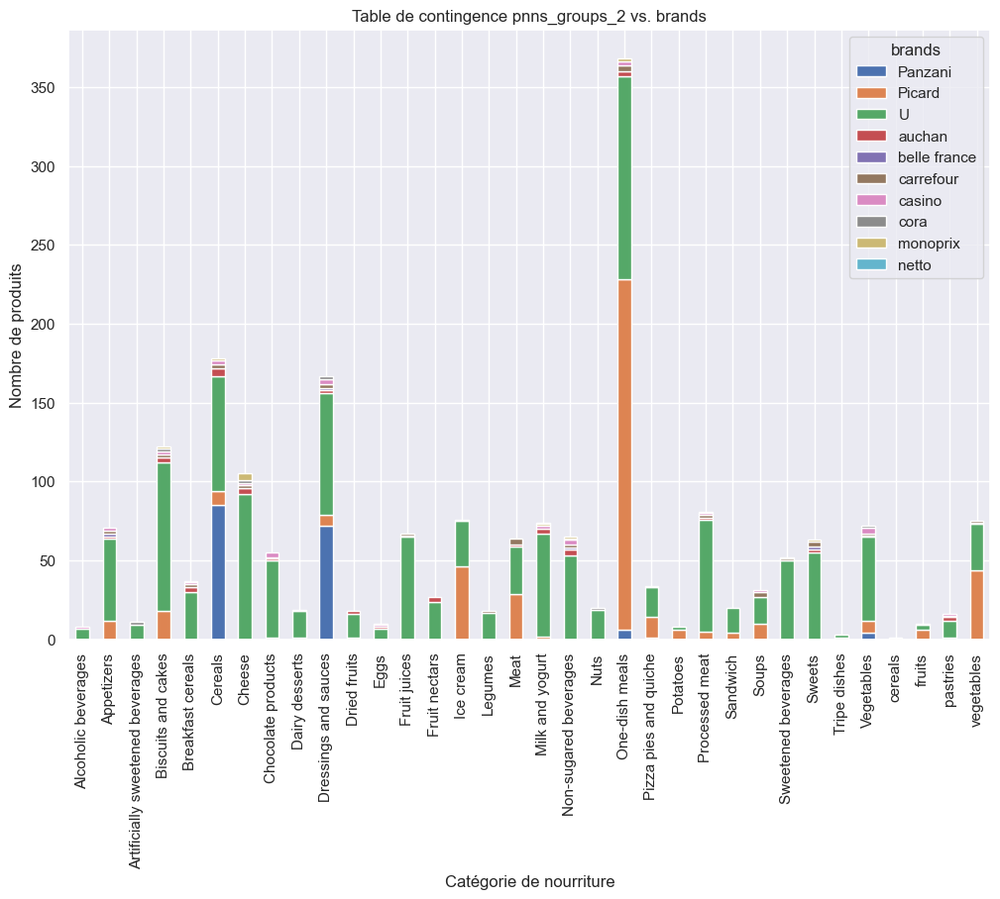

In [1205]:
set_cat = set(['Legumes', 'Biscuits and cakes', 'Sweets',
 'Non-sugared beverages' ,'Sweetened beverages', 'Meat',
 'Alcoholic beverages', 'Sandwich' ,'Appetizers', 'Dressings and sauces',
 'Chocolate products', 'Dried fruits', 'Nuts' ,'One-dish meals' ,'Cheese',
 'Fruits' 'Fats' ,'Vegetables', 'Breakfast cereals' ,'Cereals', 'Fruit juices',
 'Milk and yogurt', 'Ice cream' ,'Fish and seafood' 'Bread', 'Tripe dishes',
 'pastries', 'Processed meat' ,'Pizza pies and quiche' ,'Dairy desserts',
 'Artificially sweetened beverages' ,'Eggs', 'Potatoes' ,'vegetables', 'Soups',
 'Fruit nectars', 'fruits', 'legumes', 'cereals', 'Salty and fatty products'])

# -- Getting the brands that makes the 3 categories of food
set_brands = set(['monoprix', 'auchan', 'prix leader', 'U', 'casino', 'Panzani', 
                  'Picard', 'casino', 'carrefour', 'delhaize', 'belle france', 'netto', 'cora'])

# set_brands = set(['Picard', 'Carrefour', 'Lindt', 'Fleury Michon', 'Haribo', 'Leader Price', 'Tropicana', 'U', 
#  'Casino', 'Auchan', 'Amora', 'Monique Ranou', 'Yoplait', 'Panzani','monoprix', 'auchan', 'prix leader', 
#  'delhaize', 'belle france', 'netto', 'cora', 'casino'])

# créer un dataframe filtré
df_filt = df.loc[df['pnns_groups_2'].isin(set_cat) & df['brands'].isin(set_brands)]

# créer la table de contingence
cont_table = pd.crosstab(df_filt['pnns_groups_2'], df_filt['brands'])

# afficher la table de contingence
# print(cont_table)

# créer le graphique de la table de contingence
cont_table.plot(kind='bar', stacked=True, figsize=(12,8))
plt.xlabel('Catégorie de nourriture')
plt.ylabel('Nombre de produits')
plt.title('Table de contingence pnns_groups_2 vs. brands')
plt.show()


In [1206]:
df['brands'].unique().tolist()

["Ferme t'y R'nao",
 nan,
 'Bertrand Lejeune',
 'A&W',
 'St Michel',
 'Alice Délice',
 "M&m's ",
 'Pepsi',
 'Bo Frost',
 '7Up,Pepsico',
 'Bijou',
 'Sovivo',
 'Intermarché',
 'Le Moulin de Moreau-Sarlat',
 'Le Moulin de Moreau Sarlat',
 'Swedish By Nature',
 'Marks & Spencer',
 'Mark And Spencer',
 'Guédelon',
 'Fleury Michon',
 'Liebig',
 'Mark & Spencer',
 'Marks and Spencer',
 'M&S',
 'De Nigris',
 'Mark and Spencer',
 'Jaja',
 'Picard',
 'M&M',
 'Marché Franprix',
 'Imperial Dragon',
 'Hapi trading',
 'TABASCO',
 'McIlhenny Company',
 'Tabasco',
 'herta',
 'Florette',
 'Lindt',
 'SINA',
 'La Anita',
 'Daunat',
 'Carrefour',
 'Amofood',
 'Pure via',
 'Pepperidge farm',
 'Pepperidge Farm',
 'Chocolate Chunk,Pepperidge Farm',
 'Soft Baked,Pepperidge Farm',
 'Wonderful',
 'Wonderfull',
 'Wonderful pistachios',
 'patisseries colibri',
 'Bioitalia',
 'Damiano',
 'Conagra Foods Inc.',
 "Sainsbury's",
 'Marks&Spencer',
 'Fromagerie Bonal',
 'Le Gaulois',
 'Betty Crocker',
 'Nature valley',


In [1207]:
# from fuzzywuzzy import fuzz

# # Normalisation des chaînes de caractères dans la colonne 'brands'
# df['brands'] = df['brands'].apply(lambda x: str(x).lower().strip())

# # Trouver les valeurs en doublon avec une tolérance de similarité de 80%
# duplicates = []
# unique_brands = df['brands'].unique()
# for i, brand1 in enumerate(unique_brands):
#     for brand2 in unique_brands[i+1:]:
#         similarity = fuzz.ratio(brand1, brand2)
#         if similarity > 80:
#             duplicates.append((brand1, brand2))

# # Fusionner les doublons
# for dup in duplicates:
#     df.loc[df['brands'] == dup[1], 'brands'] = dup[0]
    
# # Afficher les valeurs uniques après déduplication
# unique_brands = df['brands'].unique().tolist()
# print(unique_brands)


In [1208]:
## Nutriscore ranking the brands for each pnns2 category
set_cat = set(['Legumes', 'Biscuits and cakes', 'Sweets',
 'Non-sugared beverages' ,'Sweetened beverages', 'Meat',
 'Alcoholic beverages', 'Sandwich' ,'Appetizers', 'Dressings and sauces',
 'Chocolate products', 'Dried fruits', 'Nuts' ,'One-dish meals' ,'Cheese',
 'Fruits' 'Fats' ,'Vegetables', 'Breakfast cereals' ,'Cereals', 'Fruit juices',
 'Milk and yogurt', 'Ice cream' ,'Fish and seafood' 'Bread', 'Tripe dishes',
 'pastries', 'Processed meat' ,'Pizza pies and quiche' ,'Dairy desserts',
 'Artificially sweetened beverages' ,'Eggs', 'Potatoes' ,'vegetables', 'Soups',
 'Fruit nectars', 'fruits', 'legumes', 'cereals', 'Salty and fatty products'])

# -- Getting the brands that makes the 3 categories of food
# set_brands = set(df['brands'].dropna().unique())
# -- Getting the brands that makes the 3 categories of food
# set_brands = set(['monoprix', 'auchan', 'prix leader', 'U', 'casino', 'Panzani', 
#                   'Picard', 'casino', 'carrefour', 'delhaize', 'belle france', 'netto', 'cora'])

set_brands = set(['Picard', 'Carrefour', 'Lindt', 'Fleury Michon', 'Haribo', 'Leader Price', 'Tropicana', 'U', 
 'Casino', 'Auchan', 'Amora', 'Monique Ranou', 'Yoplait', 'Panzani','monoprix', 'auchan', 'prix leader', 
 'delhaize', 'belle france', 'netto', 'cora', 'casino'])
# -- Mean nutriscore for each brand and each category
df_nutri_mean, df_nutri_median = pd.DataFrame([]), pd.DataFrame([])
for c in set_cat:
    for b in set_brands:
        c1 = df['brands']==b
        c2 = df['pnns_groups_2']==c
        df_nutri_mean.loc[b,c] = df[c1&c2]['nutrition-score-fr_100g'].mean()
        df_nutri_median.loc[b,c] = df[c1&c2]['nutrition-score-fr_100g'].median()

# -- Rank of each brand for each prodcut
df_rank_mean, df_rank_median = pd.DataFrame([]), pd.DataFrame([])
df_rank_mean = df_nutri_mean.apply(rankdata,axis=0)
df_rank_median = df_nutri_median.apply(rankdata,axis=0)

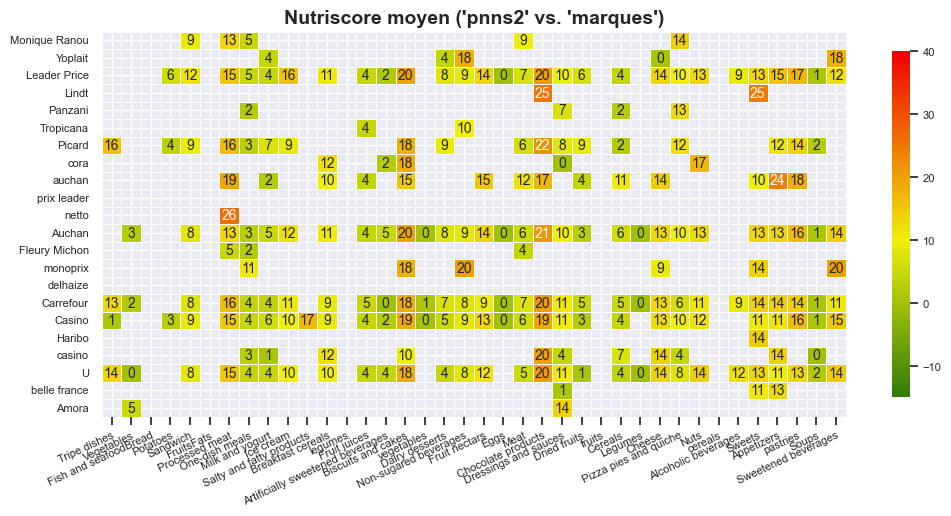

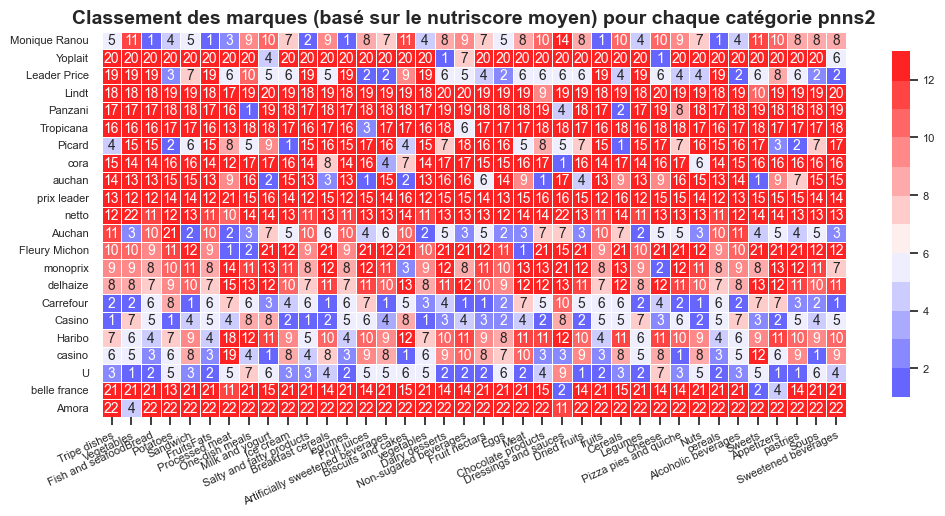

In [1209]:
# Importation des bibliothèques nécessaires
from matplotlib.colors import ListedColormap

# Définition de la colormap "Green2Red" allant du vert au rouge
N = 128
vals = np.ones((2*N, 4))
vals[:, 0] = np.concatenate((np.linspace(5/N, 120/N, N), np.linspace(120/N, 120/N, N)))
vals[:, 1] = np.concatenate((np.linspace(50/N, 120/N,  N), np.linspace(120/N, 0/N, N)))
vals[:, 2] = np.concatenate((np.linspace(5/N, 5/N, N), np.linspace(5/N, 0/N, N)))
Green2Red = ListedColormap(vals)

# Plotting du premier heatmap
# Nutriscore moyen pour chaque marque et catégorie pnns2
plot_heatmap(df_nutri_mean,
             "Nutriscore moyen ('pnns2' vs. 'marques')",
             vmin=-15, center=10, vmax=40, fmt='.0f',
             palette=Green2Red,
             figsize=(12, 5), shape='rect')

# Affichage du premier heatmap
plt.show()

# Plotting du deuxième heatmap
# Classement des marques pour chaque catégorie pnns2
plot_heatmap(df_rank_mean,
             "Classement des marques (basé sur le nutriscore moyen) pour chaque catégorie pnns2",
             vmin=1, center=6, vmax=13, fmt='.0f',
             palette=sns.color_palette("bwr", 14),
             figsize=(12, 5), shape='rect')

# Affichage du deuxième heatmap
plt.show()


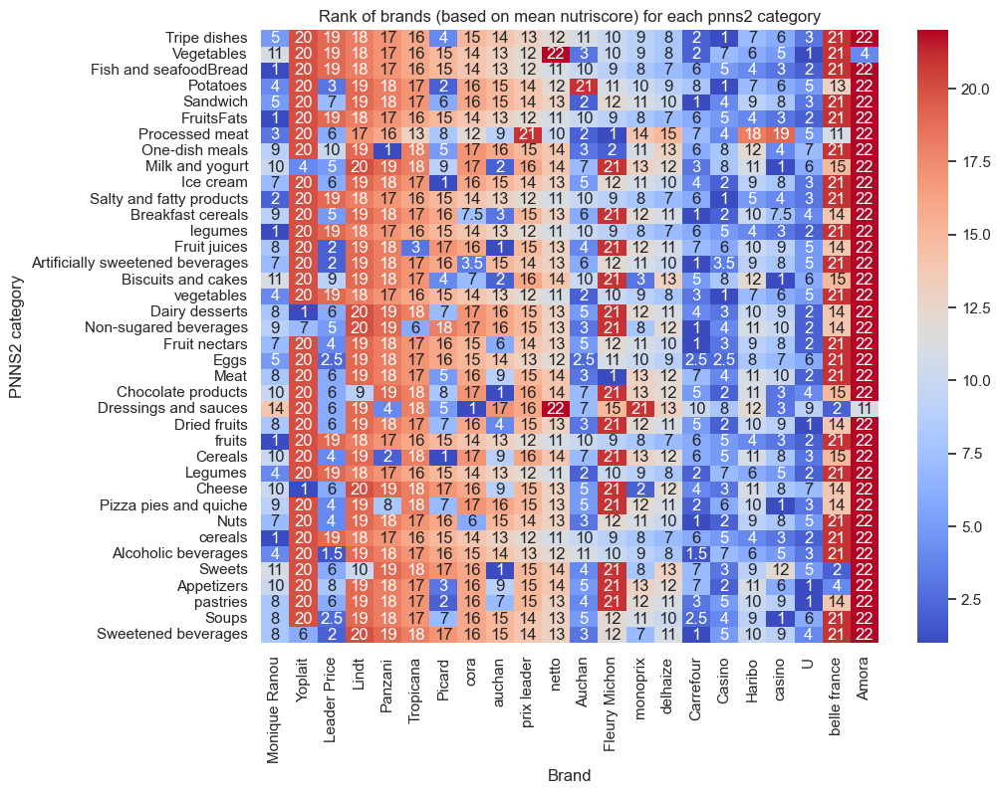

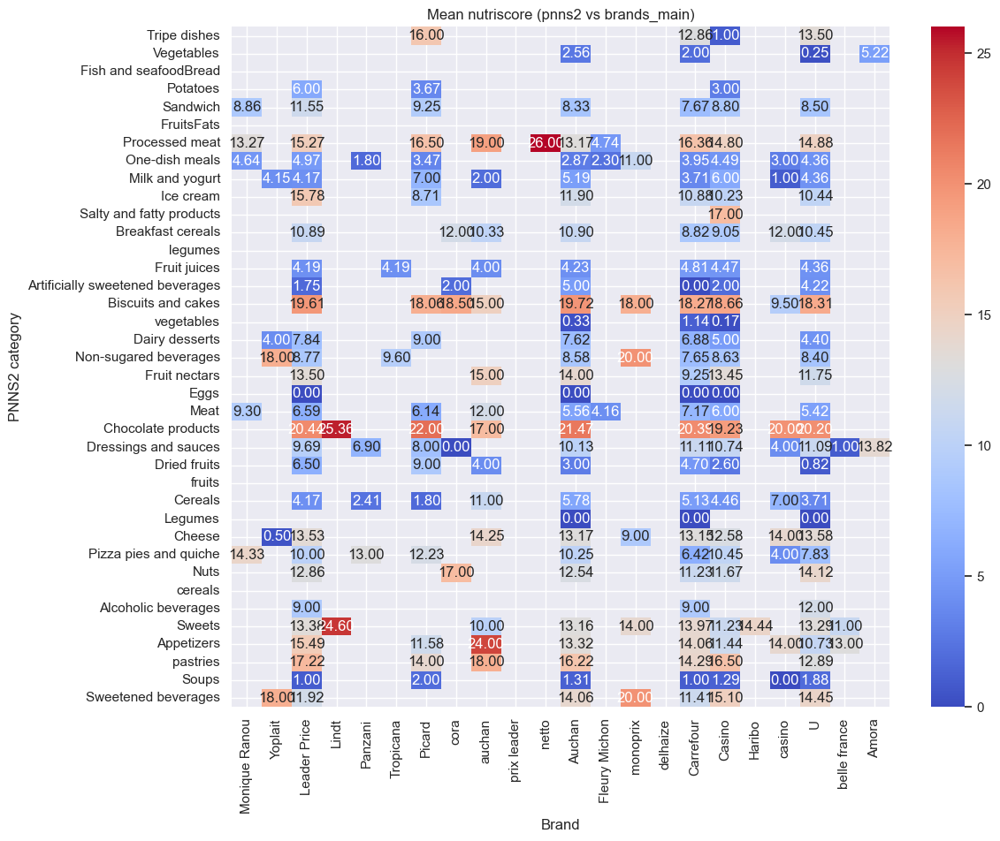

In [1210]:
# Heatmap for rank of brands based on mean nutriscore for each pnns2 category
plt.figure(figsize=(10, 8))
sns.heatmap(df_rank_mean.T, cmap='coolwarm', annot=True, fmt='g')
plt.title('Rank of brands (based on mean nutriscore) for each pnns2 category')
plt.xlabel('Brand')
plt.ylabel('PNNS2 category')
plt.show()

# Heatmap for mean nutriscore (pnns2 vs brands_main)
plt.figure(figsize=(12, 10))
sns.heatmap(df_nutri_mean.T, cmap='coolwarm', annot=True, fmt='.2f')
plt.title('Mean nutriscore (pnns2 vs brands_main)')
plt.xlabel('Brand')
plt.ylabel('PNNS2 category')
plt.show()

    

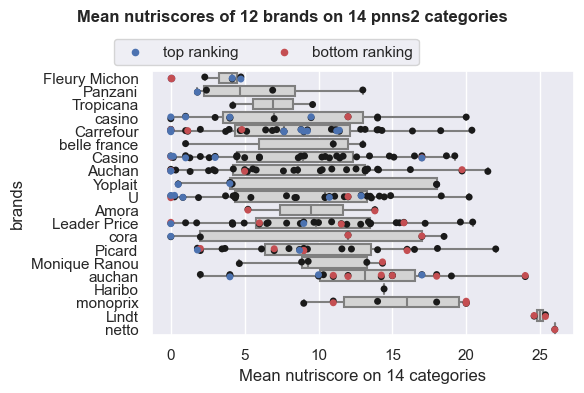

In [1211]:
# Showing the ranking of brands for mean nutriscores on pnns2 categories

# -- Preparing unstacked dataframes for easier plotting with seaborn
df_ = df_nutri_mean.T.reset_index().rename(columns={'index':'pnns_groups_2'})
df_ = df_.melt(id_vars=['pnns_groups_2'] , var_name='brand',
                    value_vars=df_nutri_mean.index, value_name='nutri_mean' )
ordered_brands = df_nutri_mean.mean(axis=1).sort_values().index
df_bottom_ = df_nutri_mean.where(df_nutri_mean==df_nutri_mean.max(axis=0))
df_bottom_ = df_bottom_.T.reset_index().rename(columns={'index':'pnns_groups_2'})
df_bottom_ = df_bottom_.melt(id_vars=['pnns_groups_2'] , var_name='brand',
                    value_vars=df_nutri_mean.index, value_name='nutri_mean')

df_top_ = df_nutri_mean.where(df_nutri_mean==df_nutri_mean.min(axis=0))
df_top_ = df_top_.T.reset_index().rename(columns={'index':'pnns_groups_2'})
df_top_ = df_top_.melt(id_vars=['pnns_groups_2'] , var_name='brand',
                    value_vars=df_nutri_mean.index, value_name='nutri_mean' )

# -- Plotting boxplots, stripplots of mean nutriscores and first, last rankings
fig = plt.figure(figsize=(6,4))
sns.boxplot(y='brand' , x='nutri_mean', color='lightgrey',
            data = df_, order = ordered_brands)
sns.stripplot(y='brand' , x='nutri_mean', color='k',
              data = df_, order = ordered_brands)
sns.stripplot(y='brand' , x='nutri_mean', color='r',
              data = df_bottom_, order = ordered_brands)
sns.stripplot(y='brand' , x='nutri_mean', color='b',
              data = df_top_, order = ordered_brands)
ax = plt.gca()
ax.scatter([0],[0], c='b', s=20, label='top ranking')
ax.scatter([0],[0], c='r', s=20, label='bottom ranking')
plt.tight_layout(rect=[0,0,1,0.87])
plt.suptitle('Mean nutriscores of 12 brands on 14 pnns2 categories',
             fontweight='bold', fontsize=12)
ax.set_xlabel('Mean nutriscore on 14 categories'), ax.set_ylabel('brands')
ax.legend(bbox_to_anchor=(0.65,1.15), ncol=2)

plt.show()

In [1212]:
# Importation de la librairie pandas
import pandas as pd

# Création d'un dataframe vide pour stocker les résultats
df_res = pd.DataFrame([])

# Ajout de deux colonnes pour stocker les marques ayant le meilleur et le pire classement
df_res['marque avec le meilleur classement'] = df_rank_mean.idxmin(axis=0)
df_res['marque avec le pire classement'] = df_rank_mean.idxmax(axis=0)

# Affichage des marques ayant le meilleur classement et leur nombre d'occurrences
print('--- MEILLEUR CLASSEMENT ---')
print(df_res['marque avec le meilleur classement'].value_counts())

# Affichage des marques ayant le premier classement
print("---- Listes des premiers classements -----")
[print(b +': '+ str(list(df_res[df_res['marque avec le meilleur classement']==b].index)))\
                              for b in set(df_res['marque avec le meilleur classement'])];

# Affichage des marques ayant le pire classement et leur nombre d'occurrences
print('--- PIRE CLASSEMENT ---')
print(df_res['marque avec le pire classement'].value_counts())

# Affichage des marques ayant le dernier classement
print("\n---- Listes des derniers classements -----")
[print(b +': '+ str(list(df_res[df_res['marque avec le pire classement']==b].index)))\
                              for b in set(df_res['marque avec le pire classement'])];


--- MEILLEUR CLASSEMENT ---
Carrefour        7
Monique Ranou    5
Casino           4
U                4
casino           4
auchan           3
Fleury Michon    2
Picard           2
Yoplait          2
Leader Price     2
Panzani          1
cora             1
Auchan           1
Name: marque avec le meilleur classement, dtype: int64
---- Listes des premiers classements -----
Monique Ranou: ['Fish and seafoodBread', 'FruitsFats', 'legumes', 'fruits', 'cereals']
U: ['Vegetables', 'Dried fruits', 'Appetizers', 'pastries']
Carrefour: ['Sandwich', 'Breakfast cereals', 'Artificially sweetened beverages', 'Non-sugared beverages', 'Fruit nectars', 'Nuts', 'Sweetened beverages']
Yoplait: ['Dairy desserts', 'Cheese']
Casino: ['Tripe dishes', 'Potatoes', 'Salty and fatty products', 'vegetables']
auchan: ['Fruit juices', 'Chocolate products', 'Sweets']
cora: ['Dressings and sauces']
Leader Price: ['Eggs', 'Alcoholic beverages']
Panzani: ['One-dish meals']
Auchan: ['Legumes']
Fleury Michon: ['Processed 

Ce graphique et les données imprimées ci-dessous montrent que certaines marques ont en effet de meilleurs nutriscores moyens que d'autres. On remarque notamment que :

- Carrefour sont les deux premiers du meilleur classement

- Amora a le pire classement

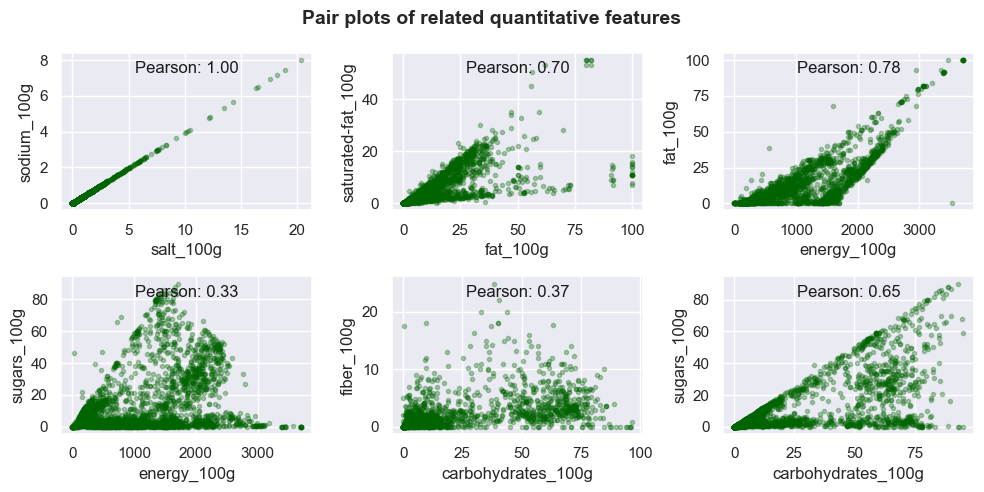

In [1213]:
# Function to show scatter plot:

def pair_plot(df,c):
    x, y = c
    plt.scatter(df[x], df[y], marker='.', alpha=0.3, color = 'darkgreen')
    # plt.scatter(df[x], df[y], marker='o', edgecolors='darkblue',
    #             alpha=0.5, color='grey', s=20)
      
    plt.xlabel(x), plt.ylabel(y)
    plt.text(0.5, 0.9, 'Pearson: %.2f'%df[c].corr().iloc[0,1],
        ha='center', va='center', fontsize=12, c='k', transform=ax.transAxes)

dict_couples = {'c1': ['salt_100g', 'sodium_100g'],
                'c2': ['fat_100g', 'saturated-fat_100g'],
                'c3': ['energy_100g', 'fat_100g'],
                'c4': ['energy_100g', 'sugars_100g'],
                'c5': ['carbohydrates_100g', 'fiber_100g'],
                'c6': ['carbohydrates_100g', 'sugars_100g']}

# Plotting related features

fig = plt.figure(figsize=(10,5))
for i, c in enumerate(dict_couples.items(),1):
    ax = fig.add_subplot(2,3,i)
    pair_plot(df.sample(5000),c[1])
plt.tight_layout(rect=[0,0,1,0.93])
plt.suptitle('Pair plots of related quantitative features',
             fontweight='bold', fontsize=14)

plt.show()

Comme prévu, le sodium est corrélé avec le sel et les matières grasses à l'énergie provenant des matières grasses.

Les sucres et les fibres sont inférieurs aux glucides, et l'énergie provenant des graisses est inférieure à l'énergie totale.

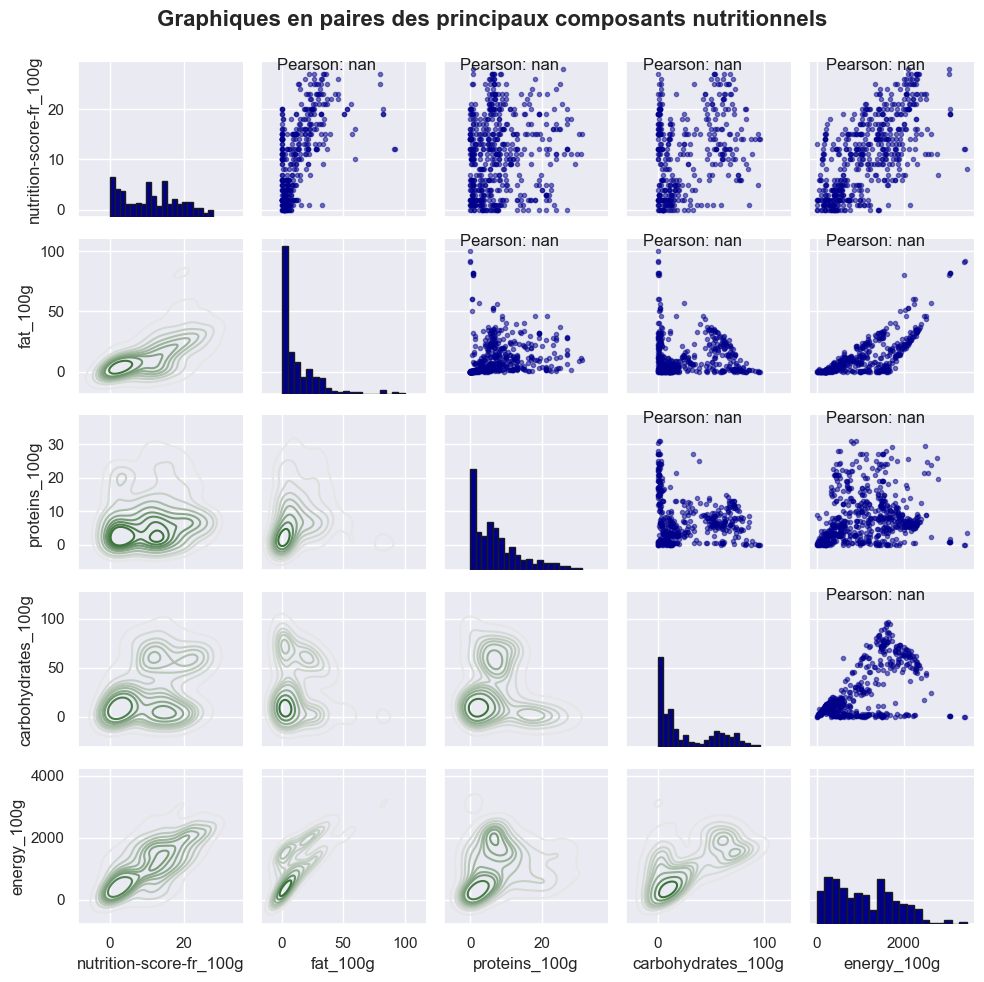

In [1214]:
# Scatterplot matrix on main nutritional components (too much data -> on a sample)

# Creating grey to blue colormap
N = 256
vals = np.ones((N, 4))
vals[:, 0] = np.linspace(0.9, 5/N, N)
vals[:, 1] = np.linspace(0.9, 80/N,  N)
vals[:, 2] = np.linspace(0.9, 5/N, N)
Grey2Green = ListedColormap(vals)

# Function that prints Pearson correlation coefficient
def print_corr(x, y, **kwargs):
    label = r'Pearson: ' + str(round(np.corrcoef(x, y)[0][1], 2))
    ax = plt.gca()
    ax.annotate(label, xy = (0.1, 0.95), c='k', size = 12,
                xycoords = ax.transAxes)

cols = ['nutrition-score-fr_100g', 'fat_100g', 'proteins_100g','carbohydrates_100g', 'energy_100g']
df_sample = df.sample(1000)

# Creating the grid
grid = sns.PairGrid(data=df_sample,
                    vars=cols, height=2)

# Mapping the grid with plots and text
# grid = grid.map_upper(plt.scatter, marker='o', edgecolors='darkblue',
#                       alpha=0.5, color='blue', s=20)
grid = grid.map_upper(plt.scatter, marker='.', alpha=0.5, color = 'darkblue')
grid = grid.map_upper(print_corr)
grid = grid.map_diag(plt.hist, bins = 20, color = 'darkblue', edgecolor = 'k')
grid = grid.map_lower(sns.kdeplot, cmap = Grey2Green)

plt.tight_layout(rect=[0,0,1,0.95])
plt.suptitle('Graphiques en paires des principaux composants nutritionnels',
             fontweight='bold', fontsize=16)

plt.show()

Ces diagrammes de paires montrent que :

- le nutriscore augmente avec la teneur en lipides puis en glucides 
- le nutriscore augmente avec l'énergie en général
- les produits à haute teneur en matières grasses ont tendance à contenir moins de glucides et ceux qui contiennent plus de glucides ont tendance à contenir moins de matières grasses.
- peu de produits ont une forte teneur en protéines
- l'énergie a tendance à augmenter de manière cohérente avec la teneur en lipides et en glucides, mais les protéines ont moins d'influence sur la teneur énergétique totale, probablement parce que la plupart des produits contiennent moins de protéines que les lipides et les glucides.

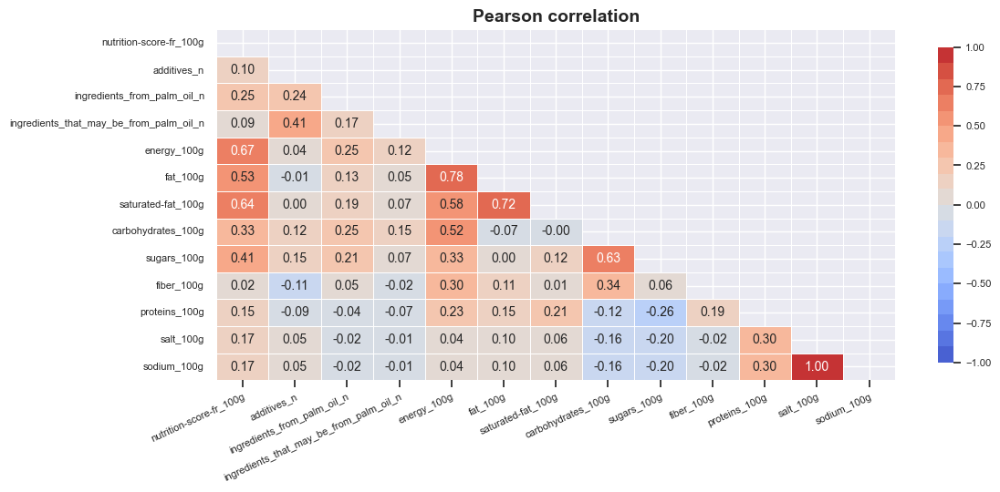

In [1096]:
# Linear correlation (Pearson)

cols = quant_cols
pears_corr = df[cols].corr()
plot_heatmap(pears_corr, shape='tri',
             title="Pearson correlation", figsize=(12,5))

plt.show()

Si les distributions étaient normales, on pourrait rejetter l'hypothèse d'indépendance : la moyenne des échantillons de salt_100g est liée à la valeur de nutrition_grade

Comme nous l'avons déjà vu ci-dessus sur les graphiques de paires, certaines des corrélations sont assez évidentes, comme par exemple :

- gras -> énergie
- sucres -> glucides
- lipides, saturés, lipides, sucres, énergie -> nutriscore


Mais, plus surprenant :

plus de fibres peuvent être trouvées dans les produits à haute énergie
Comme nous le savons par sa formule, le nutriscore, sans surprise :

augmente avec l'énergie, les graisses saturées, le sucre et le sel
diminue avec la teneur en fibres, protéines et fruits et légumes

Cependant, pour la plupart des produits, la plupart des facteurs corrélés au nutriscore sont (par ordre décroissant d'importance) :

énergie, gras saturés, lipides, glucides, sucre (coefficient de Pearson >0,4)

les glucides, le sel et les fibres ont moins d'influence sur le nutriscore (abs(coeff de pearson) < 0,25)

=> Pour obtenir de meilleurs nutrigrades, l'industrie alimentaire devrait se concentrer principalement sur la diminution de la teneur en matières grasses, en sucre et en énergie globale de ses produits .



Nous testerons la corrélation linéaire (Pearson) et la relation monotone (Spearman, Kendall).

In [1097]:
# Index(['additives_n', 'ingredients_from_palm_oil_n',
#        'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
#        'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
#        'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g'],
#       dtype='object')

# Définir les couples de variables pour effectuer les tests de corrélation
test_couples = [('fat_100g', 'nutrition-score-fr_100g'), ('carbohydrates_100g', 'nutrition-score-fr_100g'),
                ('proteins_100g', 'nutrition-score-fr_100g'), ('energy_100g', 'nutrition-score-fr_100g'),
                ('fiber_100g', 'nutrition-score-fr_100g'), ('sugars_100g', 'nutrition-score-fr_100g'),
                ('fat_100g', 'fiber_100g'), ('fat_100g', 'salt_100g'),
                ('ingredients_from_palm_oil_n', 'fiber_100g'), ('ingredients_from_palm_oil_n', 'salt_100g')]


# # Charger les données
# data = pd.read_csv('data/fr.openfoodfacts.org.products_cleaned5.csv')
# #df = df.fillna(0) # Remplacez les NaN par la valeur 0

# # Copier les données dans un nouveau dataframe
df_ = data.copy()

# Remplacer les valeurs infinies et manquantes par NaN
df_ = df_.replace([np.inf, -np.inf], np.nan).dropna()
nombre_de_lignes = data.shape[0]
print (nombre_de_lignes)
# Effectuer un échantillonnage aléatoire des données pour réduire la taille des données
df_ = df_.sample(min(10000, nombre_de_lignes), replace=True, random_state=42)


# Parcourir la liste des couples de variables et effectuer les tests de corrélation
for tup in test_couples:
    print('------'+str(tup).upper()+'-----')
    c1, c2 = tup
    display(correlation_tests(df_[c1], df_[c2], print_opt=False))


94485
------('FAT_100G', 'NUTRITION-SCORE-FR_100G')-----


,stat,p_value
Pearson,0.681520,0.0
Spearman,0.742967,0.0
Kendall,0.546310,0.0


------('CARBOHYDRATES_100G', 'NUTRITION-SCORE-FR_100G')-----


,stat,p_value
Pearson,0.493470,0.0
Spearman,0.445412,0.0
Kendall,0.306672,0.0


------('PROTEINS_100G', 'NUTRITION-SCORE-FR_100G')-----


,stat,p_value
Pearson,0.143415,4.207602e-47
Spearman,0.150269,1.371682e-51
Kendall,0.097262,1.040167e-45


------('ENERGY_100G', 'NUTRITION-SCORE-FR_100G')-----


,stat,p_value
Pearson,0.767185,0.0
Spearman,0.760678,0.0
Kendall,0.561618,0.0


------('FIBER_100G', 'NUTRITION-SCORE-FR_100G')-----


,stat,p_value
Pearson,0.125421,2.388809e-36
Spearman,0.166727,2.974144e-63
Kendall,0.099777,2.162908e-47


------('SUGARS_100G', 'NUTRITION-SCORE-FR_100G')-----


,stat,p_value
Pearson,0.625426,0.0
Spearman,0.571586,0.0
Kendall,0.415787,0.0


------('FAT_100G', 'FIBER_100G')-----


,stat,p_value
Pearson,0.225066,4.924045e-115
Spearman,0.287125,4.474637e-189
Kendall,0.203856,2.689790e-199


------('FAT_100G', 'SALT_100G')-----


,stat,p_value
Pearson,0.027271,0.006385
Spearman,0.043757,0.000012
Kendall,0.028514,0.000022


------('INGREDIENTS_FROM_PALM_OIL_N', 'FIBER_100G')-----


,stat,p_value
Pearson,0.134838,8.594325e-42
Spearman,0.192398,5.321445e-84
Kendall,0.158964,1.750412e-82


------('INGREDIENTS_FROM_PALM_OIL_N', 'SALT_100G')-----


,stat,p_value
Pearson,-0.070989,1.185683e-12
Spearman,-0.085962,7.239852e-18
Kendall,-0.070495,8.272558e-18


Les 3 tests indiquent une relation linéaire avec un niveau de confiance de 5 % entre la combinaison des caractéristiques énumérées ci-dessus. Cependant, nous devons tempérer ces conclusions car cette sensibilité élevée peut être principalement due à la grande quantité de données disponibles. Si nous soumettons un échantillon de 1 000 ou 10 000 des données aux mêmes tests, les conclusions sont plus conformes aux conclusions qui peuvent être facilement tirées des diagrammes de paires

In [1307]:
# Charger les données
df = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')

In [1308]:
##### Analyse en composantes principales #####

# Paramètre l'affichage pour la mise en forme des valeurs
np.set_printoptions(formatter={'float': '{: 6.2f}'.format})

# --Sélection des caractéristiques et des index (dropna) pour l'ACP
pca_cols =  [ 'additives_n', 'ingredients_from_palm_oil_n',
             'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
             'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
             'proteins_100g', 'salt_100g', 'sodium_100g']

# Supprime la caractéristique "nutriscore" des colonnes à considérer
pca_cols = [c for c in pca_cols if c!='nutriscore']

# Sélectionne un échantillon aléatoire de 10000 observations sans valeur manquante 
df_sample = df.loc[:, pca_cols].dropna(how='any').sample(10000)

# Stocke les index des observations sélectionnées
id_code = df_sample.index

# Transforme l'échantillon en matrice numérique
X = df_sample.values

# --Standardisation des données
X_sc = StandardScaler().fit_transform(X)

# -- Détermination des composantes principales
n_comp = 12
pca = PCA(n_components=n_comp).fit(X_sc)

# -- Coefficients des composantes principales (en fonction des caractéristiques initiales)
pca_df = pd.DataFrame(pca.components_,
                      index=['PC'+str(i+1) for i in range(n_comp)],
                      columns=pca_cols).T

# Projection de X sur les composantes principales
X_proj = pca.transform(X_sc)


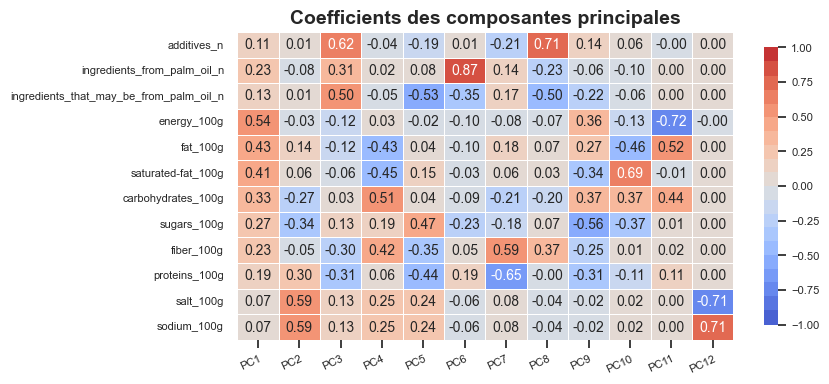

In [1309]:
# Plotting principal components coefficient
# Tracé du coefficient des composantes principales

plot_heatmap(pca_df,'Coefficients des composantes principales', vmin=-1, vmax=1, center=0,
             palette=sns.color_palette("coolwarm", 20),figsize=(8,4),shape='rect')
plt.show()

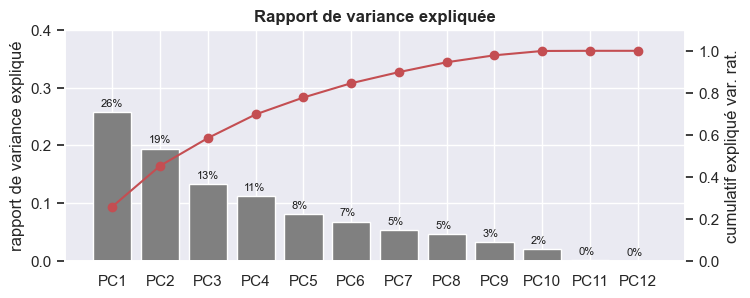

In [1310]:
# Plotting explained variance ratio in scree plot
# Tracé du rapport de variance expliquée dans un graphe d'éboulis

# Obtention du ratio de variance expliquée
exp_var_rat = pca.explained_variance_ratio_

# Création d'un graphique à barres pour le ratio de variance expliquée
plt.bar(x=pca_df.columns, height=exp_var_rat, color='grey')

# Configuration de l'axe y principal
ax1 = plt.gca()
ax1.set(ylim=(0,0.4))

# Création d'un deuxième axe y pour la courbe de la variance expliquée cumulée
ax2 = ax1.twinx()
ax2.plot(exp_var_rat.cumsum(), 'ro-')
ax2.set(ylim=(0,1.1))

# Configuration des étiquettes des axes y
ax1.set_ylabel('rapport de variance expliqué')
ax2.set_ylabel('cumulatif expliqué var. rat.')

# Ajout des pourcentages au-dessus des barres
for i, p in enumerate(ax1.patches):
    ax1.text( p.get_width()/5 + p.get_x(), p.get_height()+ p.get_y()+0.01,
             '{:.0f}%'.format(exp_var_rat[i]*100),
                fontsize=8, color='k')

# Configuration de la taille du graphique et ajout d'un titre
plt.gcf().set_size_inches(8,3)
plt.title('Rapport de variance expliquée', fontweight='bold')

# Sauvegarde et affichage du graphique

plt.grid(False)

# Affichage du graphique
plt.show()



In [1311]:
pca_cols

['additives_n',
 'ingredients_from_palm_oil_n',
 'ingredients_that_may_be_from_palm_oil_n',
 'energy_100g',
 'fat_100g',
 'saturated-fat_100g',
 'carbohydrates_100g',
 'sugars_100g',
 'fiber_100g',
 'proteins_100g',
 'salt_100g',
 'sodium_100g']

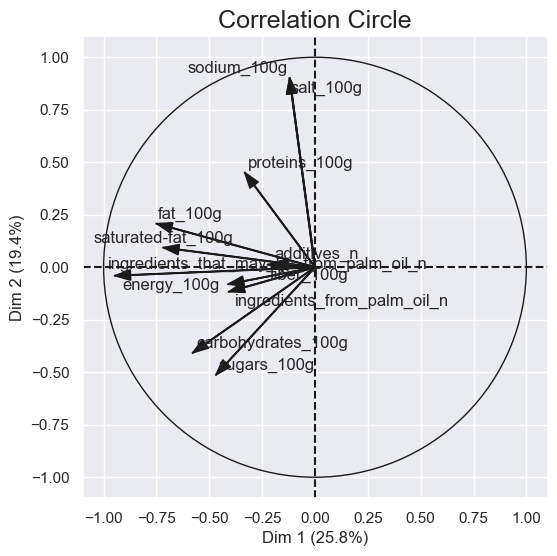

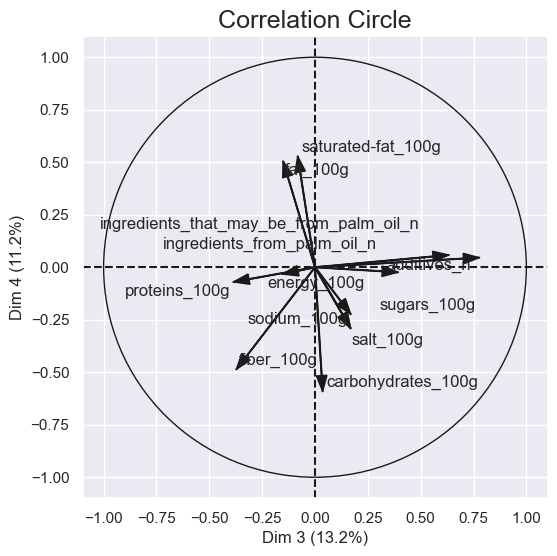

In [1312]:
# POUR RECALCULER LA PCA AVEC MLXTEND

figure, correlation_matrix = \
     plot_pca_correlation_graph(X = X_sc, variables_names = pca_cols,
                                dimensions=(1, 2), figure_axis_size=6)
figure, correlation_matrix = \
     plot_pca_correlation_graph(X = X_sc, variables_names = pca_cols,
                                dimensions=(3,4), figure_axis_size=6)
# figure, correlation_matrix = \
#      plot_pca_correlation_graph(X = X_sc, variables_names = pca_cols,
#                                 dimensions=(5, 6), figure_axis_size=6)

In [1315]:
correlation_matrix

,Dim 1,Dim 2,Dim 3,Dim 4
additives_n,-0.200894,0.016533,0.777157,0.045758
ingredients_from_palm_oil_n,-0.408370,-0.116847,0.392768,-0.023745
ingredients_that_may_be_from_palm_oil_n,-0.224429,0.012628,0.633064,0.058320
energy_100g,-0.947499,-0.040339,-0.153849,-0.032521
fat_100g,-0.750754,0.207975,-0.150763,0.504406
saturated-fat_100g,-0.718513,0.093625,-0.081796,0.528266
carbohydrates_100g,-0.579276,-0.407970,0.036086,-0.590724
sugars_100g,-0.468807,-0.512683,0.169058,-0.223600
fiber_100g,-0.411322,-0.080916,-0.372109,-0.486290
proteins_100g,-0.332623,0.451277,-0.385911,-0.070016


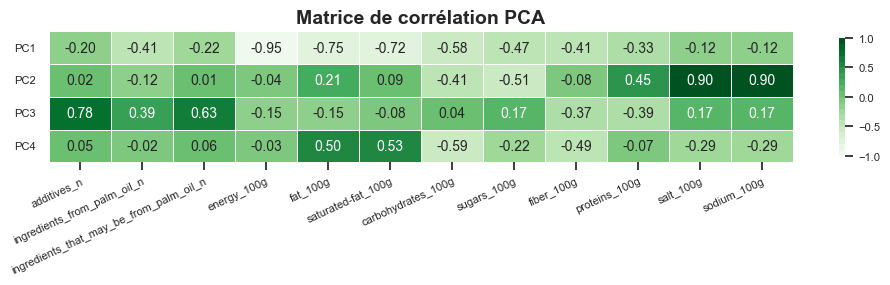

In [1316]:
# Tracé de la matrice de corrélation PCA
plot_heatmap(correlation_matrix.T,'Matrice de corrélation PCA', vmin=-1, vmax=1, center=0,
             palette=sns.color_palette("Greens", 20),figsize=(12,1.7),shape='rect')
plt.gca().set_yticklabels(['PC1', 'PC2', 'PC3', 'PC4'])

# Affichage de la figure
plt.show()


In [1317]:
# Plotting a sample of values projected on first factorial planes

# id_code_samp = pd.Series(id_code).sample(300)
# X_samp = df.loc[id_code_samp, pca_cols].values
# X_sc_samp = StandardScaler().fit_transform(X_samp)

# Sélection de 300 échantillons aléatoires
id_code_samp = pd.Series(id_code).sample(300)

# Sélection des colonnes PCA et des valeurs correspondantes pour les 300 échantillons sélectionnés
X_samp = df.loc[id_code_samp, pca_cols].values

# Standardisation des données d'échantillons PCA
X_sc_samp = StandardScaler().fit_transform(X_samp)


Ce code sert à sélectionner un échantillon aléatoire de 300 échantillons à partir des données transformées par l'analyse en composantes principales (PCA) et normalisées à l'aide de la StandardScaler. Cela peut être utile pour effectuer des analyses de clustering ou de classification sur un échantillon représentatif des données.

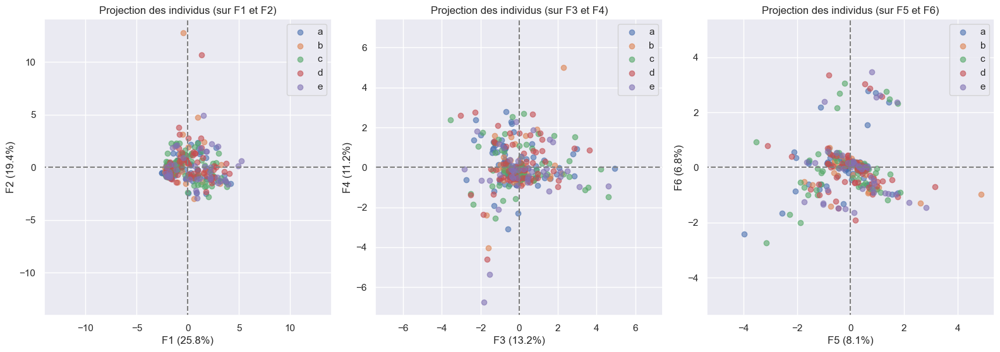

In [1318]:
illus_var_p = df.loc[id_code_samp, 'nutrition_grade_fr']
illus_var_p = illus_var_p[illus_var_p.apply(lambda x: isinstance(x, str))]
display_factorial_planes(pca.transform(X_sc_samp), n_comp, pca, [(0,1),(2,3),(4,5)],
                         n_cols=3, labels=np.array(id_code_samp),
                         illus_var= illus_var_p,
                         lab_on=False, alpha=0.6)
plt.show()

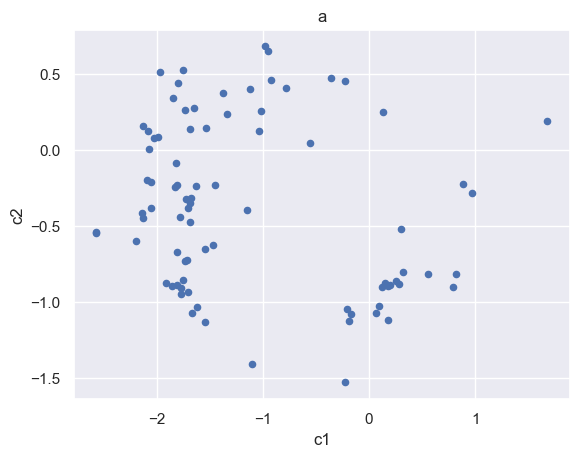

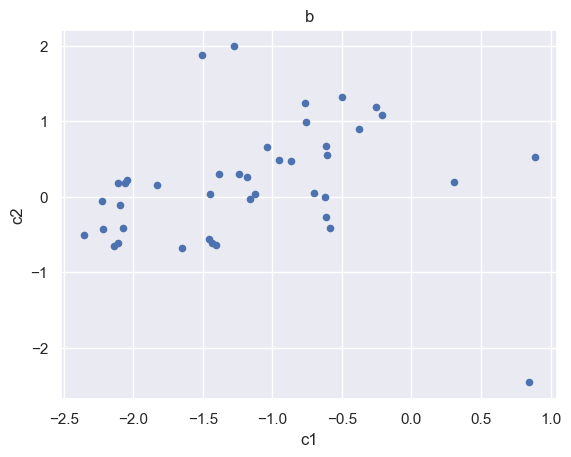

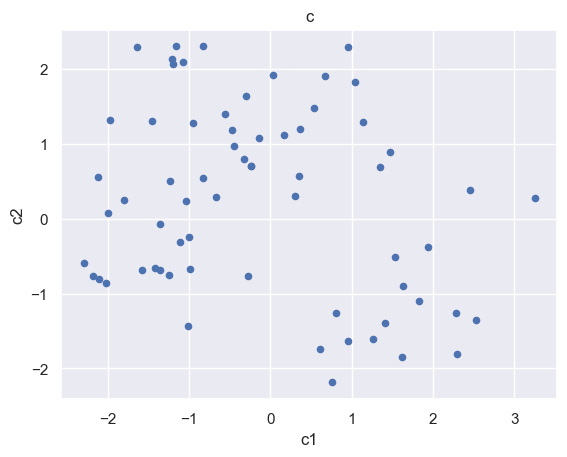

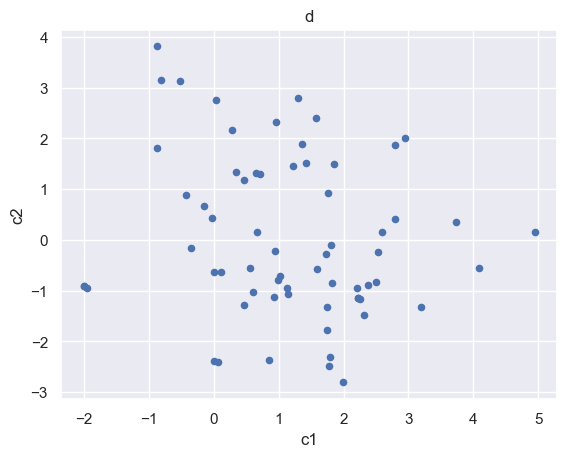

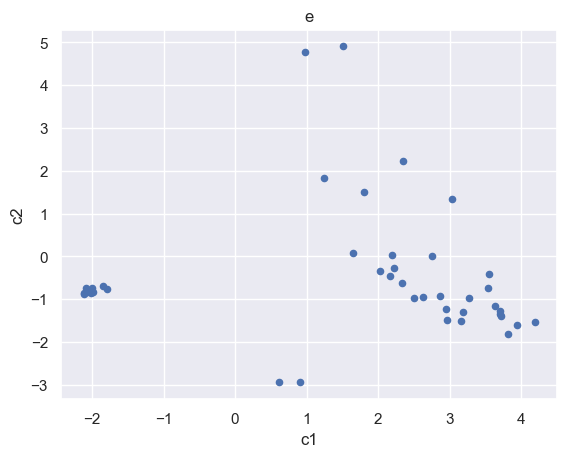

In [1389]:
projections = pca.transform(X_sc_samp)
grades = np.array(df.loc[id_code_samp, 'nutrition_grade_fr'])
scores = np.array(list(enumerate(grades)))
scoreidx = pd.DataFrame(scores, columns = ['i', 'score'])

# Création du tableau pour l'exemple
nutriscore = ['a', 'b', 'c', 'd', 'e']

# Boucle for pour parcourir le tableau
for s in nutriscore:
    projectionsdf = pd.DataFrame(projections, columns = ['c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9', 'c10', 'c11', 'c12'])
    scorefiltre = scoreidx.loc[scoreidx['score'] == s]
    idx = scorefiltre.index
    projectionsdf = projectionsdf.loc[idx]
    projectionsfiltre = projectionsdf.loc[(projectionsdf['c1'] <= 5) & (projectionsdf['c1'] >= -5) & (projectionsdf['c2'] >= -5) & (projectionsdf['c2'] <= 5), ['c1', 'c2']]
    projectionsfiltre.plot(x='c1', y='c2', kind='scatter')
    plt.title(s)
    plt.show()


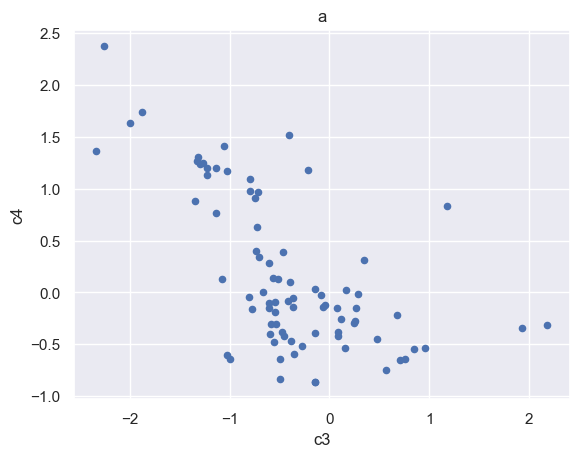

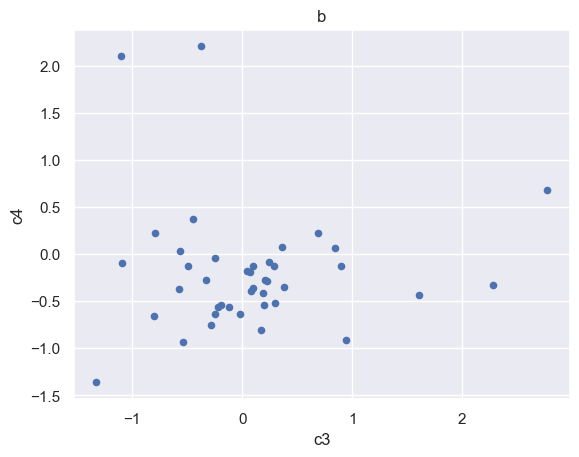

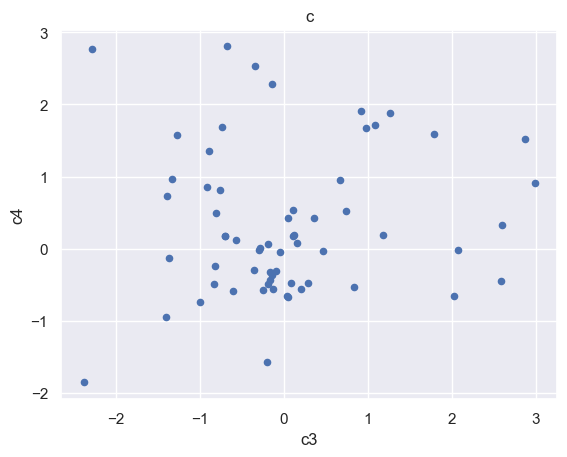

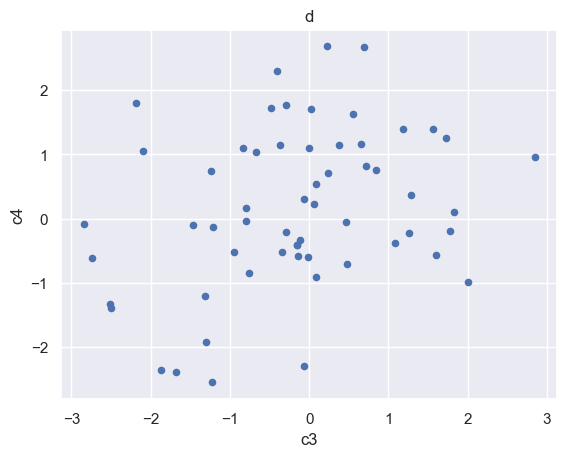

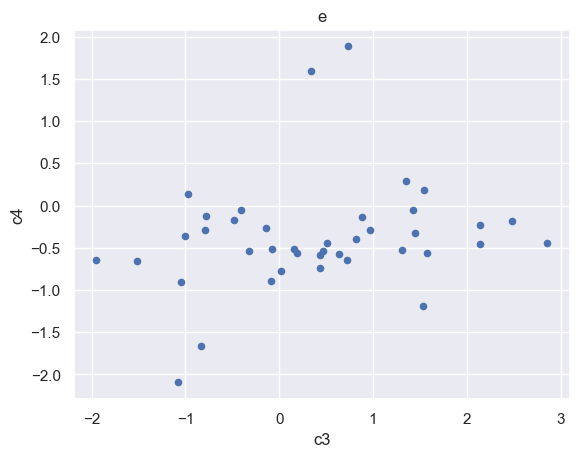

In [1388]:
projections = pca.transform(X_sc_samp)
grades = np.array(df.loc[id_code_samp, 'nutrition_grade_fr'])
scores = np.array(list(enumerate(grades)))
scoreidx = pd.DataFrame(scores, columns = ['i', 'score'])

# Création du tableau pour l'exemple
nutriscore = ['a', 'b', 'c', 'd', 'e']

# Boucle for pour parcourir le tableau
for s in nutriscore:
    projectionsdf = pd.DataFrame(projections, columns = ['c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9', 'c10', 'c11', 'c12'])
    scorefiltre = scoreidx.loc[scoreidx['score'] == s]
    idx = scorefiltre.index
    projectionsdf = projectionsdf.loc[idx]
    projectionsfiltre = projectionsdf.loc[(projectionsdf['c3'] <= 3) & (projectionsdf['c3'] >= -3) & (projectionsdf['c4'] >= -3) & (projectionsdf['c4'] <= 3), ['c3', 'c4']]
    projectionsfiltre.plot(x='c3', y='c4', kind='scatter')
    plt.title(s)
    plt.show()


,code,url,creator,created_t,created_datetime,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g


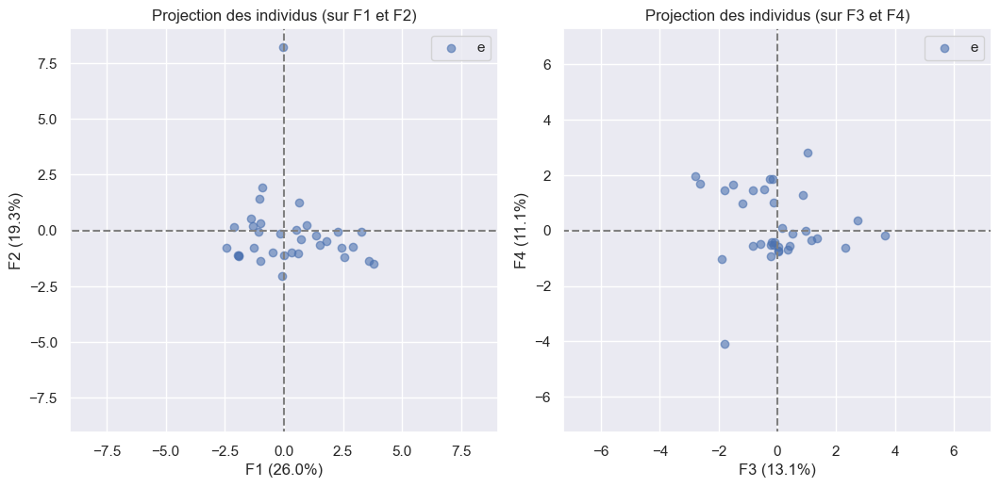

In [1273]:
n_comp = 4
# Sélection de 300 échantillons aléatoires
# id_code_samp = pd.Series(id_code).sample(500)
# illus_var_p = df.loc[id_code_samp, 'nutrition_grade_fr']
# illus_var_p = df.loc[id_code_samp['nutrition_grade_fr'] == 'a', 'nutrition_grade_fr']
illus_var_p = df.loc[(df.index.isin(id_code_samp)) & (df["nutrition_grade_fr"] == "e"), "nutrition_grade_fr"]
# print(illus_var_p)

# Filtrer les valeurs 'A' dans la série 'nutrition_grade_fr'
# filtre = (df.loc[id_code_samp, 'nutrition_grade_fr'] == 'A')
# illus_var_p = df.loc[id_code_samp, 'nutrition_grade_fr'][filtre]
# print (id_code_samp)
# # illus_var_p.head()


illus_var_p = illus_var_p[illus_var_p.apply(lambda x: isinstance(x, str))]
display_factorial_planes(pca.transform(X_sc_samp), n_comp, pca, [(0,1),(2,3),(4,5)],
                         n_cols=3, labels=np.array(id_code_samp),
                         illus_var= illus_var_p,
                         lab_on=False, alpha=0.6)

# plt.set_xlim([-5, 5])
# plt.set_xlim([-5, 5])
# # plt.ylim([-5,5])
# print(illus_var_p)
# print(df)
# plt.show()
# plt.figure(figsize = (10,2))
# sns.set(font_scale=1)
# sns.distplot(illus_var_p, bins=50)
# chaine = 'Distribution d individu'
# plt.title(chaine)


### Analyse des composantes
#### Composantes 1
Les variables quantitatives contre-corrélées à cette composantes sont le taux de graisses, de graisses saturées et l'apport calorique. 
Cette composante représente donc l'apport en graisse et l'apport en énergie. 

#### Composantes 2
Les variables quantitatives corrélées à cette composantes sont le taux de sel et de sodium. 
Cette composante représente donc l'apport en sel. 

#### Composantes 3
Les variables quantitatives corrélées à cette composantes sont le taux d'huile de palme et autres additifs. 
Cette composante représente donc les additifs. 

#### Composantes 4
Les variables quantitatives corrélées à cette composantes sont dans un sens le taux de graisses, de graisses saturées et dans l'autre sens, le taux de glucide et de sucre. 
Cette composante représente donc le côté sucré ou salé de l'aliment. 

### Analyse des nutriscores projetés sur les composantes principales
Les aliments se répartissent équitablement sur tous les axes, il n'y a pas de corrélation entre le nutriscore et les apports énergétiques, les taux de graisse, de sel ou de sucre.


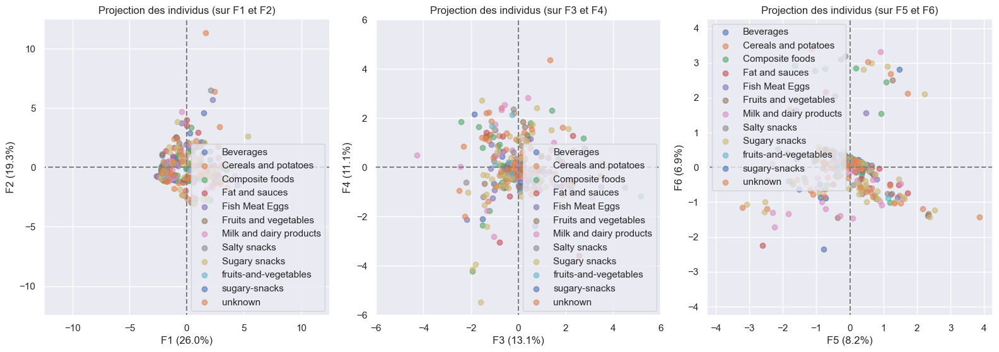

In [1224]:
illus_var_p = df.loc[id_code_samp, 'pnns_groups_1']
illus_var_p = illus_var_p[illus_var_p.apply(lambda x: isinstance(x, str))]
display_factorial_planes(pca.transform(X_sc_samp), n_comp, pca, [(0,1),(2,3),(4,5)],
                         n_cols=3, labels=np.array(id_code_samp),
                         illus_var= illus_var_p,
                         lab_on=False, alpha=0.6)

plt.show()

### 4.2 Regroupement ou Clustering
Les quatre premières CP (Composantes Principales) expliquent 73 % de la variance totale. Nous allons garder ces 4 et essayer de trouver des clusters.

In [1109]:
# KMeans Clustering
# Regroupement de KMeans
# Charger les données
df = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')
# --Sélection des caractéristiques et des index (dropna) pour l'ACP
numeric_cols =  [ 'additives_n', 'ingredients_from_palm_oil_n',
             'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
             'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
             'proteins_100g', 'salt_100g', 'sodium_100g']

# Nombre de clusters
n_clust = 5

# Création d'un objet KMeans avec 5 clusters et entraînement du modèle sur les données projetées X_proj
km = KMeans(n_clusters=n_clust).fit(X_proj)

# Attribution des labels de cluster pour chaque individu
clustK = km.labels_

# Ajout de la colonne 'cluster_Kmeans' dans le DataFrame df pour stocker les labels de cluster pour chaque individu
df.loc[id_code, 'cluster_Kmeans'] = clustK

# Suppression des individus qui n'ont pas de label de cluster dans le DataFrame df
df.dropna(subset=['cluster_Kmeans'], inplace=True)

# Suppression des valeurs manquantes dans les colonnes numériques du DataFrame df
df[numeric_cols].dropna()

# Affichage des labels de clusters uniques
df['cluster_Kmeans'].unique()


array([  1.00,   0.00,   4.00,   3.00,   2.00])

Ce code effectue un clustering KMeans sur un ensemble de données numériques et assigne chaque observation à un cluster. Cela permet de regrouper des observations similaires ensemble en fonction de leurs caractéristiques numériques.

La variable n_clust définit le nombre de clusters souhaité pour l'algorithme de clustering KMeans. Ensuite, la méthode KMeans.fit() est utilisée pour ajuster le modèle KMeans à nos données projetées X_proj. La variable clustK contient les étiquettes de cluster prédites pour chaque observation de X_proj.

En tirant des conclusions sur la taille et la composition de chaque cluster, il est possible d'identifier des groupes de données similaires qui peuvent aider à comprendre les relations et les tendances sous-jacentes dans les données. Cela peut aider à prendre des décisions éclairées et à formuler des stratégies de manière plus efficace en fonction des caractéristiques communes des différents groupes.

In [1110]:
## KMeans Clustering

n_clust = 5
km = KMeans(n_clusters=n_clust).fit(X_proj)
clustK = km.labels_
df.loc[id_code, 'cluster_Kmeans'] = clustK

In [1111]:
pca_cols = ['additives_n', 'ingredients_from_palm_oil_n',
            'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
            'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
            'proteins_100g', 'salt_100g', 'sodium_100g']

# Filtrer les lignes contenant des valeurs manquantes dans les colonnes d'intérêt
cols = pca_cols + ['cluster_Kmeans']
df_filtered = df[cols].dropna()

# Calculer la matrice de corrélation PPS
pps_corr = pps.matrix(df_filtered).round(2)

# Arrondir les valeurs de la matrice de corrélation à 2 décimales
pps_corr = pps_corr.round(2)

# Afficher le graphique PPS
pps.matrix(df_filtered).pivot(columns='x', index='y', values='ppscore').style.background_gradient(cmap='coolwarm')

# # # Création du DataFrame nettoyé
# df_cleaned = df.dropna(subset=pca_cols, how='any')
# df_cleaned[cols] = df_cleaned[cols].applymap(lambda x: round(x, 2))

# # Calcul de la matrice de ppscore
# pps_corr = pps.matrix(df_cleaned[cols])

# # # Affichage du graphique
# sns.heatmap(pps_corr, cmap='Blues', annot=True)
# plt.title('Sampled Predictive Power Score (ppscore)')
# plt.show()


x,additives_n,carbohydrates_100g,cluster_Kmeans,energy_100g,fat_100g,fiber_100g,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,proteins_100g,salt_100g,saturated-fat_100g,sodium_100g,sugars_100g
y,,,,,,,,,,,,,
additives_n,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.011130,0.000000,0.000000,0.000000,0.000000,0.000000
carbohydrates_100g,0.000000,1.000000,0.525407,0.467521,0.043300,0.175935,0.008837,0.000000,0.209788,0.000000,0.015577,0.000000,0.275662
cluster_Kmeans,0.000000,0.000000,1.000000,0.051762,0.000000,0.000000,0.319067,0.000000,0.000000,0.000000,0.058223,0.000000,0.000000
energy_100g,0.000000,0.428766,0.559102,1.000000,0.409634,0.163270,0.058156,0.006313,0.242247,0.001054,0.302288,0.004191,0.195991
fat_100g,0.000000,0.038824,0.334189,0.518440,1.000000,0.000000,0.000000,0.000000,0.033452,0.000000,0.494962,0.000000,0.000323
fiber_100g,0.000000,0.032040,0.062286,0.000000,0.000000,1.000000,0.000000,0.000000,0.069446,0.000000,0.000000,0.000000,0.000000
ingredients_from_palm_oil_n,0.000000,0.000000,0.942258,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
ingredients_that_may_be_from_palm_oil_n,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
proteins_100g,0.000000,0.092964,0.039619,0.082915,0.146745,0.024460,0.000000,0.000000,1.000000,0.043129,0.109290,0.042817,0.016273


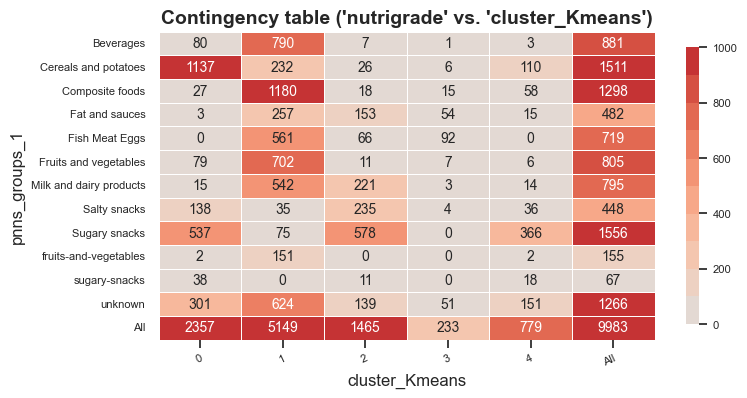

In [1112]:
## Creating table of contingency

data_crosstab = pd.crosstab(df['pnns_groups_1'], 
                            df['cluster_Kmeans'],  
                               margins = True)

plot_heatmap(data_crosstab,"Contingency table ('nutrigrade' vs. 'cluster_Kmeans')",
             vmin=0, vmax=1000, palette=sns.color_palette("coolwarm", 20),
             figsize=(8,4), shape='rect', fmt='.0f')
plt.show()

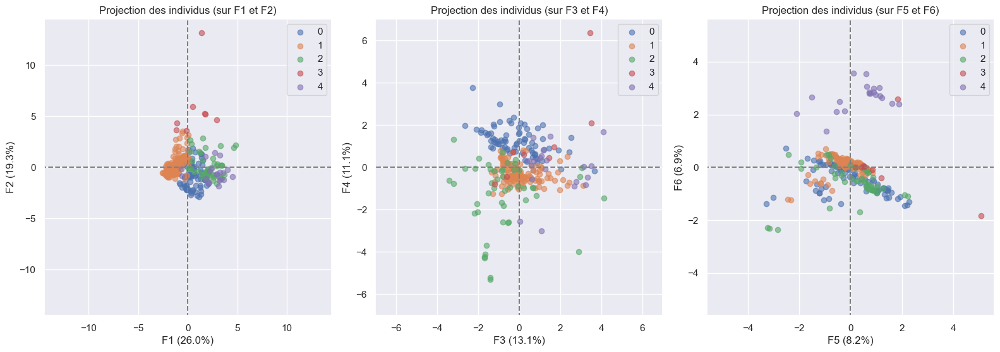

In [1113]:
display_factorial_planes(pca.transform(X_sc_samp), n_comp, pca, [(0,1),(2,3),(4,5)],
                         n_cols=3, labels=np.array(id_code_samp),
                         illus_var= df.loc[id_code_samp, 'cluster_Kmeans'],
                         lab_on=False, alpha=0.6)

plt.show()

---Chi-squared
stat=8161.618, p=0.000
Probably dependent


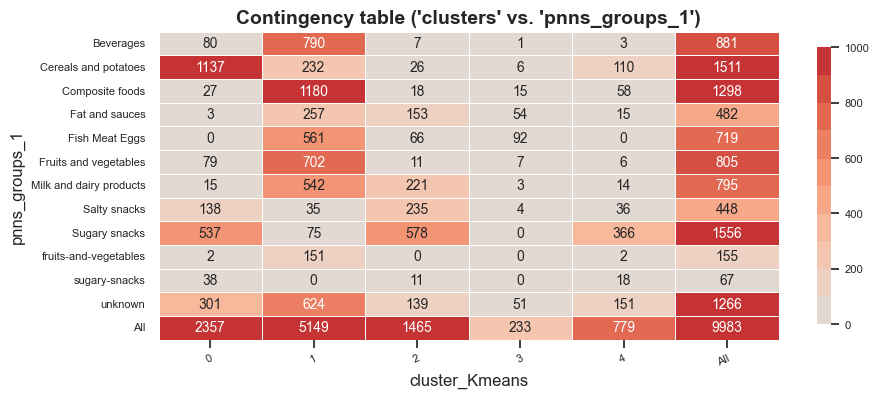

In [1114]:
# Importer la bibliothèque Pandas et la fonction crosstab de Pandas pour créer une table de contingence
import pandas as pd
from pandas.api.types import CategoricalDtype

# --Sélection des caractéristiques et des index (dropna) pour l'ACP
pca_cols =  [ 'additives_n', 'ingredients_from_palm_oil_n',
             'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
             'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
             'proteins_100g', 'salt_100g', 'sodium_100g']


# Créer une table de contingence qui croise les catégories 'pnns_groups_1' et 'cluster_Kmeans'
data_crosstab = pd.crosstab(df['pnns_groups_1'], df['cluster_Kmeans'], margins=True)

# Importer la bibliothèque SciPy et la fonction chi2_contingency pour effectuer le test du chi2
from scipy.stats import chi2_contingency
stat, p, dof, expected = chi2_contingency(data_crosstab)

# Imprimer les résultats du test du chi2
print('---'+"Chi-squared")
print('stat=%.3f, p=%.3f' % (stat, p))
print('Probably independent') if p > 0.05 else print('Probably dependent')

# Définir une liste de noms de colonnes à utiliser dans la matrice des composantes principales
# pca_cols = df[numeric_cols].columns.tolist() + ['PC12']

# Créer une DataFrame à partir de la matrice des composantes principales obtenue par la fonction PCA
# Ici, on transpose la matrice obtenue par pca.components_ pour avoir la forme correcte de la matrice des composantes principales
pca_df = pd.DataFrame(pca.components_.T, columns=pca_cols)

# Créer un heatmap pour visualiser la table de contingence
plot_heatmap(data_crosstab,"Contingency table ('clusters' vs. 'pnns_groups_1')",
             vmin=0, vmax=1000,figsize=(10,4),shape='rect', fmt='.0f',
             palette=sns.color_palette("coolwarm", 20))

# Afficher le heatmap
plt.show()


# QUESTION 4

**Élaborer une idée d’application. Identifier des arguments justifiant la faisabilité (ou non) de l’application à partir des données Open Food Facts.**

Idées : 
* Identifier les caractéristiques nutritionnelles des produits mauvais nutriscores et étiqueter automatiquement les produits qui ont des caractéristiques similaires
* **Calcul automatique de nutriscore**
* Vérifier si le nombre d'additifs est lié au nutriscore / mettre un indicateur sur le nombre d'additifs

## Calcul automatique de nutri score par régression linéaire

In [1115]:
data.head(1)

,code,url,creator,created_t,created_datetime,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g


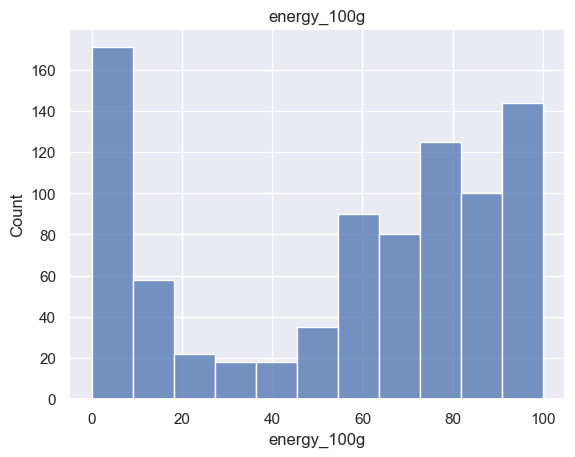

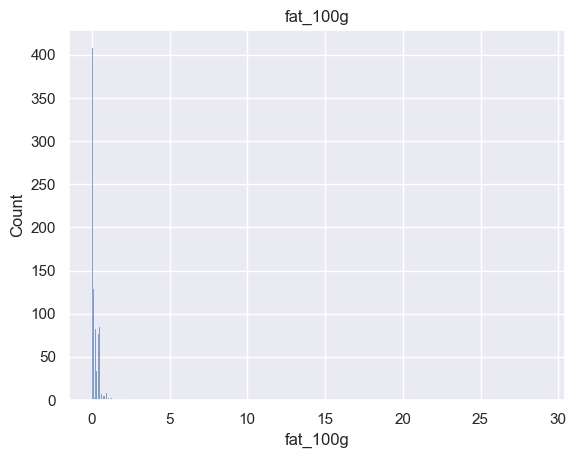

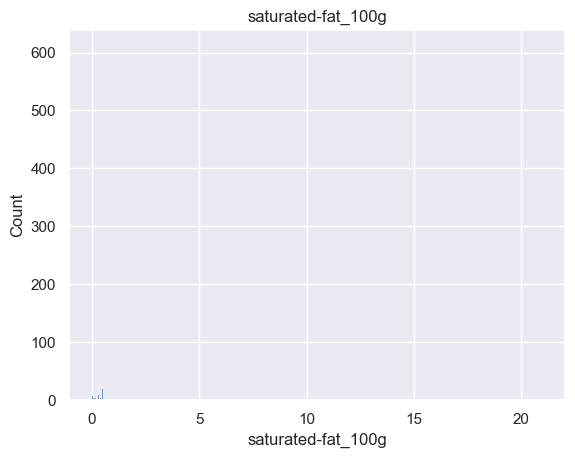

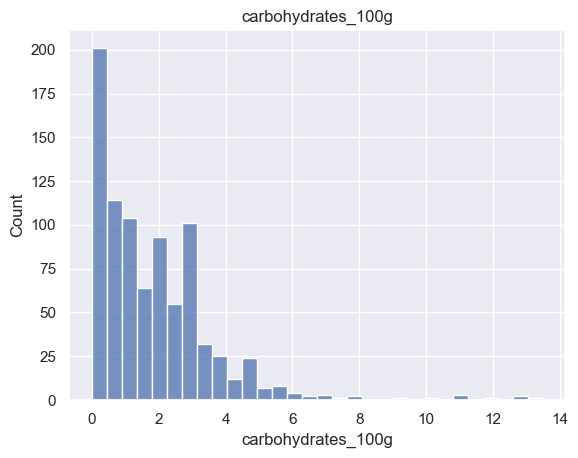

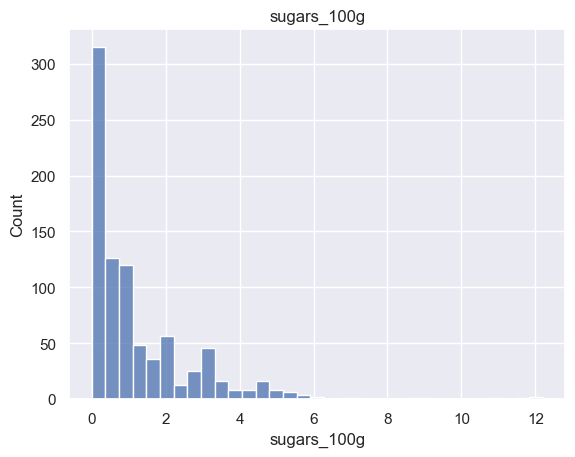

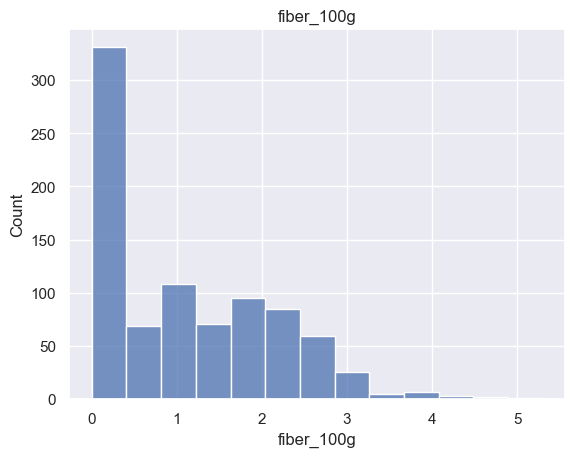

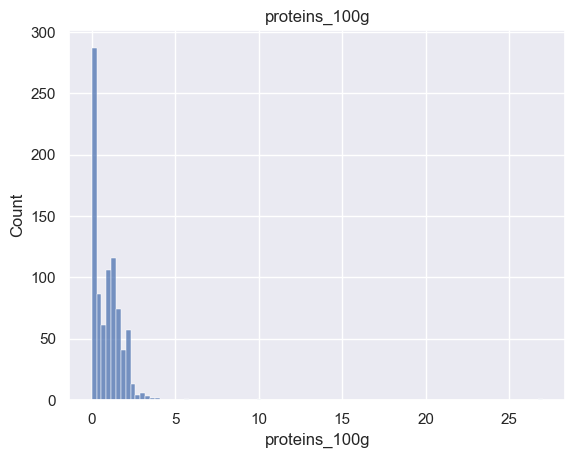

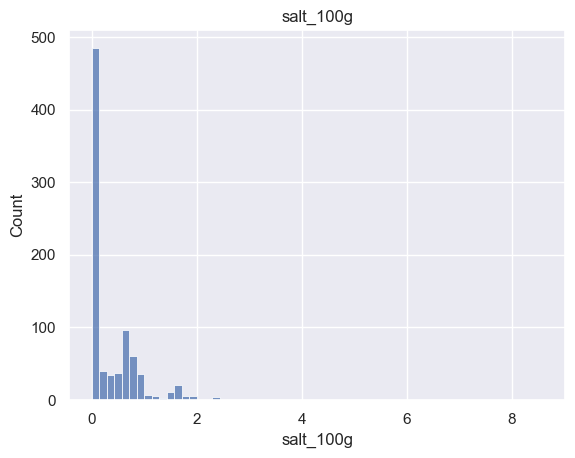

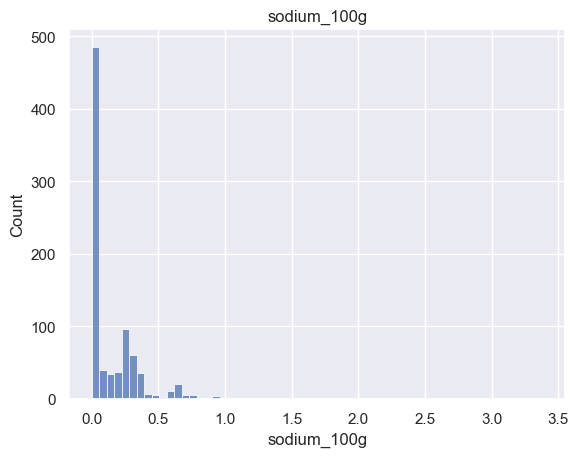

In [1116]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Charger les données
data = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')

# Variables pertinentes
variables = ["product_name", "categories_fr", "ingredients_text", "energy_100g", "fat_100g", "saturated-fat_100g",
             "carbohydrates_100g", "sugars_100g", "fiber_100g", "proteins_100g", "salt_100g", "sodium_100g",'nutrition_grade_fr']

# Filtrer les données
filtered_data = data[variables]

# Traiter les valeurs manquantes
filtered_data = filtered_data.dropna()

# Traiter les valeurs aberrantes
for col in filtered_data.columns:
    if col.endswith("_100g"):
        filtered_data = filtered_data[filtered_data[col] >= 0]
        filtered_data = filtered_data[filtered_data[col] <= 100]

# Calcul du Nutri-Score
def compute_nutriscore(row):
    # Calcul des points selon les règles officielles du Nutri-Score 
    score = 0
    energy_points = 0
    saturated_fat_points = 0
    sugars_points = 0
    sodium_points = 0
    fiber_points = 0
    proteins_points = 0
    
    # Points pour l'énergie
    if row["energy_100g"] <= 335:
        energy_points = 0
    elif row["energy_100g"] <= 670:
        energy_points = 1
    elif row["energy_100g"] <= 1005:
        energy_points = 2
    elif row["energy_100g"] <= 1340:
        energy_points = 3
    elif row["energy_100g"] <= 1675:
        energy_points = 4
    else:
        energy_points = 5
        
    # Points pour les acides gras saturés
    if row["saturated-fat_100g"] <= 1:
        saturated_fat_points = 0
    elif row["saturated-fat_100g"] <= 2:
        saturated_fat_points = 1
    elif row["saturated-fat_100g"] <= 3:
        saturated_fat_points = 2
    elif row["saturated-fat_100g"] <= 4:
        saturated_fat_points = 3
    elif row["saturated-fat_100g"] <= 5:
        saturated_fat_points = 4
    else:
        saturated_fat_points = 5
    
    # Points pour les sucres
    if row["sugars_100g"] <= 4.5:
        sugars_points = 0
    elif row["sugars_100g"] <= 9:
        sugars_points = 1
    elif row["sugars_100g"] <= 13.5:
        sugars_points = 2
    elif row["sugars_100g"] <= 18:
        sugars_points = 3
    elif row["sugars_100g"] <= 22.5:
        sugars_points = 4
    else:
        sugars_points = 5
    
    # Points pour le sodium ou sel
    if row["sodium_100g"] <= 90:
        sodium_points = 0
    elif row["sodium_100g"] <= 180:
        sodium_points = 1
    elif row["sodium_100g"] <= 270:
        sodium_points = 2
    elif row["sodium_100g"] <= 360:
        sodium_points = 3
    elif row["sodium_100g"] <= 450:
        sodium_points = 4
    else:
        sodium_points = 5
        
    # Points pour les fibres
    if row["fiber_100g"] >= 3:
        fiber_points = 1
        
    # Points pour les protéines
    if row["proteins_100g"] >= 1.6:
        proteins_points = 0.5 * np.floor((row["proteins_100g"] - 1.6) / 0.8)
        
    # Score final
    score = energy_points + saturated_fat_points + sugars_points + sodium_points - fiber_points - proteins_points
    
    if score <= -1:
        return "A"
    elif score <= 2:
        return "B"
    elif score <= 10:
        return "C"
    elif score <= 18:
        return "D"
    else:
        return "E"

filtered_data["nutriscore_f"] = filtered_data.apply(compute_nutriscore, axis=1)

# Visualisations univariées
for col in filtered_data.columns:
    if col.endswith("_100g"):
        plt.figure()
        sns.histplot(data=filtered_data, x=col)
        plt.title(col)
        plt.show()

# Sauvegarder le résultat
filtered_data.to_csv("nutriscore_data_v3.csv", index=False)

### Random Forest Regressor

Le modèle par régression linéaire ne semble pas donner de bons résultats. Essayons un modèle non linéaire (modèle d'ensemble : Random Forest)

In [1120]:
data_reg = df[df['nutrition-score-fr_100g'].isna() == False].select_dtypes(['int32','float64'])

In [1121]:
data_reg = data_reg.drop(['fiber_100g','additives_n'], axis=1).dropna(axis=0)

In [1122]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler


X = data_reg.copy()
y = X['nutrition-score-fr_100g']
X = X.drop(['nutrition-score-fr_100g'],axis=1)


scaler = StandardScaler()
X = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state=42)


In [1123]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

params = {
    'n_estimators': [50],
    'verbose' : [1]
}

rfr = GridSearchCV(RandomForestRegressor(), params, cv = 5)

In [1124]:
rfr.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'n_estimators': [50], 'verbose': [1]})

In [1125]:
rfr.best_estimator_

RandomForestRegressor(n_estimators=50, verbose=1)

In [1126]:

print('R² sur jeu d\'entraînement : ', rfr.best_estimator_.score(X_train,y_train))
print('R² sur jeu de test', rfr.best_estimator_.score(X_test,y_test))


R² sur jeu d'entraînement :  0.9878418222742192
R² sur jeu de test 0.9230589874863587


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.0s finished


In [1128]:
from sklearn.metrics import mean_squared_error
from math import sqrt
print('RMSE = ', sqrt(mean_squared_error(y_test, rfr.best_estimator_.predict(X_test))))

RMSE =  2.068881273368595


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.0s finished


In [1131]:
lr = LinearRegression().fit(X_train, y_train)
print('R² sur jeu d\'entraînement : ', lr.score(X_train,y_train))
print('R² sur jeu de test', lr.score(X_test,y_test))
print('Poids de chaque variable dans la régression', lr.coef_)
print('ordonnée à l\'origine', lr.intercept_)


R² sur jeu d'entraînement :  0.6982182138233837
R² sur jeu de test 0.6851852260593368
Poids de chaque variable dans la régression [ -0.55   0.33   0.57   0.81   2.94   0.44   3.22   0.13 -390.88  392.58
   0.13   1.45]
ordonnée à l'origine 9.950045293873925


In [1132]:
resultat = pd.DataFrame({'nutriscore_reel' : y_test, 'prediction' : lr.predict(X_test)}).reset_index()

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.0s finished


(-1.4000000000000001, 29.4, -1.739441621947104, 36.52827406088918)

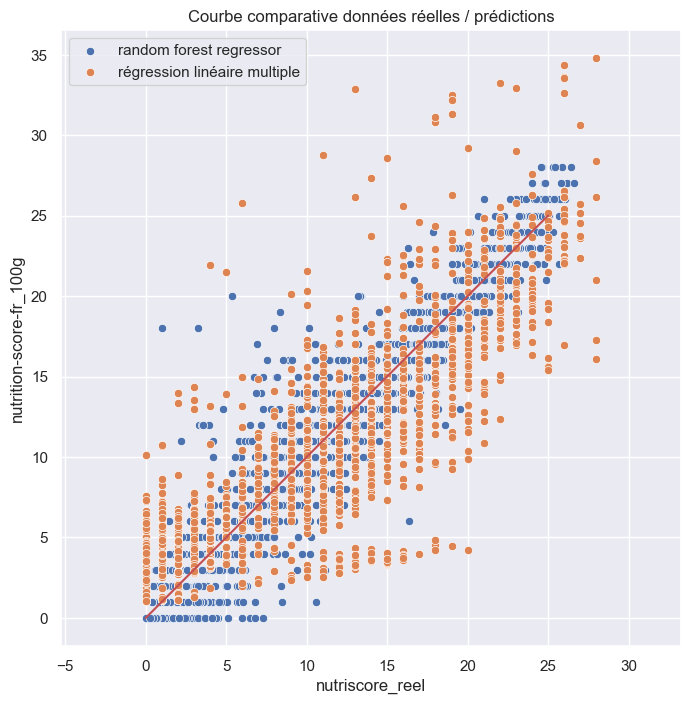

In [1133]:

plt.figure(figsize=(8,8))
plt.title('Courbe comparative données réelles / prédictions')
sns.scatterplot(x = rfr.predict(X_test),y = y_test)
sns.scatterplot(x = resultat['nutriscore_reel'], y = resultat['prediction'])
plt.legend(['random forest regressor', 'régression linéaire multiple'])
sns.lineplot([0,25],[0,25], color='r')
ax = plt.gca()
ax.set_xlim(0,25)
ax.set_ylim(0,25)
ax.axis('equal')

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.0s finished


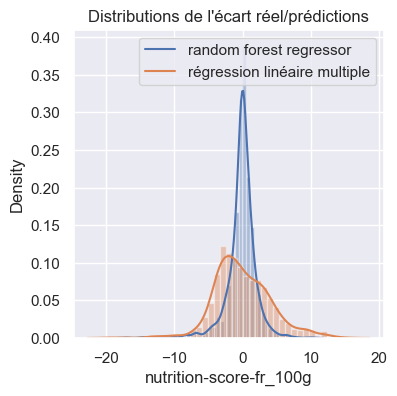

In [1134]:
plt.figure(figsize=(4,4))
plt.title('Distributions de l\'écart réel/prédictions')
sns.distplot(rfr.predict(X_test) -  y_test)
sns.distplot(resultat['nutriscore_reel'] - resultat['prediction'])
plt.legend(['random forest regressor', 'régression linéaire multiple'])

In [1136]:
rfr.best_estimator_.feature_importances_

array([  0.00,   0.00,   0.10,   0.02,   0.58,   0.02,   0.12,   0.04,
         0.05,   0.06,   0.01,   0.00])

In [1137]:
random_forest_features = pd.DataFrame({'feature' : data_reg.drop(['nutrition-score-fr_100g'],axis=1).columns,
                                      'importance' : rfr.best_estimator_.feature_importances_})

In [1138]:
random_forest_features.sort_values(by='importance',ascending=False, inplace=True)

<Axes: title={'center': 'Importance des variables dans le random forest'}, xlabel='importance', ylabel='feature'>

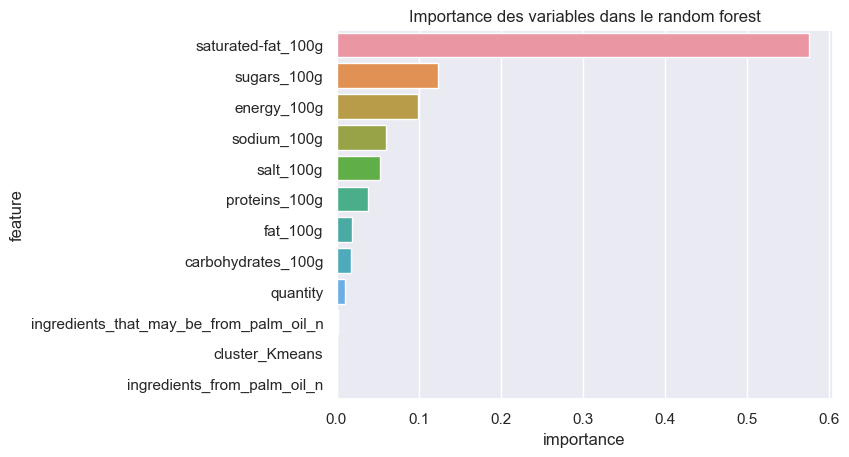

In [1139]:
plt.title('Importance des variables dans le random forest')

sns.barplot(y = random_forest_features['feature'], x=random_forest_features['importance'])

Graphiquement, on observe assez nettement que le random forest décrit mieux la variance du jeu de données que le modèle par régression linéaire multiple :
* écart quasi nul pour une partie plus importante des données, 
* pour les écarts plus important, la porportion est plus faible que pour la régression linéaire.

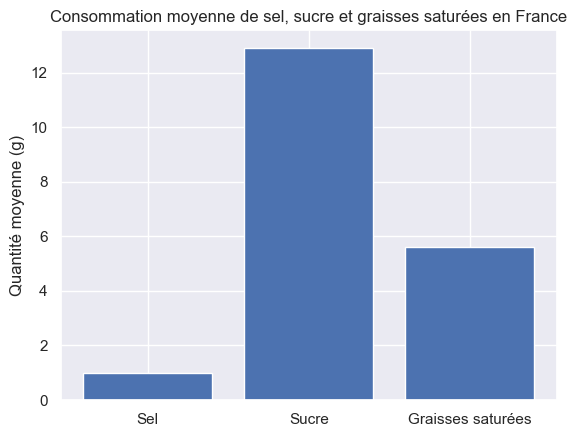

In [1140]:
import pandas as pd
import matplotlib.pyplot as plt

# Charger les données
df = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')

# Nettoyer les données
df = df.dropna(subset=["salt_100g", "sugars_100g", "saturated-fat_100g"])
df = df[df["salt_100g"] > 0]
df = df[df["sugars_100g"] > 0]
df = df[df["saturated-fat_100g"] > 0]

# Calculer la quantité moyenne de sel, de sucre et de graisses saturées
mean_salt = df["salt_100g"].mean()
mean_sugar = df["sugars_100g"].mean()
mean_sat_fat = df["saturated-fat_100g"].mean()

# Créer le graphique
labels = ["Sel", "Sucre", "Graisses saturées"]
values = [mean_salt, mean_sugar, mean_sat_fat]
plt.bar(labels, values)
plt.ylabel("Quantité moyenne (g)")
plt.title("Consommation moyenne de sel, sucre et graisses saturées en France")
plt.show()


# QUESTION 5

**Rédiger un rapport d’exploration et pitcher votre idée durant la soutenance du projet.** : voir support de présentation